In [1]:
import pandas as pd
import numpy as np
from statsmodels.robust import mad
import math
import datetime
# import ydata_profiling as ydp
import json
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import re
warnings.filterwarnings('ignore')

In [2]:
file_path = "C:\\Users\\MuditKanodia\\Desktop\\TWC\Marketing Mix Modeling-selected\\data\\"

In [3]:
# from ADS_Code.ADS_06_02_24_v6 import get_model_date
# from ADS_Code.ADS_13_02_24_1 import get_model_date
from ADS_Code.ADS_14_02_24 import get_model_data
from ADS_Code.ADS_18_03_24 import get_model_data

In [4]:
# from ADS_Code.ADS_13_03_24_for_chart_analysis import get_model_data

In [5]:
df_ads = get_model_data(file_path)

Product Visits (1095, 12) 01-01-2021 31-12-2023 1094 days 00:00:00
Partner Visits (805, 2) 02-08-2021 15-10-2023 804 days 00:00:00
ADS (1095, 13) 01-01-2021 31-12-2023 1094 days 00:00:00
Organic Search (562, 5) 18-06-2022 31-12-2023 561 days 00:00:00
ADS (1095, 17) 01-01-2021 31-12-2023 1094 days 00:00:00
SEO Clicks (Organic) (806, 2) 02-08-2021 16-10-2023 805 days 00:00:00
ADS (1095, 18) 01-01-2021 31-12-2023 1094 days 00:00:00
Pricing (852, 4) 01-09-2021 31-12-2023 851 days 00:00:00
ADS (1095, 21) 01-01-2021 31-12-2023 1094 days 00:00:00
Media Spend Impression (852, 39) 01-09-2021 31-12-2023 851 days 00:00:00
ADS (1095, 59) 01-01-2021 31-12-2023 1094 days 00:00:00
Brand Media Spend Impression (US Brand Basis) (451, 3) 01-03-2021 31-12-2023 1035 days 00:00:00
ADS (1095, 61) 01-01-2021 31-12-2023 1094 days 00:00:00
Brand Measure (1095, 14) 01-01-2021 31-12-2023 1094 days 00:00:00
ADS (1095, 74) 01-01-2021 31-12-2023 1094 days 00:00:00
Social Engagement (1478, 19) 01-01-2020 25-01-2024 

In [6]:
# df_ads.to_csv(file_path+"Final_merged_data_13_03_24_for_chart_analysis.csv", index=False)
df_ads.to_csv(file_path+"Final_merged_data_18_03_24.csv", index=False)

In [7]:
df_ads_copy_v2 = df_ads.copy()

In [3]:
# df_ads = pd.read_csv(file_path+"Final_merged_data_14_02_24.csv")
df_ads = pd.read_csv(file_path+"Final_merged_data_18_03_24.csv")
# df_ads = pd.read_csv(file_path+"Final_merged_data_13_03_24_for_chart_analysis.csv")

In [4]:
df_ads.columns

Index(['Date', 'Apps_TWC Universal Android 4G+_Visits',
       'Apps_TWC Universal Android 4G+_Goal',
       'Apps_TWC Universal iOS 4G+_Visits', 'Apps_TWC Universal iOS 4G+_Goal',
       'MobileWeb_TWC Mobile Web_Visits', 'MobileWeb_TWC Mobile Web_Goal',
       'Web_TWC Web_Visits', 'Web_TWC Web_Goal', 'Overall_Product_Visits',
       'Overall_Product_Goal', 'US Weather Impact Rating',
       'Partner_Visits_Overall_(Desktop&Mobile)',
       'OrganicSearch_Google_Clicks', 'OrganicSearch_Google_Impressions',
       'OrganicSearch_Google_CTR', 'OrganicSearch_Google_Position',
       'SEO_Clicks_OrganicSearch_Desktop_MobileWeb(Combined)',
       'Pricing_Android_Installs', 'Pricing_iOS_Installs',
       'Pricing_Total_Installs', 'SEM_Google_Spend', 'SEM_Google_Clicks',
       'SEM_Google_Impressions', 'Preload_IronSource_Aura_Spend',
       'Preload_IronSource_Aura_launches',
       'Preload_IronSource_Aura_impressions',
       'Preload_IronSource_Aura_app_downloads', 'Programmatic_Bidea

In [7]:
# # df_temp = pd.read_csv(file_path+"Final_merged_data.csv")
# df_temp = pd.read_csv(file_path+"Final_merged_data_13_02_24.csv")

In [8]:
# df_ads = df_ads.drop('Programmatic_Tapjoy_Android_Clicks', axis=1)

In [9]:
# df_ads_ = pd.read_csv(file_path+"Final_merged_data_13_02_24.csv")

In [10]:
# df_ads_.columns

In [11]:
# columns_equal = df_temp.equals(df_ads)
# columns_equal = (df_temp.columns == df_ads.columns).all()

In [12]:
# comparison = df_temp.equals(df_ads)

In [13]:
# comparison = df_temp.values == df_ads.values

In [5]:
df_ads.columns

Index(['Date', 'Apps_TWC Universal Android 4G+_Visits',
       'Apps_TWC Universal Android 4G+_Goal',
       'Apps_TWC Universal iOS 4G+_Visits', 'Apps_TWC Universal iOS 4G+_Goal',
       'MobileWeb_TWC Mobile Web_Visits', 'MobileWeb_TWC Mobile Web_Goal',
       'Web_TWC Web_Visits', 'Web_TWC Web_Goal', 'Overall_Product_Visits',
       'Overall_Product_Goal', 'US Weather Impact Rating',
       'Partner_Visits_Overall_(Desktop&Mobile)',
       'OrganicSearch_Google_Clicks', 'OrganicSearch_Google_Impressions',
       'OrganicSearch_Google_CTR', 'OrganicSearch_Google_Position',
       'SEO_Clicks_OrganicSearch_Desktop_MobileWeb(Combined)',
       'Pricing_Android_Installs', 'Pricing_iOS_Installs',
       'Pricing_Total_Installs', 'SEM_Google_Spend', 'SEM_Google_Clicks',
       'SEM_Google_Impressions', 'Preload_IronSource_Aura_Spend',
       'Preload_IronSource_Aura_launches',
       'Preload_IronSource_Aura_impressions',
       'Preload_IronSource_Aura_app_downloads', 'Programmatic_Bidea

In [6]:
len(df_ads.columns)

96

In [6]:
# # Comparing the datasets
# for col in df_ads.columns:
#     if col in ['Date', 'EventsCamp/Vend_Campaign_Flag',
#        'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag',
#        'Event_Name']:
#         continue
#     if df_ads[col].isna().sum()==852:
#         print(col, " ************** NAN")
#         continue
#     check = (df_ads[col].fillna(0).astype('int').values == df_temp[col].fillna(0).astype('int').values).all()
#     if check == False:
#         check = "@@@@@@@ False"
#     print(col, check)

In [5]:
# df_temp.columns

In [6]:
# df_ads.columns

In [7]:
# set(df_ads.columns)-set(df_temp.columns)

In [8]:
# set(df_temp.columns)-set(df_ads.columns)

In [9]:
# import datetime
# current_date = str(datetime.datetime.now().date().strftime('%d%m%y')) + "_" + str(datetime.datetime.now().time().strftime('%H%M%S'))
# current_date

In [7]:
from ADS_Code.Summary_metrics_07_02_24_v5 import check_data

In [8]:
missing_dates = check_data(df_ads, 'Date')

No. of Unique Dates:  852
Data in terms of years:  2.334246575342466
Min. Date:  01-09-2021 , Max. Date:  31-12-2023
Continuity Check for Data: {'Date': True}
Missing Dates: DatetimeIndex([], dtype='datetime64[ns]', freq=None)


In [21]:
from ADS_Code.Summary_metrics_07_02_24_v5 import dataset_stats

In [11]:
df_ads_v2 = df_ads.copy()
# df_ads_v2 = df_ads_v3.copy()
df_ads_v2['US Weather Impact Rating'] = df_ads_v2['US Weather Impact Rating'].astype('float')
# df_result = dataset_stats(df_ads_v4_2, 'Date')

In [23]:
df_result.head(15)

,Datatype,Num_of_Datapoints,Distinct,Distinct_%,Missing_Counts,Missing_Counts_%,Zero_Counts,Zero_Counts_%,Negative_Counts,Negative_Counts_%,...,Maximum,IQR,Standard Deviation,Coefficient of variation (CV),Kurtosis,Median Absolute Deviation (MAD),Skewness,Sum,Variance,Outlier_%
Date,datetime64[ns],852,852,100.0,0,0.0,NaN,NaN,NaN,NaN,...,2023-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Overall_Product_Visits,float64,852,852,100.0,0,0.0,0.0,0.0,0.0,0.0,...,107366910.0,14545372.25,11145801.32,0.23,2.62,10638041.57,1.14,40754084294.0,124228886994158.0,0.94
US Weather Impact Rating,float64,852,11,1.29,0,0.0,0.0,0.0,0.0,0.0,...,4.0,0.25,0.43,0.28,8.73,0.37,2.57,1306.0,0.0,2.11
OrganicSearch_Google_Clicks,float64,852,852,100.0,0,0.0,0.0,0.0,0.0,0.0,...,6157803.0,595017.75,562507.35,0.34,9.33,436559.64,2.07,1407581134.0,316414516414.0,1.64
OrganicSearch_Google_Impressions,float64,852,852,100.0,0,0.0,0.0,0.0,0.0,0.0,...,45293180.0,5416467.75,4575983.24,0.28,3.88,4058290.73,1.09,14105292788.0,20939622626053.0,1.17
OrganicSearch_Google_Position,float64,852,101,11.85,0,0.0,0.0,0.0,0.0,0.0,...,4.78,0.13,0.17,0.04,3.01,0.09,0.15,3347.0,0.0,1.53
Pricing_Android_Installs,float64,852,834,97.89,0,0.0,0.0,0.0,0.0,0.0,...,70151.0,7590.5,6481.81,0.26,6.02,5538.26,1.57,21492445.0,42013808.0,1.29
Pricing_iOS_Installs,float64,852,824,96.71,0,0.0,0.0,0.0,0.0,0.0,...,60809.0,12732.0,8650.51,0.91,3.08,7079.43,1.4,8101021.0,74831311.0,1.29
Pricing_Total_Installs,float64,852,834,97.89,0,0.0,0.0,0.0,0.0,0.0,...,121027.0,17563.5,13671.77,0.39,5.16,13200.35,1.58,29593466.0,186917379.0,1.53
SEM_Google_Spend,float64,852,852,100.0,0,0.0,0.0,0.0,0.0,0.0,...,19919.4,2366.3,2414.89,0.68,6.18,1718.96,2.03,3020750.0,5831713.0,2.46


In [24]:
# df_result.to_csv(file_path+"Final_merged_data_statistics_aggregated_14_02_24.csv", index=True)
# df_result.to_csv(file_path+"Final_merged_data_statistics_aggregated_29_02_24_v2.csv", index=True)
df_result.to_csv(file_path+"pre_processed_data_statistics_18_03_24.csv", index=True)

In [25]:
# from ADS_Code.pandas_profiling_EDA_07_02_24 import explorer
# from ADS_Code.pandas_profiling_EDA_14_02_24 import explorer
from ADS_Code.pandas_profiling_EDA_28_02_24_v4 import explorer

In [29]:
df_ads_v4_2_1 = df_ads_v4_2.copy()
df_ads_v4_2_1 = df_ads_v4_2_1[['Date', 'Overall_Product_Visits', 'US Weather Impact Rating',
       'OrganicSearch_Google_Clicks', 'OrganicSearch_Google_Impressions',
       'OrganicSearch_Google_Position', 'Pricing_Android_Installs',
       'Pricing_iOS_Installs', 'Pricing_Total_Installs', 'SEM_Google_Spend',
       'SEM_Google_Clicks', 'SEM_Google_Impressions',
       'Preload_IronSource_Aura_Spend', 'Preload_IronSource_Aura_launches',
       'Preload_IronSource_Aura_impressions',
       'Preload_IronSource_Aura_app_downloads', 'Programmatic_Bidease_Spend',
       'Programmatic_Bidease_Clicks', 'Programmatic_Bidease_Impressions',
       'Preload_Digital_Turbine_Spend', 'Preload_Digital_Turbine_launches',
       'Preload_Digital_Turbine_app_downloads', 'Programmatic_Tapjoy_Spend',
       'Programmatic_Tapjoy_Clicks', 'SEM_Apple_Search_Ads_Spend',
       'SEM_Apple_Search_Ads_Clicks', 'SEM_Apple_Search_Ads_Impressions',
       'Programmatic_LiftOff_Spend', 'Programmatic_LiftOff_Clicks',
       'Programmatic_LiftOff_Impressions',
       'Programmatic_IronSource_Sonic_Spend',
       'Programmatic_IronSource_Sonic_Clicks',
       'Programmatic_IronSource_Sonic_Impressions', 'PaidSocial_Twitter_Spend',
       'PaidSocial_Twitter_Clicks', 'PaidSocial_Twitter_Impressions',
       'Programmatic_TikTok_Spend', 'Programmatic_TikTok_Clicks',
       'Programmatic_TikTok_Impressions',
                          'Twitter_TikTok_Combined_Spend',
       'Twitter_TikTok_Combined_Clicks',
       'Twitter_TikTok_Combined_Impressions', 
                               'PaidSocial_Vibe_Spend',
       'PaidSocial_Vibe_Impressions', 'Programmatic_Persona.ly_Spend',
       'Programmatic_Persona.ly_Clicks', 'Programmatic_Persona.ly_Impressions',
       'Brand_Impressions', 'Brand_Spend', 'Net Favorability', 'Net Trust',
       'Realibality', 'Accuracy', 'NPS', 'Usage', 'Preference',
       'Seen as experts', 'Positive impact on community',
       'Positive impact on well being', 'SocialEng_Facebook_Impressions',
       'SocialEng_Facebook_Total_Engagements',
       'SocialEng_Facebook_Estimated_Clicks', 'SocialEng_LinkedIn_Impressions',
       'SocialEng_LinkedIn_Total_Engagements',
       'SocialEng_LinkedIn_Estimated_Clicks', 'SocialEng_YouTube_Impressions',
       'SocialEng_YouTube_Total_Engagements',
       'SocialEng_YouTube_Estimated_Clicks', 'SocialEng_Instagram_Impressions',
       'SocialEng_Instagram_Total_Engagements',
       'SocialEng_Instagram_Estimated_Clicks', 'SocialEng_Twitter_Impressions',
       'SocialEng_Twitter_Total_Engagements',
       'SocialEng_Twitter_Estimated_Clicks', 'SocialEng_TikTok_Impressions',
       'SocialEng_TikTok_Total_Engagements', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag',
       'Event_Name']]
df_ads_v4_2_1['EventsCamp/Vend_Campaign/Vendor(s)'] = df_ads_v4_2_1['EventsCamp/Vend_Campaign/Vendor(s)'].astype(str)
df_ads_v4_2_1['Event_Name'] = df_ads_v4_2_1['Event_Name'].astype(str)

In [30]:
eo = explorer(df_ads_v4_2_1)
# user_selection = eo.onSubmit_selection()
eo.date = "Date"
eo.date_check()
eo.execute(file_path)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
# np.median(df_ads[df_ads['OrganicSearch_Google_Position'].notna()]['OrganicSearch_Google_Position'])

In [13]:
# from ADS_Code.ADS_pre_processing_14_02_24_4 import perform_ADS_pre_processing
# from ADS_Code.ADS_pre_processing_20_02_24_v5 import perform_ADS_pre_processing
# from ADS_Code.ADS_pre_processing_28_02_24 import perform_ADS_pre_processing
from ADS_Code.ADS_pre_processing_29_02_24_v1 import perform_ADS_pre_processing

In [14]:
df_ads_v3 = perform_ADS_pre_processing(df_ads)

***** Brand Health - Imputation *****
***** Organic Search - Imputation *****
***** Social Media - LinkedIn - Imputation *****
***** Checking variables which does not have any data *****
Columns dropped due to null/zero feilds: ['Programmatic_Tapjoy_Impressions', 'Preload_Digital_Turbine_impressions', 'Likelihood to recommend', 'PaidSocial_Vibe_Clicks', 'SocialEng_TikTok_Estimated_Clicks']
***** Dropping unnecessary columns *****
Dropping CTR and SEO clicks as organic search imputation is complete
Dropping Partner Visits data as Platform level vists will be considered
Dropping Platform/Product visits as overall vists are considered, being the target variable
Dropping Overall/Platform/Product *Goal* visits, the variable is the total goal vists for that date; data is sparse


In [15]:
# df_ads_v3[['Date', 'SocialEng_LinkedIn_Impressions',
#        'SocialEng_LinkedIn_Total_Engagements',
#        'SocialEng_LinkedIn_Estimated_Clicks']]

In [16]:
df_ads_v4 = df_ads_v3.fillna(0)

In [24]:
df_ads_copy = df_ads.copy()

In [25]:
df_ads_copy = df_ads_copy.fillna(0)

In [345]:
print(df_ads_copy['Apps_TWC Universal iOS 4G+_Visits'].corr(df_ads_copy['SEM_Apple_Search_Ads_Spend']))
print(df_ads_copy['Apps_TWC Universal iOS 4G+_Visits'].corr(df_ads_copy['SEM_Apple_Search_Ads_Clicks']))
print(df_ads_copy['Apps_TWC Universal iOS 4G+_Visits'].corr(df_ads_copy['SEM_Apple_Search_Ads_Impressions']))

0.2644525669603551
0.4854782178598263
0.16945763844411965


In [346]:
print(df_ads_copy['Overall_Product_Visits'].corr(df_ads_copy['SEM_Apple_Search_Ads_Spend']))
print(df_ads_copy['Overall_Product_Visits'].corr(df_ads_copy['SEM_Apple_Search_Ads_Clicks']))
print(df_ads_copy['Overall_Product_Visits'].corr(df_ads_copy['SEM_Apple_Search_Ads_Impressions']))

0.294797283964945
0.4953908313716486
0.15729055571093875


### Deepak 

In [8]:
# df_ads_v3.to_csv(file_path+"Final_merged_data_pre_processed_20_02_24.csv", index=False)

In [8]:
# df_ads_v3.to_csv(file_path+"Final_merged_data_pre_processed_29_02_24.csv", index=False)

In [4]:
df_ads_v3 = pd.read_csv(file_path+"Final_merged_data_pre_processed_29_02_24.csv")

In [28]:
# df_ads_v3_old = pd.read_csv(file_path+"Final_merged_data_pre_processed_20_02_24.csv")

In [34]:
df_ads_v3_old = pd.read_csv(file_path+"Final_merged_data_pre_processed_28_02_24.csv")

In [35]:
df_ads_v4_old = df_ads_v3_old.fillna(0)

In [17]:
df_ads_copy.columns

NameError: name 'df_ads_copy' is not defined

,Date,Apps_TWC Universal Android 4G+_Visits,Apps_TWC Universal Android 4G+_Goal,Apps_TWC Universal iOS 4G+_Visits,Apps_TWC Universal iOS 4G+_Goal,MobileWeb_TWC Mobile Web_Visits,MobileWeb_TWC Mobile Web_Goal,Web_TWC Web_Visits,Web_TWC Web_Goal,Overall_Product_Visits,...,SocialEng_Twitter_Impressions,SocialEng_Twitter_Total_Engagements,SocialEng_Twitter_Estimated_Clicks,SocialEng_TikTok_Impressions,SocialEng_TikTok_Total_Engagements,SocialEng_TikTok_Estimated_Clicks,EventsCamp/Vend_Campaign_Flag,EventsCamp/Vend_Campaign/Vendor(s),Critical_Event_Flag,Event_Name
0,2021-09-01,12075838.0,1.149449e+07,36418204.0,2.995659e+07,17068177.0,1.230898e+07,6099679.0,3.594470e+06,71661898.0,...,63111321.0,6126.0,745.0,0.0,0.0,0.0,0,NaN,1,Ida
1,2021-09-02,8812651.0,1.150994e+07,24988751.0,3.023505e+07,11030589.0,1.262854e+07,3834823.0,3.622702e+06,48666814.0,...,41235963.0,5438.0,657.0,0.0,0.0,0.0,0,NaN,0,NaN
2,2021-09-03,7784024.0,1.094245e+07,21151302.0,2.872816e+07,8968302.0,1.215817e+07,3289317.0,3.305578e+06,41192945.0,...,22267851.0,1711.0,468.0,NaN,NaN,NaN,0,NaN,0,NaN
3,2021-09-04,8019276.0,1.116046e+07,21950027.0,3.051426e+07,8946373.0,1.275130e+07,2382041.0,2.542366e+06,41297717.0,...,15871599.0,564.0,53.0,NaN,NaN,NaN,0,NaN,0,NaN
4,2021-09-05,8075385.0,1.115249e+07,23515450.0,3.031908e+07,9113516.0,1.269223e+07,2587831.0,2.582180e+06,43292182.0,...,16173193.0,896.0,46.0,NaN,NaN,NaN,0,NaN,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
847,2023-12-27,7610541.0,0.000000e+00,21330147.0,0.000000e+00,6057555.0,0.000000e+00,2579771.0,0.000000e+00,37578014.0,...,379751.0,922.0,0.0,32869.0,1188.0,0.0,1,TWCBrandAccuracy_Cluep ; TWCBrandAccuracy_Disc...,0,NaN
848,2023-12-28,7623911.0,0.000000e+00,20742497.0,0.000000e+00,5986600.0,0.000000e+00,2494650.0,0.000000e+00,36847658.0,...,342195.0,1025.0,0.0,14024.0,499.0,0.0,1,TWCBrandAccuracy_Cluep ; TWCBrandAccuracy_Disc...,0,NaN
849,2023-12-29,6923015.0,0.000000e+00,18922901.0,0.000000e+00,5664810.0,0.000000e+00,2248572.0,0.000000e+00,33759298.0,...,228454.0,733.0,0.0,44545.0,1097.0,0.0,1,TWCBrandAccuracy_Cluep ; TWCBrandAccuracy_Disc...,0,NaN
850,2023-12-30,6352703.0,0.000000e+00,17250578.0,0.000000e+00,5284092.0,0.000000e+00,1816362.0,0.000000e+00,30703735.0,...,236608.0,411.0,0.0,NaN,NaN,NaN,1,TWCBrandAccuracy_Cluep ; TWCBrandAccuracy_Disc...,0,NaN


In [23]:
# df_ads_v3_temp = df_ads_v3[['Date', 'SocialEng_LinkedIn_Impressions',
#        'SocialEng_LinkedIn_Total_Engagements',
#        'SocialEng_LinkedIn_Estimated_Clicks']]
# df_ads_v3_temp.to_clipboard()

In [24]:
# df_ = df_ads_v3_temp.copy()
# df_['SocialEng_LinkedIn_Impressions'] = np.where(((df_['Date']>='2023-04-01') & (df_['SocialEng_LinkedIn_Impressions'].isna())), np.median(df_[df_['SocialEng_LinkedIn_Impressions'].notna()]['SocialEng_LinkedIn_Impressions']), df_['SocialEng_LinkedIn_Impressions'])
# df_['SocialEng_LinkedIn_Total_Engagements'] = np.where(((df_['Date']>='2023-04-01') & (df_['SocialEng_LinkedIn_Total_Engagements'].isna())), np.median(df_[df_['SocialEng_LinkedIn_Total_Engagements'].notna()]['SocialEng_LinkedIn_Total_Engagements']), df_['SocialEng_LinkedIn_Total_Engagements'])
# df_['SocialEng_LinkedIn_Estimated_Clicks'] = np.where(((df_['Date']>='2023-04-01') & (df_['SocialEng_LinkedIn_Estimated_Clicks'].isna())), np.median(df_[df_['SocialEng_LinkedIn_Estimated_Clicks'].notna()]['SocialEng_LinkedIn_Estimated_Clicks']), df_['SocialEng_LinkedIn_Estimated_Clicks'])

In [25]:
# df_.to_clipboard()

In [26]:
# df_ads_v3_temp

In [30]:
# Comparing the datasets
df_ads = df_ads_v3.copy()
df_temp = df_ads_v3_old.copy()
for col in df_ads.columns:
    if col in ['Date', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag',
       'Event_Name']:
        continue
    if df_ads[col].isna().sum()==852:
        print(col, " ************** NAN")
        continue
    check = (df_ads[col].fillna(0).astype('int').values == df_temp[col].fillna(0).astype('int').values).all()
    if check == False:
        check = "@@@@@@@ False"
        print(col, check)

SocialEng_LinkedIn_Impressions @@@@@@@ False
SocialEng_LinkedIn_Total_Engagements @@@@@@@ False
SocialEng_LinkedIn_Estimated_Clicks @@@@@@@ False


In [18]:
df_ads_v4 = df_ads_v3.fillna(0)

In [19]:
df_ads_v4.shape

(852, 77)

In [20]:
df_ads_v4_2 = df_ads_v4.copy()

In [21]:
df_ads_v4_2['Twitter_TikTok_Combined_Spend'] = df_ads_v4_2['PaidSocial_Twitter_Spend'] + df_ads_v4_2['Programmatic_TikTok_Spend']
df_ads_v4_2['Twitter_TikTok_Combined_Clicks'] = df_ads_v4_2['PaidSocial_Twitter_Clicks'] + df_ads_v4_2['Programmatic_TikTok_Clicks']
df_ads_v4_2['Twitter_TikTok_Combined_Impressions'] = df_ads_v4_2['PaidSocial_Twitter_Impressions'] + df_ads_v4_2['Programmatic_TikTok_Impressions']
df_ads_v4_2.shape

(852, 80)

In [15]:
df_ads_corr_v4_2 = df_ads_v4_2.corr(method='pearson')
# df_ads_corr_v4_2.to_csv(file_path+"Twitter_TikTok_correlation_14_03_24_.csv")
df_ads_corr_v4_2.to_csv(file_path+"Twitter_TikTok_correlation_18_03_24.csv")
date_var = ['Date']
temp_var = ['Overall_Product_Visits', 'EventsCamp/Vend_Campaign/Vendor(s)', 'Event_Name', 'EventsCamp/Vend_Campaign_Flag', 'Critical_Event_Flag']
cols = list(df_ads_v4_2.columns)
remove_var = date_var+temp_var
cols = [item for item in cols if item not in remove_var]
df_ads_vif_v4_2 = get_vif(df_ads_v4_2, cols)
# df_ads_vif_v4_2.to_csv(file_path+"Twitter_TikTok_vif_14_03_24_.csv")
df_ads_vif_v4_2.to_csv(file_path+"Twitter_TikTok_vif_18_03_24.csv")

In [17]:
df_ads_v4_2.shape

(852, 80)

In [19]:
df_ads_v4_2.to_csv(file_path+"ADS_pre_processed_180324.csv", index=False)

In [22]:
df_ads_v4_3 = df_ads_v4_2.copy()
cols_drop = ['PaidSocial_Twitter_Spend', 'Programmatic_TikTok_Spend',
        'PaidSocial_Twitter_Clicks', 'Programmatic_TikTok_Clicks',
        'PaidSocial_Twitter_Impressions', 'Programmatic_TikTok_Impressions']
df_ads_v4_3 = df_ads_v4_3.drop(cols_drop, axis=1)

In [27]:
date_var = ['Date']
temp_var = ['Overall_Product_Visits','Pricing_Android_Installs',
       'Pricing_iOS_Installs', 'Pricing_Total_Installs', 'EventsCamp/Vend_Campaign/Vendor(s)', 'Event_Name', 'EventsCamp/Vend_Campaign_Flag', 'Critical_Event_Flag']
cols = list(df_ads_v4_3.columns)
remove_var = date_var+temp_var
cols = [item for item in cols if item not in remove_var]
df_ads_vif_v4_3 = get_vif(df_ads_v4_3, cols)
# df_ads_vif_v4_3.to_csv(file_path+"Twitter_TikTok_vif_v4_3_14_03_24_.csv")
df_ads_vif_v4_3.to_csv(file_path+"Twitter_TikTok_vif_v4_3_140524.csv")

In [443]:
df_ads_v4_3.shape

(852, 74)

In [428]:
df_result_v4_2 = dataset_stats(df_ads_v4_2, 'Date')
df_result_v4_2.to_csv(file_path+"Twitter_TikTok_data_statistics_14_03_24.csv", index=True)

In [36]:
df_ads_v4_4 = df_ads_v4_3.copy()
df_ads_v4_4 = df_ads_v4_4.drop(['Twitter_TikTok_Combined_Clicks'], axis=1)

In [1]:
df_ads_v4_4.to_csv(file_path+"TWC_ADS_18_03_24.csv", index=False)

NameError: name 'df_ads_v4_4' is not defined

In [40]:
df_ads_v4_4.shape

(852, 73)

In [63]:
df_ads_corr = df_ads_v4.corr(method='pearson')

In [64]:
df_ads_corr.to_csv(file_path+"Final_merged_data_correlation_29_02_24_.csv")

In [34]:
df_ads_corr_old = pd.read_csv(file_path+"Final_merged_data_correlation_20_02_24_.csv")

In [39]:
# Comparing the datasets
df_ads = df_ads_corr.copy()
df_temp = df_ads_corr_old.copy()
for col in df_ads.columns:
    if col in ['Date',
       'EventsCamp/Vend_Campaign/Vendor(s)',
       'Event_Name']:
        continue
    if df_ads[col].isna().sum()==852:
        print(col, " ************** NAN")
        continue
    check = (df_ads[col].fillna(0).values == df_temp[col].fillna(0).values).all()
    if check == False:
        check = "@@@@@@@ False"
#         print((df_ads[col].fillna(0).values == df_temp[col].fillna(0).values))
#     print(col, check)

In [35]:
df_ads_corr[(df_ads_corr>=0.75) & (df_ads_corr<1)].to_clipboard()

In [43]:
df_ads_corr.to_clipboard()

In [25]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
def get_vif(df_, var):
    df_ = df_[var]
    vif_data = pd.DataFrame()
    vif_data["Variable"] = df_.columns
    vif_data["VIF"] = [variance_inflation_factor(df_.values, i) for i in range(len(df_.columns))]
    return vif_data

In [66]:
date_var = ['Date']
temp_var = ['Overall_Product_Visits', 'EventsCamp/Vend_Campaign/Vendor(s)', 'Event_Name', 'EventsCamp/Vend_Campaign_Flag', 'Critical_Event_Flag']
cols = list(df_ads_v4.columns)
remove_var = date_var+temp_var
cols = [item for item in cols if item not in remove_var]

In [67]:
df_ads_vif = get_vif(df_ads_v4, cols)

In [57]:
df_ads_vif.to_csv(file_path+"Final_merged_data_vif_20_02_24_.csv")

In [68]:
df_ads_vif.to_csv(file_path+"Final_merged_data_vif_29_02_24_.csv")

In [ ]:
OrganicSearch_Google_Clicks
Pricing_Total_Installs
Preference
US Weather Impact Rating
Preload_IronSource_Aura_impressions
Programmatic_IronSource_Sonic_Impressions
Programmatic_LiftOff_Impressions
Twitter_TikTok_Combined_Impressions
Programmatic_Bidease_Clicks
SocialEng_Facebook_Impressions
SEM_Google_Impressions
Seen as experts
SEM_Apple_Search_Ads_Impressions
Programmatic_Tapjoy_Clicks
Programmatic_Persona.ly_Clicks
OrganicSearch_Google_Position
SocialEng_Twitter_Estimated_Clicks
Usage
Preload_Digital_Turbine_launches
Brand_Impressions
SocialEng_Twitter_Total_Engagements
SocialEng_Instagram_Total_Engagements
SocialEng_Twitter_Impressions

In [11]:
df_ads_v4.columns

Index(['Date', 'Overall_Product_Visits', 'US Weather Impact Rating',
       'OrganicSearch_Google_Clicks', 'OrganicSearch_Google_Impressions',
       'OrganicSearch_Google_Position', 'Pricing_Android_Installs',
       'Pricing_iOS_Installs', 'Pricing_Total_Installs', 'SEM_Google_Spend',
       'SEM_Google_Clicks', 'SEM_Google_Impressions',
       'Preload_IronSource_Aura_Spend', 'Preload_IronSource_Aura_launches',
       'Preload_IronSource_Aura_impressions',
       'Preload_IronSource_Aura_app_downloads', 'Programmatic_Bidease_Spend',
       'Programmatic_Bidease_Clicks', 'Programmatic_Bidease_Impressions',
       'Preload_Digital_Turbine_Spend', 'Preload_Digital_Turbine_launches',
       'Preload_Digital_Turbine_app_downloads', 'Programmatic_Tapjoy_Spend',
       'Programmatic_Tapjoy_Clicks', 'SEM_Apple_Search_Ads_Spend',
       'SEM_Apple_Search_Ads_Clicks', 'SEM_Apple_Search_Ads_Impressions',
       'Programmatic_LiftOff_Spend', 'Programmatic_LiftOff_Clicks',
       'Programmatic_L

In [12]:
from IPython.display import display, HTML

In [8]:
# Weather Score
cols = ['Overall_Product_Visits', 'US Weather Impact Rating']
chart_title = ['Visits', 'Weather Score']

In [37]:
# Organic Search
cols = ['Overall_Product_Visits', 'OrganicSearch_Google_Impressions', 'OrganicSearch_Google_Clicks', 'OrganicSearch_Google_Position']
chart_title = ['Visits', 'OrganicSearch_Google_Impressions', 'Organic Search Clicks', 'OrganicSearch_Google_Position']
# cols = ['Overall_Product_Visits', 'OrganicSearch_Google_Position']
# chart_title = ['Visits', 'Organic Search Position']

In [59]:
# Pricing/App Installs
# cols = ['Overall_Product_Visits', 'Pricing_Total_Installs']
# chart_title = ['Visits', 'Pricing/Total App Installs']
# cols = ['Overall_Product_Visits', 'Pricing_Android_Installs']
# chart_title = ['Visits', 'Pricing/Android App Installs']
cols = ['Overall_Product_Visits', 'Pricing_iOS_Installs']
chart_title = ['Visits', 'Pricing/iOS App Installs']

In [76]:
cols = ['Overall_Product_Visits', 'SEM_Google_Spend', 'SEM_Google_Impressions']
chart_title = ['Overall_Product_Visits', 'SEM Google Spend', 'SEM Google Impressions']
cols = ['Overall_Product_Visits', 'Preload_IronSource_Aura_Spend', 'Preload_IronSource_Aura_impressions']
chart_title = ['Overall_Product_Visits', 'Preload IronSource Aura Spend', 'Preload IronSource Aura Impressions']
cols = ['Overall_Product_Visits', 'Programmatic_Bidease_Spend', 'Programmatic_Bidease_Clicks']
chart_title = ['Overall_Product_Visits', 'Programmatic Bidease Spend', 'Programmatic Bidease Clicks']
cols = ['Overall_Product_Visits', 'Preload_Digital_Turbine_Spend', 'Preload_Digital_Turbine_launches']
chart_title = ['Overall_Product_Visits', 'Preload Digital Turbine Spend', 'Preload Digital Turbine Launches']
cols = ['Overall_Product_Visits', 'Programmatic_Tapjoy_Spend', 'Programmatic_Tapjoy_Clicks']
chart_title = ['Overall_Product_Visits', 'Programmatic Tapjoy Spend', 'Programmatic Tapjoy Clicks']

In [78]:
cols = ['Overall_Product_Visits', 'Brand_Spend', 'Brand_Impressions']
chart_title = ['Overall_Product_Visits', 'Brand Spend',  'Brand Impressions']

In [14]:
cols = ['Overall_Product_Visits', 'SocialEng_Twitter_Impressions',
       'SocialEng_Twitter_Total_Engagements',
       'SocialEng_Twitter_Estimated_Clicks']
chart_title = ['Overall_Product_Visits', 'SocialEng Twitter Impressions',
       'SocialEng Twitter Total Engagements',
       'SocialEng Twitter Estimated Clicks']

In [98]:
cols = ['Overall_Product_Visits', 'SocialEng_Facebook_Impressions',
       'SocialEng_Facebook_Total_Engagements',
       'SocialEng_Facebook_Estimated_Clicks']
chart_title = ['Overall_Product_Visits', 'SocialEng Facebook Impressions',
       'SocialEng Facebook Total Engagements',
       'SocialEng Facebook Estimated Clicks']

In [28]:
cols = ['Overall_Product_Visits', 'SocialEng_LinkedIn_Impressions',
       'SocialEng_LinkedIn_Total_Engagements',
       'SocialEng_LinkedIn_Estimated_Clicks']
chart_title = ['Overall_Product_Visits', 'SocialEng LinkedIn Impressions',
       'SocialEng LinkedIn Total Engagements',
       'SocialEng LinkedIn Estimated Clicks']

In [106]:
cols = ['Overall_Product_Visits', 'SocialEng_Instagram_Impressions',
       'SocialEng_Instagram_Total_Engagements',
       'SocialEng_Instagram_Estimated_Clicks']
chart_title = ['Overall_Product_Visits', 'SocialEng Instagram Impressions',
       'SocialEng Instagram Total Engagements',
       'SocialEng Instagram Estimated Clicks']

In [20]:
cols = ['Overall_Product_Visits', 'SocialEng_TikTok_Impressions',
       'SocialEng_TikTok_Total_Engagements']
chart_title = ['Overall_Product_Visits', 'SocialEng TikTok Impressions',
       'SocialEng TikTok Total Engagements']

In [24]:
cols = ['Overall_Product_Visits', 'SocialEng_YouTube_Impressions',
       'SocialEng_YouTube_Total_Engagements',
       'SocialEng_YouTube_Estimated_Clicks']
chart_title = ['Overall_Product_Visits', 'SocialEng YouTube Impressions',
       'SocialEng YouTube Total Engagements',
       'SocialEng YouTube Estimated Clicks']

In [172]:
cols = ['Twitter_TikTok_Combined_Spend',
        'Twitter_TikTok_Combined_Clicks',
        'Twitter_TikTok_Combined_Impressions']
chart_title = ['Twitter & TikTok Combined Spend',
        'Twitter & TikTok Combined Clicks',
        'Twitter & TikTok Combined Impressions']

In [177]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns

def millions_formatter(x, pos):
    return f'{x / 1e6:.0f}'

def thousands_formatter(x, pos):
    return f'{x / 1e3:,.0f}'

def trend_chart_(df_, cols, chart_title, date_var):
    df_['Date'] = pd.to_datetime(df_['Date'])
    temp=df_.copy()
    min_date = temp[date_var].min()
    max_date = temp[date_var].max()
    date_range = pd.date_range(start=min_date, end=max_date, freq='D')
#     df_['flag']=1
    df_temp_flag = pd.DataFrame({'Date':date_range,
                                'flag':0})
    df_=pd.merge(df_,df_temp_flag,on='Date',how='outer')
    print(df_[cols[0]].corr(df_[cols[1]]))
    for idx, var in  enumerate(cols):
        %matplotlib inline
#         print(var)
#         print(df_[var].corr(df_[var]))
#         plt.figure(figsize=(20, 3))
        df_=df_.fillna(0)
        plt.figure(figsize=(12, 1))
        sns.lineplot(df_[date_var], df_[var], color='#ff5c8d')
#         sns.lineplot(df_temp_flag['Date'], df_temp_flag['flag'], color='white')
#         sns.lineplot(df_temp_flag['Date'], df_temp_flag['flag'], color='white')
        plt.title('Trend: '+chart_title[idx])
#         if ch not in ['Google', 'Bidease', 'LiftOff']:
#         formatter = mtick.StrMethodFormatter("{x:,.0f}")
#         plt.gca().yaxis.set_major_formatter(formatter)
#         if var == 'Overall_Product_Visits' or var == 'Apps_TWC Universal iOS 4G+_Visits':
#         plt.gca().yaxis.set_major_formatter(millions_formatter)
#         else:
        plt.gca().yaxis.set_major_formatter(thousands_formatter)
#         plt.xlabel(date_var)
        plt.xlabel(None)
        plt.ylabel(None)
#         plt.ylabel(chart_title[idx]+" (in $)")
#         plt.ylabel(chart_title[idx])
#         plt.xticks(rotation=45)
        plt.grid(False)
#         plt.subplots_adjust(left=0.2)  # Adjust as needed

#         plt.legend(loc='upper right')
#         plt.tight_layout()
#         display(HTML("<style>.output_png { display: table-cell; text-align: right; vertical-align: right; }</style>"))

        plt.show()

0.965441780054107


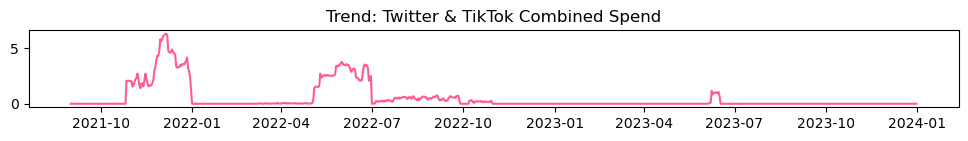

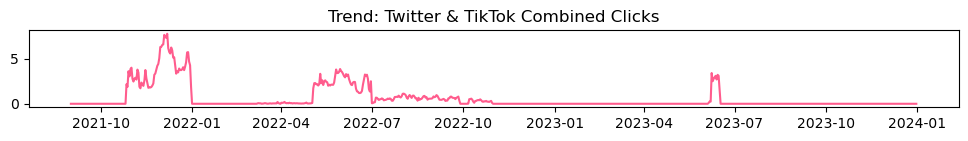

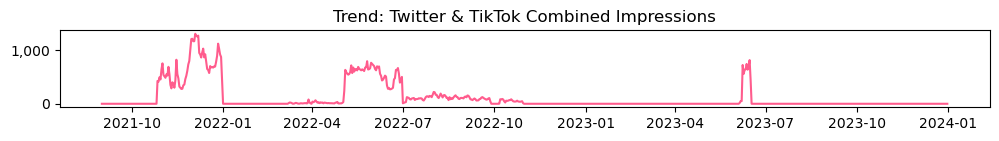

In [178]:
trend_chart_(df_ads_v4_2, cols, chart_title, 'Date')

In [399]:
check_var = 'IronSource_Aura'
check_var = 'Brand'
check_var = 'Apple'
lst = list(df_ads_copy.columns)
lst_return = []
for var in lst:
    if check_var in var:
        lst_return = lst_return + [var]
lst_return

['SEM_Apple_Search_Ads_Spend',
 'SEM_Apple_Search_Ads_Clicks',
 'SEM_Apple_Search_Ads_Impressions']

In [401]:
df_ads_copy_v2 = df_ads_copy_v2.fillna(0)
check_var = 'SEM_Google'
lst = list(df_ads_copy_v2.columns)
lst_return = []
for var in lst:
    if check_var in var:
        lst_return = lst_return + [var]
lst_return

['SEM_Google_Android_Spend',
 'SEM_Google_Android_Clicks',
 'SEM_Google_Android_Impressions',
 'SEM_Google_iOS_Spend',
 'SEM_Google_iOS_Clicks',
 'SEM_Google_iOS_Impressions',
 'SEM_Google_Overall_Spend',
 'SEM_Google_Overall_Clicks',
 'SEM_Google_Overall_Impressions',
 'SEM_Google_Spend',
 'SEM_Google_Clicks',
 'SEM_Google_Impressions']

In [13]:
cols = ['Apps_TWC Universal Android 4G+_Visits',
        'Apps_TWC Universal iOS 4G+_Visits',
        'MobileWeb_TWC Mobile Web_Visits',
        'Web_TWC Web_Visits',
        'SEM_Apple_Search_Ads_Spend', 'SEM_Apple_Search_Ads_Impressions']
chart_title = ['Apps Android 4G+ Visits',
               'Apps iOS 4G+ Visits',
               'Mobile Web Visits',
               'Web Visits',
               'SEM Apple Search Ads Spend', 'SEM Apple Search Ads Impressions']

In [368]:
print(df_ads_copy['Apps_TWC Universal iOS 4G+_Visits'].corr(df_ads_copy['SEM_Apple_Search_Ads_Spend'])*100)
print(df_ads_copy['Apps_TWC Universal iOS 4G+_Visits'].corr(df_ads_copy['SEM_Apple_Search_Ads_Clicks'])*100)
print(df_ads_copy['Apps_TWC Universal iOS 4G+_Visits'].corr(df_ads_copy['SEM_Apple_Search_Ads_Impressions'])*100)
print("")
print(df_ads_copy['MobileWeb_TWC Mobile Web_Visits'].corr(df_ads_copy['SEM_Apple_Search_Ads_Spend'])*100)
print(df_ads_copy['MobileWeb_TWC Mobile Web_Visits'].corr(df_ads_copy['SEM_Apple_Search_Ads_Clicks'])*100)
print(df_ads_copy['MobileWeb_TWC Mobile Web_Visits'].corr(df_ads_copy['SEM_Apple_Search_Ads_Impressions'])*100)
print("")
print(df_ads_copy['Web_TWC Web_Visits'].corr(df_ads_copy['SEM_Apple_Search_Ads_Spend'])*100)
print(df_ads_copy['Web_TWC Web_Visits'].corr(df_ads_copy['SEM_Apple_Search_Ads_Clicks'])*100)
print(df_ads_copy['Web_TWC Web_Visits'].corr(df_ads_copy['SEM_Apple_Search_Ads_Impressions'])*100)

26.445256696035507
48.547821785982634
16.945763844411964

31.515055806467814
43.837710768723746
8.912653057036822

23.599393485280558
33.81280488421148
7.2441034370005095


In [5]:
cols = ['Apps_TWC Universal Android 4G+_Visits',
        'Apps_TWC Universal iOS 4G+_Visits',
        'MobileWeb_TWC Mobile Web_Visits',
        'Web_TWC Web_Visits']
chart_title = ['Apps Android 4G+ Visits',
               'Apps iOS 4G+ Visits',
               'Mobile Web Visits',
               'Web Visits']

In [389]:
cols = ['Apps_TWC Universal Android 4G+_Visits',
        'Apps_TWC Universal iOS 4G+_Visits',
        'MobileWeb_TWC Mobile Web_Visits',
        'Web_TWC Web_Visits',
        'Preload_IronSource_Aura_Spend',
        'Preload_IronSource_Aura_impressions']
chart_title = ['Apps Android 4G+ Visits',
               'Apps iOS 4G+ Visits',
               'Mobile Web Visits',
               'Web Visits',
               'Preload IronSource Aura Spend',
               'Preload IronSource Aura Impressions']

In [387]:
print("Android")
print("Spend", round(df_ads_copy['Apps_TWC Universal Android 4G+_Visits'].corr(df_ads_copy['Preload_IronSource_Aura_Spend'])*100))
print("Impressions", round(df_ads_copy['Apps_TWC Universal Android 4G+_Visits'].corr(df_ads_copy['Preload_IronSource_Aura_impressions'])*100))
print("iOS")
print("Spend", round(df_ads_copy['Apps_TWC Universal iOS 4G+_Visits'].corr(df_ads_copy['Preload_IronSource_Aura_Spend'])*100))
print("Impressions", round(df_ads_copy['Apps_TWC Universal iOS 4G+_Visits'].corr(df_ads_copy['Preload_IronSource_Aura_impressions'])*100))
print("Mobile Web")
print("Spend", round(df_ads_copy['MobileWeb_TWC Mobile Web_Visits'].corr(df_ads_copy['Preload_IronSource_Aura_Spend'])*100))
print("Impressions", round(df_ads_copy['MobileWeb_TWC Mobile Web_Visits'].corr(df_ads_copy['Preload_IronSource_Aura_impressions'])*100))
print("Web")
print("Spend", round(df_ads_copy['Web_TWC Web_Visits'].corr(df_ads_copy['Preload_IronSource_Aura_Spend'])*100))
print("Impressions", round(df_ads_copy['Web_TWC Web_Visits'].corr(df_ads_copy['Preload_IronSource_Aura_impressions'])*100))

Android
Spend 14
Impressions 17
iOS
Spend 21
Impressions 21
Mobile Web
Spend 25
Impressions 22
Web
Spend 25
Impressions 22


In [388]:
cols = ['Apps_TWC Universal Android 4G+_Visits',
        'Apps_TWC Universal iOS 4G+_Visits',
        'MobileWeb_TWC Mobile Web_Visits',
        'Web_TWC Web_Visits',
        'Brand_Spend', 'Brand_Impressions']
chart_title = ['Apps Android 4G+ Visits',
               'Apps iOS 4G+ Visits',
               'Mobile Web Visits',
               'Web Visits',
               'Brand Spend', 'Brand Impressions']

In [373]:
print("Android")
print("Spend", round(df_ads_copy['Apps_TWC Universal Android 4G+_Visits'].corr(df_ads_copy['Brand_Spend'])*100))
print("Impressions", round(df_ads_copy['Apps_TWC Universal Android 4G+_Visits'].corr(df_ads_copy['Brand_Impressions'])*100))
print("iOS")
print("Spend", round(df_ads_copy['Apps_TWC Universal iOS 4G+_Visits'].corr(df_ads_copy['Brand_Spend'])*100))
print("Impressions", round(df_ads_copy['Apps_TWC Universal iOS 4G+_Visits'].corr(df_ads_copy['Brand_Impressions'])*100))
print("Mobile Web")
print("Spend", round(df_ads_copy['MobileWeb_TWC Mobile Web_Visits'].corr(df_ads_copy['Brand_Spend'])*100))
print("Impressions", round(df_ads_copy['MobileWeb_TWC Mobile Web_Visits'].corr(df_ads_copy['Brand_Impressions'])*100))
print("Web")
print("Spend", round(df_ads_copy['Web_TWC Web_Visits'].corr(df_ads_copy['Brand_Spend'])*100))
print("Impressions", round(df_ads_copy['Web_TWC Web_Visits'].corr(df_ads_copy['Brand_Impressions'])*100))

Android
Spend -22
Impressions -26
iOS
Spend -22
Impressions -24
Mobile Web
Spend -21
Impressions -17
Web
Spend -19
Impressions -15


In [402]:
cols = ['Apps_TWC Universal Android 4G+_Visits',
        'Apps_TWC Universal iOS 4G+_Visits',
        'MobileWeb_TWC Mobile Web_Visits',
        'Web_TWC Web_Visits',
        'SEM_Google_Android_Spend',
        'SEM_Google_Android_Impressions']
chart_title = ['Apps Android 4G+ Visits',
               'Apps iOS 4G+ Visits',
               'Mobile Web Visits',
               'Web Visits',
               'SEM Google Android Spend',
               'SEM Google Android Impressions']

In [405]:
print("Android")
print("Spend", round(df_ads_copy_v2['Apps_TWC Universal Android 4G+_Visits'].corr(df_ads_copy_v2['SEM_Google_Android_Spend'])*100))
print("Impressions", round(df_ads_copy_v2['Apps_TWC Universal Android 4G+_Visits'].corr(df_ads_copy_v2['SEM_Google_Android_Impressions'])*100))
print("Mobile Web")
print("Spend", round(df_ads_copy_v2['MobileWeb_TWC Mobile Web_Visits'].corr(df_ads_copy_v2['SEM_Google_Android_Spend'])*100))
print("Impressions", round(df_ads_copy_v2['MobileWeb_TWC Mobile Web_Visits'].corr(df_ads_copy_v2['SEM_Google_Android_Impressions'])*100))
print("Web")
print("Spend", round(df_ads_copy_v2['Web_TWC Web_Visits'].corr(df_ads_copy_v2['SEM_Google_Android_Spend'])*100))
print("Impressions", round(df_ads_copy_v2['Web_TWC Web_Visits'].corr(df_ads_copy_v2['SEM_Google_Android_Impressions'])*100))

Android
Spend 13
Impressions 10
Mobile Web
Spend 18
Impressions 6
Web
Spend 14
Impressions 7


In [14]:
cols = ['Apps_TWC Universal Android 4G+_Visits',
        'Apps_TWC Universal iOS 4G+_Visits',
        'MobileWeb_TWC Mobile Web_Visits',
        'Web_TWC Web_Visits',
        'SEM_Google_iOS_Spend',
        'SEM_Google_iOS_Impressions']
chart_title = ['Apps Android 4G+ Visits',
               'Apps iOS 4G+ Visits',
               'Mobile Web Visits',
               'Web Visits',
               'SEM Google iOS Spend',
               'SEM Google iOS Impressions']

In [19]:
df_ads[['SEM_Google_iOS_Spend',
        'SEM_Google_iOS_Impressions']].max()

SEM_Google_iOS_Spend           400.24
SEM_Google_iOS_Impressions    8845.00
dtype: float64

In [412]:
print("iOS")
print("Spend", round(df_ads_copy_v2['Apps_TWC Universal Android 4G+_Visits'].corr(df_ads_copy_v2['SEM_Google_iOS_Spend'])*100))
print("Impressions", round(df_ads_copy_v2['Apps_TWC Universal Android 4G+_Visits'].corr(df_ads_copy_v2['SEM_Google_iOS_Impressions'])*100))
print("Mobile Web")
print("Spend", round(df_ads_copy_v2['MobileWeb_TWC Mobile Web_Visits'].corr(df_ads_copy_v2['SEM_Google_iOS_Spend'])*100))
print("Impressions", round(df_ads_copy_v2['MobileWeb_TWC Mobile Web_Visits'].corr(df_ads_copy_v2['SEM_Google_iOS_Impressions'])*100))
print("Web")
print("Spend", round(df_ads_copy_v2['Web_TWC Web_Visits'].corr(df_ads_copy_v2['SEM_Google_iOS_Spend'])*100))
print("Impressions", round(df_ads_copy_v2['Web_TWC Web_Visits'].corr(df_ads_copy_v2['SEM_Google_iOS_Impressions'])*100))

iOS
Spend 15
Impressions 16
Mobile Web
Spend 47
Impressions 37
Web
Spend 45
Impressions 42


0.9452219916637677


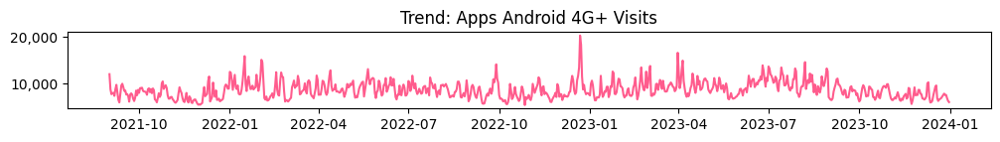

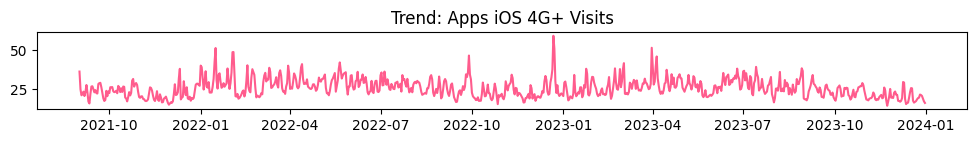

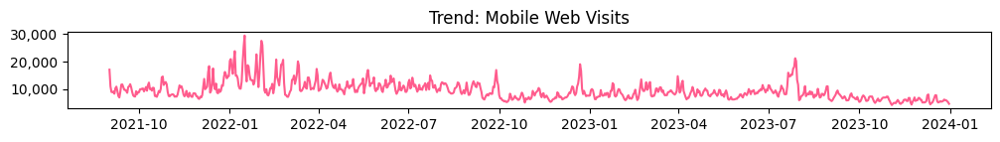

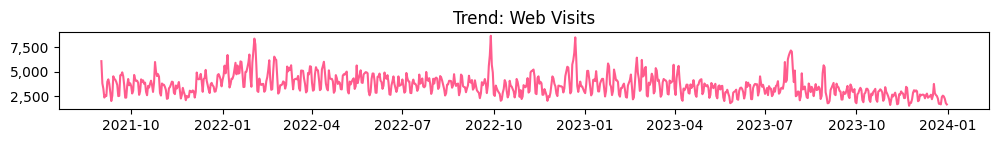

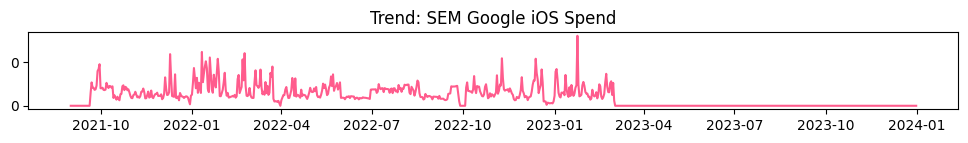

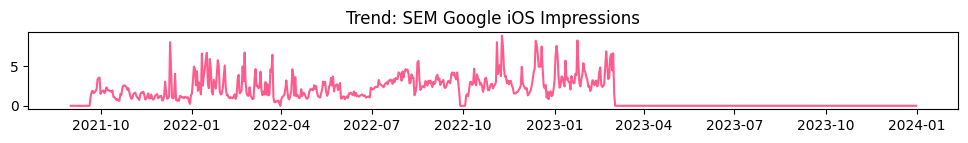

In [17]:
trend_chart_(df_ads, cols, chart_title, 'Date')

0.06196663994654368


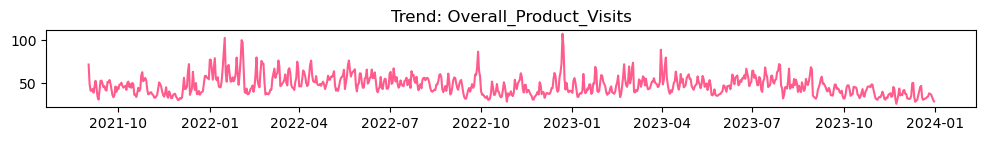

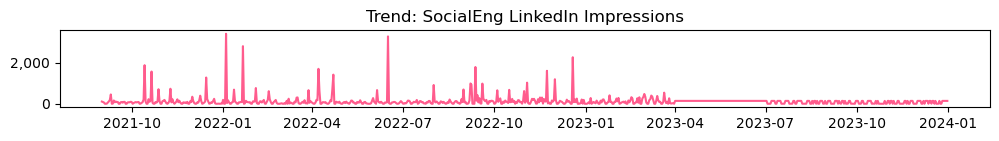

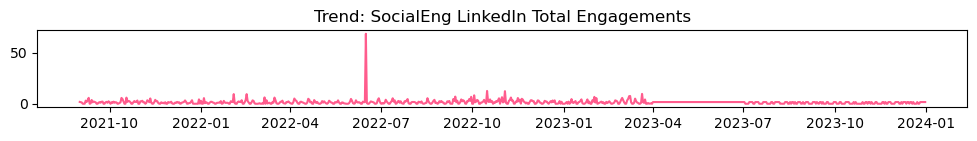

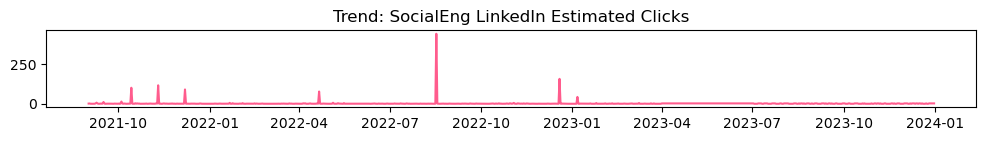

In [55]:
trend_chart_(df_ads_v4, cols, chart_title, 'Date')

## Feature Importance 

In [69]:
var_discarded = ['Overall_Product_Goal',
'Apps_TWC Universal Android 4G+_Visits',
'Apps_TWC Universal Android 4G+_Goal',
'Apps_TWC Universal iOS 4G+_Visits',
'Apps_TWC Universal iOS 4G+_Goal',
'MobileWeb_TWC Mobile Web_Visits',
'MobileWeb_TWC Mobile Web_Goal',
'Web_TWC Web_Visits',
'Web_TWC Web_Goal',
'Partner_Visits_Overall_(Desktop&Mobile)',
'OrganicSearch_Google_Impressions',
'OrganicSearch_Google_CTR',
'SEO_Clicks_OrganicSearch_Desktop_MobileWeb(Combined)',
'Pricing_Android_Installs',
'Pricing_iOS_Installs',
'SEM_Google_Clicks',
'Preload_IronSource_Aura_launches',
'Preload_IronSource_Aura_app_downloads',
'Programmatic_Bidease_Impressions',
'Preload_Digital_Turbine_impressions',
'Preload_Digital_Turbine_app_downloads',
'Programmatic_Tapjoy_Impressions',
'SEM_Apple_Search_Ads_Clicks',
'Programmatic_LiftOff_Clicks',
'Programmatic_IronSource_Sonic_Clicks',
'PaidSocial_Twitter_Clicks',
                 'PaidSocial_Twitter_Spend',
'PaidSocial_Twitter_Impressions',
'Programmatic_TikTok_Clicks','Programmatic_TikTok_Spend',
'Programmatic_TikTok_Impressions',
'PaidSocial_Vibe_Spend',
'PaidSocial_Vibe_Clicks',
'PaidSocial_Vibe_Impressions',
'Programmatic_Persona.ly_Impressions',
'Net Favorability',
'Net Trust',
'Realibality',
'Accuracy',
# 'NPS',
'Positive impact on community',
'Positive impact on well being',
#        'Preference',
                 'Seen as experts', 
#                  'Usage'
'SocialEng_YouTube_Total_Engagements',
'SocialEng_TikTok_Estimated_Clicks',
'Twitter_TikTok_Combined_Clicks'
                ,'Overall_Product_Visits',
                'SEM_Google_Spend',
 'Preload_IronSource_Aura_Spend',
 'Programmatic_Bidease_Spend',
 'Preload_Digital_Turbine_Spend',
 'Programmatic_Tapjoy_Spend',
 'SEM_Apple_Search_Ads_Spend',
 'Programmatic_LiftOff_Spend',
 'Programmatic_IronSource_Sonic_Spend',
 'Programmatic_Persona.ly_Spend',
 'Brand_Spend',
 'Twitter_TikTok_Combined_Spend'
                ]

def remove_items(base_list, remove_list):
    return [item for item in base_list if item not in remove_list]
var = remove_items(list(df_ads_v4), var_discarded)

print(len(var))

df_ads_v5 = df_ads_v4[var]

38


In [60]:
var = ['Net Favorability',
'Net Trust',
'Realibality',
'Accuracy',
'NPS',
'Positive impact on community',
'Positive impact on well being',
'Pricing_Total_Installs',
       'Preference','Seen as experts', 'Usage'
]
df_ads_v5 = df_ads_v4[var]

In [31]:
def remove_items(base_list, remove_list):
    return [item for item in base_list if item not in remove_list]
var = remove_items(list(df_ads_v4_4), var_discarded)

print(len(var))

df_ads_v4_5 = df_ads_v4_4[var]

NameError: name 'df_ads_v4_4' is not defined

#### Decision Tree 

In [95]:
from sklearn.tree import DecisionTreeRegressor
def decision_tree_feature_importance(df):
    var_list = []
    for col in df.columns:
        if (df[col].dtypes == object) or (df[col].dtypes == str) or (df[col].isin([0, 1]).all()) or (df[col].dtypes == bool) or isinstance(df[col], datetime.date) or pd.api.types.is_datetime64_dtype(df[col]) or (col == 'Overall_Product_Visits'):
            continue
        else:
            var_list = var_list + [col]

    X = df[[x for x in df.columns if x in var_list]]
    # X = df.drop(columns=['Overall_Product_Visits'])  # Features
    y = df['Overall_Product_Visits']  # Target variable

    tree_regressor = DecisionTreeRegressor(random_state=42)

    tree_regressor.fit(X, y)

    feature_importances = tree_regressor.feature_importances_

    importance_df = pd.DataFrame({
        'Feature': X.columns,
        'Importance': (feature_importances*100).round(2)
    })

    importance_df = importance_df.sort_values(by='Importance', ascending=False)

    return importance_df

In [152]:
# w/o removing variables post correlation analysis
importance_df = decision_tree_feature_importance(df_ads_v4)
importance_df

,Feature,Importance
4,Pricing_Android_Installs,42.17
2,OrganicSearch_Google_Impressions,15.46
50,Preference,10.66
17,Preload_Digital_Turbine_Spend,8.50
12,Preload_IronSource_Aura_impressions,3.59
...,...,...
44,Net Favorability,0.00
45,Net Trust,0.00
53,Positive impact on well being,0.00
46,Realibality,0.00


In [33]:
# after removing variables post correlation analysis
importance_df = decision_tree_feature_importance(df_ads_v5)
importance_df

NameError: name 'decision_tree_feature_importance' is not defined

In [337]:
# after removing variables post correlation analysis and spend variables
importance_df = decision_tree_feature_importance(df_ads_v6)
importance_df

,Feature,Importance
3,Pricing_Total_Installs,39.88
1,OrganicSearch_Google_Clicks,26.76
15,Preference,11.11
2,OrganicSearch_Google_Position,3.89
0,US Weather Impact Rating,3.19
10,Programmatic_LiftOff_Impressions,2.69
4,SEM_Google_Impressions,1.56
16,Seen as experts,1.25
5,Preload_IronSource_Aura_impressions,1.06
8,Programmatic_Tapjoy_Clicks,0.99


In [97]:
importance_df.to_clipboard()

In [338]:
from sklearn.metrics import r2_score
def get_decision_tree_r2_curve(df, importance_df, split_flag):
    X_var = []
    y = df['Overall_Product_Visits']
    result = {}
    counter = 1
    for var in list(importance_df['Feature']):
        X_var = X_var + [var]
        X = df[X_var]
        tree_regressor = DecisionTreeRegressor(random_state=42)
        
        if split_flag == 1:
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
        else:
            X_train, X_test = X, X
            y_train, y_test = y, y
            
        tree_regressor.fit(X_train, y_train)
        y_pred = tree_regressor.predict(X_test)
        
        r_squared = r2_score(y_test, y_pred)
        n = X_test.shape[0]
        p = X_test.shape[1]
        adjusted_r_squared = 1 - (1 - r_squared) * (n - 1) / (n - p - 1)
        result[str(counter)] = {'var': X_var,
                           'r_sq': r_squared,
                           'adj_r_sq': adjusted_r_squared}
        counter = counter + 1
    return result
train_test_split_flag = 1
result = get_decision_tree_r2_curve(df_ads_v6, importance_df, train_test_split_flag)
result

{'1': {'var': ['Pricing_Total_Installs'],
  'r_sq': -0.2505636198358956,
  'adj_r_sq': -0.2579634045686523},
 '2': {'var': ['Pricing_Total_Installs', 'OrganicSearch_Google_Clicks'],
  'r_sq': -0.04397899983844478,
  'adj_r_sq': -0.05640732126509285},
 '3': {'var': ['Pricing_Total_Installs',
   'OrganicSearch_Google_Clicks',
   'Preference'],
  'r_sq': 0.46528236217341135,
  'adj_r_sq': 0.45567665610467023},
 '4': {'var': ['Pricing_Total_Installs',
   'OrganicSearch_Google_Clicks',
   'Preference',
   'OrganicSearch_Google_Position'],
  'r_sq': 0.7041366161939389,
  'adj_r_sq': 0.6970073780299374},
 '5': {'var': ['Pricing_Total_Installs',
   'OrganicSearch_Google_Clicks',
   'Preference',
   'OrganicSearch_Google_Position',
   'US Weather Impact Rating'],
  'r_sq': 0.6787287019510204,
  'adj_r_sq': 0.6689932080707484},
 '6': {'var': ['Pricing_Total_Installs',
   'OrganicSearch_Google_Clicks',
   'Preference',
   'OrganicSearch_Google_Position',
   'US Weather Impact Rating',
   'Program

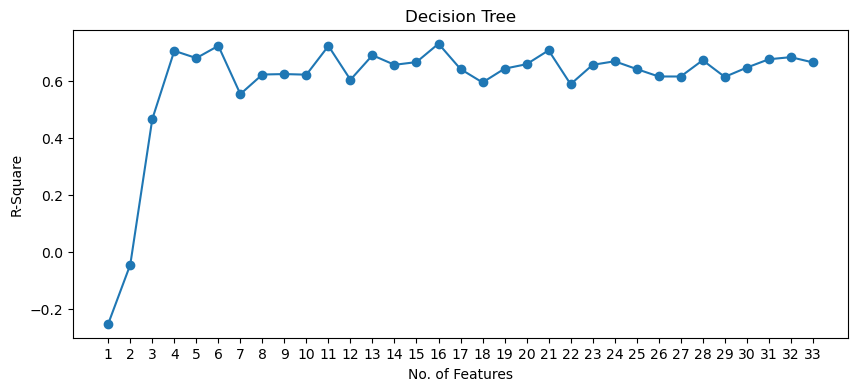

In [339]:
plt.figure(figsize=(10, 4))
plt.plot(list(result.keys()), [value['r_sq'] for value in result.values()], marker='o', linestyle='-')
plt.title('Decision Tree')
plt.xlabel('No. of Features')
plt.ylabel('R-Square')
plt.show()

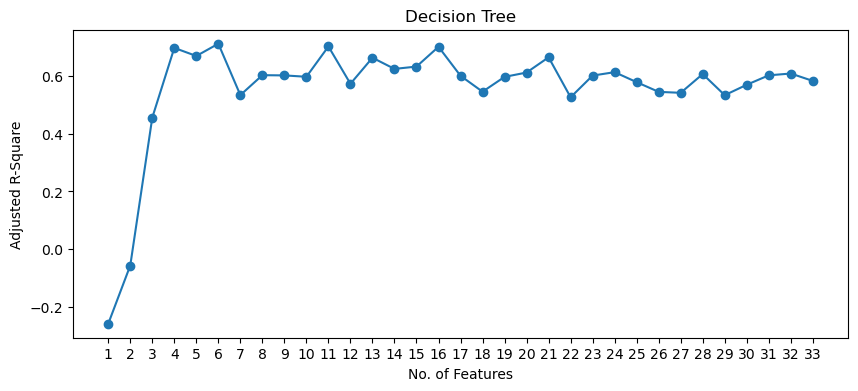

In [340]:
plt.figure(figsize=(10, 4))
plt.plot(list(result.keys()), [value['adj_r_sq'] for value in result.values()], marker='o', linestyle='-')
plt.title('Decision Tree')
plt.xlabel('No. of Features')
plt.ylabel('Adjusted R-Square')
plt.show()

In [341]:
decision_tree_step_wise_df = pd.DataFrame.from_dict(result, orient='index')
decision_tree_step_wise_df.to_clipboard()

#### Random Forest

In [70]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from pandas.api.types import is_categorical_dtype
from pandas.api.types import is_numeric_dtype, is_float_dtype
import datetime

def get_feature_importance(df, target_var): 
    """Getting feature importance of the variables in the dataset, for users to make decision while choosing the contextual variables
        Args:
            df: A Pandas DataFrame
            user_param: user selection from explorer page
        Returns: DataFrame containing feature importance
    """   
    var_list = []
    for col in df.columns:
        if (df[col].dtypes == object) or (df[col].dtypes == str) or (df[col].isin([0, 1]).all()) or (df[col].dtypes == bool) or isinstance(df[col], datetime.date) or pd.api.types.is_datetime64_dtype(df[col]) or (col == target_var):
            continue
        else:
            var_list = var_list + [col]

    X = df[[x for x in df.columns if x in var_list]]
    y = df[target_var]
#     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
    rf = RandomForestRegressor(random_state=42)
#     rf.fit(X_train, y_train)
    rf.fit(X, y)
    feat_importances = round(pd.Series(rf.feature_importances_, index=X.columns)*100, 2)
    feat_importances = feat_importances.sort_values(ascending=False)
    feat_importances_df = pd.DataFrame(feat_importances).reset_index(drop=False)
    feat_importances_df = feat_importances_df.rename({'index':'Variable', 0:'Importance'}, axis=1)

    return feat_importances_df

In [29]:
# w/o removing variables post correlation analysis
target_var = 'Overall_Product_Visits'
feature_importance = get_feature_importance(df_ads_v4, target_var)
feature_importance

,Variable,Importance
0,Pricing_Android_Installs,42.80
1,Preference,8.80
2,OrganicSearch_Google_Impressions,8.19
3,OrganicSearch_Google_Clicks,6.57
4,Preload_Digital_Turbine_Spend,5.05
...,...,...
66,Seen as experts,0.02
67,Realibality,0.02
68,SocialEng_Instagram_Estimated_Clicks,0.00
69,PaidSocial_Vibe_Spend,0.00


In [11]:
# feature_importance.to_csv(file_path+"RF_feature_importance_04_03_24.csv", index=False)

In [68]:
feature_importance.to_clipboard()

In [71]:
# after removing variables post correlation analysis
target_var = 'Pricing_Total_Installs'
feature_importance = get_feature_importance(df_ads_v5, target_var)
feature_importance

,Variable,Importance
0,Programmatic_IronSource_Sonic_Impressions,20.05
1,Usage,18.98
2,OrganicSearch_Google_Clicks,16.38
3,US Weather Impact Rating,8.74
4,SEM_Apple_Search_Ads_Impressions,4.06
5,Programmatic_Tapjoy_Clicks,3.54
6,SEM_Google_Impressions,3.28
7,SocialEng_Twitter_Estimated_Clicks,2.21
8,SocialEng_Facebook_Impressions,2.08
9,OrganicSearch_Google_Position,1.93


In [332]:
# after removing variables post correlation analysis and spend variables
target_var = 'Overall_Product_Visits'
feature_importance = get_feature_importance(df_ads_v6, target_var)
feature_importance

,Variable,Importance
0,Pricing_Total_Installs,38.32
1,OrganicSearch_Google_Clicks,20.83
2,Preference,9.26
3,US Weather Impact Rating,6.33
4,Preload_IronSource_Aura_impressions,3.54
5,OrganicSearch_Google_Position,2.97
6,Programmatic_Bidease_Clicks,1.94
7,Programmatic_LiftOff_Impressions,1.30
8,Brand_Impressions,1.28
9,SocialEng_Twitter_Total_Engagements,1.16


In [40]:
# after removing variables post correlation analysis and spend variables
target_var = 'Overall_Product_Visits'
feature_importance = get_feature_importance(df_ads_v4_5, target_var)
feature_importance

,Variable,Importance
0,OrganicSearch_Google_Clicks,36.61
1,Pricing_Total_Installs,25.23
2,Preference,8.26
3,Preload_Digital_Turbine_Spend,4.47
4,Programmatic_Bidease_Spend,3.73
5,US Weather Impact Rating,2.33
6,Programmatic_IronSource_Sonic_Impressions,1.41
7,Programmatic_LiftOff_Impressions,1.18
8,Programmatic_Bidease_Clicks,0.99
9,Programmatic_LiftOff_Spend,0.93


In [41]:
spend_columns_v2 = [col for col in df_ads_v4_5.columns if 'spend' in col.lower()]
var_wo_spend_v2 = remove_items(list(df_ads_v4_5), spend_columns_v2)
df_ads_v4_6 = df_ads_v4_5[var_wo_spend_v2]
target_var = 'Overall_Product_Visits'
feature_importance = get_feature_importance(df_ads_v4_6, target_var)
feature_importance

,Variable,Importance
0,OrganicSearch_Google_Clicks,38.01
1,Pricing_Total_Installs,27.58
2,Preference,9.45
3,US Weather Impact Rating,2.64
4,Preload_IronSource_Aura_impressions,2.04
5,Programmatic_IronSource_Sonic_Impressions,1.90
6,Programmatic_LiftOff_Impressions,1.87
7,Twitter_TikTok_Combined_Impressions,1.81
8,Programmatic_Bidease_Clicks,1.57
9,SocialEng_Facebook_Impressions,0.99


In [171]:
spend_columns_v2

['SEM_Google_Spend',
 'Preload_IronSource_Aura_Spend',
 'Programmatic_Bidease_Spend',
 'Preload_Digital_Turbine_Spend',
 'Programmatic_Tapjoy_Spend',
 'SEM_Apple_Search_Ads_Spend',
 'Programmatic_LiftOff_Spend',
 'Programmatic_IronSource_Sonic_Spend',
 'Programmatic_Persona.ly_Spend',
 'Brand_Spend',
 'Twitter_TikTok_Combined_Spend']

In [82]:
var_cons = feature_importance.copy()
var_cons = var_cons.head(13)
var_cons = ['Overall_Product_Visits'] + list(var_cons['Variable']) + spend_columns_v2
df_ads_v4_7 = df_ads_v4_5[var_cons]
feature_importance_v2 = get_feature_importance(df_ads_v4_7, target_var)
feature_importance_v2

,Variable,Importance
0,OrganicSearch_Google_Clicks,36.90
1,Pricing_Total_Installs,25.92
2,Preference,8.44
3,Preload_Digital_Turbine_Spend,4.81
4,Programmatic_Bidease_Spend,4.09
5,US Weather Impact Rating,2.70
6,Programmatic_IronSource_Sonic_Impressions,1.55
7,Programmatic_LiftOff_Impressions,1.49
8,SEM_Apple_Search_Ads_Spend,1.29
9,Programmatic_Bidease_Clicks,1.20


In [47]:
feature_importance.to_clipboard()

In [72]:
from sklearn.metrics import r2_score
def get_random_forest_r2_curve(df, importance_df, split_flag):
    X_var = []
    y = df['Pricing_Total_Installs']
    result = {}
    counter = 1
    for var in list(importance_df['Variable']):
        X_var = X_var + [var]
        X = df[X_var]
        tree_regressor = RandomForestRegressor(random_state=42)
#         tree_regressor.fit(X, y)
#         y_pred = tree_regressor.predict(X)
#         r_squared = r2_score(y, y_pred)
#         n = X.shape[0]
#         p = X.shape[1]
        if split_flag == 1:
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
        else:
            X_train, X_test = X, X
            y_train, y_test = y, y
            
        tree_regressor.fit(X_train, y_train)
        y_pred = tree_regressor.predict(X_test)
        
        r_squared = r2_score(y_test, y_pred)
        n = X_test.shape[0]
        p = X_test.shape[1]
        adjusted_r_squared = 1 - (1 - r_squared) * (n - 1) / (n - p - 1)
        result[str(counter)] = {'var': X_var,
                           'r_sq': r_squared,
                           'adj_r_sq': adjusted_r_squared}
        counter = counter + 1
    return result

train_test_split_flag = 0
result = get_random_forest_r2_curve(df_ads_v5, feature_importance, train_test_split_flag)
result

{'1': {'var': ['Programmatic_IronSource_Sonic_Impressions'],
  'r_sq': 0.5950699107649432,
  'adj_r_sq': 0.5945935224246667},
 '2': {'var': ['Programmatic_IronSource_Sonic_Impressions', 'Usage'],
  'r_sq': 0.7182928016450323,
  'adj_r_sq': 0.7176291804474941},
 '3': {'var': ['Programmatic_IronSource_Sonic_Impressions',
   'Usage',
   'OrganicSearch_Google_Clicks'],
  'r_sq': 0.9619104960791899,
  'adj_r_sq': 0.9617757454756964},
 '4': {'var': ['Programmatic_IronSource_Sonic_Impressions',
   'Usage',
   'OrganicSearch_Google_Clicks',
   'US Weather Impact Rating'],
  'r_sq': 0.9665230496680796,
  'adj_r_sq': 0.966364953090361},
 '5': {'var': ['Programmatic_IronSource_Sonic_Impressions',
   'Usage',
   'OrganicSearch_Google_Clicks',
   'US Weather Impact Rating',
   'SEM_Apple_Search_Ads_Impressions'],
  'r_sq': 0.9724528891440397,
  'adj_r_sq': 0.9722900811602574},
 '6': {'var': ['Programmatic_IronSource_Sonic_Impressions',
   'Usage',
   'OrganicSearch_Google_Clicks',
   'US Weather Im

In [86]:
# df_ads_v4_5.columns

In [87]:
from matplotlib import pyplot as plt1

plt1.figure(figsize=(10, 4))  # width=10, height=6
plt1.plot(list(result.keys()), [value['r_sq'] for value in result.values()], marker='o', linestyle='-')
plt1.title('Random Forest')
plt1.xlabel('No. of Features')
plt1.ylabel('R-Square')
plt1.show()

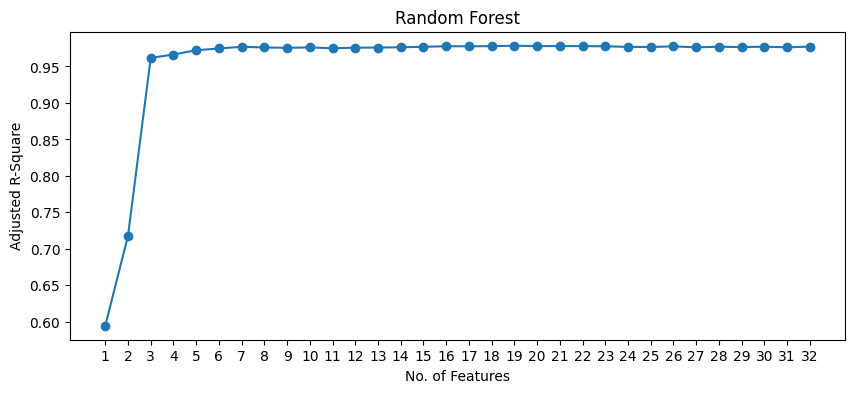

In [74]:
plt.figure(figsize=(10, 4))  # width=10, height=6
plt.plot(list(result.keys()), [value['adj_r_sq'] for value in result.values()], marker='o', linestyle='-')
plt.title('Random Forest')
plt.xlabel('No. of Features')
plt.ylabel('Adjusted R-Square')
plt.show()

In [73]:
random_forest_step_wise_df = pd.DataFrame.from_dict(result, orient='index')
random_forest_step_wise_df.to_clipboard()

In [72]:
df_ads_v4_5_copy = df_ads_v4_5.copy()
df_ads_v4_5_copy = df_ads_v4_5_copy[['Date', 'Overall_Product_Visits', 'US Weather Impact Rating',
       'OrganicSearch_Google_Clicks', 'OrganicSearch_Google_Position',
       'Pricing_Total_Installs', 'SEM_Google_Spend', 'SEM_Google_Impressions',
       'Preload_IronSource_Aura_Spend', 'Preload_IronSource_Aura_impressions',
       'Programmatic_Bidease_Spend', 'Programmatic_Bidease_Clicks',
       'Preload_Digital_Turbine_Spend', 'Preload_Digital_Turbine_launches',
       'Programmatic_Tapjoy_Spend', 'Programmatic_Tapjoy_Clicks',
       'SEM_Apple_Search_Ads_Spend', 'SEM_Apple_Search_Ads_Impressions',
       'Programmatic_LiftOff_Spend', 'Programmatic_LiftOff_Impressions',
       'Programmatic_IronSource_Sonic_Spend',
       'Programmatic_IronSource_Sonic_Impressions',
       'Programmatic_Persona.ly_Spend', 'Programmatic_Persona.ly_Clicks',
                                     
                                     'Twitter_TikTok_Combined_Spend',
       'Twitter_TikTok_Combined_Impressions', 
                                     'Brand_Spend', 'Brand_Impressions', 'Usage', 'Preference',
       'Seen as experts', 'SocialEng_Facebook_Impressions',
       'SocialEng_Facebook_Total_Engagements',
       'SocialEng_Facebook_Estimated_Clicks', 'SocialEng_LinkedIn_Impressions',
       'SocialEng_LinkedIn_Total_Engagements',
       'SocialEng_LinkedIn_Estimated_Clicks', 'SocialEng_YouTube_Impressions',
       'SocialEng_YouTube_Estimated_Clicks', 'SocialEng_Instagram_Impressions',
       'SocialEng_Instagram_Total_Engagements',
       'SocialEng_Instagram_Estimated_Clicks', 'SocialEng_Twitter_Impressions',
       'SocialEng_Twitter_Total_Engagements',
       'SocialEng_Twitter_Estimated_Clicks', 'SocialEng_TikTok_Impressions',
       'SocialEng_TikTok_Total_Engagements', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag',
       'Event_Name']]
len(df_ads_v4_5_copy.columns)
df_ads_v4_5_copy.to_csv(file_path+"TWC_Final_processed_ADS_190324.csv", index=False)

## RFE 

In [11]:
spend_columns = [col for col in df_ads_v5.columns if 'spend' in col.lower()]
spend_columns

['SEM_Google_Spend',
 'Preload_IronSource_Aura_Spend',
 'Programmatic_Bidease_Spend',
 'Preload_Digital_Turbine_Spend',
 'Programmatic_Tapjoy_Spend',
 'SEM_Apple_Search_Ads_Spend',
 'Programmatic_LiftOff_Spend',
 'Programmatic_IronSource_Sonic_Spend',
 'PaidSocial_Twitter_Spend',
 'Programmatic_TikTok_Spend',
 'Programmatic_Persona.ly_Spend',
 'Brand_Spend']

In [12]:
var_wo_spend = remove_items(list(df_ads_v5), spend_columns)

In [13]:
df_ads_v6 = df_ads_v5[var_wo_spend]

In [14]:
df_ads_v6

,Date,Overall_Product_Visits,US Weather Impact Rating,OrganicSearch_Google_Clicks,OrganicSearch_Google_Position,Pricing_Total_Installs,SEM_Google_Impressions,Preload_IronSource_Aura_impressions,Programmatic_Bidease_Clicks,Preload_Digital_Turbine_launches,...,SocialEng_Instagram_Estimated_Clicks,SocialEng_Twitter_Impressions,SocialEng_Twitter_Total_Engagements,SocialEng_Twitter_Estimated_Clicks,SocialEng_TikTok_Impressions,SocialEng_TikTok_Total_Engagements,EventsCamp/Vend_Campaign_Flag,EventsCamp/Vend_Campaign/Vendor(s),Critical_Event_Flag,Event_Name
0,2021-09-01,71661898.0,2.00,2113632.0,3.98,64835.0,188201.0,26044.0,1.0,31.0,...,0.0,63111321.0,6126.0,745.0,0.0,0.0,0,0,1,Ida
1,2021-09-02,48666814.0,1.75,1360533.0,3.98,48244.0,111238.0,39147.0,0.0,45.0,...,0.0,41235963.0,5438.0,657.0,0.0,0.0,0,0,0,0
2,2021-09-03,41192945.0,1.50,1093015.0,3.98,37531.0,92859.0,39039.0,1.0,31.0,...,0.0,22267851.0,1711.0,468.0,0.0,0.0,0,0,0,0
3,2021-09-04,41297717.0,1.50,937480.0,3.98,38563.0,93066.0,34922.0,0.0,24.0,...,0.0,15871599.0,564.0,53.0,0.0,0.0,0,0,0,0
4,2021-09-05,43292182.0,1.25,1060371.0,3.98,39945.0,96904.0,29773.0,0.0,38.0,...,0.0,16173193.0,896.0,46.0,0.0,0.0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
847,2023-12-27,37578014.0,1.50,3057788.0,6.10,38409.0,127890.0,0.0,551.0,0.0,...,0.0,379751.0,922.0,0.0,32869.0,1188.0,1,TWCBrandAccuracy_Cluep ; TWCBrandAccuracy_Disc...,0,0
848,2023-12-28,36847658.0,1.50,3123045.0,6.08,38428.0,115165.0,0.0,694.0,0.0,...,0.0,342195.0,1025.0,0.0,14024.0,499.0,1,TWCBrandAccuracy_Cluep ; TWCBrandAccuracy_Disc...,0,0
849,2023-12-29,33759298.0,1.50,2976438.0,6.01,36438.0,132374.0,0.0,705.0,0.0,...,0.0,228454.0,733.0,0.0,44545.0,1097.0,1,TWCBrandAccuracy_Cluep ; TWCBrandAccuracy_Disc...,0,0
850,2023-12-30,30703735.0,1.25,2722696.0,6.05,34856.0,116414.0,0.0,734.0,0.0,...,0.0,236608.0,411.0,0.0,0.0,0.0,1,TWCBrandAccuracy_Cluep ; TWCBrandAccuracy_Disc...,0,0


In [131]:
df_ads_v6_temp = df_ads_v5[spend_columns]
df_spend = pd.DataFrame(df_ads_v6_temp.sum()).reset_index().rename({'index':'Variables', 0:'Total Spend'}, axis=1)
df_spend['Spend Contribution %'] = df_spend['Total Spend']/sum(df_spend['Total Spend'])
# df_spend['Variables'] = df_spend['Variables'].replace("_Spend","")
df_spend

,Variables,Total Spend,Spend Contribution %
0,SEM_Google_Spend,3.020750e+06,0.224143
1,Preload_IronSource_Aura_Spend,7.707914e+05,0.057194
2,Programmatic_Bidease_Spend,2.943780e+05,0.021843
3,Preload_Digital_Turbine_Spend,4.374771e+05,0.032461
4,Programmatic_Tapjoy_Spend,2.224240e+04,0.001650
5,SEM_Apple_Search_Ads_Spend,2.617704e+06,0.194237
6,Programmatic_LiftOff_Spend,5.281792e+05,0.039192
7,Programmatic_IronSource_Sonic_Spend,1.618108e+05,0.012007
8,PaidSocial_Twitter_Spend,2.408883e+05,0.017874
9,Programmatic_TikTok_Spend,1.877057e+05,0.013928


In [132]:
df_spend.to_clipboard()

In [147]:
# import numpy as np
# import pandas as pd
# from sklearn.datasets import make_regression
# from sklearn.linear_model import LassoCV, RidgeCV
# from sklearn.model_selection import train_test_split

# # Generate some sample data
# X, y = make_regression(n_samples=100, n_features=5, noise=0.1, random_state=42)

# # Split the data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Lasso regression with cross-validation for alpha selection
# lasso_cv = LassoCV(cv=5)  # Initialize Lasso regression with cross-validation
# lasso_cv.fit(X_train, y_train)
# lasso_alpha = lasso_cv.alpha_
# lasso_coefs = lasso_cv.coef_

# # Ridge regression with cross-validation for alpha selection
# ridge_cv = RidgeCV(cv=5)  # Initialize Ridge regression with cross-validation
# ridge_cv.fit(X_train, y_train)
# ridge_alpha = ridge_cv.alpha_
# ridge_coefs = ridge_cv.coef_

# # Calculating feature importance
# lasso_feature_importance = np.abs(lasso_coefs)
# ridge_feature_importance = np.abs(ridge_coefs)

# # Creating a DataFrame to display feature importance
# feature_names = [f"Feature_{i}" for i in range(X.shape[1])]
# feature_importance_df = pd.DataFrame({
#     "Feature": feature_names,
#     "Lasso Importance": lasso_feature_importance,
#     "Ridge Importance": ridge_feature_importance
# })

# # Display the feature importance
# print(feature_importance_df)

# # Display selected alpha values
# print("Selected alpha for Lasso:", lasso_alpha)
# print("Selected alpha for Ridge:", ridge_alpha)


In [461]:
# Decision Tree - RFE
from sklearn.feature_selection import RFECV 
from sklearn.tree import DecisionTreeRegressor 

X = df_ads_v6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
y = df_ads_v6['Overall_Product_Visits']  # Target variable

# X = df_ads_v4_6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
#        'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
# y = df_ads_v4_6['Overall_Product_Visits']  # Target variable

# Create a decision tree classifier 
# estimator = DecisionTreeRegressor() 
estimator = RandomForestRegressor()

# Use RFE with cross-validation to 
# find the optimal number of features 
selector = RFECV(estimator, cv=5) 
selector = selector.fit(X, y) 

# Print the optimal number of features 
print("Optimal number of features: %d" % selector.n_features_) 
selected_features = X.columns[selector.support_]
print("Optimal features: %d", selected_features) 

print("")
# Print the selected features 
print("Selected features: %s" % selector.support_) 
print("No. Selected features: %s" % len(selector.support_)) 

Optimal number of features: 11
Optimal features: %d Index(['US Weather Impact Rating', 'OrganicSearch_Google_Clicks',
       'OrganicSearch_Google_Position', 'Pricing_Total_Installs',
       'Preload_IronSource_Aura_impressions', 'Programmatic_Bidease_Clicks',
       'Programmatic_Tapjoy_Clicks', 'Programmatic_LiftOff_Impressions',
       'Preference', 'SocialEng_Facebook_Impressions',
       'SocialEng_Twitter_Total_Engagements'],
      dtype='object')

Selected features: [ True  True  True  True False  True  True False  True False  True False
 False False False  True False  True False False False False False False
 False False False False False  True False False False]
No. Selected features: 33


In [50]:
# Decision Tree - RFE
from sklearn.feature_selection import RFECV 
from sklearn.tree import DecisionTreeRegressor 

# X = df_ads_v6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
#        'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
# y = df_ads_v6['Overall_Product_Visits']  # Target variable

X = df_ads_v4_6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
y = df_ads_v4_6['Overall_Product_Visits']  # Target variable

# Create a decision tree classifier 
# estimator = DecisionTreeRegressor() 
estimator = RandomForestRegressor()

# Use RFE with cross-validation to 
# find the optimal number of features 
selector = RFECV(estimator, cv=5) 
selector = selector.fit(X, y) 

# Print the optimal number of features 
print("Optimal number of features: %d" % selector.n_features_) 
selected_features = X.columns[selector.support_]
print("Optimal features: %d", selected_features) 

print("")
# Print the selected features 
print("Selected features: %s" % selector.support_) 
print("No. Selected features: %s" % len(selector.support_)) 

Optimal number of features: 12
Optimal features: %d Index(['US Weather Impact Rating', 'OrganicSearch_Google_Clicks',
       'Pricing_Total_Installs', 'Preload_IronSource_Aura_impressions',
       'Programmatic_Bidease_Clicks', 'Programmatic_Tapjoy_Clicks',
       'SEM_Apple_Search_Ads_Impressions', 'Programmatic_LiftOff_Impressions',
       'Programmatic_IronSource_Sonic_Impressions', 'Preference',
       'SocialEng_Facebook_Impressions',
       'Twitter_TikTok_Combined_Impressions'],
      dtype='object')

Selected features: [ True  True False  True False  True  True False  True  True  True  True
 False False False  True False  True False False False False False False
 False False False False False False False False False  True]
No. Selected features: 34


In [465]:
# Decision Tree - RFE
from sklearn.feature_selection import RFECV 
from sklearn.tree import DecisionTreeRegressor 

# X = df_ads_v6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
#        'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
# y = df_ads_v6['Overall_Product_Visits']  # Target variable

X = df_ads_v4_6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
y = df_ads_v4_6['Overall_Product_Visits']  # Target variable

# Create a decision tree classifier 
# estimator = DecisionTreeRegressor() 
estimator = RandomForestRegressor()

# Use RFE with cross-validation to 
# find the optimal number of features 
selector = RFECV(estimator, cv=5) 
selector = selector.fit(X, y) 

# Print the optimal number of features 
print("Optimal number of features: %d" % selector.n_features_) 
selected_features = X.columns[selector.support_]
print("Optimal features: %d", selected_features) 

print("")
# Print the selected features 
print("Selected features: %s" % selector.support_) 
print("No. Selected features: %s" % len(selector.support_)) 

Optimal number of features: 9
Optimal features: %d Index(['US Weather Impact Rating', 'OrganicSearch_Google_Clicks',
       'OrganicSearch_Google_Position', 'Pricing_Total_Installs',
       'Preload_IronSource_Aura_impressions', 'Programmatic_Bidease_Clicks',
       'Programmatic_Tapjoy_Clicks', 'Programmatic_LiftOff_Impressions',
       'Preference'],
      dtype='object')

Selected features: [ True  True  True  True False  True  True False  True False  True False
 False False False  True False False False False False False False False
 False False False False False False False False False False]
No. Selected features: 34


In [51]:
# Decision Tree - RFE
from sklearn.feature_selection import RFECV 
from sklearn.tree import DecisionTreeRegressor 

# X = df_ads_v6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
#        'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
# y = df_ads_v6['Overall_Product_Visits']  # Target variable

X = df_ads_v4_6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
y = df_ads_v4_6['Overall_Product_Visits']  # Target variable

# Create a decision tree classifier 
# estimator = DecisionTreeRegressor() 
estimator = RandomForestRegressor(random_state = 42)

# Use RFE with cross-validation to 
# find the optimal number of features 
selector = RFECV(estimator, cv=5) 
selector = selector.fit(X, y) 

# Print the optimal number of features 
print("Optimal number of features: %d" % selector.n_features_) 
selected_features = X.columns[selector.support_]
print("Optimal features: %d", selected_features) 

print("")
# Print the selected features 
print("Selected features: %s" % selector.support_) 
print("No. Selected features: %s" % len(selector.support_)) 

Optimal number of features: 10
Optimal features: %d Index(['US Weather Impact Rating', 'OrganicSearch_Google_Clicks',
       'Pricing_Total_Installs', 'Preload_IronSource_Aura_impressions',
       'Programmatic_Bidease_Clicks', 'Programmatic_LiftOff_Impressions',
       'Programmatic_IronSource_Sonic_Impressions', 'Preference',
       'SocialEng_Facebook_Impressions',
       'Twitter_TikTok_Combined_Impressions'],
      dtype='object')

Selected features: [ True  True False  True False  True  True False False False  True  True
 False False False  True False  True False False False False False False
 False False False False False False False False False  True]
No. Selected features: 34


In [468]:
# Randon Forest - RFE
from sklearn.feature_selection import RFECV 
from sklearn.tree import DecisionTreeRegressor 

X = df_ads_v4_6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
y = df_ads_v4_6['Overall_Product_Visits']  # Target variable

# Create a decision tree classifier 
estimator = RandomForestRegressor() 

# Use RFE with cross-validation to 
# find the optimal number of features 
selector = RFECV(estimator, cv=5) 
selector = selector.fit(X, y) 

# Print the optimal number of features 
print("Optimal number of features: %d" % selector.n_features_) 
selected_features = X.columns[selector.support_]
print("Optimal features: %d", selected_features) 

print("")
# Print the selected features 
print("Selected features: %s" % selector.support_) 
print("No. Selected features: %s" % len(selector.support_)) 

Optimal number of features: 18
Optimal features: %d Index(['US Weather Impact Rating', 'OrganicSearch_Google_Clicks',
       'OrganicSearch_Google_Position', 'Pricing_Total_Installs',
       'SEM_Google_Impressions', 'Preload_IronSource_Aura_impressions',
       'Programmatic_Bidease_Clicks', 'Programmatic_Tapjoy_Clicks',
       'SEM_Apple_Search_Ads_Impressions', 'Programmatic_LiftOff_Impressions',
       'Programmatic_Persona.ly_Clicks', 'Brand_Impressions', 'Preference',
       'Seen as experts', 'SocialEng_Facebook_Impressions',
       'SocialEng_Twitter_Total_Engagements',
       'SocialEng_Twitter_Estimated_Clicks',
       'Twitter_TikTok_Combined_Impressions'],
      dtype='object')

Selected features: [ True  True  True  True  True  True  True False  True  True  True False
  True  True False  True  True  True False False False False False False
 False False False False False  True  True False False  True]
No. Selected features: 34


In [52]:
# Decision Tree - RFE
from sklearn.feature_selection import RFECV 
from sklearn.tree import DecisionTreeRegressor 

# X = df_ads_v6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
#        'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
# y = df_ads_v6['Overall_Product_Visits']  # Target variable

X = df_ads_v4_6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
y = df_ads_v4_6['Overall_Product_Visits']  # Target variable

# Create a decision tree classifier 
# estimator = DecisionTreeRegressor() 
estimator = RandomForestRegressor(random_state = 0)

# Use RFE with cross-validation to 
# find the optimal number of features 
selector = RFECV(estimator, cv=5) 
selector = selector.fit(X, y) 

# Print the optimal number of features 
print("Optimal number of features: %d" % selector.n_features_) 
selected_features = X.columns[selector.support_]
print("Optimal features: %d", selected_features) 

print("")
# Print the selected features 
print("Selected features: %s" % selector.support_) 
print("No. Selected features: %s" % len(selector.support_)) 

Optimal number of features: 8
Optimal features: %d Index(['US Weather Impact Rating', 'OrganicSearch_Google_Clicks',
       'Pricing_Total_Installs', 'Preload_IronSource_Aura_impressions',
       'Programmatic_Bidease_Clicks', 'Programmatic_LiftOff_Impressions',
       'Preference', 'SocialEng_Facebook_Impressions'],
      dtype='object')

Selected features: [ True  True False  True False  True  True False False False  True False
 False False False  True False  True False False False False False False
 False False False False False False False False False False]
No. Selected features: 34


In [463]:
df_ads_v6.to_clipboard()

In [464]:
df_ads_v4_6.to_clipboard()

In [167]:
df_ads_v6.to_csv(file_path+"df_ads_v6_070324.csv", index=False)

In [ ]:
df_ads_v6 = pd.read_csv(file_path+"df_ads_v6_070324.csv")

In [174]:
# Forward Selection - RFE
from mlxtend.feature_selection import SequentialFeatureSelector as SFS

X = df_ads_v6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
y = df_ads_v6['Overall_Product_Visits']  # Target variable

sfs1 = SFS(DecisionTreeRegressor(random_state=42),
         k_features=(30),
         forward=True,
         floating=False,
         cv=0)

sfs1.fit(X, y)
sfs1.k_feature_names_
sfs1.subsets_

{1: {'feature_idx': (1,),
  'cv_scores': array([1.]),
  'avg_score': 1.0,
  'feature_names': ('OrganicSearch_Google_Clicks',)},
 2: {'feature_idx': (0, 1),
  'cv_scores': array([1.]),
  'avg_score': 1.0,
  'feature_names': ('US Weather Impact Rating',
   'OrganicSearch_Google_Clicks')},
 3: {'feature_idx': (0, 1, 2),
  'cv_scores': array([1.]),
  'avg_score': 1.0,
  'feature_names': ('US Weather Impact Rating',
   'OrganicSearch_Google_Clicks',
   'OrganicSearch_Google_Position')},
 4: {'feature_idx': (0, 1, 2, 3),
  'cv_scores': array([1.]),
  'avg_score': 1.0,
  'feature_names': ('US Weather Impact Rating',
   'OrganicSearch_Google_Clicks',
   'OrganicSearch_Google_Position',
   'Pricing_Total_Installs')},
 5: {'feature_idx': (0, 1, 2, 3, 4),
  'cv_scores': array([1.]),
  'avg_score': 1.0,
  'feature_names': ('US Weather Impact Rating',
   'OrganicSearch_Google_Clicks',
   'OrganicSearch_Google_Position',
   'Pricing_Total_Installs',
   'SEM_Google_Impressions')},
 6: {'feature_idx':

In [225]:
# from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
# import matplotlib.pyplot as plt
# fig1 = plot_sfs(sfs1.get_metric_dict(), kind='std_dev')
# plt.title('Sequential Forward Selection (w. StdErr)')
# plt.grid()
# plt.show()

In [226]:
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.linear_model import LinearRegression


# # Generate synthetic dataset
# X, y = make_regression(n_samples=100, n_features=10, noise=0.1, random_state=42)

# # Split dataset into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train = df_ads_v6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
y_train = df_ads_v6['Overall_Product_Visits']

# Initialize a decision tree regressor model
model = LinearRegression()

# Initialize Sequential Feature Selector
# sfs = SFS(model, k_features=9, forward=True, floating=True, scoring='r2', cv=0)
sfs = SFS(LinearRegression(), k_features=33, forward=True, verbose=2, scoring='r2', cv=0)

# Perform forward selection
sfs = sfs.fit(X_train, y_train)

# Get selected feature indices
selected_features = list(sfs.k_feature_idx_)

# Get scores for each iteration
scores = sfs.get_metric_dict()


# Print selected feature indices and scores
# for i in range(1, len(scores) + 1):
#     print(f"Iteration {i}: Selected features: {list(scores[i]['feature_idx'])}, Score: {scores[i]['avg_score']}")
    
scores

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.0s finished

[2024-03-11 12:11:42] Features: 1/33 -- score: 0.3163867715381229[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    0.0s finished

[2024-03-11 12:11:42] Features: 2/33 -- score: 0.40643288004038813[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.0s finished

[2024-03-11 12:11:42] Features: 3/33 -- score: 0.5076378051924905[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 

{1: {'feature_idx': (0,),
  'cv_scores': array([0.31638677]),
  'avg_score': 0.3163867715381229,
  'feature_names': ('US Weather Impact Rating',),
  'ci_bound': nan,
  'std_dev': 0.0,
  'std_err': nan},
 2: {'feature_idx': (0, 3),
  'cv_scores': array([0.40643288]),
  'avg_score': 0.40643288004038813,
  'feature_names': ('US Weather Impact Rating', 'Pricing_Total_Installs'),
  'ci_bound': nan,
  'std_dev': 0.0,
  'std_err': nan},
 3: {'feature_idx': (0, 3, 5),
  'cv_scores': array([0.50763781]),
  'avg_score': 0.5076378051924905,
  'feature_names': ('US Weather Impact Rating',
   'Pricing_Total_Installs',
   'Preload_IronSource_Aura_impressions'),
  'ci_bound': nan,
  'std_dev': 0.0,
  'std_err': nan},
 4: {'feature_idx': (0, 1, 3, 5),
  'cv_scores': array([0.54212043]),
  'avg_score': 0.5421204318955455,
  'feature_names': ('US Weather Impact Rating',
   'OrganicSearch_Google_Clicks',
   'Pricing_Total_Installs',
   'Preload_IronSource_Aura_impressions'),
  'ci_bound': nan,
  'std_dev

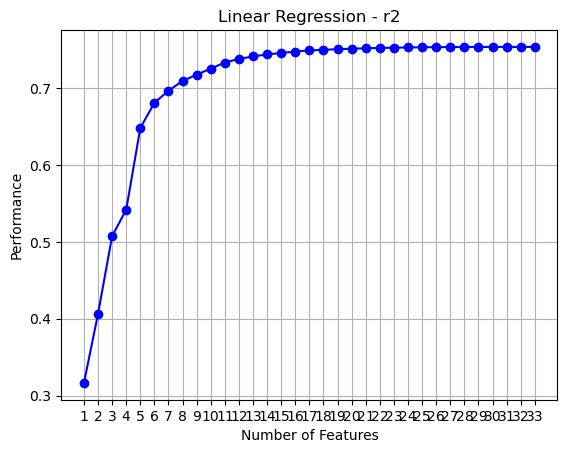

In [229]:
fig1 = plot_sfs(sfs.get_metric_dict(), kind=None)
plt.title('Linear Regression - r2')
plt.grid()
plt.show()

In [230]:
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.linear_model import LinearRegression


# # Generate synthetic dataset
# X, y = make_regression(n_samples=100, n_features=10, noise=0.1, random_state=42)

# # Split dataset into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train = df_ads_v6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
y_train = df_ads_v6['Overall_Product_Visits']

# Initialize a decision tree regressor model
model = DecisionTreeRegressor()

# Initialize Sequential Feature Selector
# sfs = SFS(model, k_features=9, forward=True, floating=True, scoring='r2', cv=0)
sfs = SFS(model, k_features=33, forward=True, verbose=2, scoring='r2', cv=0)

# Perform forward selection
sfs = sfs.fit(X_train, y_train)

# Get selected feature indices
selected_features = list(sfs.k_feature_idx_)

# Get scores for each iteration
scores = sfs.get_metric_dict()


# Print selected feature indices and scores
# for i in range(1, len(scores) + 1):
#     print(f"Iteration {i}: Selected features: {list(scores[i]['feature_idx'])}, Score: {scores[i]['avg_score']}")
    
scores

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.0s finished

[2024-03-11 12:12:48] Features: 1/33 -- score: 1.0[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    0.0s finished

[2024-03-11 12:12:48] Features: 2/33 -- score: 1.0[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.0s finished

[2024-03-11 12:12:48] Features: 3/33 -- score: 1.0[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:  

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s finished

[2024-03-11 12:12:53] Features: 31/33 -- score: 1.0[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s finished

[2024-03-11 12:12:53] Features: 32/33 -- score: 1.0[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished

[2024-03-11 12:12:53] Features: 33/33 -- score: 1.0

{1: {'feature_idx': (1,),
  'cv_scores': array([1.]),
  'avg_score': 1.0,
  'feature_names': ('OrganicSearch_Google_Clicks',),
  'ci_bound': nan,
  'std_dev': 0.0,
  'std_err': nan},
 2: {'feature_idx': (0, 1),
  'cv_scores': array([1.]),
  'avg_score': 1.0,
  'feature_names': ('US Weather Impact Rating', 'OrganicSearch_Google_Clicks'),
  'ci_bound': nan,
  'std_dev': 0.0,
  'std_err': nan},
 3: {'feature_idx': (0, 1, 2),
  'cv_scores': array([1.]),
  'avg_score': 1.0,
  'feature_names': ('US Weather Impact Rating',
   'OrganicSearch_Google_Clicks',
   'OrganicSearch_Google_Position'),
  'ci_bound': nan,
  'std_dev': 0.0,
  'std_err': nan},
 4: {'feature_idx': (0, 1, 2, 3),
  'cv_scores': array([1.]),
  'avg_score': 1.0,
  'feature_names': ('US Weather Impact Rating',
   'OrganicSearch_Google_Clicks',
   'OrganicSearch_Google_Position',
   'Pricing_Total_Installs'),
  'ci_bound': nan,
  'std_dev': 0.0,
  'std_err': nan},
 5: {'feature_idx': (0, 1, 2, 3, 4),
  'cv_scores': array([1.]),


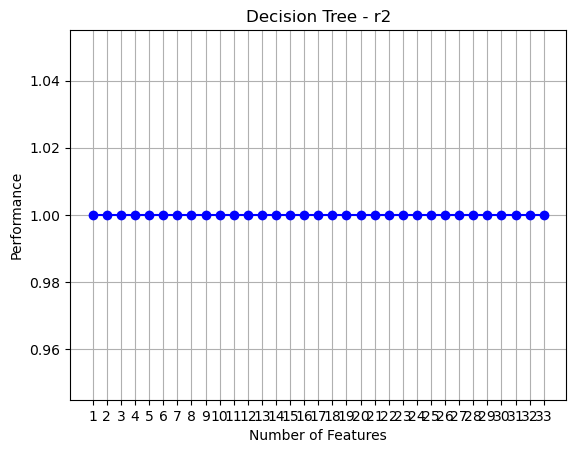

In [231]:
fig1 = plot_sfs(sfs.get_metric_dict(), kind=None)
plt.title('Decision Tree - r2')
plt.grid()
plt.show()

In [232]:
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
# from sklearn.tree import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.linear_model import LinearRegression


# # Generate synthetic dataset
# X, y = make_regression(n_samples=100, n_features=10, noise=0.1, random_state=42)

# # Split dataset into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train = df_ads_v6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
y_train = df_ads_v6['Overall_Product_Visits']

# Initialize a decision tree regressor model
model = RandomForestRegressor()

# Initialize Sequential Feature Selector
# sfs = SFS(model, k_features=9, forward=True, floating=True, scoring='r2', cv=0)
sfs = SFS(model, k_features=33, forward=True, verbose=2, scoring='r2', cv=0)

# Perform forward selection
sfs = sfs.fit(X_train, y_train)

# Get selected feature indices
selected_features = list(sfs.k_feature_idx_)

# Get scores for each iteration
scores = sfs.get_metric_dict()


# Print selected feature indices and scores
# for i in range(1, len(scores) + 1):
#     print(f"Iteration {i}: Selected features: {list(scores[i]['feature_idx'])}, Score: {scores[i]['avg_score']}")
    
scores

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    5.8s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:   10.7s finished

[2024-03-11 12:13:23] Features: 1/33 -- score: 0.8618670093358245[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    8.2s finished

[2024-03-11 12:13:31] Features: 2/33 -- score: 0.9426071928596582[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:   10.4s finished

[2024-03-11 12:13:42] Features: 3/33 -- score: 0.9719974776835432[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  

[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    7.8s finished

[2024-03-11 12:19:22] Features: 28/33 -- score: 0.9798865266575169[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    6.6s finished

[2024-03-11 12:19:29] Features: 29/33 -- score: 0.9793002493372357[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    5.5s finished

[2024-03-11 12:19:35] Features: 30/33 -- score: 0.979516376915026[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.3s finished

[2024-03-11 12:19:39] Features: 31/3

{1: {'feature_idx': (3,),
  'cv_scores': array([0.86186701]),
  'avg_score': 0.8618670093358245,
  'feature_names': ('Pricing_Total_Installs',),
  'ci_bound': nan,
  'std_dev': 0.0,
  'std_err': nan},
 2: {'feature_idx': (3, 14),
  'cv_scores': array([0.94260719]),
  'avg_score': 0.9426071928596582,
  'feature_names': ('Pricing_Total_Installs', 'Usage'),
  'ci_bound': nan,
  'std_dev': 0.0,
  'std_err': nan},
 3: {'feature_idx': (1, 3, 14),
  'cv_scores': array([0.97199748]),
  'avg_score': 0.9719974776835432,
  'feature_names': ('OrganicSearch_Google_Clicks',
   'Pricing_Total_Installs',
   'Usage'),
  'ci_bound': nan,
  'std_dev': 0.0,
  'std_err': nan},
 4: {'feature_idx': (1, 3, 5, 14),
  'cv_scores': array([0.97917045]),
  'avg_score': 0.9791704450556584,
  'feature_names': ('OrganicSearch_Google_Clicks',
   'Pricing_Total_Installs',
   'Preload_IronSource_Aura_impressions',
   'Usage'),
  'ci_bound': nan,
  'std_dev': 0.0,
  'std_err': nan},
 5: {'feature_idx': (1, 3, 5, 11, 14),

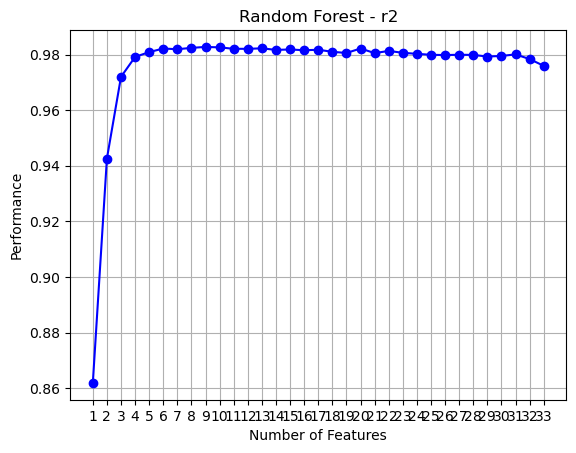

In [233]:
fig1 = plot_sfs(sfs.get_metric_dict(), kind=None)
plt.title('Random Forest - r2')
plt.grid()
plt.show()

In [235]:
def forward_selection(data, target, significance_level=0.05):
    initial_features = data.columns.tolist()
    best_features = []
    while (len(initial_features)>0):
        remaining_features = list(set(initial_features)-set(best_features))
        new_pval = pd.Series(index=remaining_features)
        for new_column in remaining_features:
            model = RandomForestRegressor(target, add_constant(data[best_features+[new_column]])).fit()
            new_pval[new_column] = model.pvalues[new_column]
        min_p_value = new_pval.min()
        if(min_p_value<significance_level):
            best_features.append(new_pval.idxmin())
        else:
            break
    return best_features

X_train = df_ads_v6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
y_train = df_ads_v6['Overall_Product_Visits']

forward_selection(X_train, y_train)

NameError: name 'add_constant' is not defined

In [295]:
df_ads_v5['Overall_Product_Visits'].corr(df_ads_v5['Brand_Spend'])
df_ads_v5['Overall_Product_Visits'].corr(df_ads_v5['Brand_Impressions'])

-0.23585797979633924

In [296]:
from sklearn.feature_selection import mutual_info_regression

In [297]:
X = df_ads_v6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
y = df_ads_v6['Overall_Product_Visits']
mutual_info = mutual_info_regression(X, y)

In [299]:
mutual_info_df = pd.DataFrame({'Features': list(X.columns),
                               'Mutual_Info': mutual_info})
mutual_info_df

,Features,Mutual_Info
0,US Weather Impact Rating,0.201767
1,OrganicSearch_Google_Clicks,0.352618
2,OrganicSearch_Google_Position,0.148867
3,Pricing_Total_Installs,0.462469
4,SEM_Google_Impressions,0.059554
5,Preload_IronSource_Aura_impressions,0.091105
6,Programmatic_Bidease_Clicks,0.088436
7,Preload_Digital_Turbine_launches,0.000000
8,Programmatic_Tapjoy_Clicks,0.054581
9,SEM_Apple_Search_Ads_Impressions,0.077785


In [305]:
mutual_info_df_sorted = mutual_info_df.sort_values(by='Mutual_Info', ascending=False).reset_index(drop=True)
mutual_info_df_sorted

,Features,Mutual_Info
0,Pricing_Total_Installs,0.462469
1,OrganicSearch_Google_Clicks,0.352618
2,US Weather Impact Rating,0.201767
3,OrganicSearch_Google_Position,0.148867
4,Usage,0.144304
5,Seen as experts,0.135173
6,Brand_Impressions,0.109620
7,Programmatic_LiftOff_Impressions,0.104448
8,Preload_IronSource_Aura_impressions,0.091105
9,Preference,0.089280


In [306]:
mutual_info_df_sorted.to_clipboard()

### Lag Analysis

In [111]:
def get_lagged_brand_metrics(df, metric_var, lags):
    added_cols = []
    for metric in metric_var:
        for l in lags:
            if l > 0:
                col_name = str(metric)+ "_lag" + str(l) + "d"
                df[col_name] = df[metric].shift(-l)
                added_cols.append(col_name)
    df.fillna(method='ffill', inplace=True)
    return df, added_cols

In [112]:
lags = [90, 181, 273, 365]
metric = ['Preference', 'Seen as experts', 'Usage']
df_ads_v4_5_lagged, added_cols = get_lagged_brand_metrics(df_ads_v4_5_copy, metric, lags)

In [113]:
added_cols

['Preference_lag90d',
 'Preference_lag181d',
 'Preference_lag273d',
 'Preference_lag365d',
 'Seen as experts_lag90d',
 'Seen as experts_lag181d',
 'Seen as experts_lag273d',
 'Seen as experts_lag365d',
 'Usage_lag90d',
 'Usage_lag181d',
 'Usage_lag273d',
 'Usage_lag365d']

In [121]:
paid_brand_lags = [15, 30, 45, 90, 181, 273, 365]
paid_brand_metric = ['Brand_Impressions']
df_ads_v4_5_lagged, paid_brand_added_cols = get_lagged_brand_metrics(df_ads_v4_5_lagged, paid_brand_metric, paid_brand_lags)

In [122]:
paid_brand_added_cols

['Brand_Impressions_lag15d',
 'Brand_Impressions_lag30d',
 'Brand_Impressions_lag45d',
 'Brand_Impressions_lag90d',
 'Brand_Impressions_lag181d',
 'Brand_Impressions_lag273d',
 'Brand_Impressions_lag365d']

In [116]:
from sklearn.feature_selection import mutual_info_regression
def get_feature_importance_plt(df, x, y, verbose=True):
    importances = mutual_info_regression(df[x], df[y])
    f_imp = {}
    for i in range(len(x)):
        f_imp[x[i]] = importances[i]

    f_imp = pd.DataFrame([f_imp]).T
    f_imp.columns = ['feature importance']
    f_imp.sort_values(by=['feature importance'], ascending=False, inplace=True)
    f_imp.plot(kind='barh', color='teal')
    plt.title('Feature importance ranked')
    plt.tight_layout()
    plt.show()

    if verbose:
        try:
            display(f_imp)
        except:
            print(f_imp)

    return f_imp

In [119]:
f_imp  = get_feature_importance_plt(df_ads_v4_5_lagged, (metric + added_cols), 'Overall_Product_Visits')

,feature importance
Usage,0.143959
Seen as experts,0.135054
Usage_lag90d,0.096059
Seen as experts_lag90d,0.088859
Preference,0.088593
Usage_lag273d,0.078420
Seen as experts_lag273d,0.077587
Usage_lag181d,0.075212
Seen as experts_lag181d,0.074026
Seen as experts_lag365d,0.071852


In [163]:
paid_brand_added_cols

['Brand_Impressions_lag15d',
 'Brand_Impressions_lag30d',
 'Brand_Impressions_lag45d',
 'Brand_Impressions_lag90d',
 'Brand_Impressions_lag181d',
 'Brand_Impressions_lag273d',
 'Brand_Impressions_lag365d']

In [ ]:
['Preference_lag90d',
 'Preference_lag181d',
 'Preference_lag273d',
 'Preference_lag365d',
 'Seen as experts_lag90d',
 'Seen as experts_lag273d',
 'Seen as experts_lag365d',
 'Usage_lag90d',
 'Usage_lag273d',
 'Usage_lag365d',
'Brand_Impressions_lag15d',
 'Brand_Impressions_lag30d',
 'Brand_Impressions_lag45d',
 'Brand_Impressions_lag90d',
 'Brand_Impressions_lag181d',
 'Brand_Impressions_lag273d',
 'Brand_Impressions_lag365d']

In [156]:
v = ['Overall_Product_Visits']  + metric + added_cols
get_feature_importance(df_ads_v4_5_lagged[v], 'Overall_Product_Visits')

,Variable,Importance
0,Preference,43.87
1,Seen as experts_lag181d,26.36
2,Usage_lag181d,16.11
3,Seen as experts_lag365d,3.85
4,Seen as experts,2.10
5,Preference_lag90d,1.98
6,Preference_lag365d,1.21
7,Usage,1.15
8,Seen as experts_lag90d,0.98
9,Usage_lag273d,0.70


In [137]:
res = {}
for var in (metric + added_cols):
    res[var] = {'corr': df_ads_v4_5_lagged['Overall_Product_Visits'].corr(df_ads_v4_5_lagged[var])}
df_corr_lag = pd.DataFrame(res)
df_corr_lag = df_corr_lag.T.reset_index().rename({'index':'Variable'})
df_corr_lag.to_clipboard()

In [124]:
f_imp.to_clipboard()

In [123]:
paid_brand_f_imp  = get_feature_importance_plt(df_ads_v4_5_lagged, (paid_brand_metric + paid_brand_added_cols), 'Overall_Product_Visits')

,feature importance
Brand_Impressions,0.111315
Brand_Impressions_lag90d,0.105784
Brand_Impressions_lag45d,0.091464
Brand_Impressions_lag181d,0.082092
Brand_Impressions_lag30d,0.080769
Brand_Impressions_lag365d,0.069294
Brand_Impressions_lag15d,0.065791
Brand_Impressions_lag273d,0.034657


In [157]:
v = ['Overall_Product_Visits']  + paid_brand_metric + paid_brand_added_cols
get_feature_importance(df_ads_v4_5_lagged[v], 'Overall_Product_Visits')

,Variable,Importance
0,Brand_Impressions_lag181d,20.43
1,Brand_Impressions_lag273d,20.03
2,Brand_Impressions,16.44
3,Brand_Impressions_lag365d,16.14
4,Brand_Impressions_lag90d,10.79
5,Brand_Impressions_lag30d,6.64
6,Brand_Impressions_lag15d,5.41
7,Brand_Impressions_lag45d,4.12


In [126]:
paid_brand_f_imp.sum()

feature importance    0.641166
dtype: float64

In [138]:
res = {}
for var in (paid_brand_metric + paid_brand_added_cols):
    res[var] = {'corr': df_ads_v4_5_lagged['Overall_Product_Visits'].corr(df_ads_v4_5_lagged[var])}
df_corr_lag = pd.DataFrame(res)
df_corr_lag = df_corr_lag.T.reset_index().rename({'index':'Variable'})
df_corr_lag.to_clipboard()

In [125]:
paid_brand_f_imp.to_clipboard()

In [165]:
df_ads_v4_5.shape

(852, 51)

In [164]:
print(df_ads_v4_5_lagged.shape)
df_ads_v4_5_lagged = df_ads_v4_5_lagged.drop(['Preference_lag90d',
 'Preference_lag181d',
 'Preference_lag273d',
 'Preference_lag365d',
 'Seen as experts_lag90d',
 'Seen as experts_lag273d',
 'Seen as experts_lag365d',
 'Usage_lag90d',
 'Usage_lag273d',
 'Usage_lag365d',
'Brand_Impressions_lag15d',
 'Brand_Impressions_lag30d',
 'Brand_Impressions_lag45d',
 'Brand_Impressions_lag90d',
 'Brand_Impressions_lag181d',
 'Brand_Impressions_lag273d',
 'Brand_Impressions_lag365d'], axis=1)
print(df_ads_v4_5_lagged.shape)

(852, 75)
(852, 58)


In [167]:
print(df_ads_v4_5_lagged.shape)
df_ads_v4_5_lagged = df_ads_v4_5_lagged.drop(['Preference_lag91d',
 'Preference_lag92d',
 "['Preference']_lag90d",
 "['Preference']_lag91d",
 "['Preference']_lag92d"], axis=1)
print(df_ads_v4_5_lagged.shape)

(852, 58)
(852, 53)


In [168]:
set(list(df_ads_v4_5_lagged.columns))-set(list(df_ads_v4_5.columns))

{'Seen as experts_lag181d', 'Usage_lag181d'}

In [170]:
df_ads_v4_5_lagged.to_csv(file_path+"TWC_MMM_200324.csv", index=False)

In [169]:
# pip install mlxtend

In [134]:
# Randon Forest - RFE
from sklearn.feature_selection import RFECV 
from sklearn.tree import DecisionTreeRegressor 

X = df_ads_v6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
y = df_ads_v6['Overall_Product_Visits']  # Target variable

# Create a decision tree classifier 
estimator = RandomForestRegressor() 

# Use RFE with cross-validation to 
# find the optimal number of features 
selector = RFECV(estimator, cv=5) 
selector = selector.fit(X, y) 

# Print the optimal number of features 
print("Optimal number of features: %d" % selector.n_features_) 
selected_features = X.columns[selector.support_]
print("Optimal features: %d", selected_features) 

print("")
# Print the selected features 
print("Selected features: %s" % selector.support_) 
print("No. Selected features: %s" % len(selector.support_)) 

Optimal number of features: 11
Optimal features: %d Index(['US Weather Impact Rating', 'OrganicSearch_Google_Clicks',
       'OrganicSearch_Google_Position', 'Pricing_Total_Installs',
       'SEM_Google_Impressions', 'Preload_IronSource_Aura_impressions',
       'Programmatic_Bidease_Clicks', 'Programmatic_Tapjoy_Clicks',
       'Programmatic_LiftOff_Impressions', 'Preference',
       'SocialEng_Facebook_Impressions'],
      dtype='object')

Selected features: [ True  True  True  True  True  True  True False  True False  True False
 False False False  True False  True False False False False False False
 False False False False False False False False False]
No. Selected features: 33


In [133]:
# # print("Selected features: %s" % selector.min_features_to_select) 
# # Select only the relevant features
# X_ = X.values
# X_rfe = X_[:, selector.support_] 

# # Train the final model using the 
# # selected features 
# estimator.fit(X_rfe, y) 
# # Make predictions using the selected features 
# y_pred = estimator.predict(X_rfe)
# # print(y_pred)
# # Calculate mean squared error
# mse = mean_squared_error(y, y_pred)
# print("Mean Squared Error:", mse)

In [154]:
import numpy as np
import pandas as pd
from statsmodels.tsa.stattools import grangercausalitytests

# Generate some sample data
np.random.seed(0)
n = 100
t = np.arange(n)
x = np.random.randn(n)
y = 0.5 * x + np.random.randn(n)  # y is influenced by x

# Create a DataFrame
data = pd.DataFrame({'X': x, 'Y': y})

# Create custom lag variables
max_lag = 2
lagged_data = pd.DataFrame({'Y': y})
for lag in range(1, max_lag + 1):
    lagged_data[f'X_lag{lag}'] = data['X'].shift(-lag)

# Drop rows with NaN values introduced by shifting
lagged_data = lagged_data.fillna(method='ffill')
lagged_data
# Perform the Granger causality test using custom lag variables
test_result = grangercausalitytests(lagged_data[['Y', 'X_lag1']], 2, verbose=True)

# Interpret the results
for lag in range(1, max_lag + 1):
    p_value = test_result[lag][0]['ssr_ftest'][1]  # Get the p-value
    if p_value < 0.05:  # Check if the p-value is significant
        print(f'At lag {lag}, X Granger causes Y (p-value = {p_value})')
    else:
        print(f'At lag {lag}, X does not Granger cause Y (p-value = {p_value})')



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=31.1832 , p=0.0000  , df_denom=96, df_num=1
ssr based chi2 test:   chi2=32.1577 , p=0.0000  , df=1
likelihood ratio test: chi2=27.8468 , p=0.0000  , df=1
parameter F test:         F=31.1832 , p=0.0000  , df_denom=96, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.6563 , p=0.0000  , df_denom=93, df_num=2
ssr based chi2 test:   chi2=32.9961 , p=0.0000  , df=2
likelihood ratio test: chi2=28.4396 , p=0.0000  , df=2
parameter F test:         F=15.6563 , p=0.0000  , df_denom=93, df_num=2
At lag 1, X Granger causes Y (p-value = 2.180679592444194e-07)
At lag 2, X Granger causes Y (p-value = 1.3787988011017242e-06)


In [144]:
lagged_data

In [16]:
def get_data(df):
    var_list = []
    target_var = 'Overall_Product_Visits'
    for col in df.columns:
        if (df[col].dtypes == object) or (df[col].dtypes == str) or (df[col].isin([0, 1]).all()) or (df[col].dtypes == bool) or isinstance(df[col], datetime.date) or pd.api.types.is_datetime64_dtype(df[col]) or (col == target_var):
            continue
        else:
            var_list = var_list + [col]

    X = df[[x for x in df.columns if x in var_list]]
    y = df[target_var]
    return X, y
X, y = get_data(df_ads_v5)

In [79]:
import numpy as np
import pandas as pd
from sklearn.datasets import make_regression
from sklearn.linear_model import LassoCV, RidgeCV
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Generate some sample data
# X, y = make_regression(n_samples=100, n_features=5, noise=0.1, random_state=42)
X, y = get_data(df_ads_v5)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
# X_scaled = X

# X = df_ads_v6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
#        'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
# y = df_ads_v6['Overall_Product_Visits']
# Split the data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Lasso regression with cross-validation for alpha selection
lasso_cv = LassoCV(cv=5)  # Initialize Lasso regression with cross-validation
# lasso_cv = Lasso(alpha=1.0)  # You can adjust the regularization strength (alpha) as needed
lasso_cv.fit(X_scaled, y)
lasso_alpha = lasso_cv.alpha_
lasso_coefs = lasso_cv.coef_

# Ridge regression with cross-validation for alpha selection
ridge_cv = RidgeCV(cv=5)  # Initialize Ridge regression with cross-validation
ridge_cv.fit(X_scaled, y)
ridge_alpha = ridge_cv.alpha_
ridge_coefs = ridge_cv.coef_

# Calculating feature importance
lasso_feature_importance = np.abs(lasso_coefs)
ridge_feature_importance = np.abs(ridge_coefs)

# Creating a DataFrame to display feature importance
feature_names = X.columns
feature_importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Lasso Importance": lasso_feature_importance,
    "Ridge Importance": ridge_feature_importance
}).sort_values(by='Ridge Importance', ascending=False ).reset_index(drop=True)

# # Display the feature importance
# print(feature_importance_df)

# Display selected alpha values
print("Selected alpha for Lasso:", lasso_alpha)
print("Selected alpha for Ridge:", ridge_alpha)

Selected alpha for Lasso: 1664208.985230849
Selected alpha for Ridge: 10.0


In [87]:
import numpy as np
import pandas as pd
from sklearn.datasets import make_regression
from sklearn.linear_model import LassoCV, RidgeCV
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Generate some sample data
# X, y = make_regression(n_samples=100, n_features=5, noise=0.1, random_state=42)
# X, y = get_data(df_ads_v5)
X = df_ads_v6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
y = df_ads_v6['Overall_Product_Visits']
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
# X_scaled = X

# X = df_ads_v6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
#        'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
# y = df_ads_v6['Overall_Product_Visits']
# Split the data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Lasso regression with cross-validation for alpha selection
lasso_cv = LassoCV(cv=5)  # Initialize Lasso regression with cross-validation
# lasso_cv = Lasso(alpha=1.0)  # You can adjust the regularization strength (alpha) as needed
lasso_cv.fit(X_scaled, y)
lasso_alpha = lasso_cv.alpha_
lasso_coefs = lasso_cv.coef_

# Ridge regression with cross-validation for alpha selection
ridge_cv = RidgeCV(cv=5)  # Initialize Ridge regression with cross-validation
ridge_cv.fit(X_scaled, y)
ridge_alpha = ridge_cv.alpha_
ridge_coefs = ridge_cv.coef_

# Calculating feature importance
lasso_feature_importance = np.abs(lasso_coefs)
ridge_feature_importance = np.abs(ridge_coefs)

# Creating a DataFrame to display feature importance
feature_names = X.columns
feature_importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Lasso Importance": lasso_feature_importance,
    "Ridge Importance": ridge_feature_importance
}).sort_values(by='Ridge Importance', ascending=False ).reset_index(drop=True)

# # Display the feature importance
# print(feature_importance_df)

# Display selected alpha values
print("Selected alpha for Lasso:", lasso_alpha)
print("Selected alpha for Ridge:", ridge_alpha)

Selected alpha for Lasso: 1258913.0667140405
Selected alpha for Ridge: 10.0


In [88]:
feature_importance_df[['Feature', 'Ridge Importance']].to_clipboard()

In [89]:
feature_importance_df[['Feature', 'Lasso Importance']].sort_values(by='Lasso Importance', ascending=False ).reset_index(drop=True).to_clipboard()

In [29]:
feature_importance_df.to_clipboard()

In [163]:
# import pandas as pd
# import numpy as np
# from scipy.stats import f_oneway
# from statsmodels.multivariate.manova import MANOVA

# # Assuming you have a DataFrame called 'data' with dependent variable 'y' and 50 independent variables 'X1', 'X2', ..., 'X50'
# # Example DataFrame:
# # data = pd.DataFrame({'y': dependent_variable_array, 'X1': independent_variable_1_array, ..., 'X50': independent_variable_50_array})
# data = df_ads_v6.copy()
# data.columns = data.columns.str.replace(' ', '_')
# data.columns = data.columns.str.replace('.', '_')

# # Extract the dependent variable and independent variables
# X = data.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
#        'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
# y = data['Overall_Product_Visits']

# # Perform MANOVA
# manova = MANOVA.from_formula(formula=" + ".join(X.columns) + " ~ y", data=data)

# # Print MANOVA results
# print(manova.mv_test())


# # Alternatively, you can also use scipy's f_oneway function for each independent variable separately
# p_values = []
# for column in X.columns:
#     p_value = f_oneway(data[column][data['y'] == 0], data[column][data['y'] == 1], data[column][data['y'] == 2]).pvalue
#     p_values.append(p_value)

# # Print p-values for each independent variable
# for idx, p_value in enumerate(p_values):
#     print(f'Independent variable X{idx+1}: p-value = {p_value:.4f}')


In [117]:
# import pandas as pd
# import numpy as np
# import statsmodels.api as sm
# from statsmodels.multivariate.manova import MANOVA

# # Sample data
# data = pd.DataFrame({
#     'X1': np.random.normal(0, 1, 100),
#     'X2': np.random.normal(0, 1, 100),
#     'X3': np.random.normal(0, 1, 100),
#     'Group': np.random.choice(['A', 'B', 'C'], 100)
# })

# # MANOVA
# maov = MANOVA.from_formula('X1 + X2 + X3 ~ Group', data=data)

# # Print Wilks' lambda test statistics
# print(maov.mv_test())

# # Print p-values
# print(maov.mv_test().results['Group']['stat'].values[0])


In [98]:
# import numpy as np
# import pandas as pd
# from sklearn.datasets import make_regression
# from sklearn.linear_model import LassoCV, RidgeCV
# from sklearn.model_selection import train_test_split

# # Generate some sample data
# X, y = make_regression(n_samples=100, n_features=5, noise=0.1, random_state=42)

# # Split the data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Lasso regression with cross-validation for alpha selection
# lasso_cv = LassoCV(cv=5)  # Initialize Lasso regression with cross-validation
# lasso_cv.fit(X_train, y_train)
# lasso_alpha = lasso_cv.alpha_
# lasso_coefs = lasso_cv.coef_

# # Ridge regression with cross-validation for alpha selection
# ridge_cv = RidgeCV(cv=5)  # Initialize Ridge regression with cross-validation
# ridge_cv.fit(X_train, y_train)
# ridge_alpha = ridge_cv.alpha_
# ridge_coefs = ridge_cv.coef_

# # Calculating feature importance
# lasso_feature_importance = np.abs(lasso_coefs)
# ridge_feature_importance = np.abs(ridge_coefs)

# # Creating a DataFrame to display feature importance
# feature_names = [f"Feature_{i}" for i in range(X.shape[1])]
# feature_importance_df = pd.DataFrame({
#     "Feature": feature_names,
#     "Lasso Importance": lasso_feature_importance,
#     "Ridge Importance": ridge_feature_importance
# })

# # Display the feature importance
# print(feature_importance_df)

# # Display selected alpha values
# print("Selected alpha for Lasso:", lasso_alpha)
# print("Selected alpha for Ridge:", ridge_alpha)


In [140]:
import pandas as pd
from scipy.stats import f_oneway

# Assuming you have a DataFrame called 'data' with your independent variables and dependent variable
# 'independent_vars' is a list of column names for your independent variables
# 'dependent_var' is the column name for your dependent variable

data = df_ads_v5.drop(columns=['Date', 'EventsCamp/Vend_Campaign_Flag',
                                  'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])

independent_vars = list(data.drop(columns=['Overall_Product_Visits']).columns) # ['independent_var1', 'independent_var2', ...]  # list of independent variable names
dependent_var = 'Overall_Product_Visits' # 'dependent_var'  # name of dependent variable column

# Perform ANOVA for each independent variable
anova_res = {}
for var in independent_vars:
    # Extract the data for the current independent variable and dependent variable
#     group_data = [group[1][dependent_var] for group in data.groupby(var)]
# #     print("**********",var)
# #     print(group_data)
    
#     # Perform one-way ANOVA
#     f_statistic, p_value = f_oneway(*group_data)
    
    f_statistic, p_value = f_oneway(data[var], data[dependent_var])
    
    # Print results
    # print(f"ANOVA for {var}: F-value = {f_statistic}, p-value = {p_value}")
    
    anova_res[var] = {
            "f-value": f_statistic,
            "p-value": p_value
        }
anova_res_df = pd.DataFrame(anova_res).T.round(2)
anova_res_df

,f-value,p-value
US Weather Impact Rating,15692.06,0.0
OrganicSearch_Google_Clicks,14502.63,0.0
OrganicSearch_Google_Position,15692.06,0.0
Pricing_Total_Installs,15669.26,0.0
SEM_Google_Spend,15689.74,0.0
SEM_Google_Impressions,15578.76,0.0
Preload_IronSource_Aura_Spend,15691.47,0.0
Preload_IronSource_Aura_impressions,15667.97,0.0
Programmatic_Bidease_Spend,15691.84,0.0
Programmatic_Bidease_Clicks,15689.72,0.0


In [141]:
anova_res_df.to_clipboard()

In [105]:
import pandas as pd
from scipy.stats import f_oneway

df_new = df_ads_v5.drop(columns=['Date', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features

# Define your target variable
target_variable = "Overall_Product_Visits"

# Initialize a dictionary to store ANOVA results
anova_results = {}

# Loop through each column (excluding the target variable)
for column in df_new.columns:
    if column != target_variable:
        # Perform one-way ANOVA
        anova_result = f_oneway(df_new[column], df_new[target_variable])
        # Store the ANOVA result
        anova_results[column] = {
            "F-value": anova_result.statistic,
            "p-value": anova_result.pvalue
        }

# Convert the dictionary to a DataFrame for easier analysis
anova_df = pd.DataFrame(anova_results).T
print(anova_df)


                                                F-value  p-value
US Weather Impact Rating                   15692.063682      0.0
OrganicSearch_Google_Clicks                14502.634613      0.0
OrganicSearch_Google_Position              15692.061943      0.0
Pricing_Total_Installs                     15669.259887      0.0
SEM_Google_Spend                           15689.737801      0.0
SEM_Google_Impressions                     15578.762357      0.0
Preload_IronSource_Aura_Spend              15691.471068      0.0
Preload_IronSource_Aura_impressions        15667.974100      0.0
Programmatic_Bidease_Spend                 15691.837952      0.0
Programmatic_Bidease_Clicks                15689.721791      0.0
Preload_Digital_Turbine_Spend              15691.727760      0.0
Preload_Digital_Turbine_launches           15692.059792      0.0
Programmatic_Tapjoy_Spend                  15692.047559      0.0
Programmatic_Tapjoy_Clicks                 15691.917895      0.0
SEM_Apple_Search_Ads_Spen

In [118]:
import pandas as pd
import statsmodels.api as sm

# Assuming you have a DataFrame called 'data' with dependent variable 'y' and 50 independent variables 'X1', 'X2', ..., 'X50'
# Example DataFrame:
# data = pd.DataFrame({'y': dependent_variable_array, 'X1': independent_variable_1_array, ..., 'X50': independent_variable_50_array})

# Extract the dependent variable and independent variables
X = df_ads_v6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
y = df_ads_v6['Overall_Product_Visits']

# Add a constant term to the independent variables (intercept term)
X = sm.add_constant(X)

# Fit the multiple linear regression model
model = sm.OLS(y, X).fit()

# Get the summary of the regression model
print(model.summary())

# Extract p-values for each independent variable
p_values = model.pvalues[1:]  # Exclude the constant term (intercept)
cols = list(X.columns)
# Print p-values for each independent variable
for idx, p_value in enumerate(p_values):
    print(f'{cols[idx+1]}: p-value = {p_value:.4f}')


                              OLS Regression Results                              
Dep. Variable:     Overall_Product_Visits   R-squared:                       0.754
Model:                                OLS   Adj. R-squared:                  0.744
Method:                     Least Squares   F-statistic:                     76.01
Date:                    Wed, 06 Mar 2024   Prob (F-statistic):          6.98e-224
Time:                            12:57:20   Log-Likelihood:                -14436.
No. Observations:                     852   AIC:                         2.894e+04
Df Residuals:                         818   BIC:                         2.910e+04
Df Model:                              33                                         
Covariance Type:                nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------

In [161]:
import numpy as np
from scipy.stats import pearsonr

X = df_ads_v6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
       'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
y = df_ads_v6['Overall_Product_Visits']

p_value_dict = {}
# Calculate Pearson correlation coefficient and p-value
for var in list(X.columns):
    independent_variable = df_ads_v6[var]
    correlation_coefficient, p_value = pearsonr(independent_variable, y)

    # Print results
    # print("Pearson correlation coefficient:", correlation_coefficient)
    # print(var,": ", round(p_value,3))
    
    p_value_dict[var] = {'p-value': round(p_value,3)}
    
p_value_df = pd.DataFrame(p_value_dict).T
p_value_df

,p-value
US Weather Impact Rating,0.000
OrganicSearch_Google_Clicks,0.000
OrganicSearch_Google_Position,0.000
Pricing_Total_Installs,0.000
SEM_Google_Impressions,0.002
Preload_IronSource_Aura_impressions,0.000
Programmatic_Bidease_Clicks,0.828
Preload_Digital_Turbine_launches,0.026
Programmatic_Tapjoy_Clicks,0.000
SEM_Apple_Search_Ads_Impressions,0.000


In [162]:
p_value_df.to_clipboard()

In [149]:
# pip install pymc3

In [150]:
# df_ads_v6.to_csv(file_path+"df_ads_v6.csv", index=False)

In [151]:
# import numpy as np
# import pymc3 as pm

# # Generate some example data
# # np.random.seed(42)
# # x = np.random.normal(size=100)
# # y = 2 * x + np.random.normal(size=100)

# x = df_ads_v6.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
#        'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag', 'Event_Name'])  # Features
# y = df_ads_v6['Overall_Product_Visits']

# # Define Bayesian linear regression model
# with pm.Model() as model:
#     # Priors
#     alpha = pm.Normal('alpha', mu=0, sd=10)
#     beta = pm.Normal('beta', mu=0, sd=10)
#     sigma = pm.HalfNormal('sigma', sd=1)

#     # Expected value of outcome
#     mu = alpha + beta * x

#     # Likelihood
#     likelihood = pm.Normal('y', mu=mu, sd=sigma, observed=y)

#     # MCMC sampling
#     trace = pm.sample(1000, tune=1000)

# # Get summary statistics of the posterior distribution
# summary = pm.summary(trace)

# # Extract p-values from the summary
# p_values = summary['p_value']

# # Print p-values for the coefficients
# print("P-values for coefficients:")
# print(p_values)


In [152]:
# pip install --upgrade scikit-learn

In [155]:
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.feature_selection import RFE
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import mean_squared_error

# # X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# X = df_ads_v5.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
#        'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag',
#        'Event_Name'])  # Features
# y = df_ads_v5['Overall_Product_Visits']  # Target variable

# # Initialize Random Forest regressor
# rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)

# # Initialize RFE
# rfe = RFE(estimator=rf_regressor, n_features_to_select=10, step=1)

# # Fit RFE
# rfe.fit(X, y)

# # Get selected features
# # selected_features = rfe.support_

In [156]:
# rf_regressor

In [158]:
# selected_features = X.columns[rfe.support_]
# selected_features

In [159]:
# X[list(selected_features)]

In [157]:

# print(X[list(selected_features)], y)
# # Train Random Forest regressor on selected features
# rf_regressor.fit(X[list(selected_features)], y)

# # Predict on the test set
# y_pred = rf_regressor.predict(X[:, selected_features])

# # Calculate mean squared error
# mse = mean_squared_error(y, y_pred)
# print("Mean Squared Error:", mse)


In [101]:
# from sklearn.datasets import make_regression
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.feature_selection import RFE
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import mean_squared_error

# # Generate synthetic dataset
# X, y = make_regression(n_samples=1000, n_features=20, noise=0.1, random_state=42)
# X = df_ads_v5.drop(columns=['Date', 'Overall_Product_Visits', 'EventsCamp/Vend_Campaign_Flag',
#        'EventsCamp/Vend_Campaign/Vendor(s)', 'Critical_Event_Flag',
#        'Event_Name'])  # Features
# y = df_ads_v5['Overall_Product_Visits']
# # Split data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Initialize Random Forest regressor
# rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)

# # Initialize RFE
# rfe = RFE(estimator=rf_regressor, n_features_to_select=10, step=1)

# # Fit RFE
# rfe.fit(X, y)

# # Get selected features
# selected_features = rfe.support_

# # Train Random Forest regressor on selected features
# rf_regressor.fit(X[:, selected_features], y)

# # Predict on the test set
# y_pred = rf_regressor.predict(X[:, selected_features])

# # Calculate mean squared error
# mse = mean_squared_error(y, y_pred)
# print("Mean Squared Error:", mse)


In [102]:
# from sklearn.datasets import make_regression
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.feature_selection import RFE
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import mean_squared_error

# # Generate synthetic dataset
# X, y = make_regression(n_samples=1000, n_features=20, noise=0.1, random_state=42)

# # Split data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Initialize Random Forest regressor
# rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)

# # Initialize RFE
# rfe = RFE(estimator=rf_regressor, n_features_to_select=10, step=1)

# # Fit RFE
# rfe.fit(X_train, y_train)

# # Get scores for each step
# step_scores = rfe.estimator_.feature_importances_

# # Print scores for each feature
# print("Feature Scores:")
# for feature, score in zip(range(len(step_scores)), step_scores):
#     print(f"Feature {feature+1}: {score}")

# # Get selected features
# selected_features = rfe.support_

# # Train Random Forest regressor on selected features
# rf_regressor.fit(X_train[:, selected_features], y_train)

# # Predict on the test set
# y_pred = rf_regressor.predict(X_test[:, selected_features])

# # Calculate mean squared error
# mse = mean_squared_error(y_test, y_pred)
# print("Mean Squared Error:", mse)


In [103]:
# step_scores

In [40]:
df_ads_v3[['Date', 'SocialEng_LinkedIn_Impressions',
       'SocialEng_LinkedIn_Total_Engagements',
       'SocialEng_LinkedIn_Estimated_Clicks']]

,Date,SocialEng_LinkedIn_Impressions,SocialEng_LinkedIn_Total_Engagements,SocialEng_LinkedIn_Estimated_Clicks
0,2021-09-01,107826.0,1804.0,1258.0
1,2021-09-02,88570.0,1525.0,1681.0
2,2021-09-03,64859.0,1317.0,258.0
3,2021-09-04,229.0,31.0,33.0
4,2021-09-05,189.0,8.0,9.0
...,...,...,...,...
847,2023-12-27,68704.5,1217.0,363.5
848,2023-12-28,68704.5,1217.0,363.5
849,2023-12-29,68704.5,1217.0,363.5
850,2023-12-30,68704.5,1217.0,363.5


In [56]:
df_ads_v4[['Date', 'SocialEng_LinkedIn_Impressions',
       'SocialEng_LinkedIn_Total_Engagements',
       'SocialEng_LinkedIn_Estimated_Clicks']]

,Date,SocialEng_LinkedIn_Impressions,SocialEng_LinkedIn_Total_Engagements,SocialEng_LinkedIn_Estimated_Clicks
0,2021-09-01,107826.000000,1804.000000,1258.000000
1,2021-09-02,88570.000000,1525.000000,1681.000000
2,2021-09-03,64859.000000,1317.000000,258.000000
3,2021-09-04,229.000000,31.000000,33.000000
4,2021-09-05,189.000000,8.000000,9.000000
...,...,...,...,...
847,2023-12-27,140822.965986,1688.879252,2375.496599
848,2023-12-28,140822.965986,1688.879252,2375.496599
849,2023-12-29,140822.965986,1688.879252,2375.496599
850,2023-12-30,140822.965986,1688.879252,2375.496599


In [46]:
df_ads[['Date', 'SocialEng_LinkedIn_Impressions',
       'SocialEng_LinkedIn_Total_Engagements',
       'SocialEng_LinkedIn_Estimated_Clicks']].mean()

SocialEng_LinkedIn_Impressions          140822.965986
SocialEng_LinkedIn_Total_Engagements      1688.879252
SocialEng_LinkedIn_Estimated_Clicks       2375.496599
dtype: float64

In [62]:
missing_dates = check_data(df_ads_v3, 'Date')

No. of Unique Dates:  852
Data in terms of years:  2.334246575342466
Min. Date:  01-09-2021 , Max. Date:  31-12-2023
Continuity Check for Data: {'Date': True}
Missing Dates: DatetimeIndex([], dtype='datetime64[ns]', freq=None)


In [63]:
df_result = dataset_stats(df_ads_v3, 'Date')
df_result.to_csv(file_path+"Final_merged_data_statistics_pre_processed_aggregated_15_02_24.csv", index=True)

In [16]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns

def millions_formatter(x, pos):
    return f'{x / 1e6:.0f}'

def thousands_formatter(x, pos):
    return f'{x / 1e3:,.0f}'

def trend_chart_(df_, cols, chart_title, date_var):
    df_['Date'] = pd.to_datetime(df_['Date'])
    temp=df_.copy()
    min_date = temp[date_var].min()
    max_date = temp[date_var].max()
    date_range = pd.date_range(start=min_date, end=max_date, freq='D')
#     df_['flag']=1
    df_temp_flag = pd.DataFrame({'Date':date_range,
                                'flag':0})
    df_=pd.merge(df_,df_temp_flag,on='Date',how='outer')
    print(df_[cols[0]].corr(df_[cols[1]]))
    for idx, var in  enumerate(cols):
        %matplotlib inline
#         print(var)
#         plt.figure(figsize=(20, 3))
        df_=df_.fillna(0)
        plt.figure(figsize=(12, 1))
        sns.lineplot(df_[date_var], df_[var], color='#ff5c8d')
#         sns.lineplot(df_temp_flag['Date'], df_temp_flag['flag'], color='white')
#         sns.lineplot(df_temp_flag['Date'], df_temp_flag['flag'], color='white')
        plt.title('Trend: '+chart_title[idx])
#         if ch not in ['Google', 'Bidease', 'LiftOff']:
#         formatter = mtick.StrMethodFormatter("{x:,.0f}")
#         plt.gca().yaxis.set_major_formatter(formatter)
        if var == 'Overall_Product_Visits' or var == 'Apps_TWC Universal iOS 4G+_Visits':
            plt.gca().yaxis.set_major_formatter(millions_formatter)
        else:
            plt.gca().yaxis.set_major_formatter(thousands_formatter)
#         plt.xlabel(date_var)
        plt.xlabel(None)
        plt.ylabel(None)
#         plt.ylabel(chart_title[idx]+" (in $)")
#         plt.ylabel(chart_title[idx])
#         plt.xticks(rotation=45)
        plt.grid(False)
#         plt.subplots_adjust(left=0.2)  # Adjust as needed

#         plt.legend(loc='upper right')
#         plt.tight_layout()
#         display(HTML("<style>.output_png { display: table-cell; text-align: right; vertical-align: right; }</style>"))

        plt.show()

In [10]:
df_ = df_ads_v2.copy()
goal_var = [col for col in df_.columns if '_Goal' in col]

In [11]:
date_var = ['Date', 'Year', 'Quarter']
temp_var = ['Partner_Visits_Overall_(Desktop&Mobile)', 'Apps_TWC Universal Android 4G+_Goal','Apps_TWC Universal iOS 4G+_Goal', 'MobileWeb_TWC Mobile Web_Goal', 'Web_TWC Web_Goal', 
            'Likelihood to recommend', 'EventsCamp/Vend_Campaign/Vendor(s)', 'Event_Name', 'Apps_TWC Universal Android 4G+_Visits','Apps_TWC Universal iOS 4G+_Visits','MobileWeb_TWC Mobile Web_Visits','Web_TWC Web_Visits']
cols = list(df_.columns)
remove_var = date_var+temp_var
cols = [item for item in cols if item not in remove_var]
chart_title = cols

Overall_Product_Visits


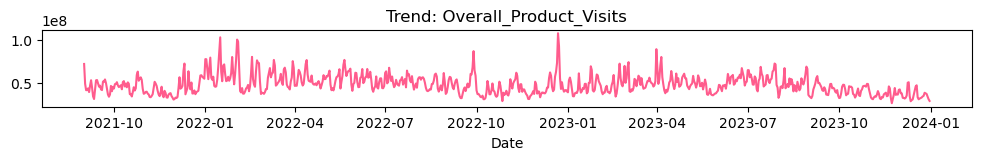

Overall_Product_Goal


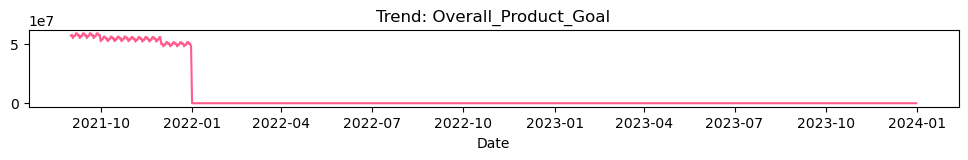

US Weather Impact Rating


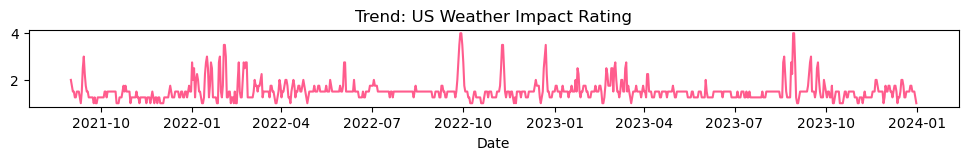

OrganicSearch_Google_Clicks


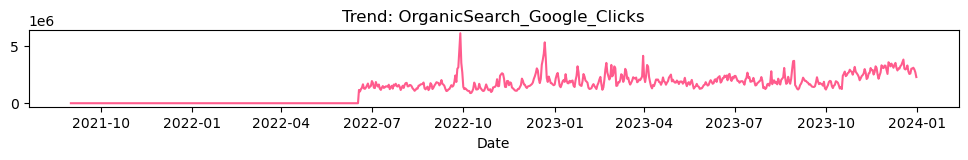

OrganicSearch_Google_Impressions


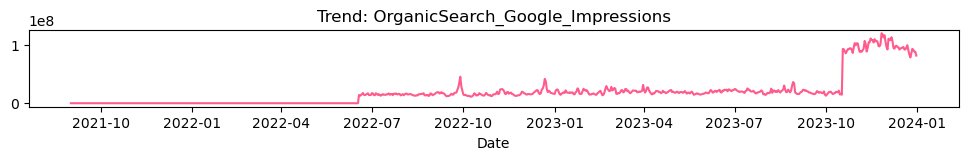

OrganicSearch_Google_CTR


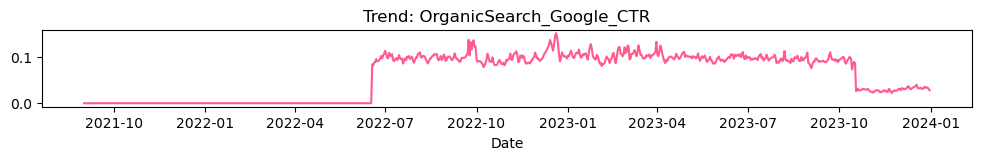

OrganicSearch_Google_Position


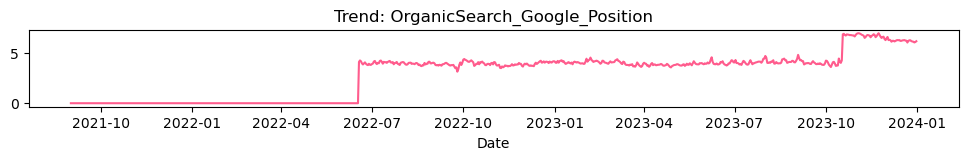

SEO_Clicks_OrganicSearch_Desktop_MobileWeb(Combined)


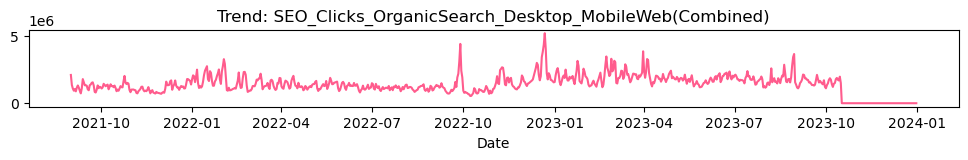

Pricing_Android_Installs


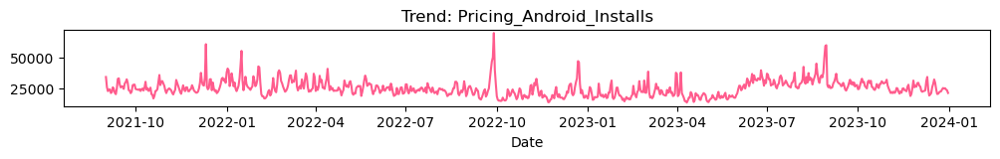

Pricing_iOS_Installs


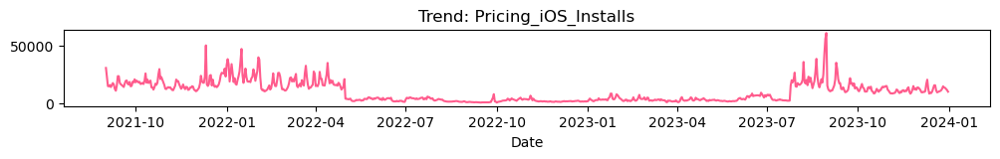

Pricing_Total_Installs


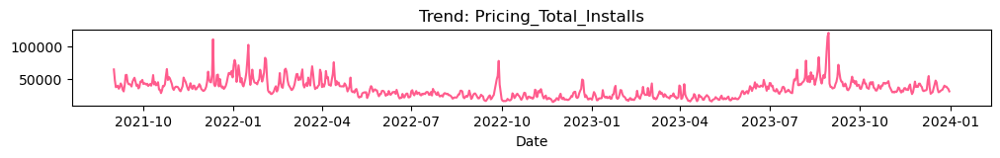

SEM_Google_Android_Spend


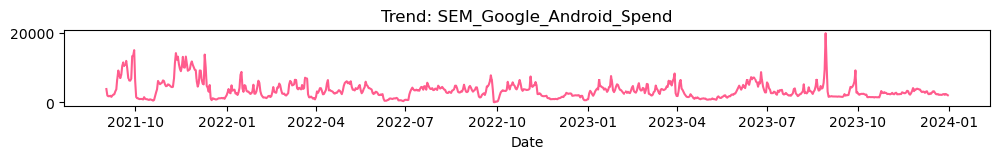

SEM_Google_Android_Clicks


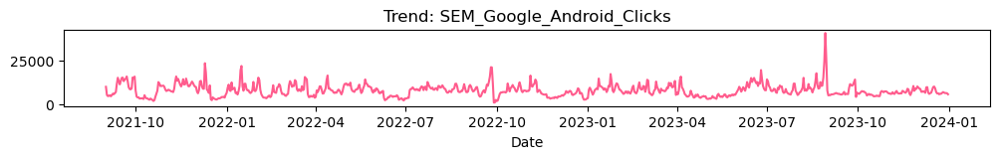

SEM_Google_Android_Impressions


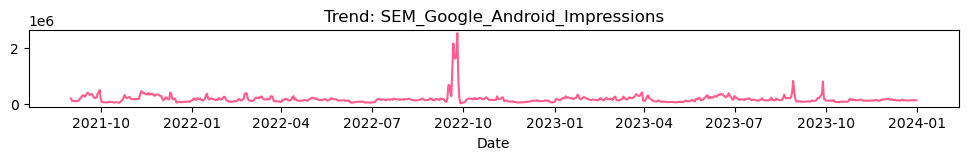

SEM_Google_iOS_Spend


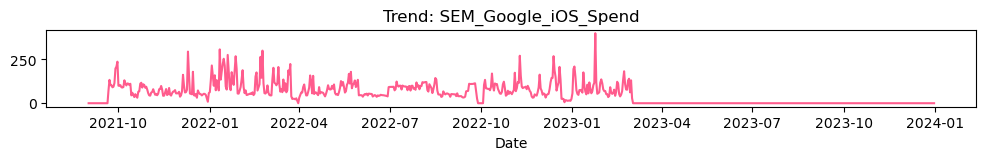

SEM_Google_iOS_Clicks


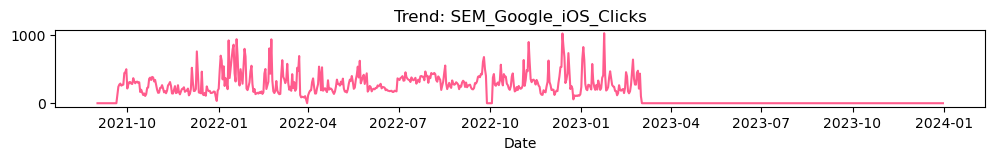

SEM_Google_iOS_Impressions


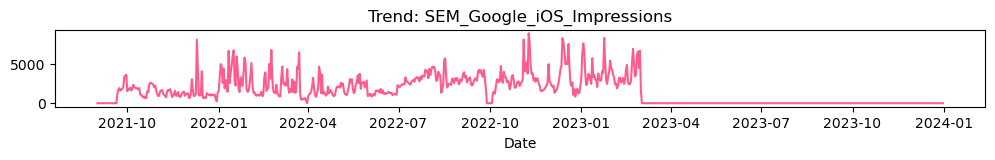

Preload_IronSource_Aura_Android_Spend


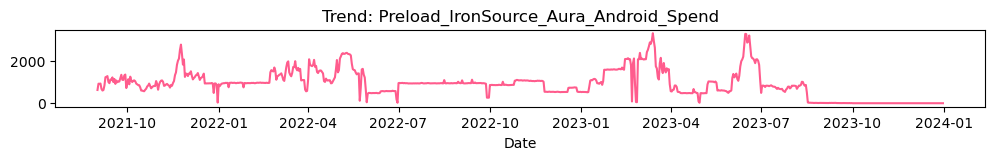

Preload_IronSource_Aura_Android_launches


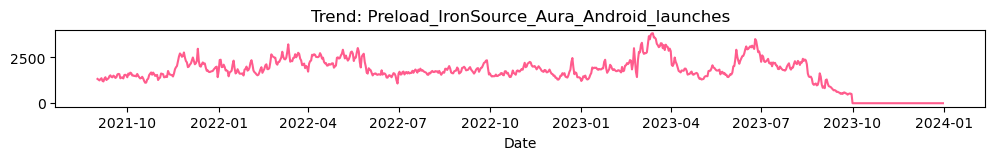

Preload_IronSource_Aura_Android_impressions


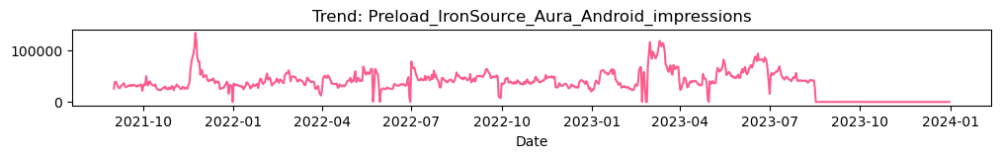

Preload_IronSource_Aura_Android_app_downloads


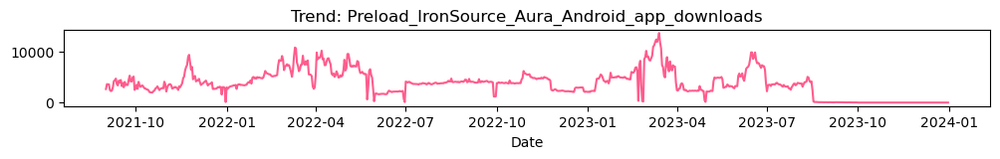

Programmatic_Bidease_Android_Spend


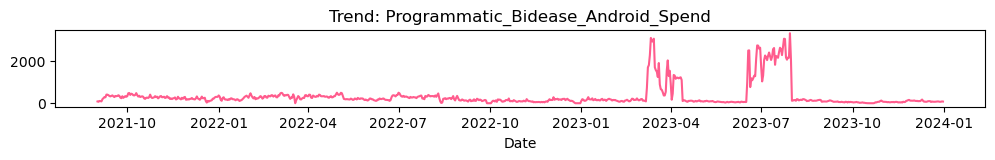

Programmatic_Bidease_Android_Clicks


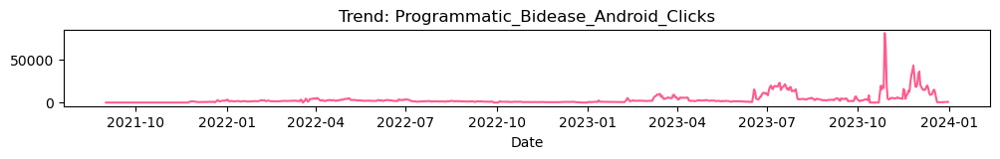

Programmatic_Bidease_Android_Impressions


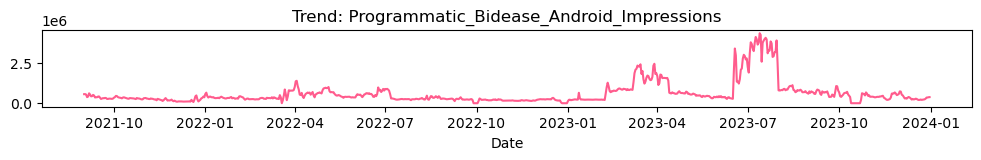

Programmatic_Bidease_iOS_Spend


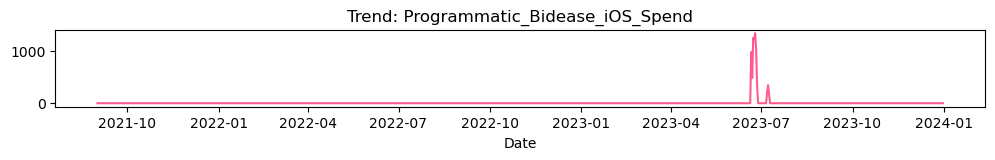

Programmatic_Bidease_iOS_Clicks


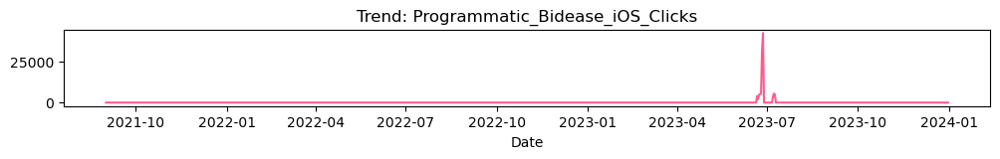

Programmatic_Bidease_iOS_Impressions


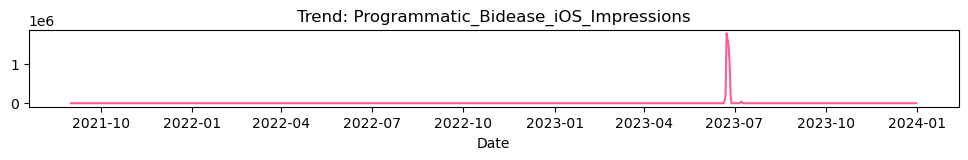

Preload_Digital_Turbine_Android_Spend


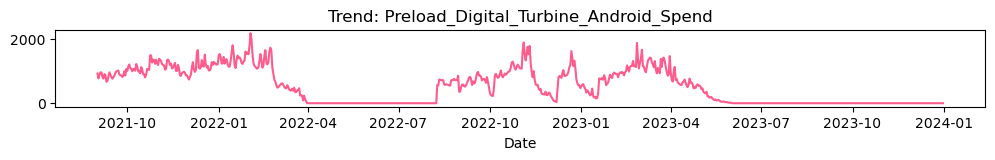

Preload_Digital_Turbine_Android_launches


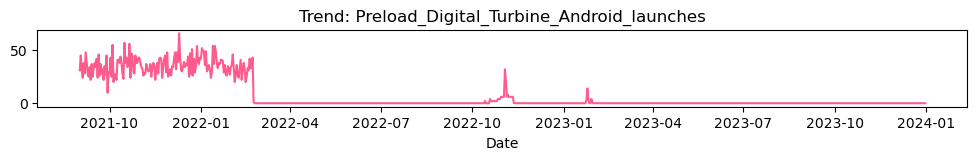

Preload_Digital_Turbine_Android_impressions


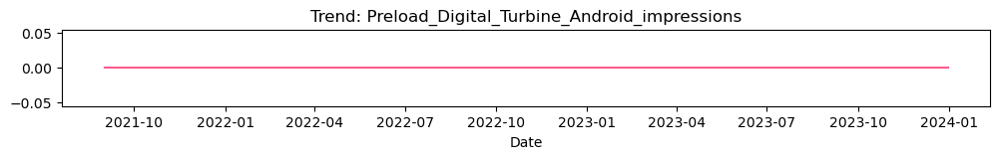

Preload_Digital_Turbine_Android_app_downloads


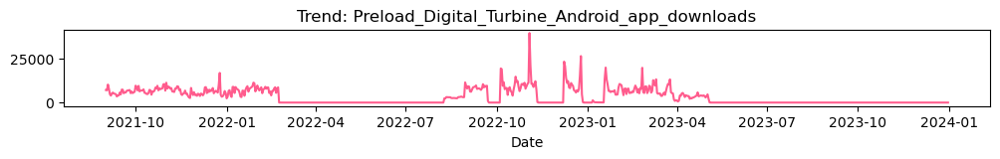

Programmatic_Tapjoy_Android_Spend


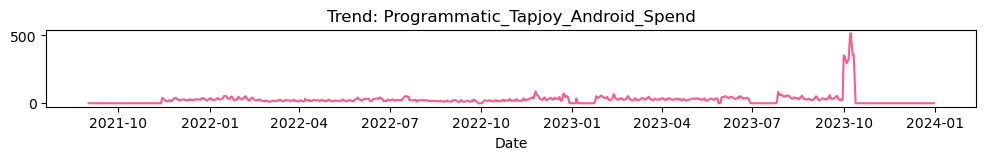

Programmatic_Tapjoy_Android_Clicks


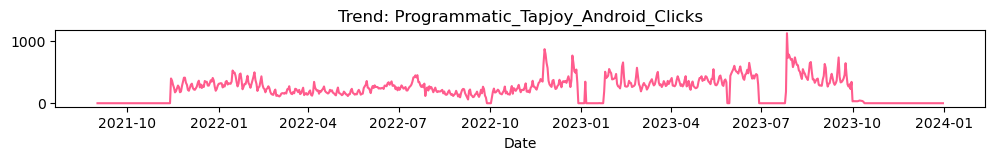

Programmatic_Tapjoy_Android_Impressions


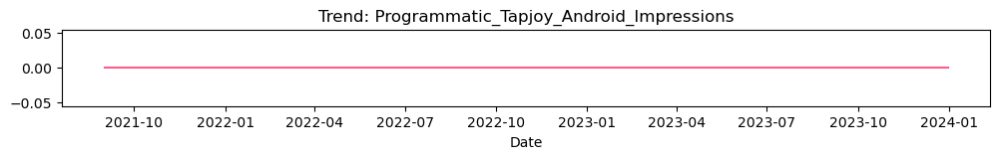

SEM_Apple_Search_Ads_iOS_Spend


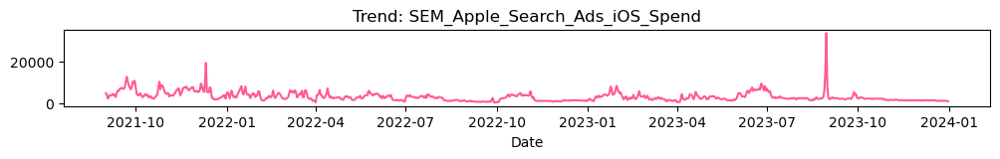

SEM_Apple_Search_Ads_iOS_Clicks


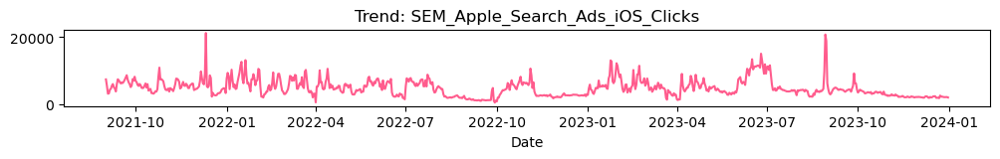

SEM_Apple_Search_Ads_iOS_Impressions


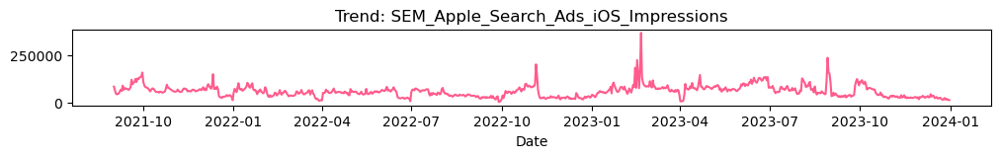

Programmatic_LiftOff_Android_Spend


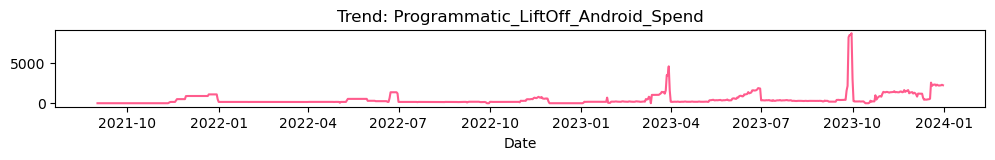

Programmatic_LiftOff_Android_Clicks


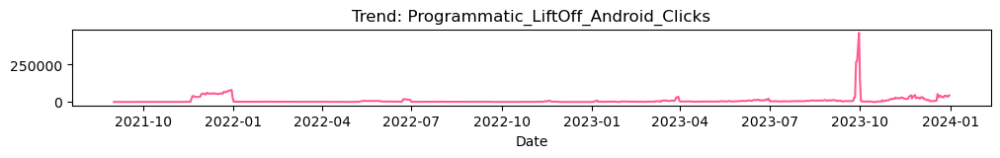

Programmatic_LiftOff_Android_Impressions


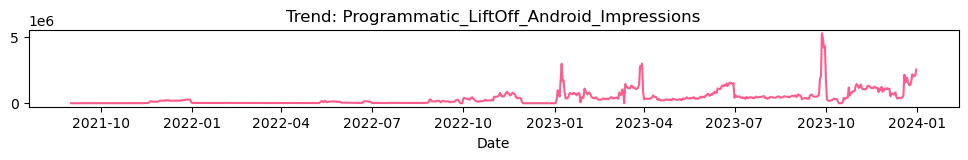

Programmatic_LiftOff_iOS_Spend


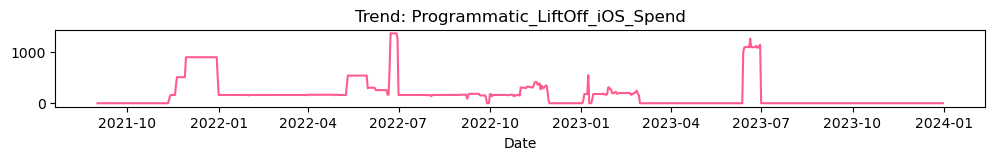

Programmatic_LiftOff_iOS_Clicks


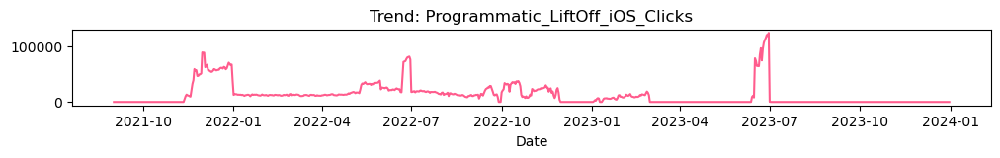

Programmatic_LiftOff_iOS_Impressions


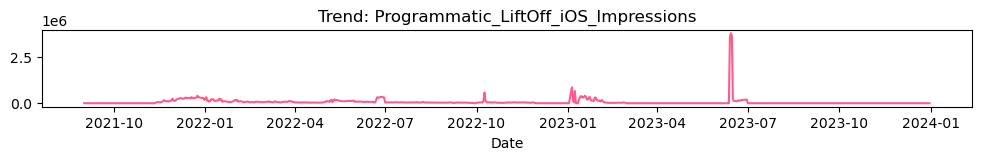

Programmatic_IronSource_Sonic_Android_Spend


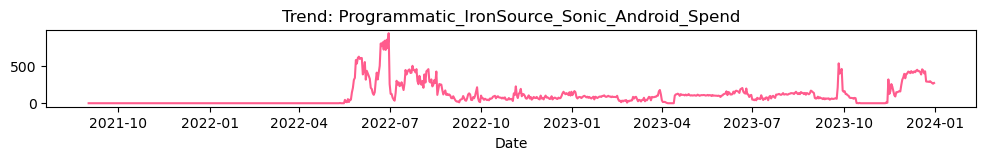

Programmatic_IronSource_Sonic_Android_Clicks


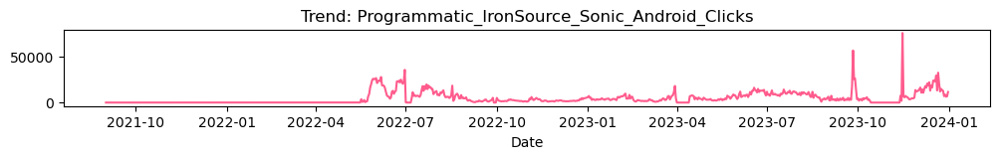

Programmatic_IronSource_Sonic_Android_Impressions


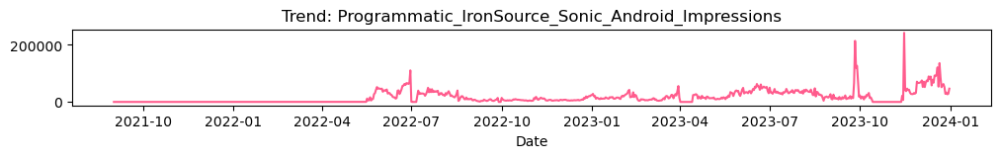

Programmatic_IronSource_Sonic_iOS_Spend


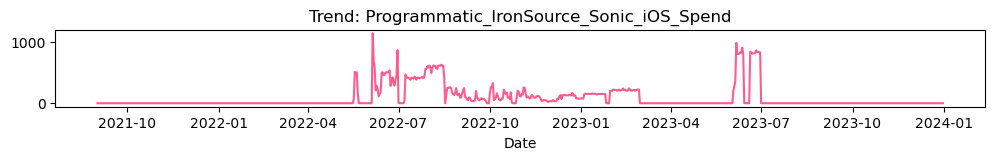

Programmatic_IronSource_Sonic_iOS_Clicks


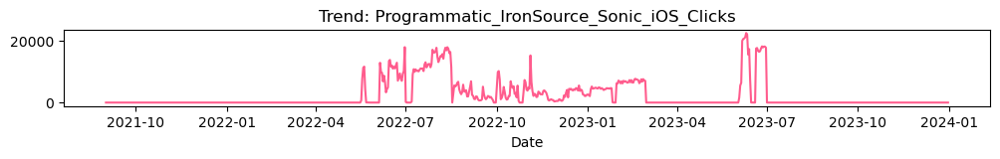

Programmatic_IronSource_Sonic_iOS_Impressions


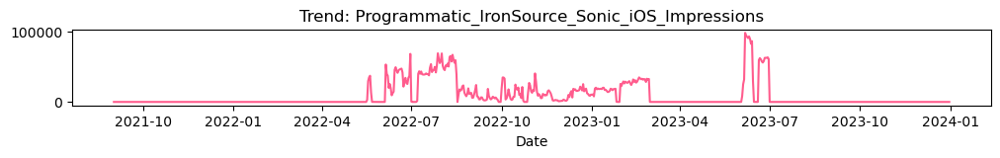

PaidSocial_Twitter_Android_Spend


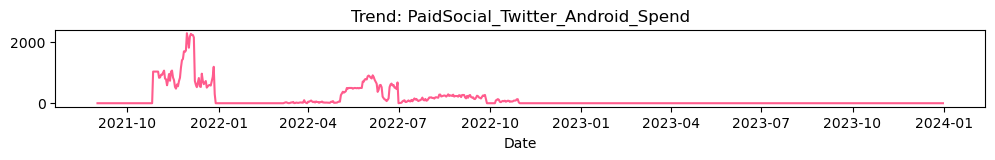

PaidSocial_Twitter_Android_Clicks


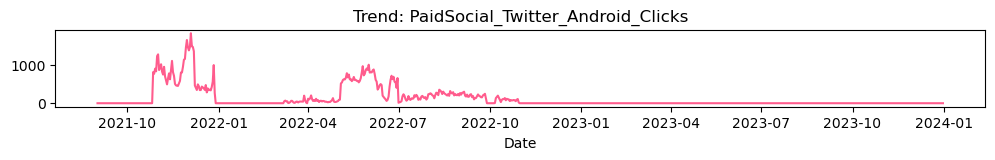

PaidSocial_Twitter_Android_Impressions


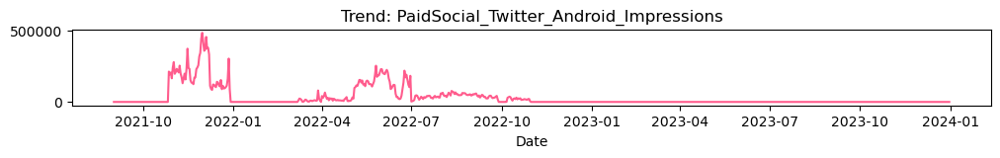

PaidSocial_Twitter_iOS_Spend


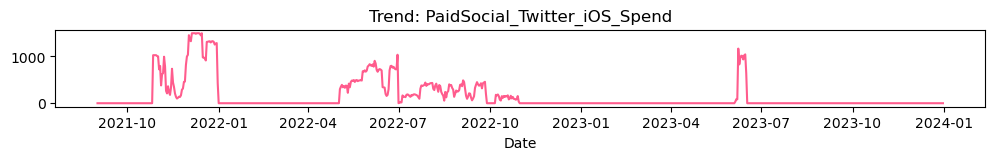

PaidSocial_Twitter_iOS_Clicks


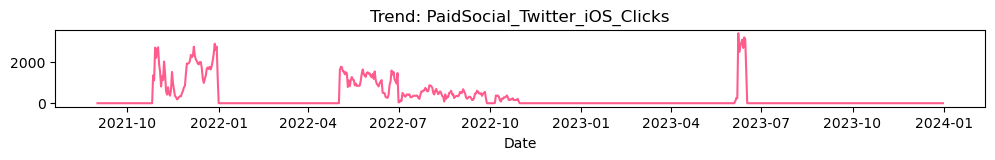

PaidSocial_Twitter_iOS_Impressions


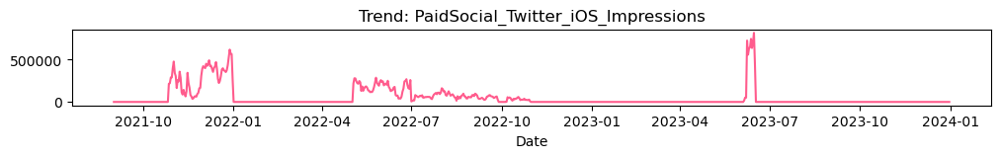

Programmatic_TikTok_Android_Spend


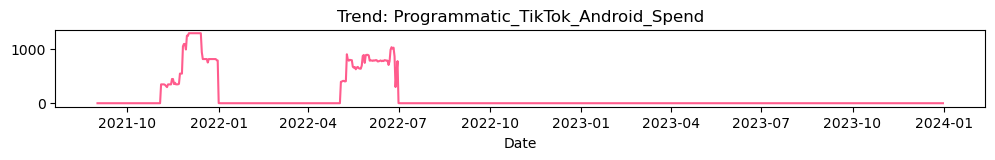

Programmatic_TikTok_Android_Clicks


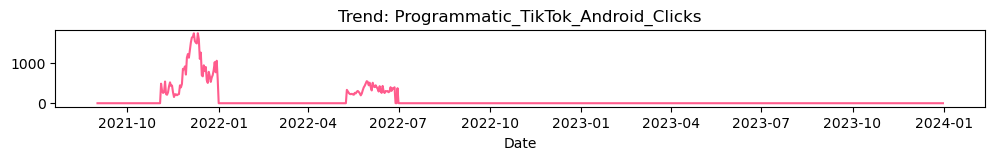

Programmatic_TikTok_Android_Impressions


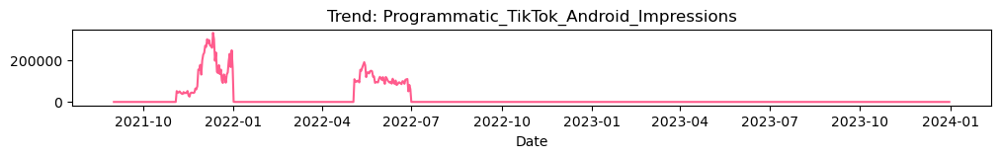

Programmatic_TikTok_iOS_Spend


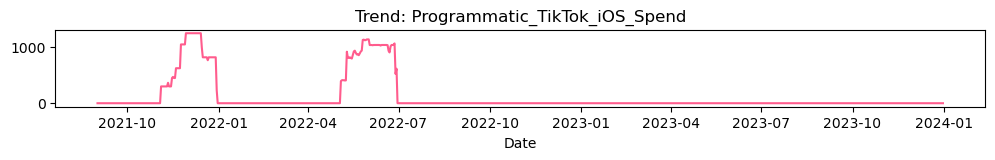

Programmatic_TikTok_iOS_Clicks


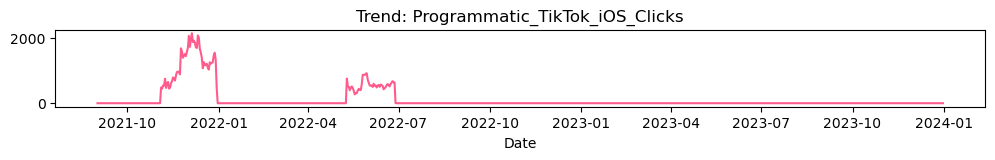

Programmatic_TikTok_iOS_Impressions


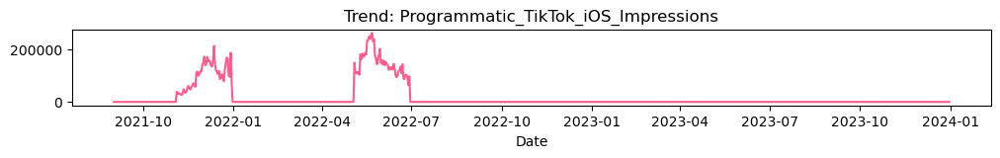

PaidSocial_Vibe_CTV_Spend


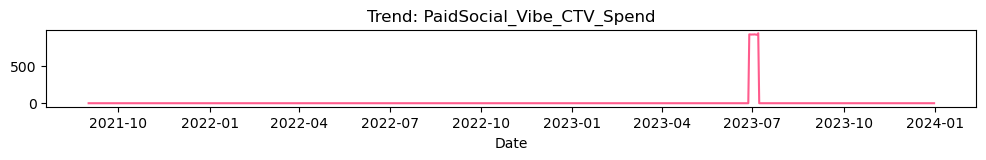

PaidSocial_Vibe_CTV_Clicks


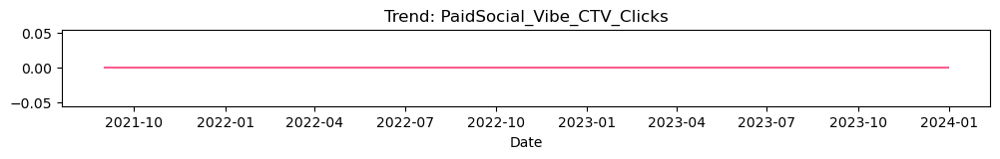

PaidSocial_Vibe_CTV_Impressions


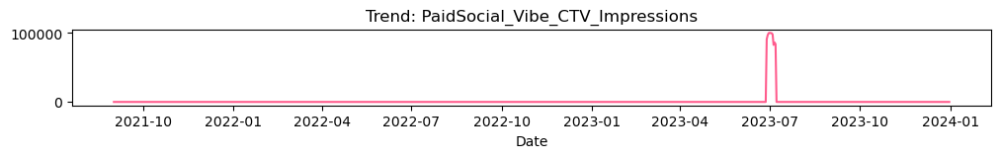

Programmatic_Persona.ly_Android_Spend


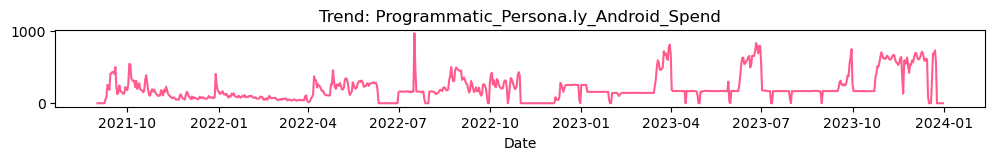

Programmatic_Persona.ly_Android_Clicks


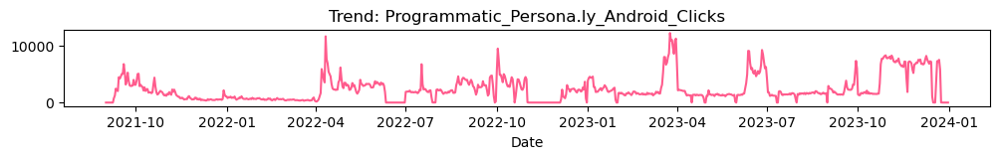

Programmatic_Persona.ly_Android_Impressions


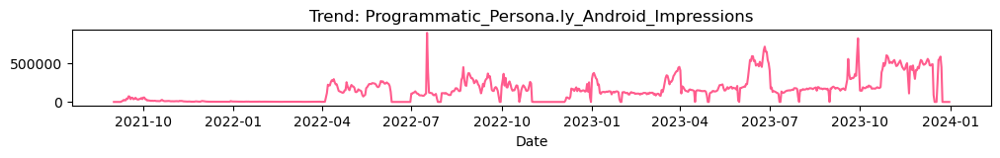

Display_MediaMath_Impressions


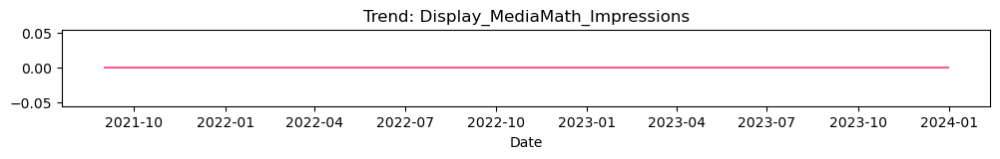

Display_MediaMath_Spend


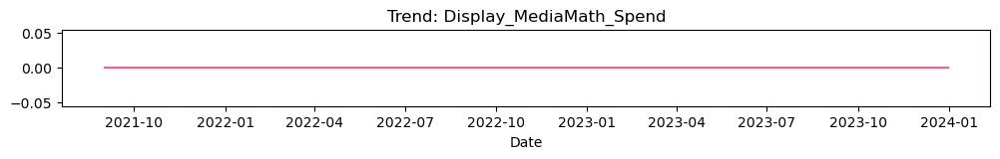

Social_Facebook_Impressions


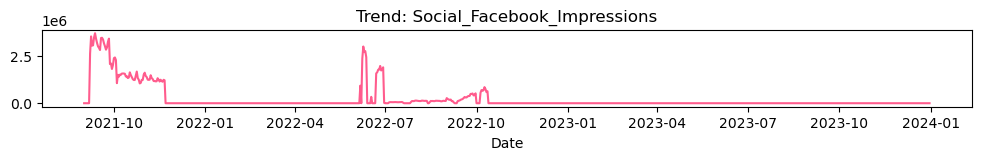

Social_Facebook_Spend


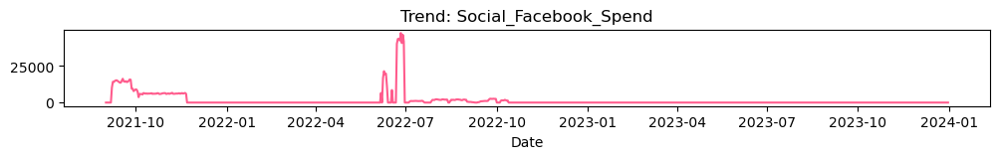

Video_Cluep_Impressions


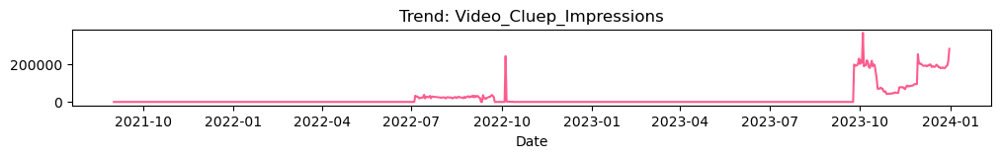

Video_Cluep_Spend


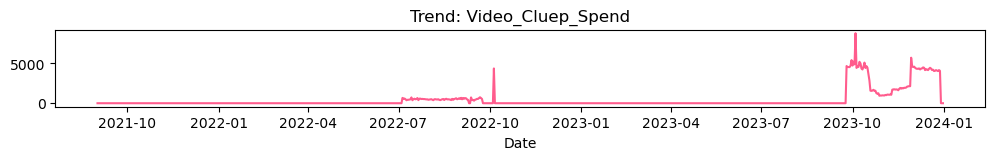

CTV_Hulu_Impressions


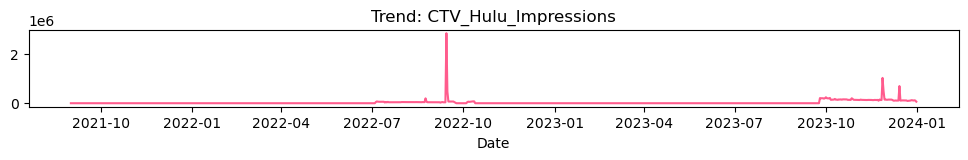

CTV_Hulu_Spend


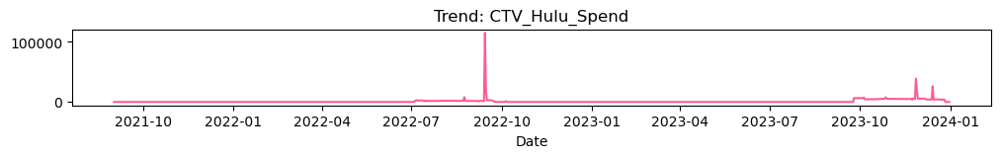

Video_Kargo_Impressions


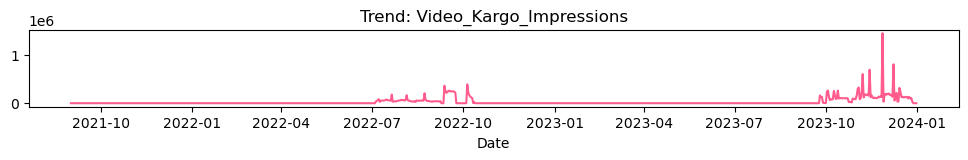

Video_Kargo_Spend


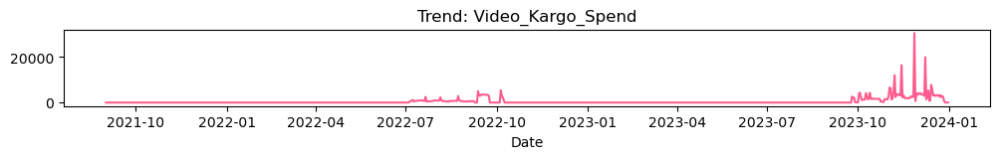

CTV_Samba.tv_Impressions


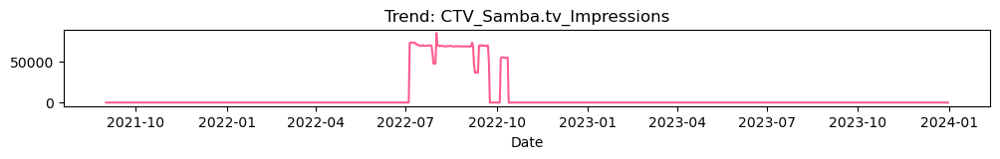

CTV_Samba.tv_Spend


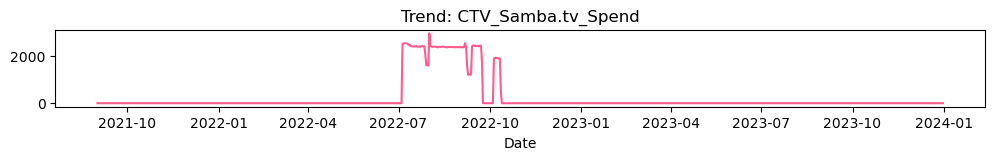

Social_TikTok_Impressions


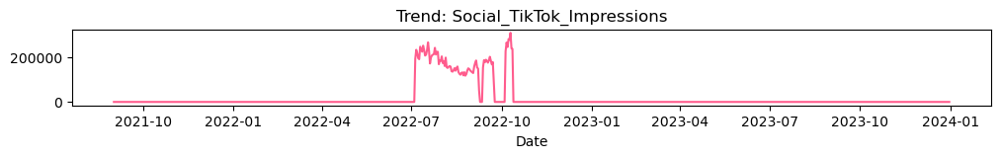

Social_TikTok_Spend


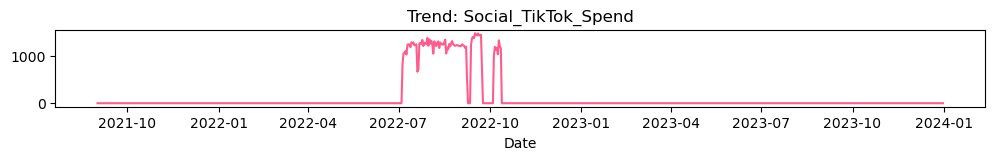

Audio_Pandora_Impressions


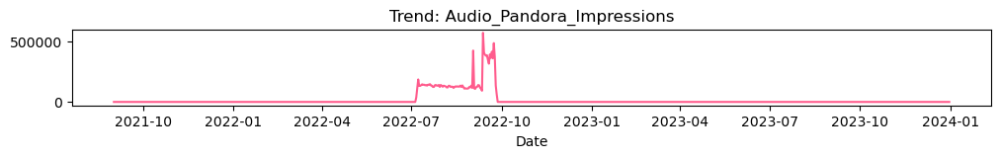

Audio_Pandora_Spend


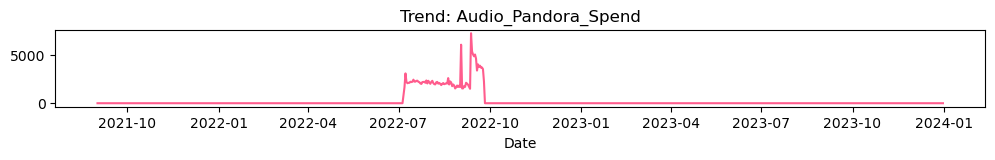

CTV_Peacock TV_Impressions


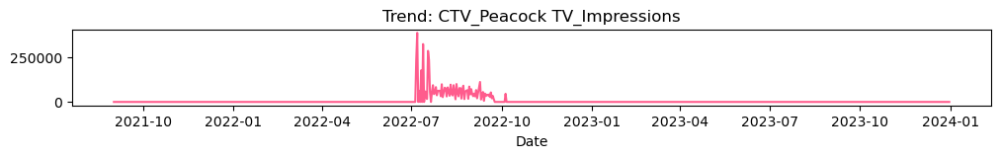

CTV_Peacock TV_Spend


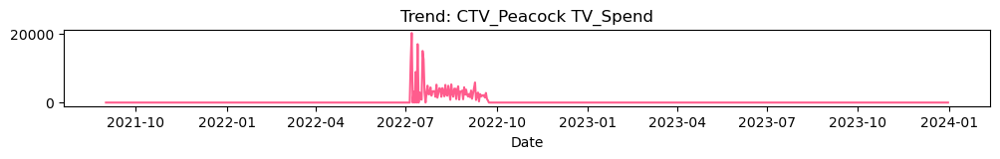

Audio_Spotify_Impressions


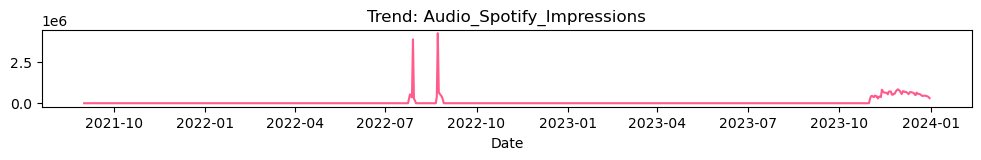

Audio_Spotify_Spend


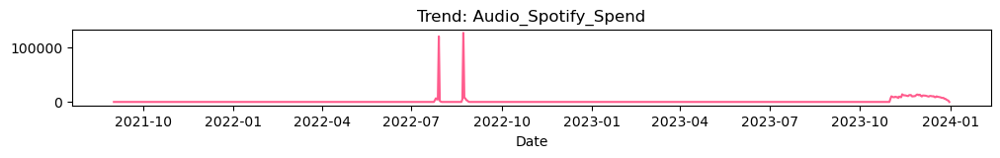

Programmatic Display_Basis DSP_Impressions


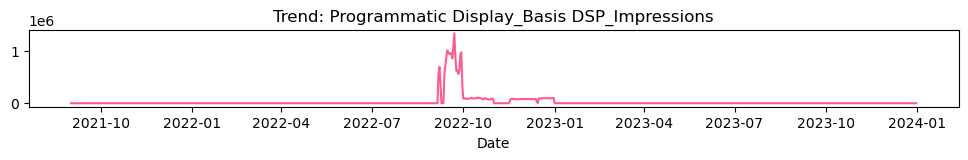

Programmatic Display_Basis DSP_Spend


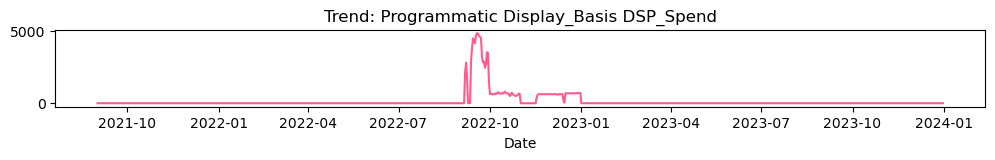

CTV_Discovery_Impressions


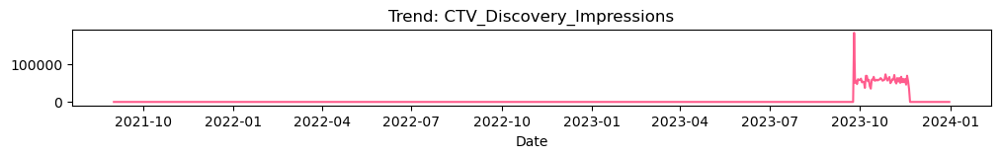

CTV_Discovery_Spend


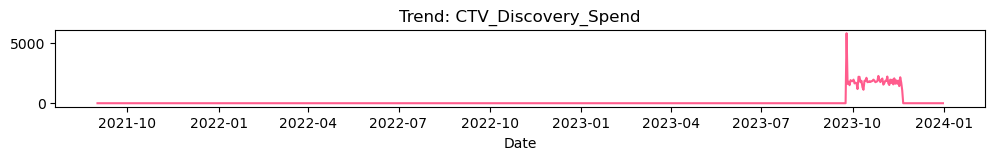

Video_YouTube_Impressions


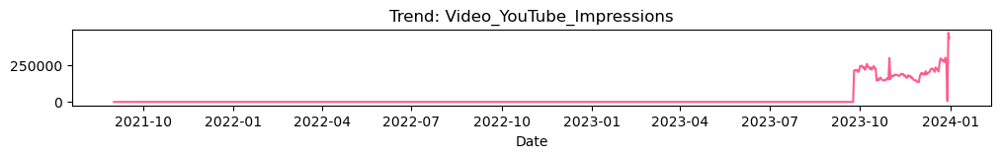

Video_YouTube_Spend


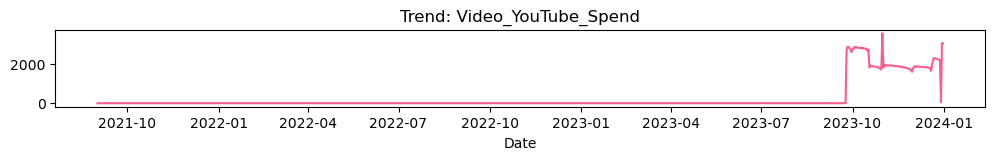

Display_The New York Times_Impressions


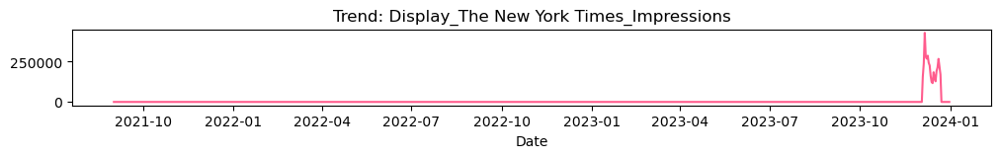

Display_The New York Times_Spend


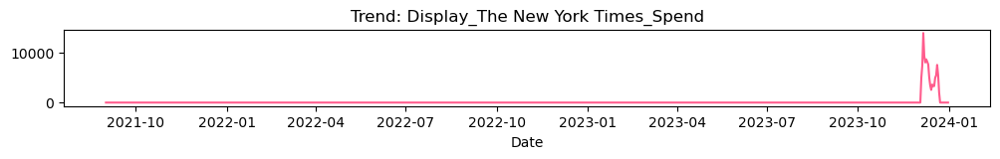

Net Favorability


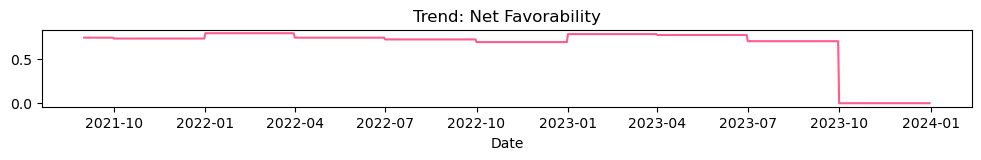

Net Trust


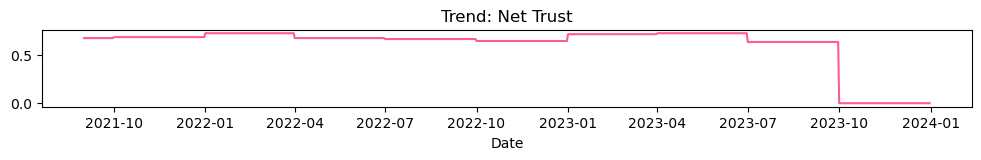

Realibality


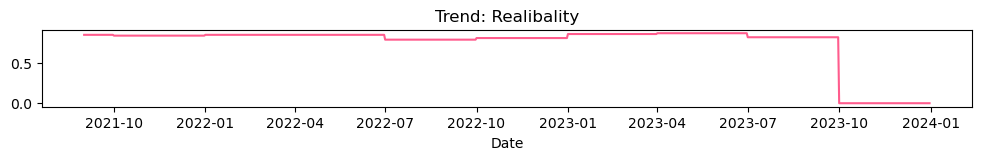

Accuracy


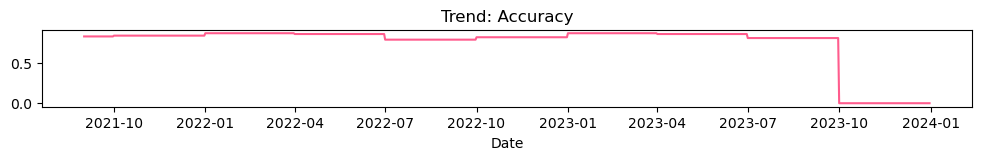

NPS


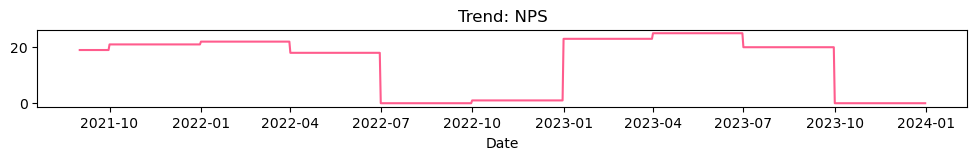

Usage


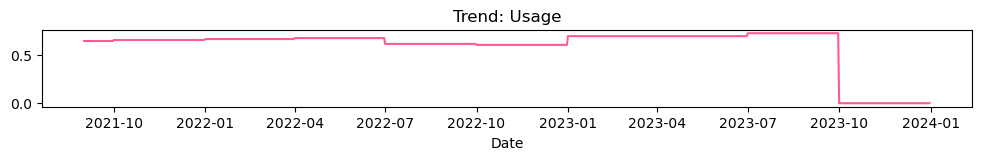

Preference


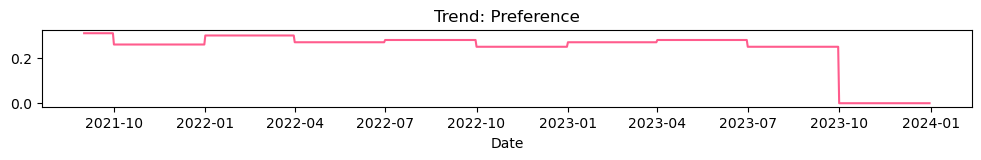

Seen as experts


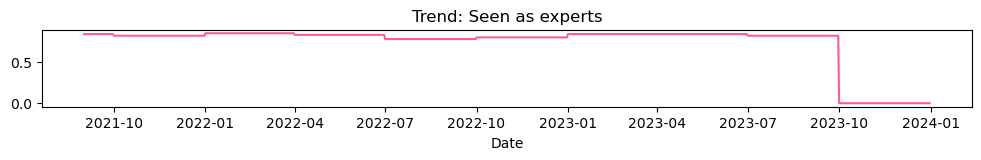

Positive impact on community


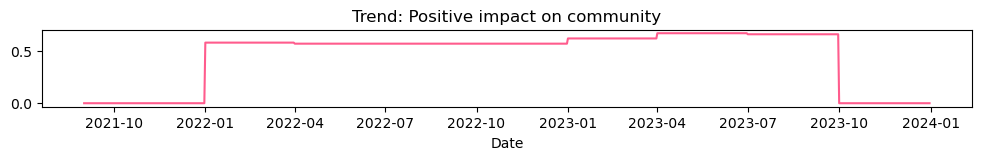

Positive impact on well being


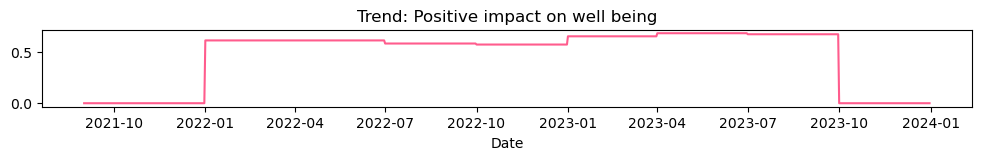

SocialEng_Facebook_Impressions


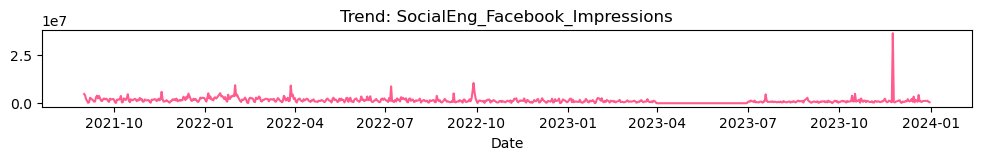

SocialEng_Facebook_Total_Engagements


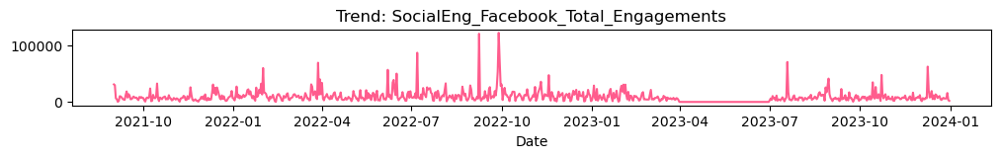

SocialEng_Facebook_Estimated_Clicks


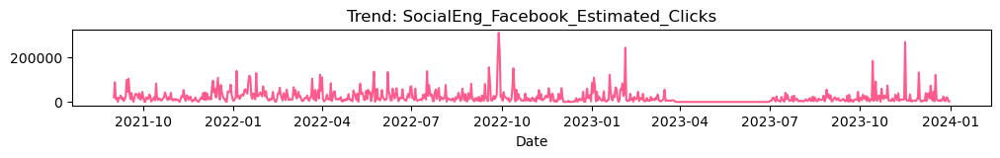

SocialEng_LinkedIn_Impressions


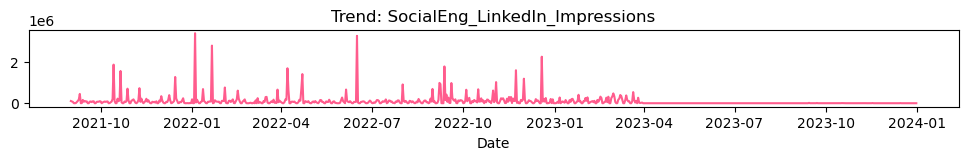

SocialEng_LinkedIn_Total_Engagements


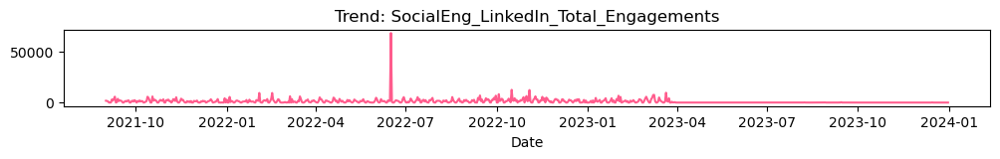

SocialEng_LinkedIn_Estimated_Clicks


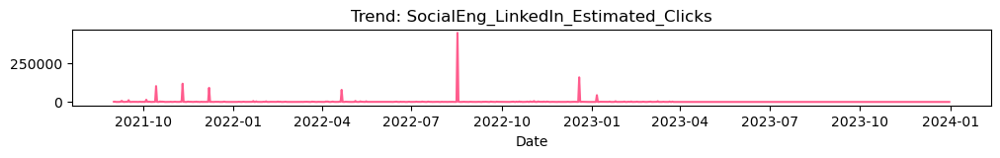

SocialEng_YouTube_Impressions


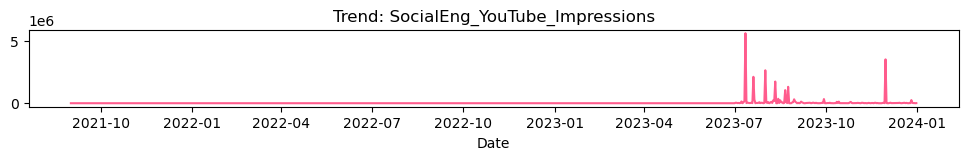

SocialEng_YouTube_Total_Engagements


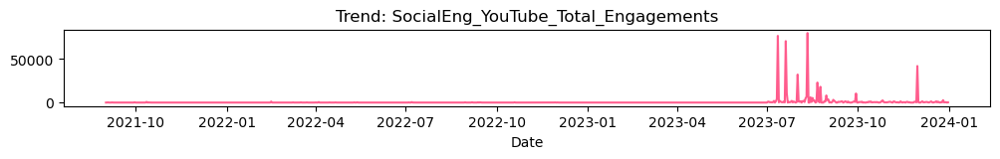

SocialEng_YouTube_Estimated_Clicks


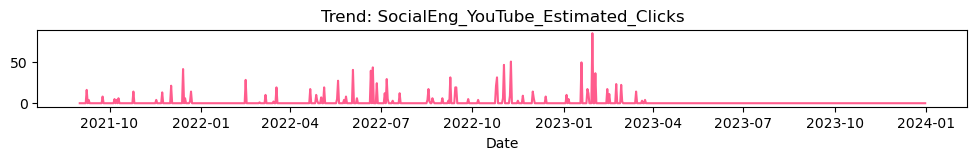

SocialEng_Instagram_Impressions


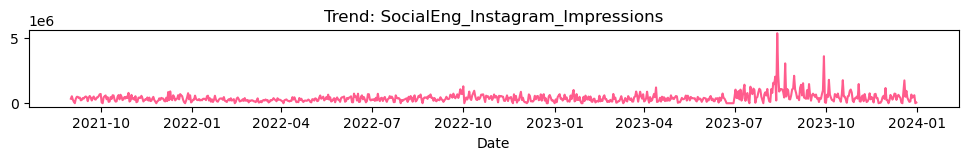

SocialEng_Instagram_Total_Engagements


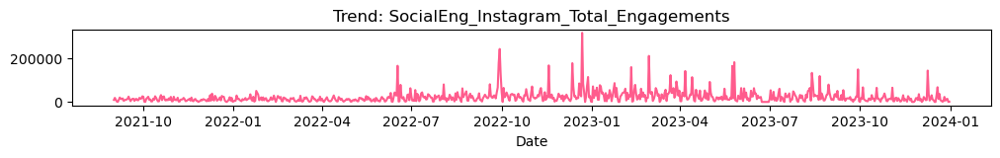

SocialEng_Instagram_Estimated_Clicks


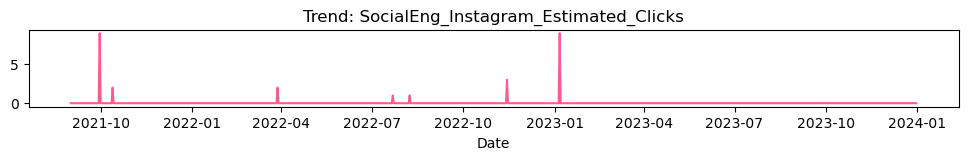

SocialEng_Twitter_Impressions


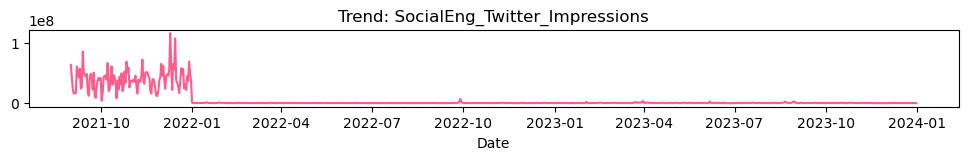

SocialEng_Twitter_Total_Engagements


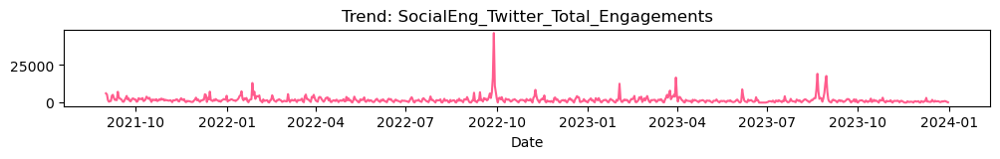

SocialEng_Twitter_Estimated_Clicks


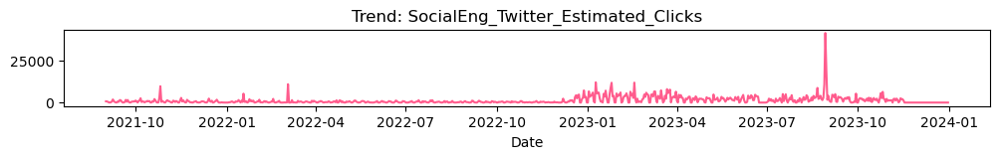

SocialEng_TikTok_Impressions


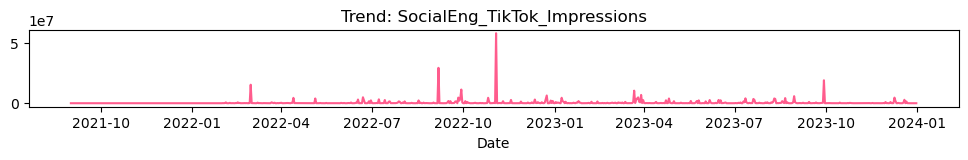

SocialEng_TikTok_Total_Engagements


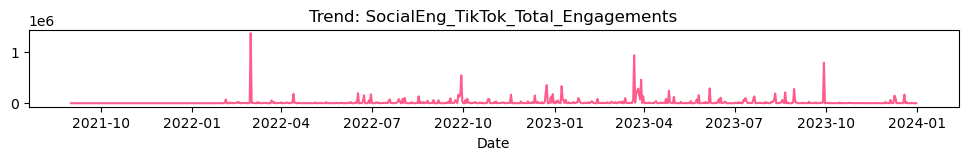

SocialEng_TikTok_Estimated_Clicks


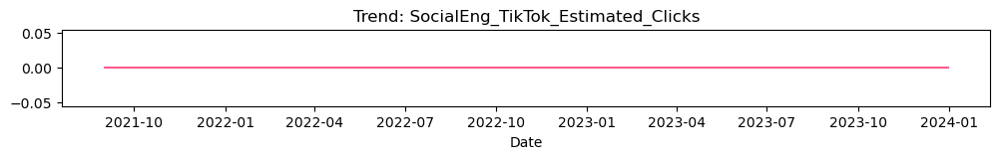

EventsCamp/Vend_Campaign_Flag


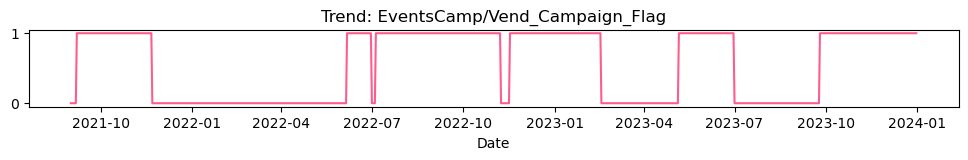

Critical_Event_Flag


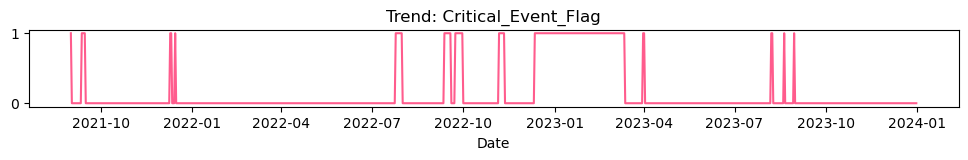

In [12]:
trend_chart_(df_, cols, chart_title, 'Date')

**Visits:**<br/>
**Overall_Product_Visits:** Target Variable - Continuous & 2+ years, we'll not use product/platform level visits as it's the target variable<br/>
**Overall_Product_Goal:** it's the goal set to achieve visits/day, should not be considered for model and based on chart data missing post 2021<br/>
**US Weather Impact Rating:** weather score from visits data<br/>
<br/>
**Organic Search - Google Platform:**<br/>
**OrganicSearch_Google_Clicks:** Data missing before mid June 2022, SEO clicks data avaialble for imputation, performed this analysis during data discovery phase<br/>
**OrganicSearch_Google_Impressions:** Data missing before mid June 2022, SEO clicks data avaialble for imputation, but need to figure out some CTR value for conversion of clicks to impressions<br/>
**OrganicSearch_Google_CTR:** will be used to get some CTR value for imputation in above step<br/>
**OrganicSearch_Google_Position:** Reply from TWC: *A Google Search results page is composed of many search result elements. The "position" metric is an attempt to show approximately where on the page a given link was seen, relative to other results on the page* **Do we need to consider this variable for model?**<br/>
**SEO_Clicks_OrganicSearch_Desktop_MobileWeb(Combined):** Data that will be used imputation, available enough for imputation<br/>
<br/>
**App Downloads:**<br/>
**Pricing_Android_Installs:** App downloads data for android<br/>
**Pricing_iOS_Installs:** App downloads data for iOS<br/>
**Pricing_Total_Installs:** App downloads data for android and iOS combined. **Do we need to consider app downloads at android and iOS level for model?** *(suggestion: if we are building model at aggreagte level, let's consider only at overall level*<br/>
<br/>
**User Acquisition Spend:**<br/>
**SEM_Google_Android_Spend/Impressions/Clicks:** Available
**SEM_Google_iOS_Spend/Impressions/Clicks:** Not available approx. post Q1 2023<br/>
**Preload_IronSource_Aura_Android_Spend/Impressions/Clicks:** Only at Android level, Q4 2023 data not available<br/>
**Programmatic_Bidease_Android_Spend/Impressions/Clicks:** Available
**Programmatic_Bidease_iOS_Impressions/Impressions/Clicks:** Only available for ~20 days<br/>
**Preload_Digital_Turbine_Android_Spend/Impressions/Clicks:** Only at Android level, Data not available post starting June 2023, Also not available b/w Apr-Aug 2022. ~33% data missing due to inactivity. Impressions data is not available at all<br/>
**Programmatic_Tapjoy_Android_Spend:** Only at Android level, Spend Available, Impressions and Clicks is not available at all<br/>
**SEM_Apple_Search_Ads_iOS_Spend:** Only at iOS level, Available<br/>
**Programmatic_LiftOff_Android_Spend/Impressions/Clicks:** Available, 13% zero values
**Programmatic_LiftOff_iOS_Spend/Impressions/Clicks:** Not available for Q4 2023, 41% zero values<br/>
**Programmatic_IronSource_Sonic_Android_Spend/Impressions/Clicks:** Not available before May 2022, 6% zero values
**Programmatic_IronSource_Sonic_iOS_Spend/Impressions/Clicks:** Not available before May 2022, 35% zero values<br/>
**PaidSocial_Twitter_Android_Spend/Impressions/Clicks:** Not available post Nov 2022, ~60% missing due to inactivity
**PaidSocial_Twitter_Sonic_iOS_Spend/Impressions/Clicks:** Not available post July 2023, ~60% missing due to inactivity<br/>
**Programmatic_TikTok_Android_Spend/Impressions/Clicks:** Not available for almost entire 2023, ~50% missing + 37% zero
**Programmatic_TikTok_iOS_Spend/Impressions/Clicks:** Not available for almost entire 2023, ~51% missing + 36% zero<br/>
**PaidSocial_Vibe_CTV_Spend/Impressions/Clicks:** Only at CTV level and 12 days data is available<br/>
**Programmatic_Persona.ly_Android_Spend/Impressions/Clicks:** Only at Android level and 8% zero values<br/>
<br/>
**Brand Spend:** Due to high inactivity we'll be bucketing it under one channel as Brand, discussed in data discovery phase<br/>
<br/>
**Brand Health Measures:**<br/>
Q4 2023 not available as study was not performed, imputation required - **Can we do forward filling?**<br/>
'Positive impact on community', 'Positive impact on well being' not avaialble for Q3 &Q4 2021, imputation required - **Can we do backward filling?**<br/>
'Likelihood to recommend' have no data throughout- **We'll drop this variable**<br/>
<br/>
**Social Engagment:**<br/>
Facebook- 11% data missing<br/>
LinkedIn- 31% data missing<br/>
Youtube- 59% data missing<br/>
Instagram- 3% data missing, 96% zero for clicks<br/>
Twitter- 2% data missing, 14% zero for clicks<br/>
Tiktok - 23% data missing, 12% zero, 77% for clicks<br/>

In [54]:
date_var = ['Date']
event_var = ['EventsCamp/Vend_Campaign/Vendor(s)', 'Event_Name']
cols = list(df_ads_v3.columns)
remove_var = date_var+event_var
cols = [item for item in cols if item not in remove_var]
chart_title = cols

Overall_Product_Visits


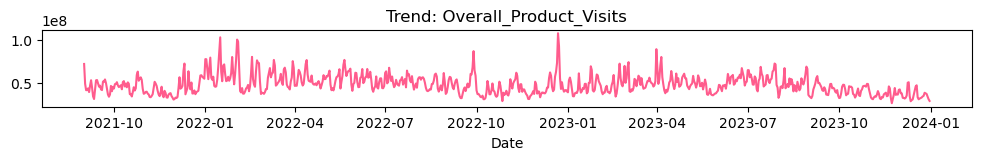

US Weather Impact Rating


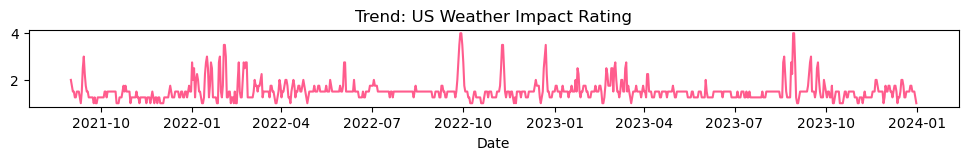

OrganicSearch_Google_Clicks


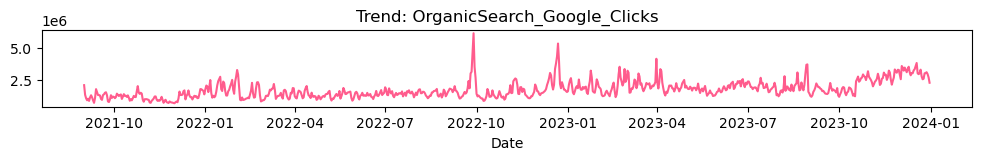

OrganicSearch_Google_Impressions


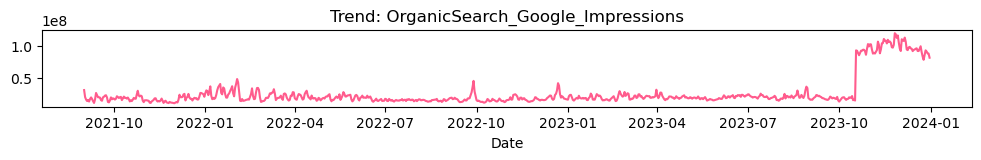

OrganicSearch_Google_Position


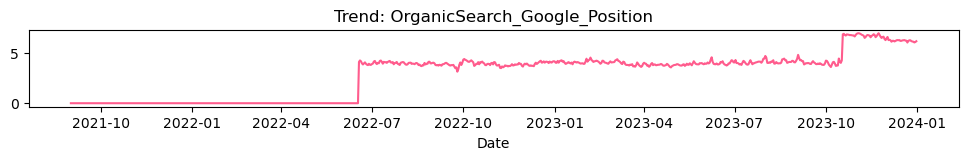

Pricing_Android_Installs


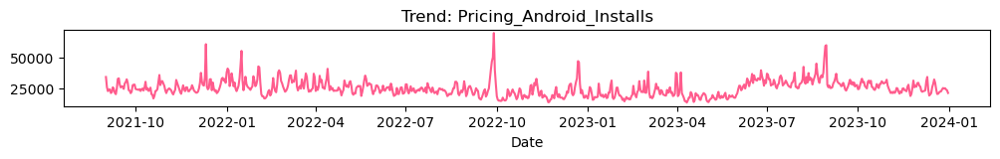

Pricing_iOS_Installs


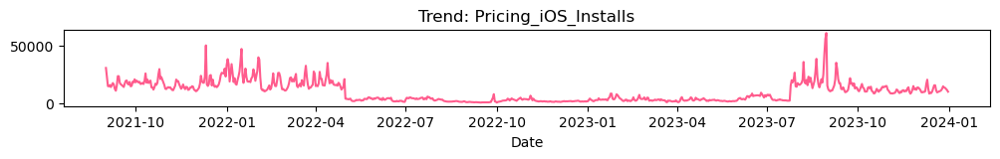

Pricing_Total_Installs


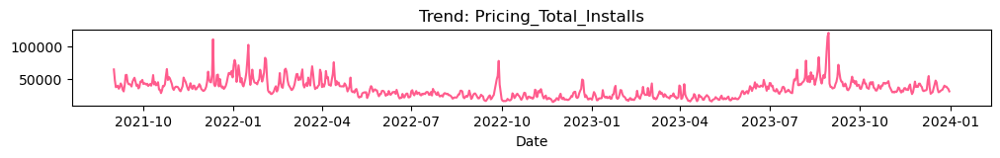

SEM_Google_Spend


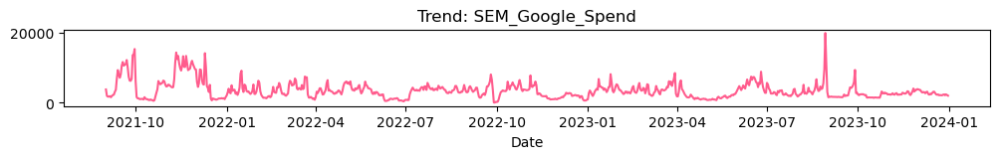

SEM_Google_Clicks


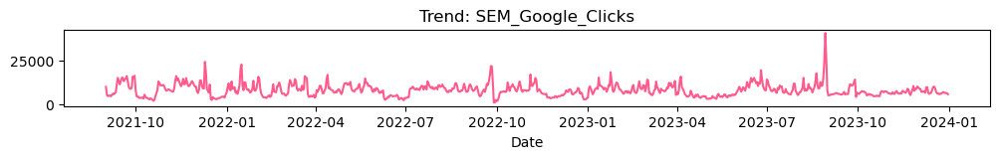

SEM_Google_Impressions


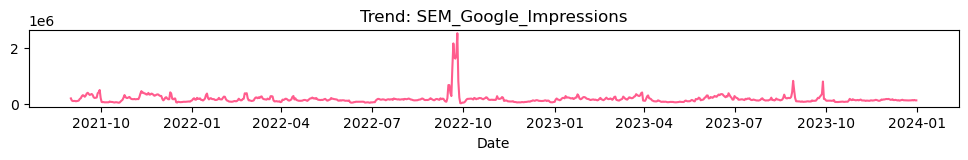

Preload_IronSource_Aura_Spend


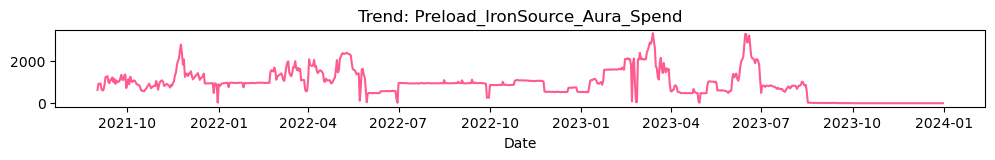

Preload_IronSource_Aura_launches


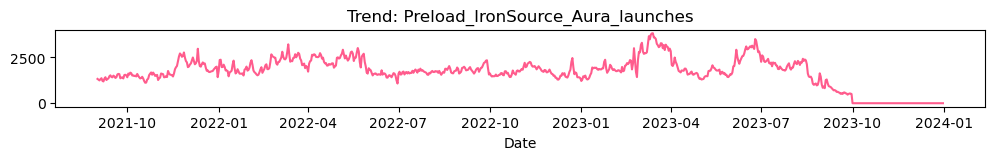

Preload_IronSource_Aura_impressions


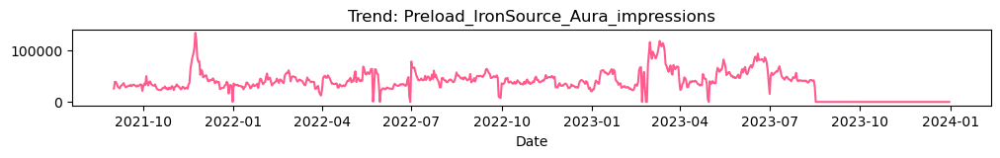

Preload_IronSource_Aura_app_downloads


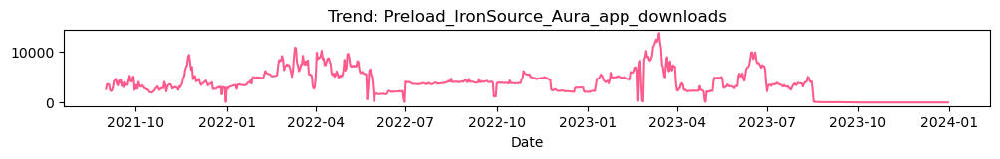

Programmatic_Bidease_Spend


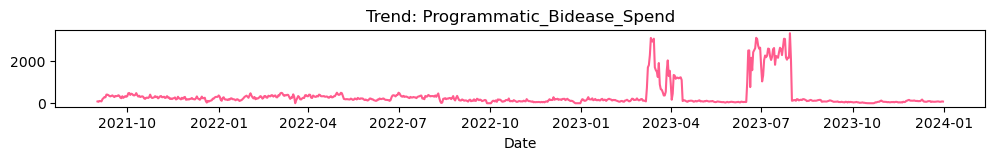

Programmatic_Bidease_Clicks


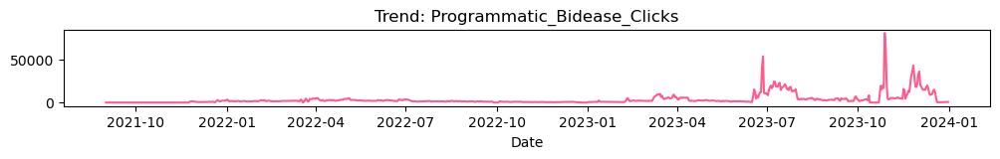

Programmatic_Bidease_Impressions


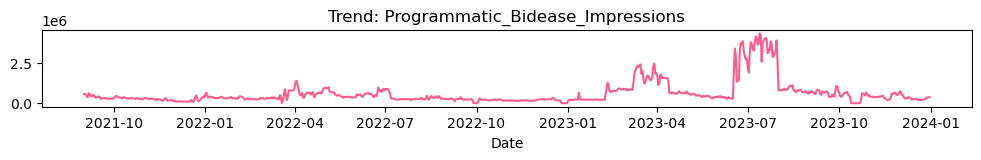

Preload_Digital_Turbine_Spend


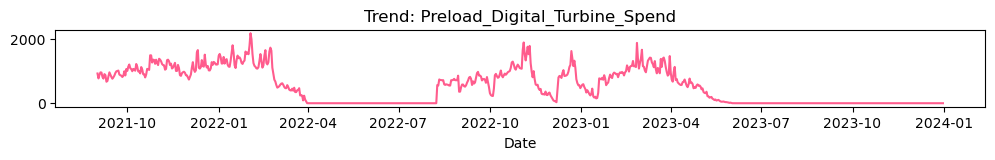

Preload_Digital_Turbine_launches


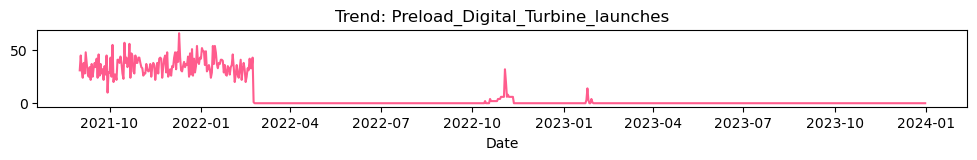

Preload_Digital_Turbine_app_downloads


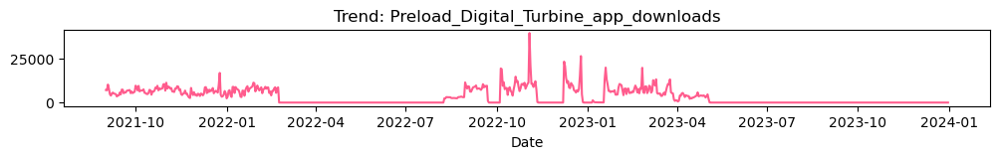

Programmatic_Tapjoy_Spend


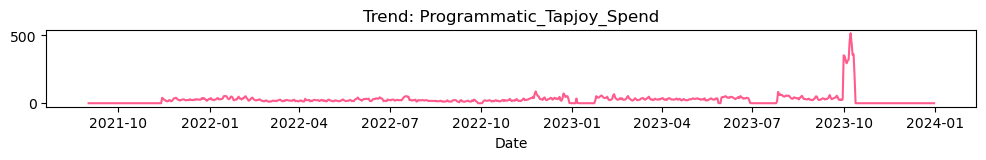

Programmatic_Tapjoy_Clicks


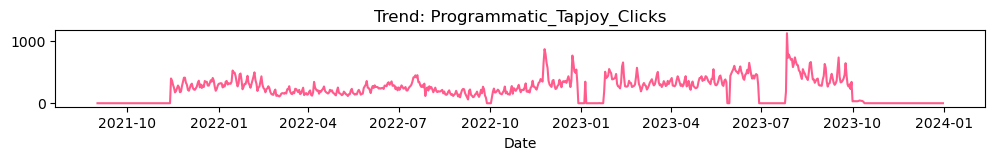

SEM_Apple_Search_Ads_Spend


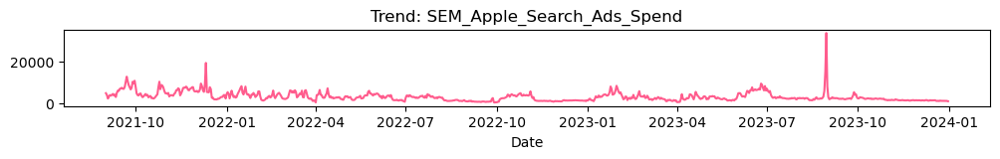

SEM_Apple_Search_Ads_Clicks


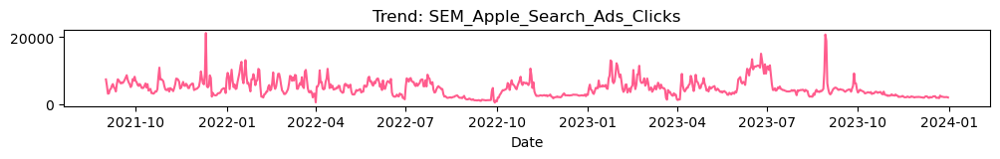

SEM_Apple_Search_Ads_Impressions


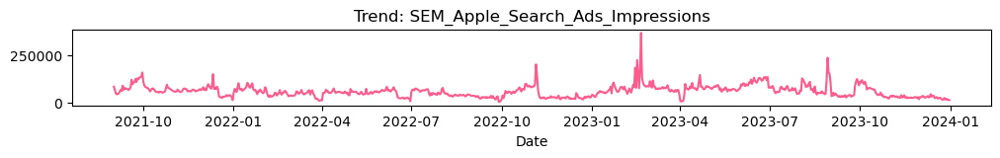

Programmatic_LiftOff_Spend


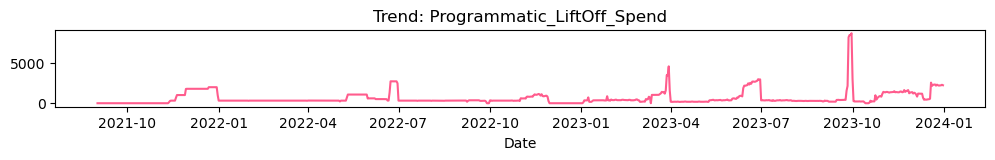

Programmatic_LiftOff_Clicks


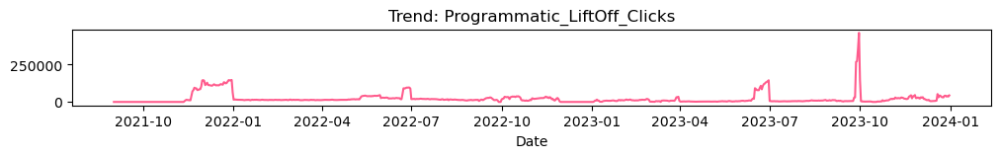

Programmatic_LiftOff_Impressions


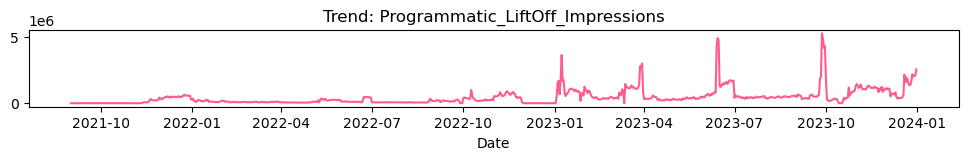

Programmatic_IronSource_Sonic_Spend


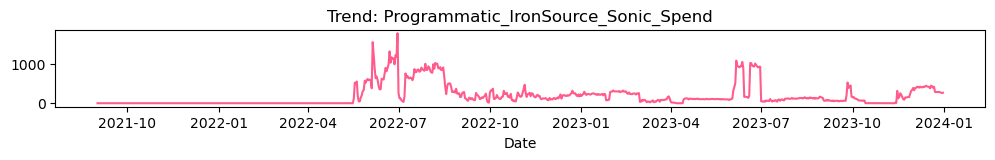

Programmatic_IronSource_Sonic_Clicks


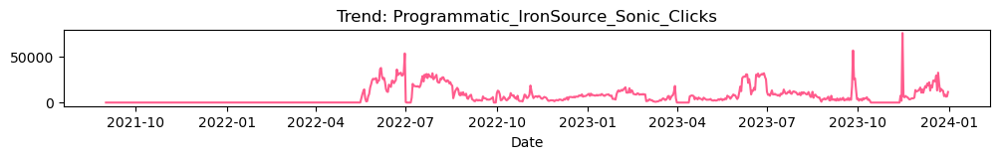

Programmatic_IronSource_Sonic_Impressions


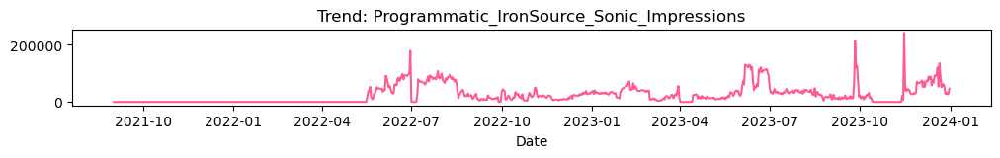

PaidSocial_Twitter_Spend


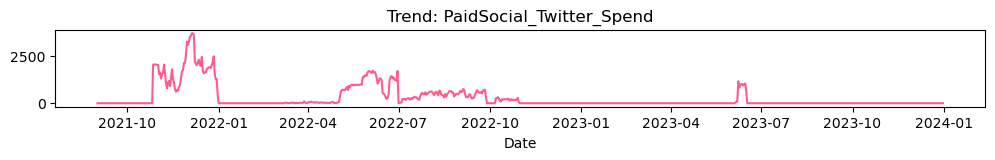

PaidSocial_Twitter_Clicks


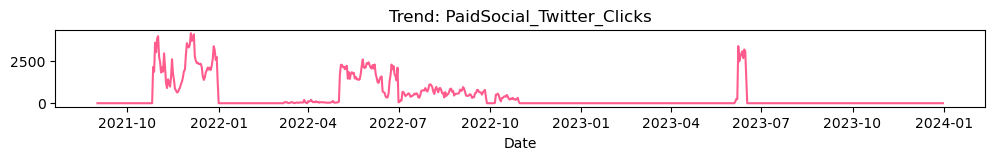

PaidSocial_Twitter_Impressions


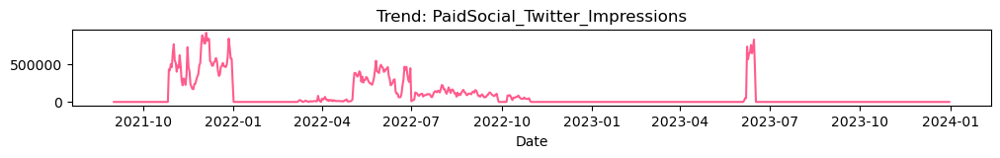

Programmatic_TikTok_Spend


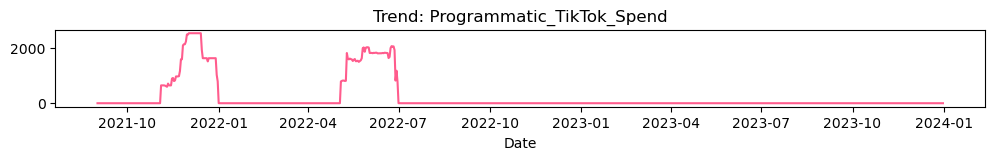

Programmatic_TikTok_Clicks


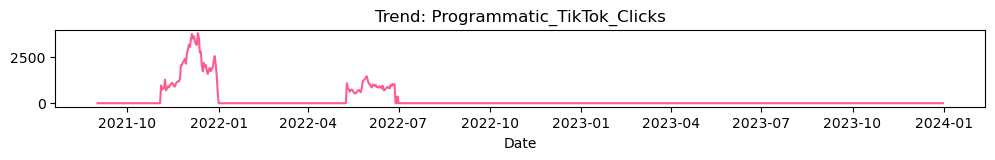

Programmatic_TikTok_Impressions


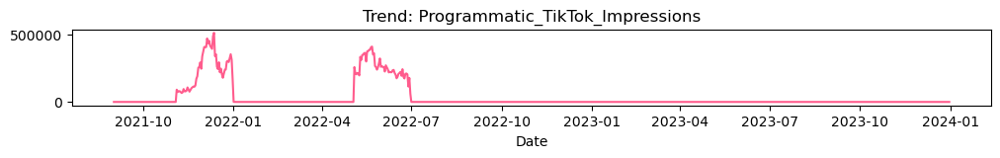

PaidSocial_Vibe_Spend


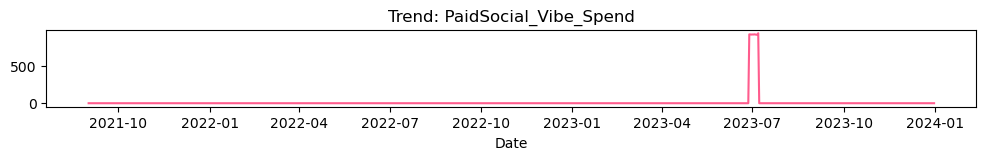

PaidSocial_Vibe_Impressions


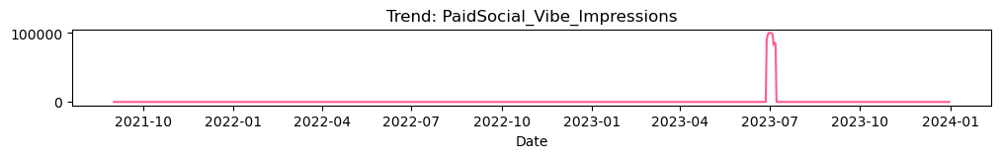

Programmatic_Persona.ly_Spend


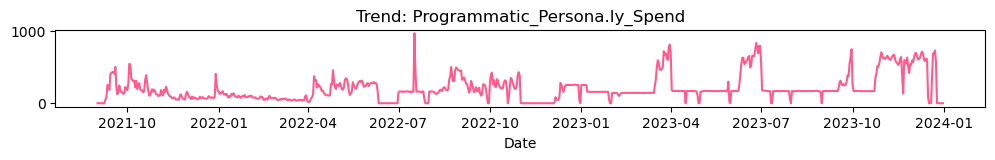

Programmatic_Persona.ly_Clicks


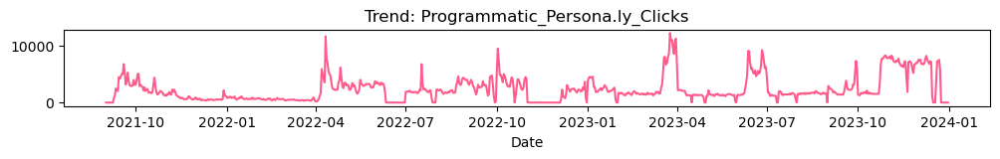

Programmatic_Persona.ly_Impressions


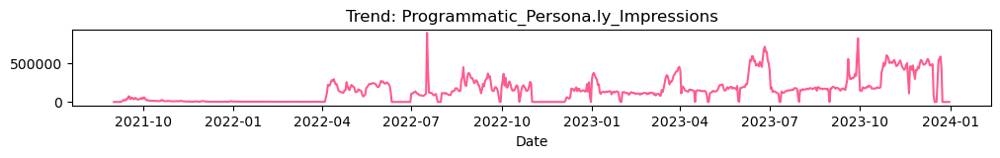

Brand_Impressions


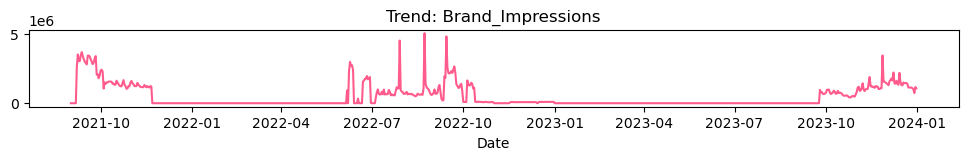

Brand_Spend


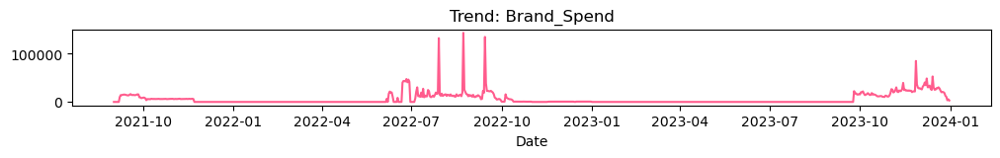

Net Favorability


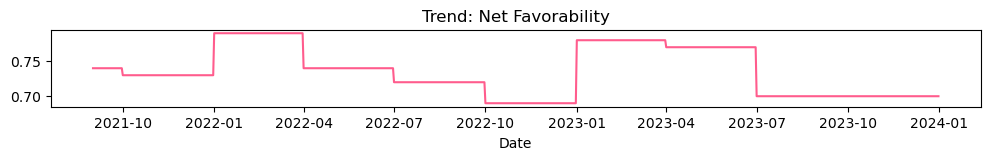

Net Trust


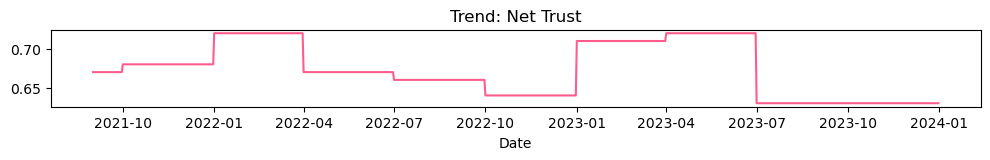

Realibality


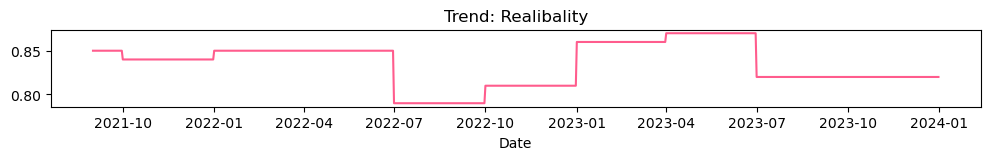

Accuracy


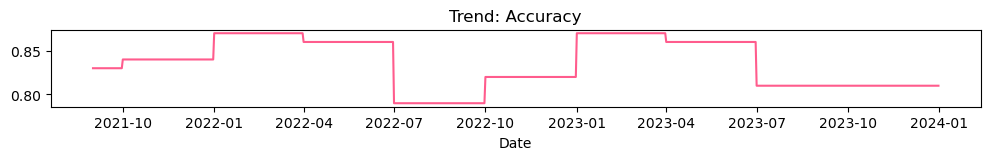

NPS


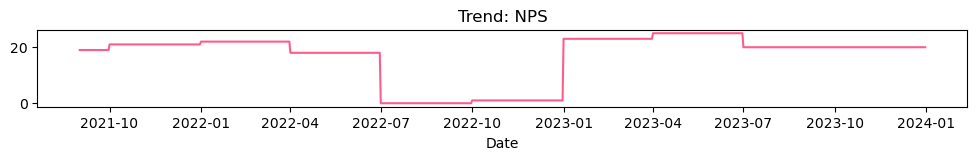

Usage


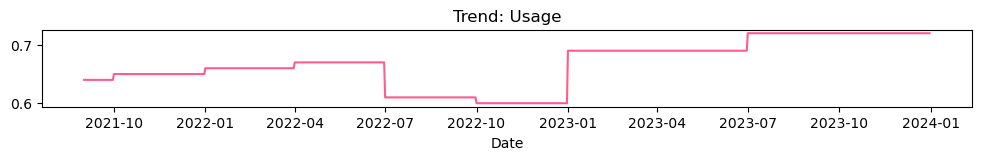

Preference


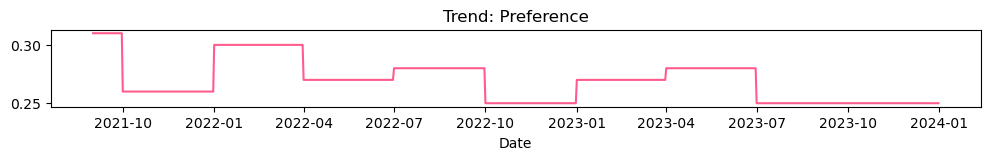

Seen as experts


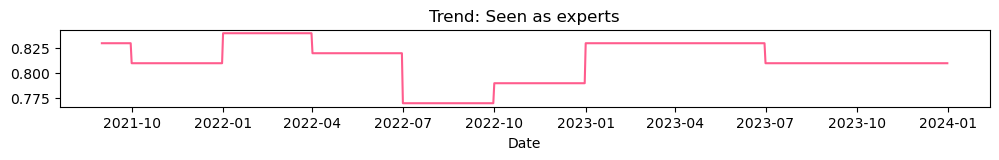

Positive impact on community


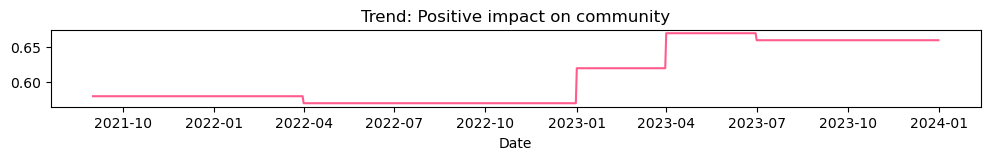

Positive impact on well being


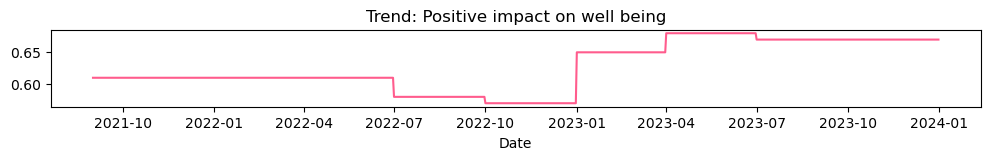

SocialEng_Facebook_Impressions


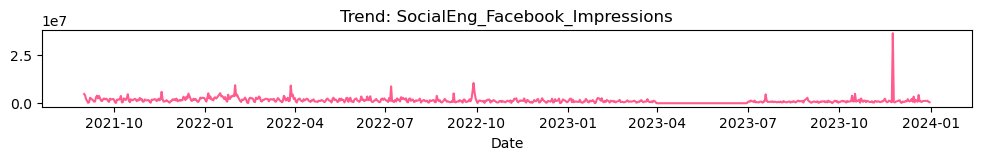

SocialEng_Facebook_Total_Engagements


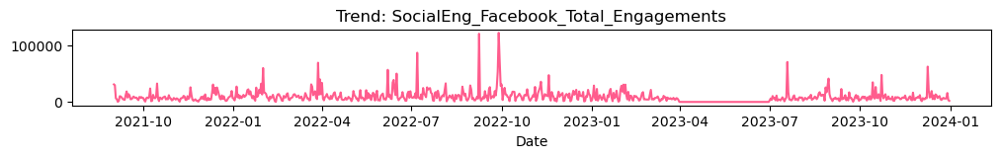

SocialEng_Facebook_Estimated_Clicks


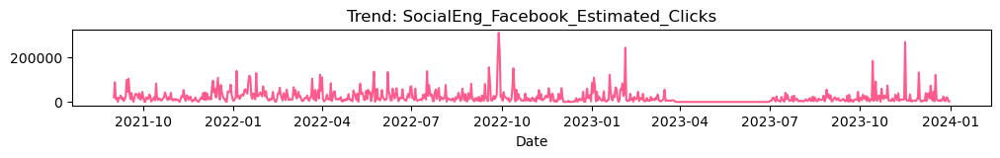

SocialEng_LinkedIn_Impressions


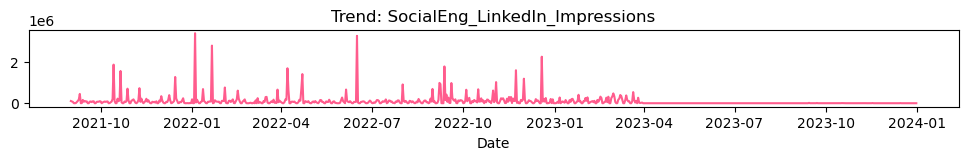

SocialEng_LinkedIn_Total_Engagements


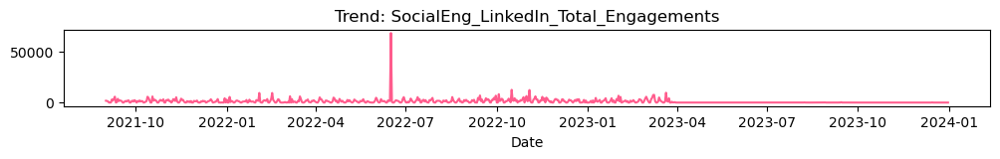

SocialEng_LinkedIn_Estimated_Clicks


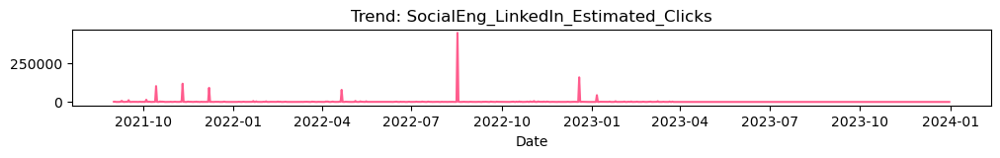

SocialEng_YouTube_Impressions


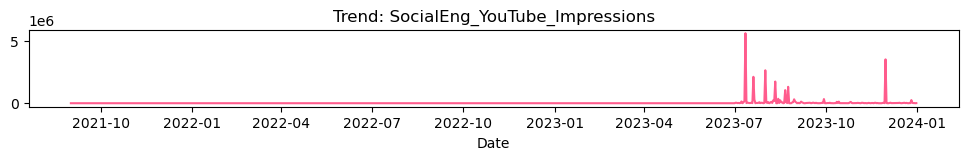

SocialEng_YouTube_Total_Engagements


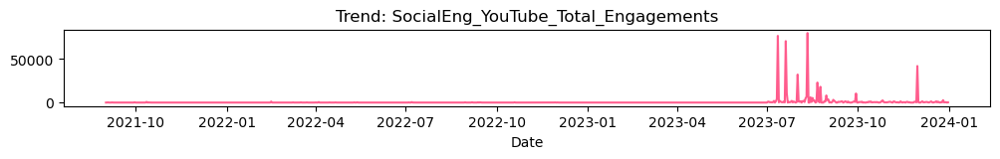

SocialEng_YouTube_Estimated_Clicks


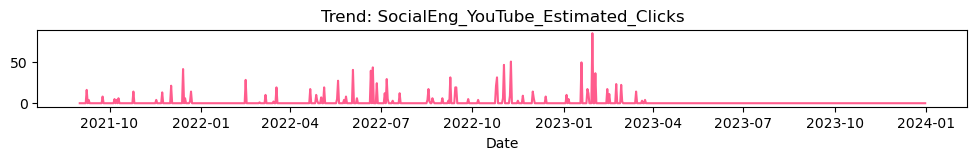

SocialEng_Instagram_Impressions


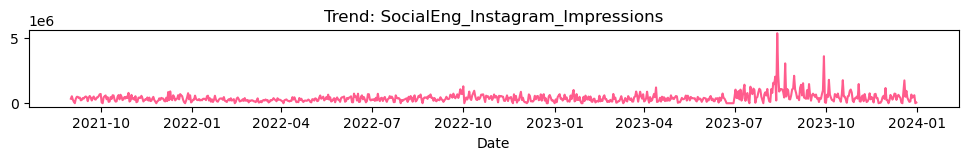

SocialEng_Instagram_Total_Engagements


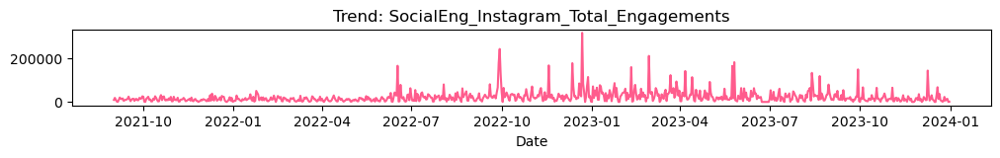

SocialEng_Instagram_Estimated_Clicks


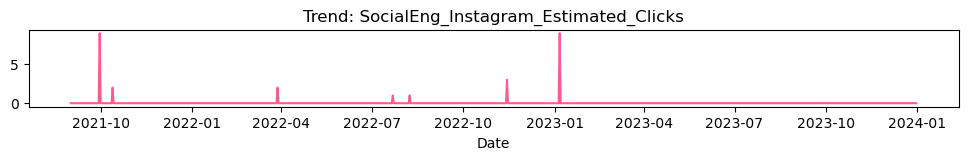

SocialEng_Twitter_Impressions


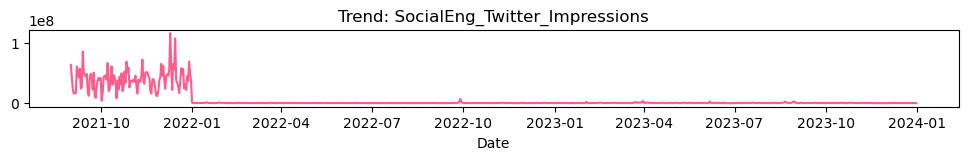

SocialEng_Twitter_Total_Engagements


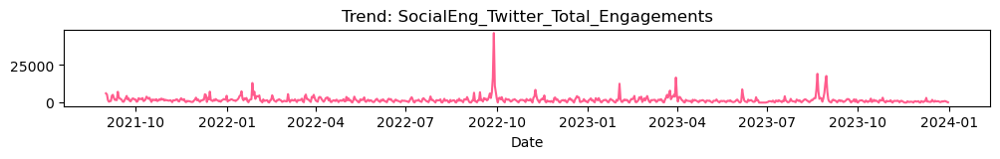

SocialEng_Twitter_Estimated_Clicks


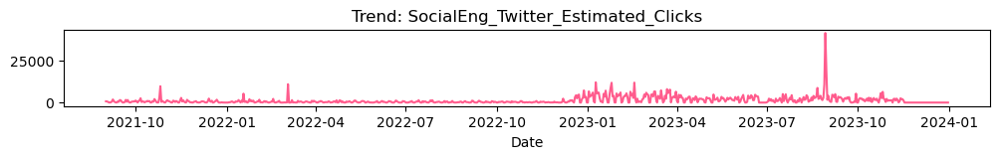

SocialEng_TikTok_Impressions


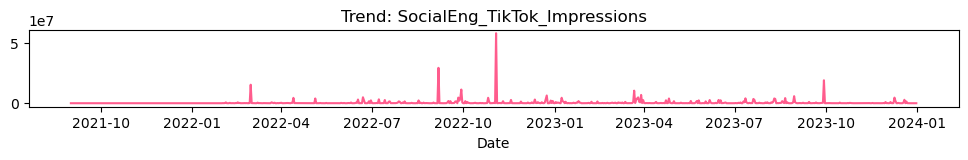

SocialEng_TikTok_Total_Engagements


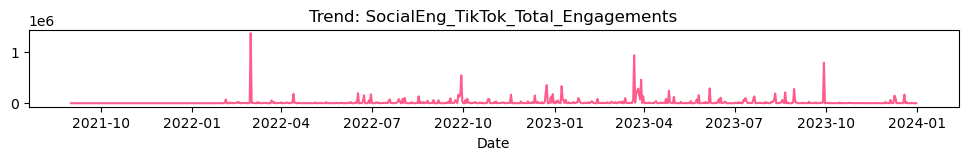

EventsCamp/Vend_Campaign_Flag


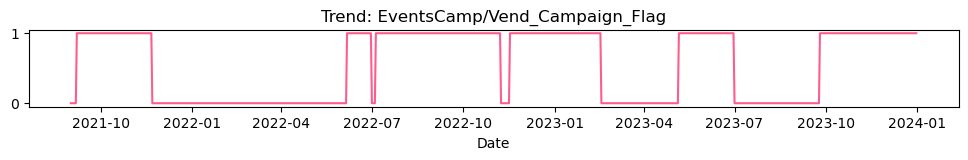

Critical_Event_Flag


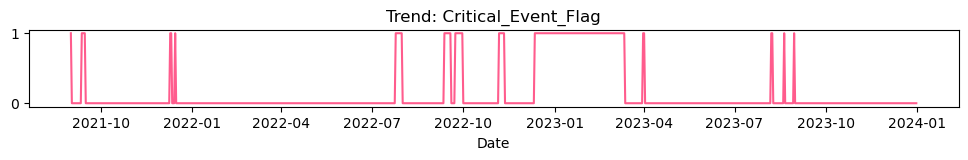

In [55]:
trend_chart_(df_ads_v3, cols, chart_title, 'Date')

In [22]:
df_ads_v3.shape

(852, 81)

#### Brand Health Measures Imputation

In [13]:
df_v2 = df_.copy()
hm_back_fill_var = ['Positive impact on community', 'Positive impact on well being']
hm_forward_fill_var = ['Net Favorability', 'Likelihood to recommend', 'Net Trust', 'Realibality', 'Accuracy', 'NPS', 'Usage', 'Preference', 'Seen as experts', 'Positive impact on community', 'Positive impact on well being']
df_v2[hm_back_fill_var] = df_v2[hm_back_fill_var].fillna(method='bfill')
df_v2[hm_forward_fill_var] = df_v2[hm_forward_fill_var].fillna(method='ffill')

Positive impact on community


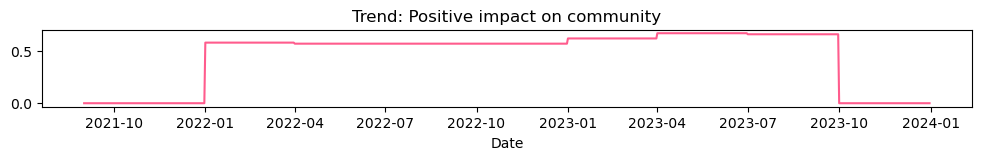

Positive impact on well being


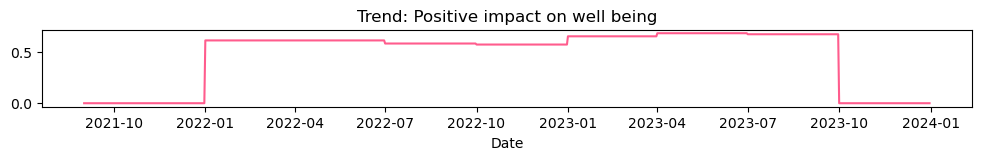

In [14]:
trend_chart_(df_, hm_back_fill_var, hm_back_fill_var, 'Date')

Positive impact on community


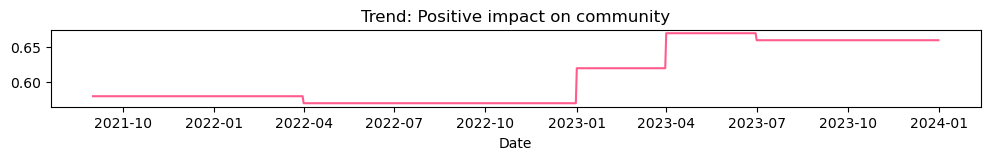

Positive impact on well being


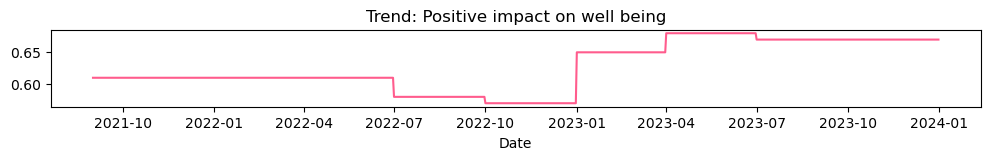

In [15]:
trend_chart_(df_v2, hm_back_fill_var, hm_back_fill_var, 'Date')

In [16]:
df_v2[['Date']+ hm_forward_fill_var].to_clipboard()

In [47]:
list(df_ads.columns[df_ads.isna().sum()==df_ads.shape[0]])

['Likelihood to recommend']

#### Organic Search Imputation 

In [59]:
organic_search_impu = ['OrganicSearch_Google_Clicks', 'OrganicSearch_Google_Impressions', 'OrganicSearch_Google_CTR', 'OrganicSearch_Google_Position', 'SEO_Clicks_OrganicSearch_Desktop_MobileWeb(Combined)']

In [60]:
df_v2_ = df_ads.copy()
# df_v2_['CTR_check'] = df_v2_['OrganicSearch_Google_Clicks']/df_v2_['OrganicSearch_Google_Impressions']
# df_v2_[['Date']+organic_search_impu]
# print(consisten_CTR_for_imputation)

In [61]:
print("Pandas version:", pd.__version__)

Pandas version: 1.4.3


In [62]:
print("NumPy version:", np.__version__)

NumPy version: 1.23.5


In [63]:
df_v2_['Date'] = pd.to_datetime(df_v2_['Date'])
consisten_CTR_for_imputation = round((df_v2_[df_v2_['OrganicSearch_Google_Clicks'].notna()]['OrganicSearch_Google_Clicks'].sum())/(df_v2_[df_v2_['OrganicSearch_Google_Impressions'].notna()]['OrganicSearch_Google_Impressions'].sum()),4)
print(consisten_CTR_for_imputation)
df_v2_['OrganicSearch_Google_Impressions_copy'] = df_v2_['OrganicSearch_Google_Impressions']
df_v2_.loc[df_v2_['OrganicSearch_Google_Clicks'].isna(), 'OrganicSearch_Google_Clicks'] = df_v2_.loc[df_v2_['OrganicSearch_Google_Clicks'].isna(), 'SEO_Clicks_OrganicSearch_Desktop_MobileWeb(Combined)']
df_v2_['clicks_copy_flag'] = df_v2_['OrganicSearch_Google_Clicks']==df_v2_['SEO_Clicks_OrganicSearch_Desktop_MobileWeb(Combined)']
df_v2_['OrganicSearch_Google_Impressions'] = np.where(df_v2_['OrganicSearch_Google_Impressions'].isna(), round(df_v2_['OrganicSearch_Google_Clicks']/consisten_CTR_for_imputation), df_v2_['OrganicSearch_Google_Impressions'])
df_v2_['imp_copy_flag'] = df_v2_['OrganicSearch_Google_Impressions_copy']!=df_v2_['OrganicSearch_Google_Impressions']
df_v2_temp = df_v2_[['Date', 'clicks_copy_flag', 'imp_copy_flag']+organic_search_impu+['OrganicSearch_Google_Impressions_copy']]

0.0684


In [ ]:
df_['Date'] = pd.to_datetime(df_['Date'])
consisten_CTR_for_imputation = round((df_[df_['OrganicSearch_Google_Clicks'].notna()]['OrganicSearch_Google_Clicks'].sum())/(df_[df_['OrganicSearch_Google_Impressions'].notna()]['OrganicSearch_Google_Impressions'].sum()),4)
print(consisten_CTR_for_imputation)
df_['OrganicSearch_Google_Impressions_copy'] = df_['OrganicSearch_Google_Impressions']
df_.loc[df_['OrganicSearch_Google_Clicks'].isna(), 'OrganicSearch_Google_Clicks'] = df_.loc[df_['OrganicSearch_Google_Clicks'].isna(), 'SEO_Clicks_OrganicSearch_Desktop_MobileWeb(Combined)']
df_['clicks_copy_flag'] = df_['OrganicSearch_Google_Clicks']==df_['SEO_Clicks_OrganicSearch_Desktop_MobileWeb(Combined)']
df_['OrganicSearch_Google_Impressions'] = np.where(df_['OrganicSearch_Google_Impressions'].isna(), round(df_['OrganicSearch_Google_Clicks']/consisten_CTR_for_imputation), df_['OrganicSearch_Google_Impressions'])
df_['imp_copy_flag'] = df_['OrganicSearch_Google_Impressions_copy']!=df_['OrganicSearch_Google_Impressions']
df_temp = df_[['Date', 'clicks_copy_flag', 'imp_copy_flag']+organic_search_impu+['OrganicSearch_Google_Impressions_copy']]

In [67]:
2113632.0/0.0684

30901052.631578945

In [65]:
df_v2_temp

,Date,clicks_copy_flag,imp_copy_flag,OrganicSearch_Google_Clicks,OrganicSearch_Google_Impressions,OrganicSearch_Google_CTR,OrganicSearch_Google_Position,SEO_Clicks_OrganicSearch_Desktop_MobileWeb(Combined),OrganicSearch_Google_Impressions_copy
0,2021-09-01,True,True,2113632.0,30901053.0,NaN,NaN,2113632.0,NaN
1,2021-09-02,True,True,1360533.0,19890833.0,NaN,NaN,1360533.0,NaN
2,2021-09-03,True,True,1093015.0,15979751.0,NaN,NaN,1093015.0,NaN
3,2021-09-04,True,True,937480.0,13705848.0,NaN,NaN,937480.0,NaN
4,2021-09-05,True,True,1060371.0,15502500.0,NaN,NaN,1060371.0,NaN
...,...,...,...,...,...,...,...,...,...
847,2023-12-27,False,False,3057788.0,93028906.0,0.0329,6.10,NaN,93028906.0
848,2023-12-28,False,False,3123045.0,91298215.0,0.0342,6.08,NaN,91298215.0
849,2023-12-29,False,False,2976438.0,88266582.0,0.0337,6.01,NaN,88266582.0
850,2023-12-30,False,False,2722696.0,88000823.0,0.0309,6.05,NaN,88000823.0


OrganicSearch_Google_Clicks


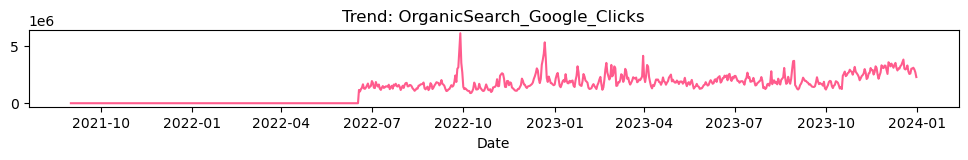

OrganicSearch_Google_Impressions


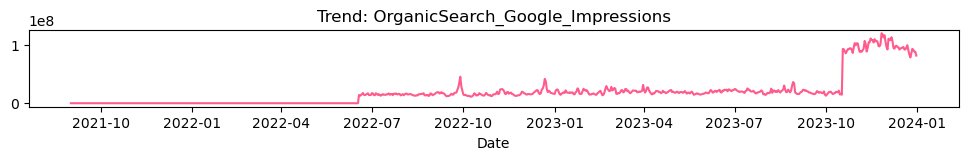

OrganicSearch_Google_CTR


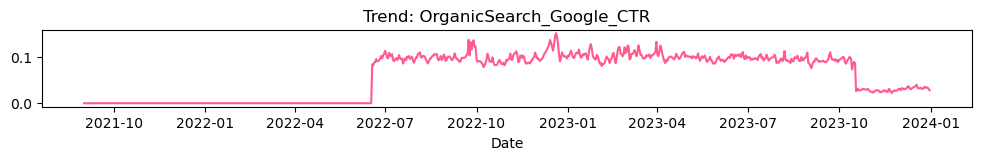

OrganicSearch_Google_Position


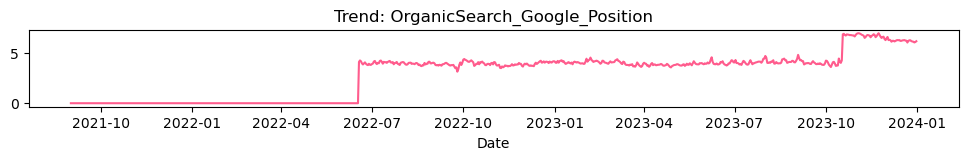

SEO_Clicks_OrganicSearch_Desktop_MobileWeb(Combined)


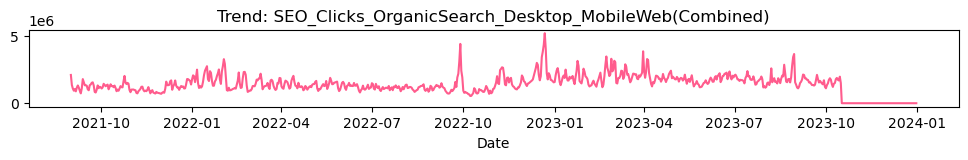

In [18]:
trend_chart_(df_v2, organic_search_impu, organic_search_impu, 'Date')

OrganicSearch_Google_Clicks


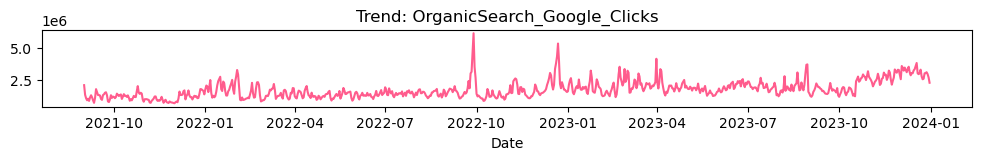

OrganicSearch_Google_Impressions


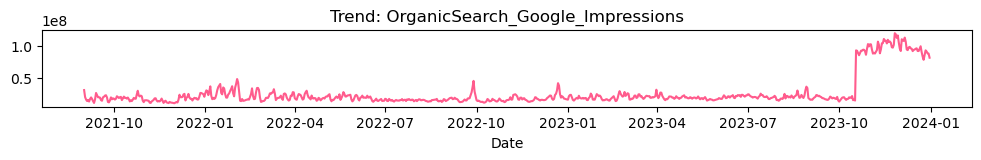

OrganicSearch_Google_CTR


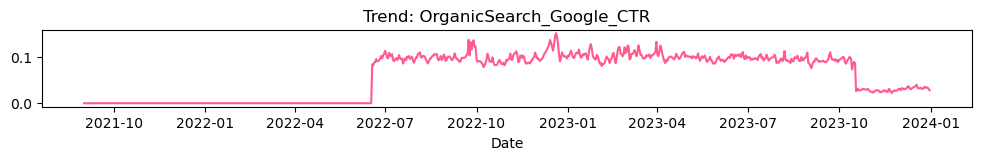

OrganicSearch_Google_Position


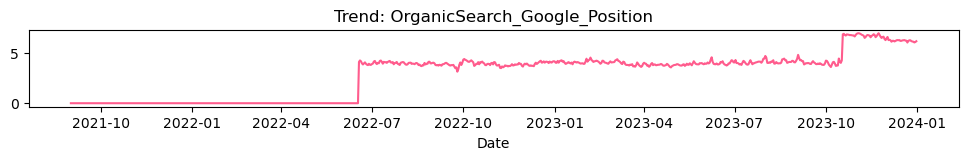

SEO_Clicks_OrganicSearch_Desktop_MobileWeb(Combined)


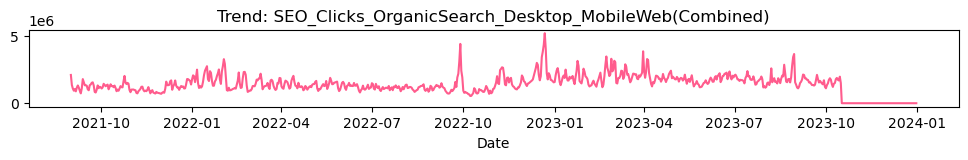

In [70]:
trend_chart_(df_v2_, organic_search_impu, organic_search_impu, 'Date')

In [19]:
df_v2[['Date']+ organic_search_impu].to_clipboard()

In [20]:
# df_ = pd.read_csv(file_path+"Final_merged_data.csv")
# df_['Date'] = pd.to_datetime(df_['Date'])
# df_

In [21]:
# plt.figure(figsize=(15, 3))
# sns.lineplot(df_['Date'], df_['Overall_Product_Visits'], color='#ff5c8d')
# plt.xlabel('Date')
# plt.ylabel('Visits')
# plt.grid(False)
# # plt.legend(loc='upper right')
# plt.show()

In [22]:
# import matplotlib.pyplot as plt
# import matplotlib.ticker as mtick
# import seaborn as sns

# def millions_formatter(x, pos):
#     return f'{x / 1e6:.0f}'

# def thousands_formatter(x, pos):
#     return f'{x / 1e3:,.0f}'

# def trend_chart_(df_, cols, chart_title, date_var):
#     min_date = temp[date_var].min()
#     max_date = temp[date_var].max()
#     date_range = pd.date_range(start=min_date, end=max_date, freq='D')
# #     df_['flag']=1
#     df_temp_flag = pd.DataFrame({'Date':date_range,
#                                 'flag':0})
#     df_=pd.merge(df_,df_temp_flag,on='Date',how='outer')
    
# #     df_['Total Engagements (SUM)']=df_['Total Engagements (SUM)'].fillna(-1000)
#     for idx, var in  enumerate(cols):
# #         plt.figure(figsize=(20, 3))
#         plt.figure(figsize=(12, 1))
#         print (df_[date_var])
#         print (df_[var])
#         print (chart_title,idx)
#         sns.lineplot(df_[date_var], df_[var], label=chart_title[idx], color='#ff5c8d')
# #         sns.lineplot(df_temp_flag['Date'], df_temp_flag['flag'], color='white')
# #         sns.lineplot(df_temp_flag['Date'], df_temp_flag['flag'], color='white')
#         plt.title('Trend: '+chart_title[idx])
# #         if ch not in ['Google', 'Bidease', 'LiftOff']:
# #         formatter = mtick.StrMethodFormatter("{x:,.0f}")
# #         plt.gca().yaxis.set_major_formatter(formatter)
#         if var == 'Impressions':
#             plt.gca().yaxis.set_major_formatter(millions_formatter)
#         else:
#             plt.gca().yaxis.set_major_formatter(thousands_formatter)
#         plt.xlabel(date_var)
# #         plt.ylabel(chart_title[idx]+" (in $)")
#         plt.ylabel(chart_title[idx])
# #         plt.xticks(rotation=45)
#         plt.grid(False)
#         plt.legend(loc='upper right')
#         plt.show()
        
# df_result_ = pd.DataFrame()
# # df_=df__.copy()
# date_var = 'Date'
# df_ = df_[~df_['Platform'].isna()]
# df_['Platform'] = np.where(df_['Platform']=='Tiktok', 'TikTok', df_['Platform'])
# df_['Platform'] = np.where(df_['Platform']=='Linkedin', 'LinkedIn', df_['Platform'])
# df_['Platform'] = np.where(df_['Platform']=='Youtube', 'YouTube', df_['Platform'])
# df_['Estimated Clicks (SUM)']=df_['Estimated Clicks (SUM)'].astype('float')
# df_['Impressions']=df_['Impressions'].astype('float')
# df_['Total Engagements (SUM)']=df_['Total Engagements (SUM)'].astype('float')
# missing_dates_new = {}
# for plt_ in df_['Platform'].unique():
#     print(plt_)
#     temp = df_[df_['Platform']==plt_]
#     #for plt_ in df_['Media Type'].unique():
#      #   print(plt_)
#       #  temp = df_[df_['Media Type']==plt_]
#     temp[date_var]=pd.to_datetime(temp[date_var])

# #     print(df_temp_flag)
# #     temp['Impressions'] = np.where((temp['Date'].dt.year==2021), np.nan, temp['Impressions'])
# #     print(plt,temp['Media Type'].nunique(),temp['Media Type'].unique(),temp['Source'].unique())
# #     print(plt,temp[['Estimated Clicks (SUM)', 'Impressions', 'Total Engagements (SUM)']].isna().sum())
# #     temp = temp.groupby(['Date', 'Platform']).agg({'Estimated Clicks (SUM)':'sum', 'Impressions':'sum', 'Total Engagements (SUM)':'sum'}).reset_index()
#     temp = temp.groupby(['Date', 'Platform'])['Impressions', 'Total Engagements (SUM)', 'Estimated Clicks (SUM)'].sum().reset_index()
#     cols = ['Impressions','Estimated Clicks (SUM)']
#     chart_title = ['Impressions','Estimated Clicks']
#     date_var = 'Date'
# #     print(temp.shape[0], temp.shape[0]/365)
# #     df_grp = temp.copy()
# #     df_grp = df_grp[(df_grp['Date']>='2021-09-01') & (df_grp['Date']<='2023-09-30')]
# #     print((1-(df_grp.shape[0]/760))*100)
    
#     trend_chart_(temp, cols, chart_title, date_var)

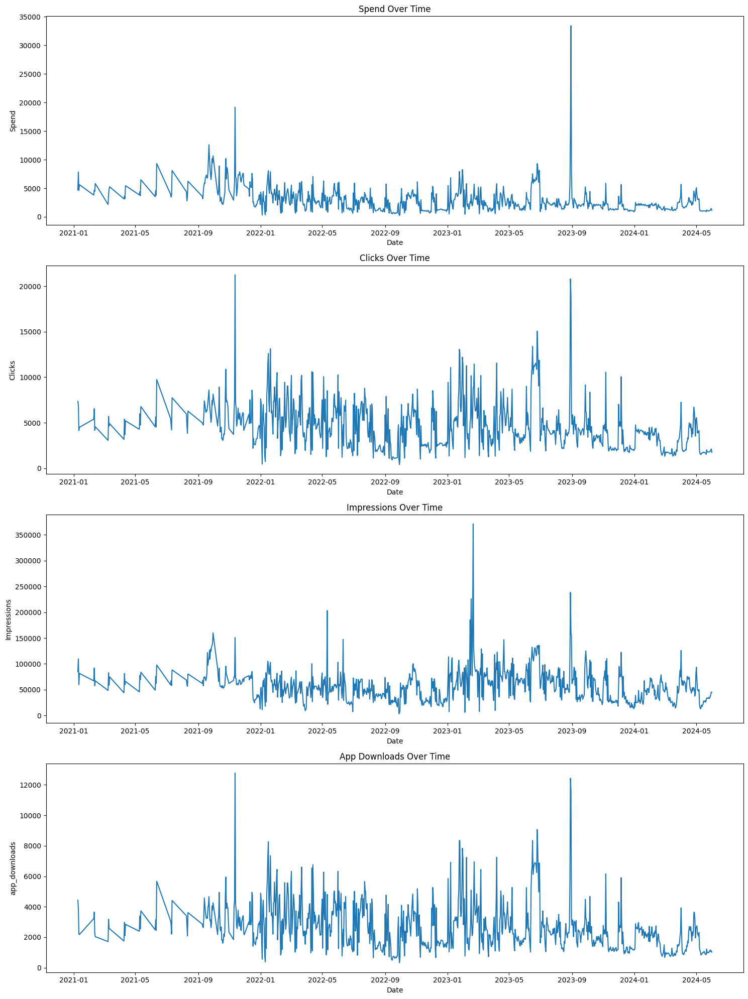

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Read the CSV file
file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (1).xlsx"  # Update with your actual file path
sheet_name = 'Apple Search Ads'  # Update with your actual sheet name
df_ad_campaign = pd.read_excel(file_path, sheet_name=sheet_name)

# Data Validation
# Check for missing values
missing_values = df_ad_campaign.isnull().sum()

# Check data types
data_types = df_ad_campaign.dtypes

# Convert Date column to datetime
df_ad_campaign['Date'] = pd.to_datetime(df_ad_campaign['Day'], format='%d-%m-%Y')

# Check for duplicates
duplicates = df_ad_campaign.duplicated().sum()

# Plotting trends for Spend, Clicks, Impressions, and app_downloads
fig, axes = plt.subplots(4, 1, figsize=(15, 20))

sns.lineplot(data=df_ad_campaign, x='Date', y='Spend', ax=axes[0])
axes[0].set_title('Spend Over Time')

sns.lineplot(data=df_ad_campaign, x='Date', y='Clicks', ax=axes[1])
axes[1].set_title('Clicks Over Time')

sns.lineplot(data=df_ad_campaign, x='Date', y='Impressions', ax=axes[2])
axes[2].set_title('Impressions Over Time')

sns.lineplot(data=df_ad_campaign, x='Date', y='app_downloads', ax=axes[3])
axes[3].set_title('App Downloads Over Time')

plt.tight_layout()
plt.show()

## Google

0    2021-01-09 00:00:00
1    2021-02-09 00:00:00
2    2021-03-09 00:00:00
3    2021-04-09 00:00:00
4    2021-05-09 00:00:00
Name: Day, dtype: object


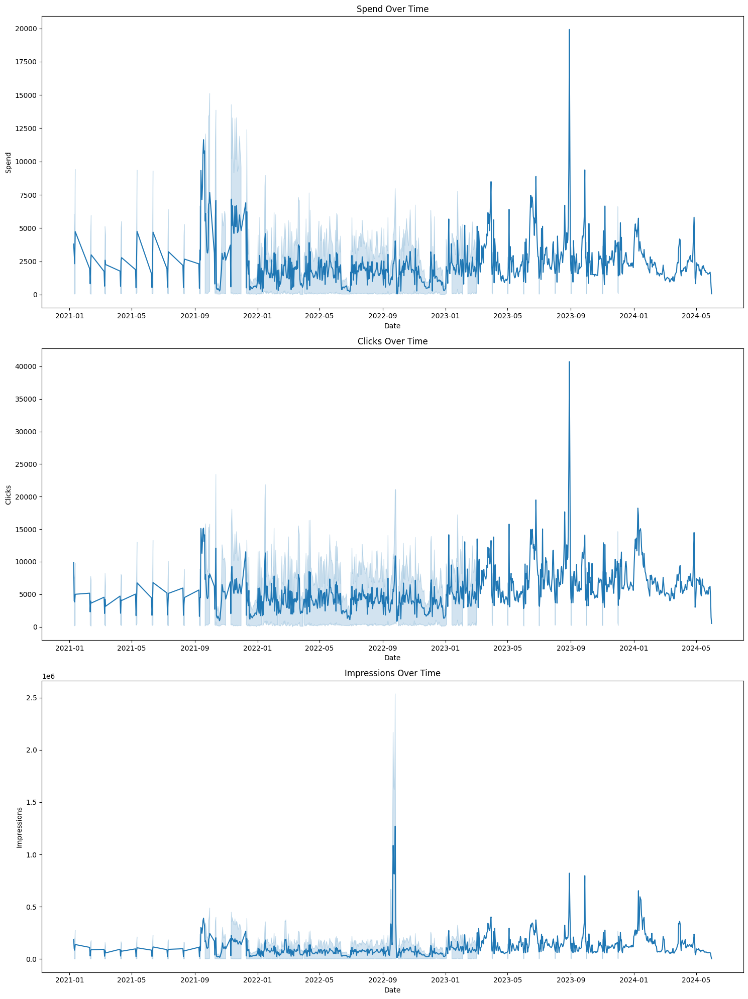

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Read the CSV file
file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (1).xlsx"  # Update with your actual file path
sheet_name = 'Google'  # Update with your actual sheet name
df_ad_campaign = pd.read_excel(file_path, sheet_name=sheet_name)

# Data Validation
# Check for missing values
missing_values = df_ad_campaign.isnull().sum()

# Check data types
data_types = df_ad_campaign.dtypes
# Check the date format
print(df_ad_campaign['Day'].head())

# Convert Date column to datetime
df_ad_campaign['Date'] = pd.to_datetime(df_ad_campaign['Day'], errors='coerce')
# Check for duplicates
duplicates = df_ad_campaign.duplicated().sum()

# Plotting trends for Spend, Clicks, Impressions, and app_downloads
fig, axes = plt.subplots(3, 1, figsize=(15, 20))

sns.lineplot(data=df_ad_campaign, x='Date', y='Spend', ax=axes[0])
axes[0].set_title('Spend Over Time')

sns.lineplot(data=df_ad_campaign, x='Date', y='Clicks', ax=axes[1])
axes[1].set_title('Clicks Over Time')

sns.lineplot(data=df_ad_campaign, x='Date', y='Impressions', ax=axes[2])
axes[2].set_title('Impressions Over Time')

#sns.lineplot(data=df_ad_campaign, x='Date', y='app_downloads', ax=axes[3])
#axes[3].set_title('App Downloads Over Time')

plt.tight_layout()
plt.show()

0    2021-01-09 00:00:00
1    2021-01-09 00:00:00
2    2021-02-09 00:00:00
3    2021-02-09 00:00:00
4    2021-03-09 00:00:00
Name: Day, dtype: object


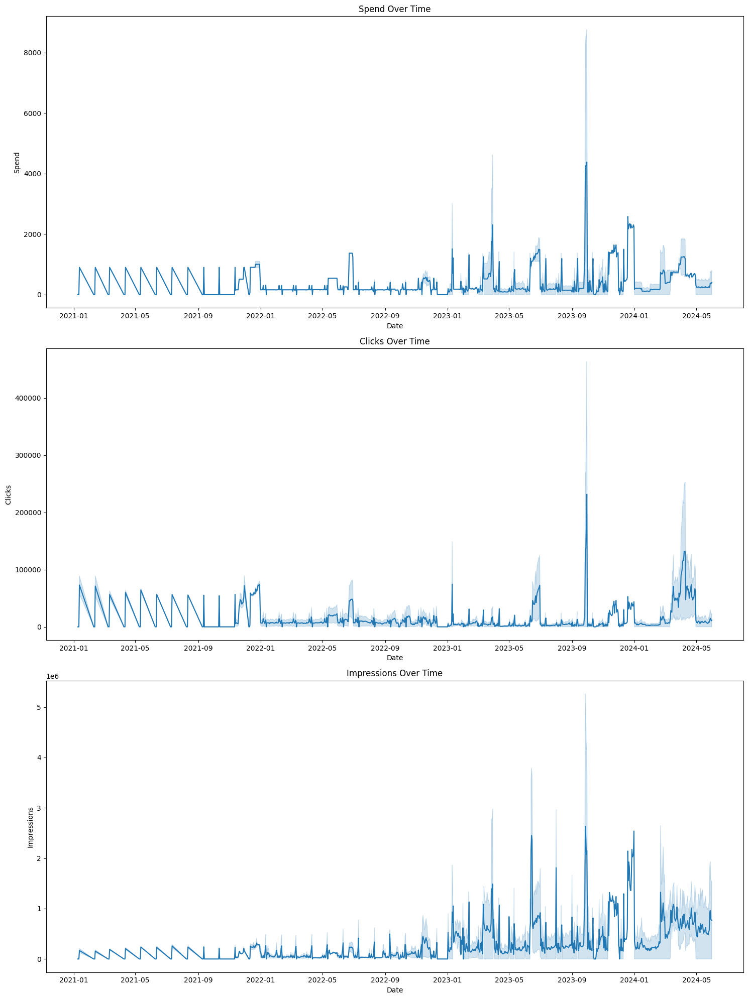

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Read the CSV file
file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (1).xlsx"  # Update with your actual file path
sheet_name = 'LiftOff'  # Update with your actual sheet name
df_ad_campaign = pd.read_excel(file_path, sheet_name=sheet_name)

# Data Validation
# Check for missing values
missing_values = df_ad_campaign.isnull().sum()

# Check data types
data_types = df_ad_campaign.dtypes
# Check the date format
print(df_ad_campaign['Day'].head())

# Convert Date column to datetime
df_ad_campaign['Date'] = pd.to_datetime(df_ad_campaign['Day'], errors='coerce')
# Check for duplicates
duplicates = df_ad_campaign.duplicated().sum()

# Plotting trends for Spend, Clicks, Impressions, and app_downloads
fig, axes = plt.subplots(3, 1, figsize=(15, 20))

sns.lineplot(data=df_ad_campaign, x='Date', y='Spend', ax=axes[0])
axes[0].set_title('Spend Over Time')

sns.lineplot(data=df_ad_campaign, x='Date', y='Clicks', ax=axes[1])
axes[1].set_title('Clicks Over Time')

sns.lineplot(data=df_ad_campaign, x='Date', y='Impressions', ax=axes[2])
axes[2].set_title('Impressions Over Time')

#sns.lineplot(data=df_ad_campaign, x='Date', y='app_downloads', ax=axes[3])
#axes[3].set_title('App Downloads Over Time')

plt.tight_layout()
plt.show()

TypeError: 'value' must be an instance of str or bytes, not a float

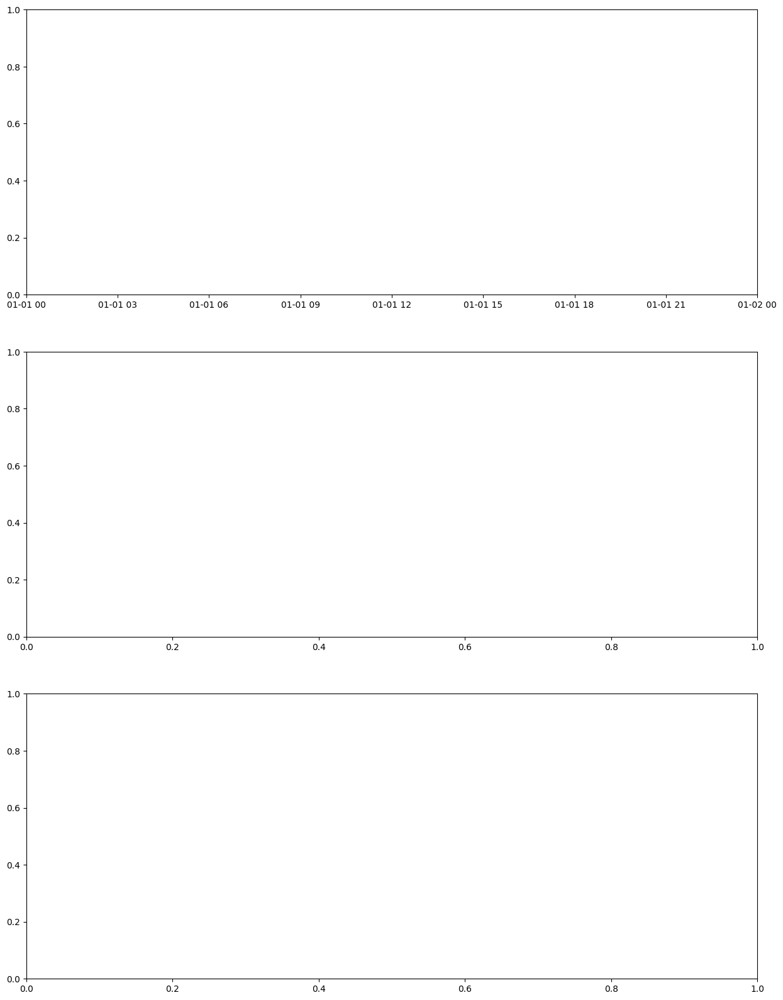

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Read the CSV file
file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (1).xlsx"  # Update with your actual file path
sheet_name = 'Bidease'  # Update with your actual sheet name
df_ad_campaign = pd.read_excel(file_path, sheet_name=sheet_name)

# Data Validation
# Check for missing values
missing_values = df_ad_campaign.isnull().sum()

# Check data types
data_types = df_ad_campaign.dtypes
# Check the date format
df_ad_campaign['Date'] = df_ad_campaign['Day'].astype(str).replace('nan', pd.NA)

# Convert Date column to datetime
df_ad_campaign['Date'] = pd.to_datetime(df_ad_campaign['Date'], errors='coerce')
# Check for duplicates
duplicates = df_ad_campaign.duplicated().sum()

# Plotting trends for Spend, Clicks, Impressions, and app_downloads
fig, axes = plt.subplots(3, 1, figsize=(15, 20))

sns.lineplot(data=df_ad_campaign, x='Date', y='Spend', ax=axes[0])
axes[0].set_title('Spend Over Time')

sns.lineplot(data=df_ad_campaign, x='Date', y='Clicks', ax=axes[1])
axes[1].set_title('Clicks Over Time')

sns.lineplot(data=df_ad_campaign, x='Date', y='Impressions', ax=axes[2])
axes[2].set_title('Impressions Over Time')

#sns.lineplot(data=df_ad_campaign, x='Date', y='app_downloads', ax=axes[3])
#axes[3].set_title('App Downloads Over Time')

plt.tight_layout()
plt.show()

0    2021-01-09 00:00:00
1    2021-02-09 00:00:00
2    2021-03-09 00:00:00
3    2021-04-09 00:00:00
4    2021-05-09 00:00:00
Name: event_date, dtype: object


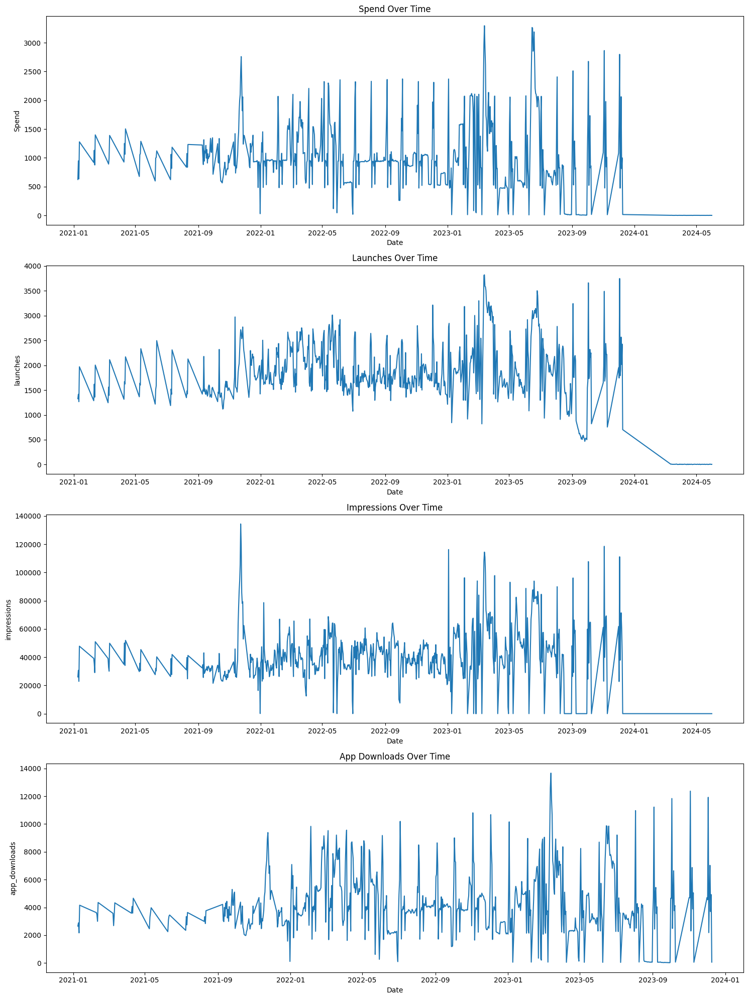

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Read the CSV file
file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (1).xlsx"  # Update with your actual file path
sheet_name = 'IronSource Aura'  # Update with your actual sheet name
df_ad_campaign = pd.read_excel(file_path, sheet_name=sheet_name)

# Data Validation
# Check for missing values
missing_values = df_ad_campaign.isnull().sum()

# Check data types
data_types = df_ad_campaign.dtypes
# Check the date format
print(df_ad_campaign['event_date'].head())

# Convert Date column to datetime
df_ad_campaign['Date'] = pd.to_datetime(df_ad_campaign['event_date'], errors='coerce')
# Check for duplicates
duplicates = df_ad_campaign.duplicated().sum()

# Plotting trends for Spend, Clicks, Impressions, and app_downloads
fig, axes = plt.subplots(4, 1, figsize=(15, 20))

sns.lineplot(data=df_ad_campaign, x='Date', y='Spend', ax=axes[0])
axes[0].set_title('Spend Over Time')

sns.lineplot(data=df_ad_campaign, x='Date', y='launches', ax=axes[1])
axes[1].set_title('Launches Over Time')

sns.lineplot(data=df_ad_campaign, x='Date', y='impressions', ax=axes[2])
axes[2].set_title('Impressions Over Time')

sns.lineplot(data=df_ad_campaign, x='Date', y='app_downloads', ax=axes[3])
axes[3].set_title('App Downloads Over Time')

plt.tight_layout()
plt.show()

0    2022-12-05 00:00:00
1                5/16/22
2                5/17/22
3                5/17/22
4                5/18/22
Name: Day, dtype: object


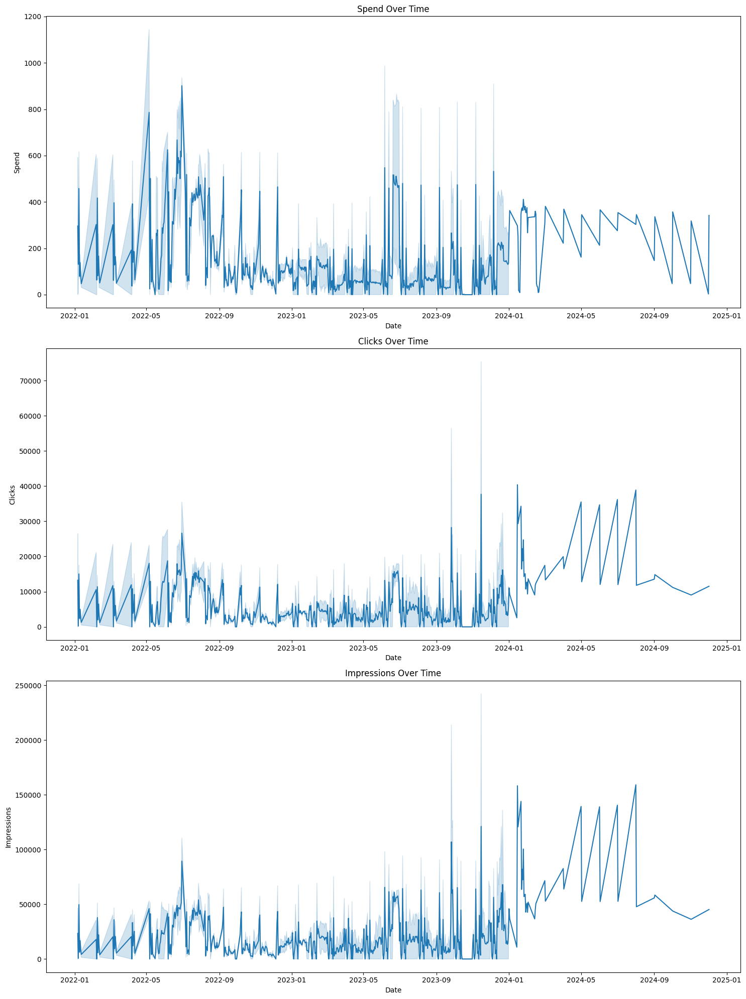

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Read the CSV file
file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (1).xlsx"  # Update with your actual file path
sheet_name = 'IronSource Sonic'  # Update with your actual sheet name
df_ad_campaign = pd.read_excel(file_path, sheet_name=sheet_name)

# Data Validation
# Check for missing values
missing_values = df_ad_campaign.isnull().sum()

# Check data types
data_types = df_ad_campaign.dtypes
# Check the date format
print(df_ad_campaign['Day'].head())

# Convert Date column to datetime
df_ad_campaign['Date'] = pd.to_datetime(df_ad_campaign['Day'])
# Check for duplicates
duplicates = df_ad_campaign.duplicated().sum()

# Plotting trends for Spend, Clicks, Impressions, and app_downloads
fig, axes = plt.subplots(3, 1, figsize=(15, 20))

sns.lineplot(data=df_ad_campaign, x='Date', y='Spend', ax=axes[0])
axes[0].set_title('Spend Over Time')

sns.lineplot(data=df_ad_campaign, x='Date', y='Clicks', ax=axes[1])
axes[1].set_title('Clicks Over Time')

sns.lineplot(data=df_ad_campaign, x='Date', y='Impressions', ax=axes[2])
axes[2].set_title('Impressions Over Time')

#sns.lineplot(data=df_ad_campaign, x='Date', y='app_downloads', ax=axes[3])
#axes[3].set_title('App Downloads Over Time')

plt.tight_layout()
plt.show()

In [32]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns

def millions_formatter(x, pos):
    return f'{x / 1e6:.0f}'

def thousands_formatter(x, pos):
    return f'{x / 1e3:,.0f}'

def trend_chart_2(df_, cols, chart_title, date_var):
    df_['Date'] = pd.to_datetime(df_['Date'])
    df_=df_.sort_values(by='Date')
    temp=df_.copy()
    min_date = temp[date_var].min()
    max_date = temp[date_var].max()
    date_range = pd.date_range(start=min_date, end=max_date, freq='D')
    df_temp_flag = pd.DataFrame({'Date':date_range})
    df_=pd.merge(df_,df_temp_flag,on='Date',how='outer')
    for idx, var in  enumerate(cols):
        print(var)
        df_=df_.fillna(0).reset_index(drop=True)
        plt.figure(figsize=(12, 1.5))
        var_ = var+"_"
        df_[var_] = [val / 1e3 for val in df_[var]]
        df_=df_.sort_values(by='Date')
        sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d')
#         sns.regplot(data=df_, x=date_var, y=var, color='#ff5c8d', scatter_kws={'s': 100})
        y = [val / 1e3 for val in df_[var]]
#         y = [val / 1e6 for val in var]
        x = np.arange(len(df_.index))  # Use numerical index as x for regression calculation
#        y = df_[var]
#        print(x)
#        print(y)
        m, b = np.polyfit(x, y, 1)
        plt.plot(df_['Date'], m*x + b)
        pd.DataFrame(df_['Date'], m*x + b).to_clipboard()
        plt.title('Trend: '+chart_title[idx])
        plt.xlabel(date_var)
        plt.ylabel("In Thousand")
        plt.grid(False)
        plt.show()

Impressions


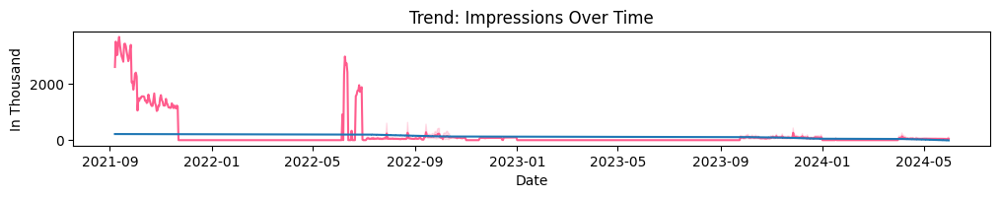

Spend


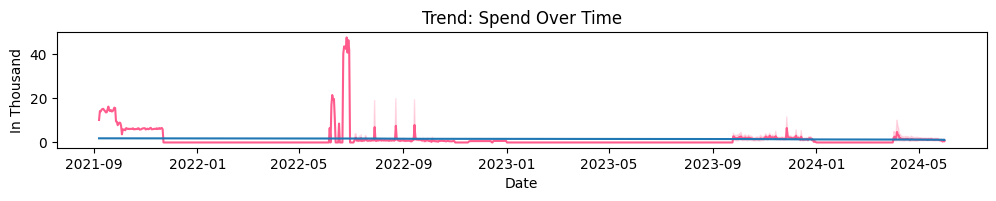

In [33]:
file_path = "C:\\Users\\DeepakArun\\Desktop\\Data Check.xlsx"  # Update with your actual file path
sheet_name = 'Sheet4'  # Update with your actual sheet name 7.6
df = pd.read_excel(file_path, sheet_name=sheet_name)
# Define columns to plot and corresponding titles
cols_to_plot = ['Impressions', 'Spend']
plot_titles = ['Impressions Over Time', 'Spend Over Time']

# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


In [13]:
trend_chart_2(df, cols, chart_title, date_var)

NameError: name 'date_var' is not defined

In [6]:
cols = df.columns

In [7]:
chart_title = df.columns

In [33]:
date_var = df['Date']

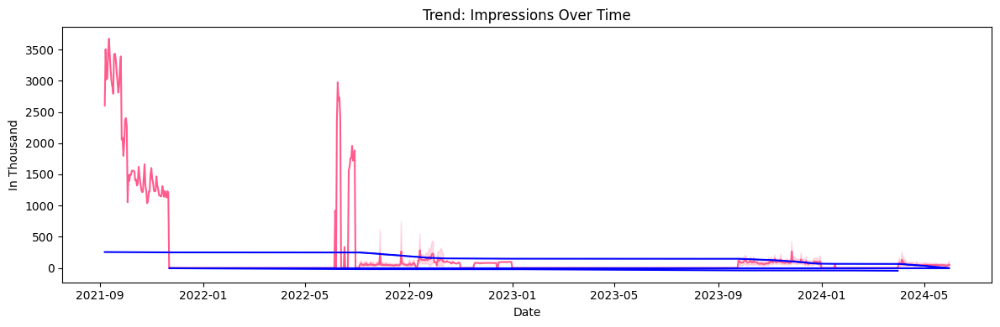

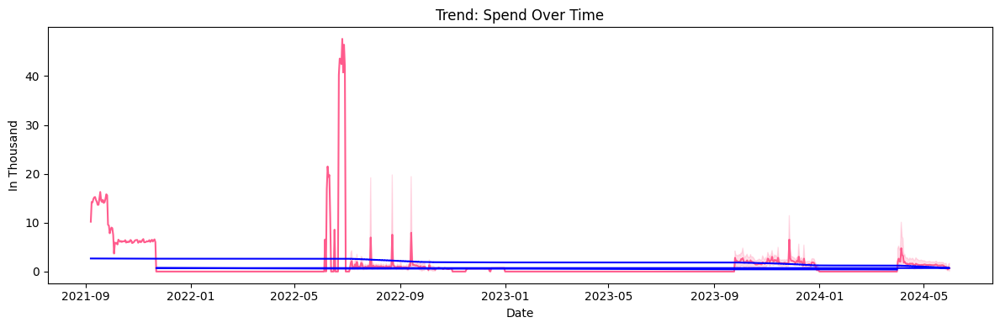

In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def millions_formatter(x, pos):
    return f'{x / 1e6:.0f}'

def thousands_formatter(x, pos):
    return f'{x / 1e3:,.0f}'

def trend_chart_2(df_, cols, chart_title, date_var):
    df_['Date'] = pd.to_datetime(df_['Date'], format='%d-%m-%Y')  # Assuming date format is day-month-year
    df_['Spend'] = df_['Spend'].replace('[\$,]', '', regex=True).astype(float)  # Remove '$' and convert Spend to float
    
    min_date = df_[date_var].min()
    max_date = df_[date_var].max()
    date_range = pd.date_range(start=min_date, end=max_date, freq='D')
    df_temp_flag = pd.DataFrame({'Date': date_range})
    df_ = pd.merge(df_, df_temp_flag, on='Date', how='outer')
    
    for idx, var in enumerate(cols):
        plt.figure(figsize=(12, 4))
        var_ = var + "_"
        df_[var_] = df_[var].fillna(0) / 1e3  # Convert var to thousands and handle NaNs
        sns.lineplot(data=df_, x=date_var, y=var_, color='#ff5c8d')
        
        # Add trend line (optional)
        x = np.arange(len(df_.index))
        y = df_[var_]  # Use var_ instead of var for y-axis
        m, b = np.polyfit(x, y, 1)
        plt.plot(df_['Date'], m*x + b, color='blue', linestyle='-')
        
        plt.title('Trend: ' + chart_title[idx])
        plt.xlabel(date_var)
        plt.ylabel("In Thousand")
        plt.grid(False)
        plt.tight_layout()
        plt.show()

file_path = "C:\\Users\\DeepakArun\\Desktop\\Data Check.xlsx"  # Update with your actual file path
sheet_name = 'Sheet4'  # Update with your actual sheet name 7.6
df = pd.read_excel(file_path, sheet_name=sheet_name)
# Define columns to plot and corresponding titles
cols_to_plot = ['Impressions', 'Spend']
plot_titles = ['Impressions Over Time', 'Spend Over Time']

# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


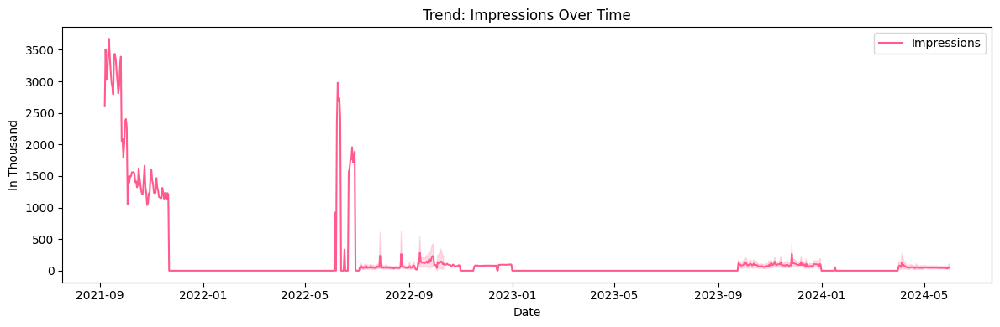

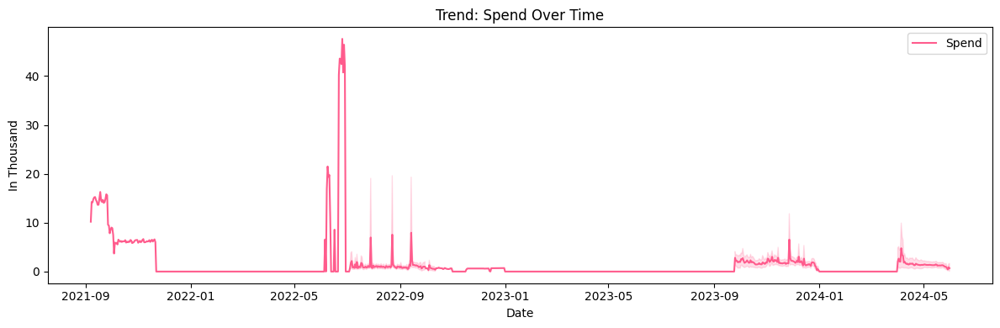

In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def trend_chart_2(df_, cols, chart_title, date_var):
    df_['Date'] = pd.to_datetime(df_['Date'], format='%d-%m-%Y')  # Assuming date format is day-month-year
    df_['Spend'] = df_['Spend'].replace('[\$,]', '', regex=True).astype(float)  # Remove '$' and convert Spend to float
    
    min_date = df_[date_var].min()
    max_date = df_[date_var].max()
    date_range = pd.date_range(start=min_date, end=max_date, freq='D')
    df_temp_flag = pd.DataFrame({'Date': date_range})
    df_ = pd.merge(df_, df_temp_flag, on='Date', how='outer')
    
    for idx, var in enumerate(cols):
        plt.figure(figsize=(12, 4))
        var_ = var + "_"
        df_[var_] = df_[var].fillna(0) / 1e3  # Convert var to thousands and handle NaNs
        sns.lineplot(data=df_, x=date_var, y=var_, color='#ff5c8d', label=var)  # Add label for legend
        
        # Add trend line (optional)
        #x = np.arange(len(df_.index))
        #y = df_[var_]  # Use var_ instead of var for y-axis
       # m, b = np.polyfit(x, y, 1)
       # plt.plot(df_['Date'], m*x + b, color='blue', linestyle='--', label=f'Trend {var}')
        
        plt.title('Trend: ' + chart_title[idx])
        plt.xlabel(date_var)
        plt.ylabel("In Thousand")
        plt.grid(False)
        plt.legend()  # Show legend
        plt.tight_layout()
        plt.show()
        
file_path = "C:\\Users\\DeepakArun\\Desktop\\Data Check.xlsx"  # Update with your actual file path
sheet_name = 'Sheet4'  # Update with your actual sheet name 7.6
df = pd.read_excel(file_path, sheet_name=sheet_name)
# Define columns to plot and corresponding titles
cols_to_plot = ['Impressions', 'Spend']
plot_titles = ['Impressions Over Time', 'Spend Over Time']

# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


In [2]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
import pandas as pd
import numpy as np

def millions_formatter(x, pos):
    return f'{x / 1e6:.0f}'

def thousands_formatter(x, pos):
    return f'{x / 1e3:,.0f}'

def trend_chart_2(df_, cols, chart_title, date_var):
    df_['Date'] = pd.to_datetime(df_['Date'])
    df_=df_.sort_values(by='Date')
    temp=df_.copy()
    min_date = temp[date_var].min()
    max_date = temp[date_var].max()
    date_range = pd.date_range(start=min_date, end=max_date, freq='D')
    df_temp_flag = pd.DataFrame({'Date':date_range})
    df_=pd.merge(df_,df_temp_flag,on='Date',how='outer')
    for idx, var in  enumerate(cols):
        print(var)
        df_=df_.fillna(0).reset_index(drop=True)
        plt.figure(figsize=(12, 3))
        var_ = var+"_"
        df_[var_] = [val / 1e3 for val in df_[var]]
        df_=df_.sort_values(by='Date')
        sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)
#         sns.regplot(data=df_, x=date_var, y=var, color='#ff5c8d', scatter_kws={'s': 100})
        y = [val / 1e3 for val in df_[var]]
#         y = [val / 1e6 for val in var]
        x = np.arange(len(df_.index))  # Use numerical index as x for regression calculation
#        y = df_[var]
#        print(x)
#        print(y)
        m, b = np.polyfit(x, y, 1)
        plt.plot(df_['Date'], m*x + b)
        pd.DataFrame(df_['Date'], m*x + b).to_clipboard()
        plt.title('Trend: '+chart_title[idx])
        plt.xlabel(date_var)
        plt.ylabel("In Thousands")
        plt.grid(False)
        plt.show()

In [4]:
file_path = "C:\Users\DeepakArun\Desktop\BL\BL_TWC _ Marketing Spend Data (2).xlsx"  # Update with your actual file path
sheet_name = 'Apple Search Ads'  # Update with your actual sheet name 7.6
df = pd.read_excel(file_path, sheet_name=sheet_name)
# Define columns to plot and corresponding titles
cols_to_plot = ['Impressions']
plot_titles = ['iOS Installs']

# Generate trend charts
trend_chart_2(df1_grouped, cols_to_plot, plot_titles, 'Date')


NameError: name 'df1_grouped' is not defined

In [71]:
df1_grouped['Installs'] = df1_grouped['Installs'].clip(upper=100000)

Installs


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_25280\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


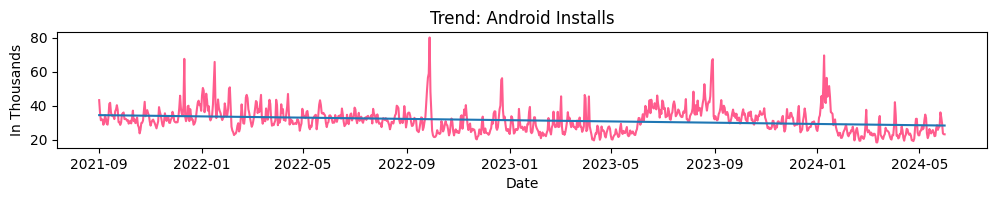

In [63]:
file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (4).xlsx"  # Update with your actual file path
sheet_name = 'AF_installs_AND_TWC'  # Update with your actual sheet name 7.6
df = pd.read_excel(file_path, sheet_name=sheet_name)
# Define columns to plot and corresponding titles
cols_to_plot = ['Installs']
plot_titles = ['Android Installs']

# Generate trend charts
trend_chart_2(df2_grouped, cols_to_plot, plot_titles, 'Date')


In [67]:
file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (4).xlsx"  # Update with your actual file path
sheet_name = 'AF_installs_IOS_TWC'  # Update with your actual sheet name 7.6
df1 = pd.read_excel(file_path, sheet_name=sheet_name)

file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (4).xlsx"  # Update with your actual file path
sheet_name = 'AF_installs_AND_TWC'  # Update with your actual sheet name 7.6
df2 = pd.read_excel(file_path, sheet_name=sheet_name)

df1['Date'] = pd.to_datetime(df1['Date'], format='%d-%m-%Y')

# Group by date and aggregate the metrics
df1_grouped = df1.groupby('Date').sum().reset_index()

df2['Date'] = pd.to_datetime(df2['Date'], format='%d-%m-%Y')

# Group by date and aggregate the metrics
df2_grouped = df2.groupby('Date').sum().reset_index()


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_25280\2528043147.py:12: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df1_grouped = df1.groupby('Date').sum().reset_index()
C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_25280\2528043147.py:17: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df2_grouped = df2.groupby('Date').sum().reset_index()


In [62]:
df1_grouped.describe()

,Impressions,Clicks,Installs,Total Cost
count,1.004000e+03,1004.000000,1004.000000,1004.000000
mean,5.682482e+05,20472.022908,19948.092629,2564.870209
std,1.490641e+06,48862.947722,9371.792553,2411.773830
min,2.480000e+03,1576.000000,7900.000000,0.000000
25%,6.308175e+04,4593.750000,14709.750000,1258.342550
50%,1.062840e+05,7014.500000,18344.000000,2129.607150
75%,3.454538e+05,13045.250000,22680.500000,3235.307700
max,1.355649e+07,364918.000000,156878.000000,28782.257600


In [14]:
df2_grouped

,Date,Impressions,Clicks,Installs,Total Cost
0,2021-09-01,1756981.0,88632.0,43230,957.6300
1,2021-09-02,1580563.0,63163.0,35850,767.3900
2,2021-09-03,2965585.0,73282.0,31415,824.2400
3,2021-09-04,2570163.0,70627.0,31752,974.3600
4,2021-09-05,2539505.0,68123.0,31913,971.6800
...,...,...,...,...,...
999,2024-05-27,3347171.0,70479.0,33149,4302.2285
1000,2024-05-28,3673096.0,44419.0,29437,4882.9305
1001,2024-05-29,3692717.0,39795.0,23652,4892.2872
1002,2024-05-30,3342142.0,36076.0,23200,4181.1097


In [59]:
df2_grouped.describe()

,Impressions,Clicks,Installs,Total Cost
count,1.004000e+03,1004.000000,1004.000000,1004.000000
mean,8.946224e+05,89473.418327,31368.755976,4492.071996
std,7.637393e+05,43192.389703,7140.783307,3330.586771
min,7.622900e+04,19416.000000,18362.000000,0.000000
25%,3.719588e+05,52589.250000,26109.500000,1467.746750
50%,5.427565e+05,87317.500000,30833.500000,4017.013900
75%,1.216208e+06,122046.250000,34860.000000,6512.473225
max,3.692717e+06,416076.000000,80037.000000,24291.424200


In [52]:
# Merge the datasets on the Date column with suffixes
merged_df = pd.merge(df1_grouped, df2_grouped, on='Date', suffixes=('_iOS', '_Android'))

In [53]:
merged_df.head()

,Date,Impressions_iOS,Clicks_iOS,Installs_iOS,Total Cost_iOS,Impressions_Android,Clicks_Android,Installs_Android,Total Cost_Android
0,2021-09-01,83678.0,9963.0,32511,0.0,1756981.0,88632.0,43230,957.63
1,2021-09-02,66296.0,5905.0,24647,0.0,1580563.0,63163.0,35850,767.39
2,2021-09-03,41984.0,3812.0,16793,0.0,2965585.0,73282.0,31415,824.24
3,2021-09-04,43522.0,4128.0,16449,0.0,2570163.0,70627.0,31752,974.36
4,2021-09-05,45275.0,5407.0,17609,0.0,2539505.0,68123.0,31913,971.68


In [56]:
merged_df.describe()

,Impressions_iOS,Clicks_iOS,Installs_iOS,Total Cost_iOS,Impressions_Android,Clicks_Android,Installs_Android,Total Cost_Android,Total_Installs
count,1.004000e+03,1004.000000,1004.000000,1004.000000,1.004000e+03,1004.000000,1004.000000,1004.000000,1004.000000
mean,5.682482e+05,20472.022908,19948.092629,2564.870209,8.946224e+05,89473.418327,31368.755976,4492.071996,51316.848606
std,1.490641e+06,48862.947722,9371.792553,2411.773830,7.637393e+05,43192.389703,7140.783307,3330.586771,15363.106595
min,2.480000e+03,1576.000000,7900.000000,0.000000,7.622900e+04,19416.000000,18362.000000,0.000000,27320.000000
25%,6.308175e+04,4593.750000,14709.750000,1258.342550,3.719588e+05,52589.250000,26109.500000,1467.746750,42053.250000
50%,1.062840e+05,7014.500000,18344.000000,2129.607150,5.427565e+05,87317.500000,30833.500000,4017.013900,48832.000000
75%,3.454538e+05,13045.250000,22680.500000,3235.307700,1.216208e+06,122046.250000,34860.000000,6512.473225,56677.000000
max,1.355649e+07,364918.000000,156878.000000,28782.257600,3.692717e+06,416076.000000,80037.000000,24291.424200,236915.000000


In [55]:
merged_df['Total_Installs'] = merged_df['Installs_iOS'] + merged_df['Installs_Android']

In [57]:
merged_df['Total_Installs'] = merged_df['Total_Installs'].clip(upper=180000)

Total_Installs


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_25280\894735828.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


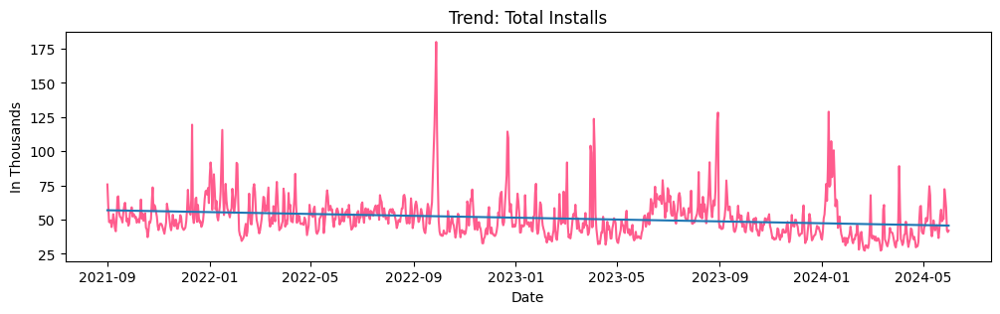

In [74]:
#file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (4).xlsx"  # Update with your actual file path
#sheet_name = 'AF_installs_AND_TWC'  # Update with your actual sheet name 7.6
#df = pd.read_excel(file_path, sheet_name=sheet_name)
# Define columns to plot and corresponding titles
cols_to_plot = ['Total_Installs']
plot_titles = ['Total Installs']

# Generate trend charts
trend_chart_2(merged_df, cols_to_plot, plot_titles, 'Date')


In [216]:
file_path = "C:\\Users\\DeepakArun\\Desktop\\TWC\\Data\\US All Product (Web-App) Visits 2021-10.17.23 - REVISED 1.4.24.xlsx"  # Update with your actual file path
df1_visits=pd.read_excel(file_path)
file_path = "C:\\Users\\DeepakArun\\Desktop\\TWC\\Data\\US All Product (Web-App) Visits 10.1.23-12.31.23.xlsx"
df2_visits=pd.read_excel(file_path)

# Ensure the date formats are consistent and convert to datetime
df1_visits['Date'] = pd.to_datetime(df1_visits['Date'], format='%d-%m-%Y')
df2_visits['Date'] = pd.to_datetime(df2_visits['Date'], format='%m/%d/%Y')

# Append the second table to the first
df_combined = df1_visits.append(df2_visits, ignore_index=True)


In [217]:
file_path = "C:\\Users\\DeepakArun\\Downloads\\US All Product (Web-App) Visits 1.1.24-5.31.24 (2).xlsx"  # Update with your actual file path
df3_visits=pd.read_excel(file_path)

# Ensure the date formats are consistent and convert to datetime
df3_visits['Date'] = pd.to_datetime(df3_visits['Date'], format='%d-%m-%Y')

# Append the second table to the first
df_combined_new = df_combined.append(df3_visits, ignore_index=True)


In [ ]:
"C:\Users\DeepakArun\Desktop\TWC\Data\US All Product (Web-App) Visits 10.1.23-12.31.23.xlsx"

In [ ]:
"C:\Users\DeepakArun\Desktop\TWC\Data\US All Product (Web-App) Visits 2021-10.17.23 - REVISED 1.4.24.xlsx"

In [80]:
df_combined_new.tail()

,Region,Platform,Brand,Product,Date,Metric,Value,Goal,% of Goal,US Weather Impact Rating
4983,US,WEB,TWC,TWC Web,2024-05-30,Visits,2811162.0,0.0,-,-
4984,US,APPS,TWC,TWC Universal Android 4G+,2024-05-31,Visits,9347699.0,0.0,-,-
4985,US,APPS,TWC,TWC Universal iOS 4G+,2024-05-31,Visits,30517122.0,0.0,-,-
4986,US,MOBILE WEB,TWC,TWC Mobile Web,2024-05-31,Visits,7005198.0,0.0,-,-
4987,US,WEB,TWC,TWC Web,2024-05-31,Visits,2632199.0,0.0,-,-


In [ ]:
"C:\Users\DeepakArun\Downloads\US All Product (Web-App) Visits 1.1.24-5.31.24 (2).xlsx"

In [218]:
# Filter data from September 1st, 2021 onwards
start_date = pd.to_datetime('2021-09-01')
df_combined_new1 = df_combined_new[df_combined_new['Date'] >= start_date]
df_combined_new1['Value'] = df_combined_new1['Value'].astype(int)

In [219]:
# Ensure the date formats are consistent and convert to datetime
df_combined_new1['Date'] = pd.to_datetime(df_combined_new1['Date'], format='%Y-%m-%d')

# Get the unique products
unique_products = df_combined_new1['Product'].unique()

# Create separate dataframes for each product
product_dfs = {}
for product in unique_products:
    product_key = product.replace(' ', '_').replace('+', 'Plus').replace('.', '').replace('-', '_')
    product_dfs[product_key] = df_combined_new1[df_combined_new1['Product'] == product]

# Extract individual DataFrames into separate variables
df_TWC_Web = product_dfs['TWC_Web']
df_TWC_Universal_Android_4GPlus = product_dfs['TWC_Universal_Android_4GPlus']
df_TWC_Universal_iOS_4GPlus = product_dfs['TWC_Universal_iOS_4GPlus']
df_TWC_Mobile_Web = product_dfs['TWC_Mobile_Web']

In [220]:
df_TWC_Web.head()

,Region,Platform,Brand,Product,Date,Metric,Value,Goal,% of Goal,US Weather Impact Rating
975,US,WEB,TWC,TWC Web,2021-09-01,Visits,6099679,3.594470e+06,1.696962,2.0
979,US,WEB,TWC,TWC Web,2021-09-02,Visits,3834823,3.622702e+06,1.058553,1.75
983,US,WEB,TWC,TWC Web,2021-09-03,Visits,3289317,3.305578e+06,0.995081,1.5
987,US,WEB,TWC,TWC Web,2021-09-04,Visits,2382041,2.542366e+06,0.936939,1.5
991,US,WEB,TWC,TWC Web,2021-09-05,Visits,2587831,2.582180e+06,1.002188,1.25


In [221]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
import pandas as pd
import numpy as np

def millions_formatter(x, pos):
    return f'{x / 1e6:.0f}'

def thousands_formatter(x, pos):
    return f'{x / 1e3:,.0f}'

def trend_chart_2(df_, cols, chart_title, date_var):
    df_['Date'] = pd.to_datetime(df_['Date'])
    df_=df_.sort_values(by='Date')
    temp=df_.copy()
    min_date = temp[date_var].min()
    max_date = temp[date_var].max()
    date_range = pd.date_range(start=min_date, end=max_date, freq='D')
    df_temp_flag = pd.DataFrame({'Date':date_range})
    df_=pd.merge(df_,df_temp_flag,on='Date',how='outer')
    for idx, var in  enumerate(cols):
        print(var)
        df_=df_.fillna(0).reset_index(drop=True)
        plt.figure(figsize=(12, 1.5))
        var_ = var+"_"
        df_[var_] = [val / 1e6 for val in df_[var]]
        df_=df_.sort_values(by='Date')
        sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)
#         sns.regplot(data=df_, x=date_var, y=var, color='#ff5c8d', scatter_kws={'s': 100})
        y = [val / 1e6 for val in df_[var]]
#         y = [val / 1e6 for val in var]
        x = np.arange(len(df_.index))  # Use numerical index as x for regression calculation
#        y = df_[var]
#        print(x)
#        print(y)
        m, b = np.polyfit(x, y, 1)
        plt.plot(df_['Date'], m*x + b)
        pd.DataFrame(df_['Date'], m*x + b).to_clipboard()
        plt.title('Trend: '+chart_title[idx])
        plt.xlabel(date_var)
        plt.ylabel("In Millions")
        plt.grid(False)
        plt.show()

Value


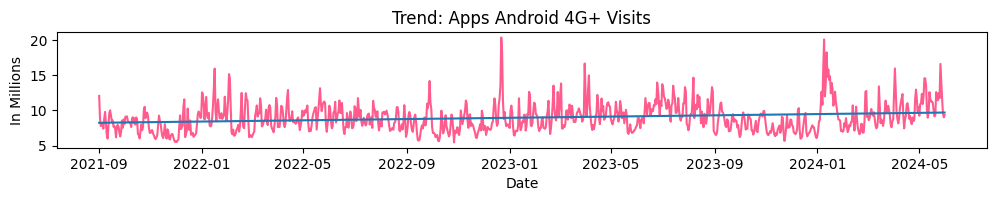

In [222]:
#file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (4).xlsx"  # Update with your actual file path
#sheet_name = 'AF_installs_AND_TWC'  # Update with your actual sheet name 7.6
#df = pd.read_excel(file_path, sheet_name=sheet_name)
# Define columns to plot and corresponding titles
cols_to_plot = ['Value']
plot_titles = ['Apps Android 4G+ Visits']

# Generate trend charts
trend_chart_2(df_TWC_Universal_Android_4GPlus, cols_to_plot, plot_titles, 'Date')


In [223]:
# Filter data from September 1st, 2021 onwards
start_date = pd.to_datetime('2021-09-01')
df_combined_new1 = df_combined_new[df_combined_new['Date'] >= start_date]
df_combined_new1['Value'] = df_combined_new1['Value'].astype(int)

# Ensure the date column is in datetime format
df_combined_new1['Date'] = pd.to_datetime(df_combined_new1['Date'], format='%Y-%m-%d')

# Combine 'MOBILE WEB' and 'WEB' entries into one DataFrame
df_web_mobile = df_combined_new1[df_combined_new1['Platform'].isin(['MOBILE WEB', 'WEB'])]

# Create a separate DataFrame for 'APPS' entries
df_apps = df_combined_new1[df_combined_new1['Platform'] == 'APPS']

# Replace spaces, special characters in 'Platform' column similar to 'Product' column
df_web_mobile['Platform'] = df_web_mobile['Platform'].apply(lambda x: x.replace(' ', '_').replace(' ', '_').replace('+', 'Plus').replace('.', '').replace('-', '_'))
df_apps['Platform'] = df_apps['Platform'].apply(lambda x: x.replace(' ', '_').replace(' ', '_').replace('+', 'Plus').replace('.', '').replace('-', '_'))


In [224]:
df_web_mobile.head()

,Region,Platform,Brand,Product,Date,Metric,Value,Goal,% of Goal,US Weather Impact Rating
974,US,MOBILE_WEB,TWC,TWC Mobile Web,2021-09-01,Visits,17068177,1.230898e+07,1.386644,2.0
975,US,WEB,TWC,TWC Web,2021-09-01,Visits,6099679,3.594470e+06,1.696962,2.0
978,US,MOBILE_WEB,TWC,TWC Mobile Web,2021-09-02,Visits,11030589,1.262854e+07,0.873465,1.75
979,US,WEB,TWC,TWC Web,2021-09-02,Visits,3834823,3.622702e+06,1.058553,1.75
982,US,MOBILE_WEB,TWC,TWC Mobile Web,2021-09-03,Visits,8968302,1.215817e+07,0.737636,1.5


In [225]:
df_apps.head()

,Region,Platform,Brand,Product,Date,Metric,Value,Goal,% of Goal,US Weather Impact Rating
972,US,APPS,TWC,TWC Universal Android 4G+,2021-09-01,Visits,12075838,1.149449e+07,1.050576,2.0
973,US,APPS,TWC,TWC Universal iOS 4G+,2021-09-01,Visits,36418204,2.995659e+07,1.215699,2.0
976,US,APPS,TWC,TWC Universal Android 4G+,2021-09-02,Visits,8812651,1.150994e+07,0.765656,1.75
977,US,APPS,TWC,TWC Universal iOS 4G+,2021-09-02,Visits,24988751,3.023505e+07,0.826483,1.75
980,US,APPS,TWC,TWC Universal Android 4G+,2021-09-03,Visits,7784024,1.094245e+07,0.71136,1.5


In [226]:
df_apps.shape

(2008, 10)

In [227]:
# Ensure the date column is in datetime format
df_web_mobile['Date'] = pd.to_datetime(df_web_mobile['Date'], format='%Y-%m-%d')

# Combine 'MOBILE_WEB' and 'WEB' into a single platform 'WEB'
df_web_mobile.loc[df_web_mobile['Platform'] == 'MOBILE_WEB', 'Platform'] = 'WEB'

# Replace non-numeric values in relevant columns with NaN (if applicable)
df_web_mobile['Value'] = pd.to_numeric(df_web_mobile['Value'], errors='coerce')
df_web_mobile['Goal'] = pd.to_numeric(df_web_mobile['Goal'], errors='coerce')
df_web_mobile['% of Goal'] = pd.to_numeric(df_web_mobile['% of Goal'], errors='coerce')
df_web_mobile['US Weather Impact Rating'] = pd.to_numeric(df_web_mobile['US Weather Impact Rating'], errors='coerce')

# Group by Date and aggregate the data, handling NaN values appropriately
grouped_df = df_web_mobile.groupby('Date').agg({
    'Region': 'first',
    'Platform': 'first',
    'Brand': 'first',
    'Product': 'first',
    'Metric': 'first',
    'Value': 'sum',
    'Goal': 'sum',
    '% of Goal': 'mean',
    'US Weather Impact Rating': 'mean'
}).reset_index()


In [228]:
grouped_df.head()

,Date,Region,Platform,Brand,Product,Metric,Value,Goal,% of Goal,US Weather Impact Rating
0,2021-09-01,US,WEB,TWC,TWC Mobile Web,Visits,23167856,1.590345e+07,1.541803,2.00
1,2021-09-02,US,WEB,TWC,TWC Mobile Web,Visits,14865412,1.625125e+07,0.966009,1.75
2,2021-09-03,US,WEB,TWC,TWC Mobile Web,Visits,12257619,1.546375e+07,0.866358,1.50
3,2021-09-04,US,WEB,TWC,TWC Mobile Web,Visits,11328414,1.529366e+07,0.819272,1.50
4,2021-09-05,US,WEB,TWC,TWC Mobile Web,Visits,11701347,1.527441e+07,0.860114,1.25


In [229]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
import pandas as pd
import numpy as np

def millions_formatter(x, pos):
    return f'{x / 1e6:.0f}'

def thousands_formatter(x, pos):
    return f'{x / 1e3:,.0f}'

def trend_chart_2(df_, cols, chart_title, date_var):
    df_['Date'] = pd.to_datetime(df_['Date'])
    df_=df_.sort_values(by='Date')
    temp=df_.copy()
    min_date = temp[date_var].min()
    max_date = temp[date_var].max()
    date_range = pd.date_range(start=min_date, end=max_date, freq='D')
    df_temp_flag = pd.DataFrame({'Date':date_range})
    df_=pd.merge(df_,df_temp_flag,on='Date',how='outer')
    for idx, var in  enumerate(cols):
        print(var)
        df_=df_.fillna(0).reset_index(drop=True)
        plt.figure(figsize=(12, 1.5))
        var_ = var+"_"
        df_[var_] = [val / 1e6 for val in df_[var]]
        df_=df_.sort_values(by='Date')
        sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)
#         sns.regplot(data=df_, x=date_var, y=var, color='#ff5c8d', scatter_kws={'s': 100})
        y = [val / 1e6 for val in df_[var]]
#         y = [val / 1e6 for val in var]
        x = np.arange(len(df_.index))  # Use numerical index as x for regression calculation
#        y = df_[var]
#        print(x)
#        print(y)
        m, b = np.polyfit(x, y, 1)
        plt.plot(df_['Date'], m*x + b)
        pd.DataFrame(df_['Date'], m*x + b).to_clipboard()
        plt.title('Trend: '+chart_title[idx])
        plt.xlabel(date_var)
        plt.ylabel("In Millions")
        plt.grid(False)
        plt.show()

In [230]:
#file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (4).xlsx"  # Update with your actual file path
#sheet_name = 'AF_installs_AND_TWC'  # Update with your actual sheet name 7.6
#df = pd.read_excel(file_path, sheet_name=sheet_name)
# Define columns to plot and corresponding titles
cols_to_plot = ['Value']
plot_titles = ['App Visits']

# Generate trend charts
trend_chart_2(apps_grouped_df, cols_to_plot, plot_titles, 'Date')


NameError: name 'apps_grouped_df' is not defined

In [231]:
# Ensure the date column is in datetime format
df_apps['Date'] = pd.to_datetime(df_apps['Date'], format='%Y-%m-%d')

# Replace non-numeric values in relevant columns with NaN (if applicable)
df_apps['Value'] = pd.to_numeric(df_apps['Value'], errors='coerce')
df_apps['Goal'] = pd.to_numeric(df_apps['Goal'], errors='coerce')
df_apps['% of Goal'] = pd.to_numeric(df_apps['% of Goal'], errors='coerce')
df_apps['US Weather Impact Rating'] = pd.to_numeric(df_apps['US Weather Impact Rating'], errors='coerce')

# Group by Date and aggregate the data, handling NaN values appropriately
apps_grouped_df = df_apps.groupby('Date').agg({
    'Region': 'first',
    'Platform': 'first',
    'Brand': 'first',
    'Product': 'first',
    'Metric': 'first',
    'Value': 'sum',
    'Goal': 'sum',
    '% of Goal': 'mean',
    'US Weather Impact Rating': 'mean'
}).reset_index()


In [232]:
apps_grouped_df.head()

,Date,Region,Platform,Brand,Product,Metric,Value,Goal,% of Goal,US Weather Impact Rating
0,2021-09-01,US,APPS,TWC,TWC Universal Android 4G+,Visits,48494042,4.145108e+07,1.133138,2.00
1,2021-09-02,US,APPS,TWC,TWC Universal Android 4G+,Visits,33801402,4.174499e+07,0.796069,1.75
2,2021-09-03,US,APPS,TWC,TWC Universal Android 4G+,Visits,28935326,3.967061e+07,0.723809,1.50
3,2021-09-04,US,APPS,TWC,TWC Universal Android 4G+,Visits,29969303,4.167472e+07,0.718940,1.50
4,2021-09-05,US,APPS,TWC,TWC Universal Android 4G+,Visits,31590835,4.147157e+07,0.749843,1.25


In [233]:
# Ensure the date column is in datetime format
df_combined_new1['Date'] = pd.to_datetime(df_combined_new1['Date'], format='%Y-%m-%d')

# Aggregate overall visits (Value) irrespective of Platform and Product
overall_visits = df_combined_new1.groupby('Date')['Value'].sum().reset_index()

In [234]:
overall_visits.head()

,Date,Value
0,2021-09-01,71661898
1,2021-09-02,48666814
2,2021-09-03,41192945
3,2021-09-04,41297717
4,2021-09-05,43292182


In [235]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
import pandas as pd
import numpy as np

def millions_formatter(x, pos):
    return f'{x / 1e6:.0f}'

def thousands_formatter(x, pos):
    return f'{x / 1e3:,.0f}'

def trend_chart_2(df_, cols, chart_title, date_var):
    df_['Date'] = pd.to_datetime(df_['Date'])
    df_=df_.sort_values(by='Date')
    temp=df_.copy()
    min_date = temp[date_var].min()
    max_date = temp[date_var].max()
    date_range = pd.date_range(start=min_date, end=max_date, freq='D')
    df_temp_flag = pd.DataFrame({'Date':date_range})
    df_=pd.merge(df_,df_temp_flag,on='Date',how='outer')
    for idx, var in  enumerate(cols):
        print(var)
        df_=df_.fillna(0).reset_index(drop=True)
        plt.figure(figsize=(12, 1.5))
        var_ = var+"_"
        df_[var_] = [val / 1e6 for val in df_[var]]
        df_=df_.sort_values(by='Date')
        sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)
#         sns.regplot(data=df_, x=date_var, y=var, color='#ff5c8d', scatter_kws={'s': 100})
        y = [val / 1e6 for val in df_[var]]
#         y = [val / 1e6 for val in var]
        x = np.arange(len(df_.index))  # Use numerical index as x for regression calculation
#        y = df_[var]
#        print(x)
#        print(y)
        m, b = np.polyfit(x, y, 1)
        plt.plot(df_['Date'], m*x + b)
        pd.DataFrame(df_['Date'], m*x + b).to_clipboard()
        plt.title('Trend: '+chart_title[idx])
        plt.xlabel(date_var)
        plt.ylabel("In Millions")
        plt.grid(False)
        plt.show()

Value


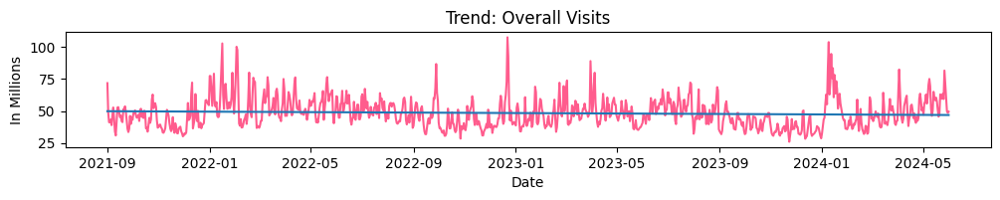

In [236]:
#file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (4).xlsx"  # Update with your actual file path
#sheet_name = 'AF_installs_AND_TWC'  # Update with your actual sheet name 7.6
#df = pd.read_excel(file_path, sheet_name=sheet_name)
# Define columns to plot and corresponding titles
cols_to_plot = ['Value']
plot_titles = ['Overall Visits']

# Generate trend charts
trend_chart_2(overall_visits, cols_to_plot, plot_titles, 'Date')


In [143]:
df_combined_new1.head()

,Region,Platform,Brand,Product,Date,Metric,Value,Goal,% of Goal,US Weather Impact Rating
972,US,APPS,TWC,TWC Universal Android 4G+,2021-09-01,Visits,12075838,1.149449e+07,1.050576,2.0
973,US,APPS,TWC,TWC Universal iOS 4G+,2021-09-01,Visits,36418204,2.995659e+07,1.215699,2.0
974,US,MOBILE WEB,TWC,TWC Mobile Web,2021-09-01,Visits,17068177,1.230898e+07,1.386644,2.0
975,US,WEB,TWC,TWC Web,2021-09-01,Visits,6099679,3.594470e+06,1.696962,2.0
976,US,APPS,TWC,TWC Universal Android 4G+,2021-09-02,Visits,8812651,1.150994e+07,0.765656,1.75


In [146]:
# Calculate total sum of values for each product
total_value_by_product = df_combined_new1.groupby('Product')['Value'].sum()

# Calculate percentage of each product's value relative to total
df_combined_new1['Percentage of Total Value'] = df_combined_new1.apply(lambda row: (row['Value'] / total_value_by_product[row['Product']]) * 100, axis=1)

C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_25280\4132349986.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_combined_new1['Percentage of Total Value'] = df_combined_new1.apply(lambda row: (row['Value'] / total_value_by_product[row['Product']]) * 100, axis=1)


In [149]:
total_value_by_product.to_clipboard()

In [150]:
file_path = "C:\\Users\\DeepakArun\\Desktop\\ios groupby.xlsx"  # Update with your actual file path
dfios=pd.read_excel(file_path)

# Ensure the date formats are consistent and convert to datetime
dfios['Date'] = pd.to_datetime(dfios['Date'], format='%d-%m-%Y')


In [153]:
dfios.head(20)

,Date,Media Source (pid),Installs
0,2021-09-01,Apple Search Ads,2394
1,2021-09-01,Apple Search Ads,563
2,2021-09-01,Apple Search Ads,0
3,2021-09-01,Apple Search Ads,95
4,2021-09-01,Apple Search Ads,44
5,2021-09-01,Apple Search Ads,0
6,2021-09-01,Apple Search Ads,97
7,2021-09-01,Apple Search Ads,2
8,2021-09-01,Apple Search Ads,13
9,2021-09-01,Apple Search Ads,240


In [159]:
# Group by 'Media Type' and calculate the sum of 'Value'
grouped_df = dfios.groupby(['Media Source (pid)', 'Date'])['Installs'].sum().reset_index()

In [169]:
sorted_df = grouped_df.sort_values(by=['Date', 'Media Source (pid)']).reset_index(drop=True)

In [234]:
sorted_df.to_clipboard()

In [288]:
file_path = "C:\\Users\\DeepakArun\\Desktop\\ios groupby.xlsx"  # Update with your actual file path
sheet_name = 'Sheet2'  # Update with your actual sheet name 7.6
df1 = pd.read_excel(file_path, sheet_name=sheet_name)


# Ensure the date formats are consistent and convert to datetime
df1['Date'] = pd.to_datetime(df1['Date'], format='%d-%m-%Y')



In [289]:
df1.head() 

,Media_source,Date,Installs
0,Apple Search Ads,2021-09-01,4435
1,BurdaOwnedOperated,2021-09-01,0
2,Email,2021-09-01,1
3,EmailSunset,2021-09-01,6
4,HouseBackfill,2021-09-01,0


In [290]:
file_path = "C:\\Users\\DeepakArun\\Desktop\\ios groupby.xlsx"  # Update with your actual file path
sheet_name = 'Sheet3'  # Update with your actual sheet name 7.6
df2 = pd.read_excel(file_path, sheet_name=sheet_name)


# Ensure the date formats are consistent and convert to datetime
df2['Date'] = pd.to_datetime(df2['Date'], format='%d-%m-%Y')

In [291]:
df2.head()

,Media_source,Date,Installs
0,Apple Search Ads,2021-09-01,4354.0
1,Email,2021-09-01,1.0
2,EmailSunset,2021-09-01,6.0
3,House_MW,2021-09-01,NaN
4,House_StormApp,2021-09-01,NaN


In [292]:
# Merge the DataFrames on 'Media_source' and 'Date'
merged_df = pd.merge(df1, df2, on=['Media_source', 'Date'], how='outer', suffixes=('_new', '_old'))

# Drop the individual install columns to get the final desired output
final_df = merged_df[['Media_source', 'Date']]


In [287]:
merged_df.fillna(0)

,Media_source,Date,Installs_new,Installs_old
0,Apple Search Ads,2021-09-01,4435.0,4354.0
1,BurdaOwnedOperated,2021-09-01,0.0,0.0
2,Email,2021-09-01,1.0,1.0
3,EmailSunset,2021-09-01,6.0,6.0
4,HouseBackfill,2021-09-01,0.0,0.0
...,...,...,...,...
23689,liftoff,2023-09-27,0.0,0.0
23690,organic,2023-09-28,0.0,9476.0
23691,organic,2023-09-29,0.0,10627.0
23692,organic,2023-09-30,0.0,10945.0


In [293]:
ios = merged_df.fillna(0)

In [295]:
ios.tail(20)

,Media_source,Date,Installs_new,Installs_old
23364,liftoff,2023-09-13,0.0,0.0
23365,Thor_Test_Breathing,2023-09-13,0.0,0.0
23366,Thor_Test_Lucas2,2023-09-14,0.0,0.0
23367,Thor_Test_Premium,2023-09-14,0.0,0.0
23368,Thor_Test_NoDL,2023-09-14,0.0,0.0
23369,liftoff,2023-09-14,0.0,0.0
23370,Thor_Test_Breathing,2023-09-14,0.0,0.0
23371,liftoff,2023-09-15,0.0,0.0
23372,Thor_Test_NoDL,2023-09-15,0.0,0.0
23373,liftoff,2023-09-16,0.0,0.0


In [296]:
ios.to_clipboard()

In [252]:
file_path = "C:\\Users\\DeepakArun\\Desktop\\ios groupby.xlsx"  # Update with your actual file path
sheet_name = 'Sheet6'  # Update with your actual sheet name 7.6
dfand = pd.read_excel(file_path, sheet_name=sheet_name)

# Ensure the date formats are consistent and convert to datetime
#dfand['Date'] = pd.to_datetime(dfand['Date'], format='%d-%m-%Y')


In [230]:
dfand.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59645 entries, 0 to 59644
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date                59645 non-null  datetime64[ns]
 1   Media Source (pid)  59644 non-null  object        
 2   Installs            59645 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 1.4+ MB


In [253]:
dfand=dfand.dropna()

In [254]:
dfand['Date'] = pd.to_datetime(dfand['Date'], errors='coerce')  # Use errors='coerce' to handle errors by returning NaT for invalid parsing

In [255]:
dfand['Date'] = pd.to_datetime(dfand['Date'], errors='coerce')  # Use errors='coerce' to handle errors by returning NaT for invalid parsing
if dfand['Date'].isnull().any():
    print("Warning: There are NaN values in the 'Date' column.")
# Group by 'Media Source (pid)' and 'Date' and sum the 'Installs'
grouped_df = dfand.groupby(['Media Source (pid)', 'Date'], as_index=False)['Installs'].sum()

In [256]:
sorted_df = grouped_df.sort_values(by=['Date', 'Media Source (pid)']).reset_index(drop=True)

In [257]:
sorted_df

,Media Source (pid),Date,Installs
0,'wxzyawdffre=wxzyawdffre,2021-09-01,0
1,BurdaOwnedOperated,2021-09-01,0
2,EditorialReferralPM,2021-09-01,0
3,Email,2021-09-01,0
4,EmailSunset,2021-09-01,0
...,...,...,...
28447,moloco_int,2024-05-31,730
28448,personalyrtb_int,2024-05-31,0
28449,sfmc,2024-05-31,0
28450,thevenatic-newsletter,2024-05-31,0


In [266]:
file_path = "C:\\Users\\DeepakArun\\Desktop\\ios groupby.xlsx"  # Update with your actual file path
sheet_name = 'Sheet5'  # Update with your actual sheet name 7.6
df1 = pd.read_excel(file_path, sheet_name=sheet_name)


# Ensure the date formats are consistent and convert to datetime
df1['Date'] = pd.to_datetime(df1['Date'], format='%d-%m-%Y')



In [267]:
df1.head()

,Media_source,Date,Installs
0,'wxzyawdffre=wxzyawdffre,2021-09-01,0
1,BurdaOwnedOperated,2021-09-01,0
2,EditorialReferralPM,2021-09-01,0
3,Email,2021-09-01,0
4,EmailSunset,2021-09-01,0


In [268]:
file_path = "C:\\Users\\DeepakArun\\Desktop\\ios groupby.xlsx"  # Update with your actual file path
sheet_name = 'Sheet4'  # Update with your actual sheet name 7.6
df2 = pd.read_excel(file_path, sheet_name=sheet_name)


# Ensure the date formats are consistent and convert to datetime
df2['Date'] = pd.to_datetime(df2['Date'], format='%d-%m-%Y')

In [269]:
df2.head()

,Media_source,Date,Installs
0,appia_int,2021-09-01,65.0
1,aura_int,2021-09-01,745.0
2,bidease_int,2021-09-01,101.0
3,crossinstall_int,2021-09-01,35.0
4,digitalturbine_int,2021-09-01,958.0


In [270]:
# Merge the DataFrames on 'Media_source' and 'Date'
merged_df = pd.merge(df1, df2, on=['Media_source', 'Date'], how='outer', suffixes=('_new', '_old'))

# Drop the individual install columns to get the final desired output
final_df = merged_df[['Media_source', 'Date']]


In [271]:
andr = merged_df.fillna(0)

In [272]:
andr.tail(20)

,Media_source,Date,Installs_new,Installs_old
28451,tmobile,2024-05-31,979.0,0.0
28452,House,2021-10-29,0.0,0.0
28453,SMS,2021-11-09,0.0,0.0
28454,House,2021-11-10,0.0,0.0
28455,House,2021-11-11,0.0,0.0
28456,Test,2021-11-12,0.0,0.0
28457,House,2021-11-17,0.0,0.0
28458,Test,2021-12-01,0.0,0.0
28459,Test,2021-12-10,0.0,0.0
28460,Test,2022-01-13,0.0,0.0


In [273]:
andr.to_clipboard()

In [10]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
import pandas as pd
import numpy as np

def millions_formatter(x, pos):
    return f'{x / 1e6:.0f}'

def thousands_formatter(x, pos):
    return f'{x / 1e3:,.0f}'

def trend_chart_2(df_, cols, chart_title, date_var):
    df_['Date'] = pd.to_datetime(df_['Date'])
    df_=df_.sort_values(by='Date')
    temp=df_.copy()
    min_date = temp[date_var].min()
    max_date = temp[date_var].max()
    date_range = pd.date_range(start=min_date, end=max_date, freq='D')
    df_temp_flag = pd.DataFrame({'Date':date_range})
    df_=pd.merge(df_,df_temp_flag,on='Date',how='outer')
    for idx, var in  enumerate(cols):
        print(var)
        df_=df_.fillna(0).reset_index(drop=True)
        plt.figure(figsize=(12, 1.5))
        var_ = var+"_"
        df_[var_] = [val / 1e3 for val in df_[var]]
        df_=df_.sort_values(by='Date')
        sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)
#         sns.regplot(data=df_, x=date_var, y=var, color='#ff5c8d', scatter_kws={'s': 100})
        y = [val / 1e3 for val in df_[var]]
#         y = [val / 1e6 for val in var]
        x = np.arange(len(df_.index))  # Use numerical index as x for regression calculation
#        y = df_[var]
#        print(x)
#        print(y)
        m, b = np.polyfit(x, y, 1)
        plt.plot(df_['Date'], m*x + b)
        pd.DataFrame(df_['Date'], m*x + b).to_clipboard()
        plt.title('Trend: '+chart_title[idx])
        plt.xlabel(date_var)
        plt.ylabel("In Thousands")
        plt.grid(False)
        plt.show()

Impressions


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


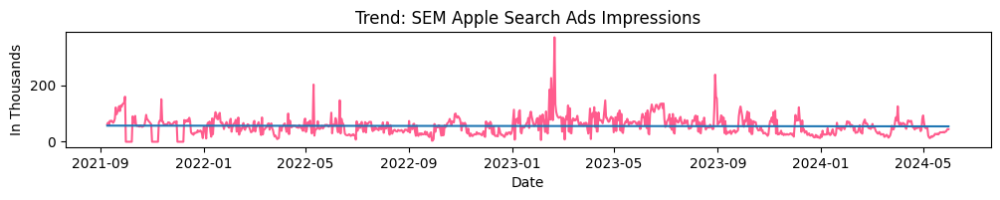

In [51]:
file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (5).xlsx"  # Update with your actual file path
sheet_name = 'Apple Search Ads'  # Update with your actual sheet name 7.6
df = pd.read_excel(file_path, sheet_name=sheet_name)
# Define columns to plot and corresponding titles
cols_to_plot = ['Impressions']
plot_titles = ['SEM Apple Search Ads Impressions']
df['Date'] = pd.to_datetime(df['Day'], format='%d-%m-%Y')
df = df[df['Date'] >= '2021-09-01']
# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


Clicks


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


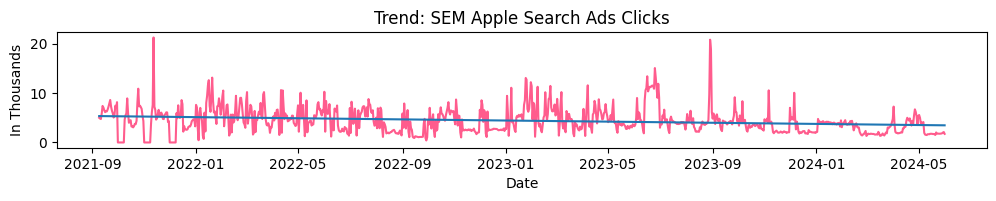

In [52]:
# Define columns to plot and corresponding titles
cols_to_plot = ['Clicks']
plot_titles = ['SEM Apple Search Ads Clicks']
df['Date'] = pd.to_datetime(df['Day'], format='%d-%m-%Y')
df = df[df['Date'] >= '2021-09-01']
# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


Spend


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


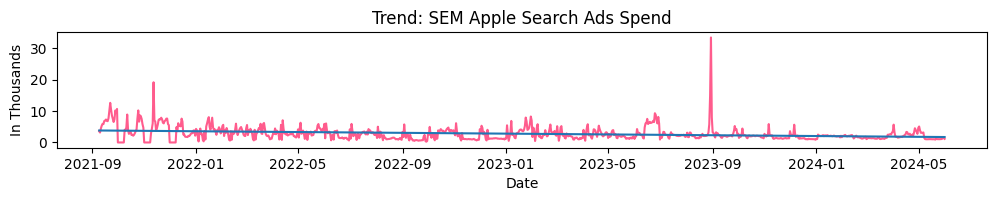

In [53]:
# Define columns to plot and corresponding titles
cols_to_plot = ['Spend']
plot_titles = ['SEM Apple Search Ads Spend']
df['Date'] = pd.to_datetime(df['Day'], format='%d-%m-%Y')
df = df[df['Date'] >= '2021-09-01']
# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


Impressions


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


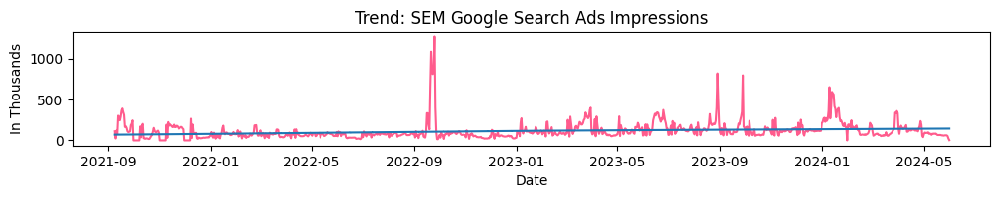

In [54]:
file_path = "C:\\Users\\DeepakArun\\Desktop\\BL\\BL_TWC _ Marketing Spend Data (2).xlsx"  # Update with your actual file path
sheet_name = 'Google'  # Update with your actual sheet name 7.6
df = pd.read_excel(file_path, sheet_name=sheet_name)
# Define columns to plot and corresponding titles
cols_to_plot = ['Impressions']
plot_titles = ['SEM Google Search Ads Impressions']
df['Date'] = pd.to_datetime(df['Day'], infer_datetime_format=True)
df = df[df['Date'] >= '2021-09-01']
# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


Clicks


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


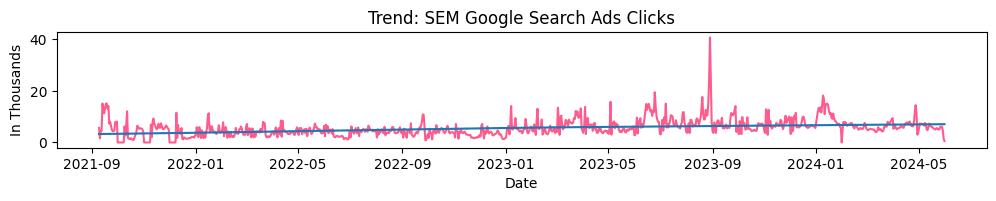

In [64]:
file_path = "C:\\Users\\DeepakArun\\Desktop\\BL\\BL_TWC _ Marketing Spend Data (2).xlsx"  # Update with your actual file path
sheet_name = 'Google'  # Update with your actual sheet name 7.6
df = pd.read_excel(file_path, sheet_name=sheet_name)
# Define columns to plot and corresponding titles
cols_to_plot = ['Clicks']
plot_titles = ['SEM Google Search Ads Clicks']
df['Date'] = pd.to_datetime(df['Day'], infer_datetime_format=True)
df = df[df['Date'] >= '2021-09-01']
# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


Spend


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


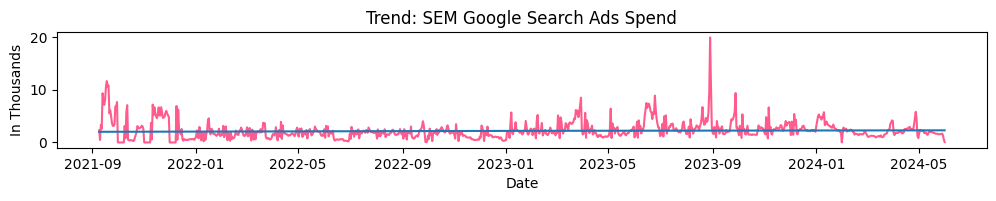

In [56]:
file_path = "C:\\Users\\DeepakArun\\Desktop\\BL\\BL_TWC _ Marketing Spend Data (2).xlsx"  # Update with your actual file path
sheet_name = 'Google'  # Update with your actual sheet name 7.6
df = pd.read_excel(file_path, sheet_name=sheet_name)
# Define columns to plot and corresponding titles
cols_to_plot = ['Spend']
plot_titles = ['SEM Google Search Ads Spend']
df['Date'] = pd.to_datetime(df['Day'], infer_datetime_format=True)
df = df[df['Date'] >= '2021-09-01']
# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


Impressions


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


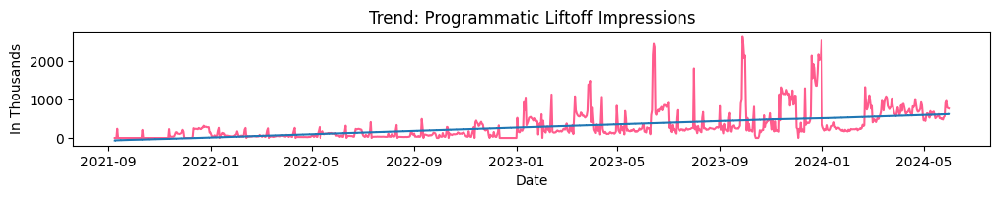

In [22]:
file_path = "C:\\Users\\DeepakArun\\Desktop\\BL\\BL_TWC _ Marketing Spend Data (2).xlsx"  # Update with your actual file path
sheet_name = 'LiftOff'  # Update with your actual sheet name 7.6
df = pd.read_excel(file_path, sheet_name=sheet_name)
# Define columns to plot and corresponding titles
cols_to_plot = ['Impressions']
plot_titles = ['Programmatic Liftoff Impressions']
df['Date'] = pd.to_datetime(df['Day'], infer_datetime_format=True)
df = df[df['Date'] >= '2021-09-01']
# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


Spend


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


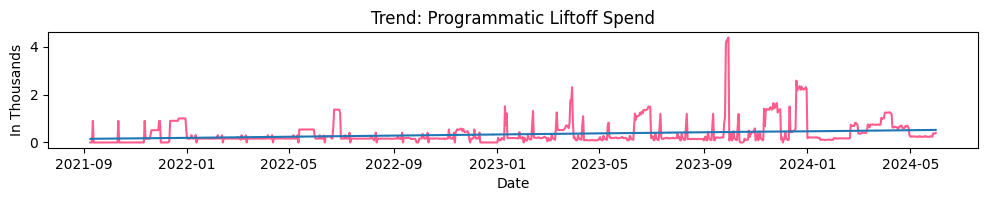

In [23]:
# Define columns to plot and corresponding titles
cols_to_plot = ['Spend']
plot_titles = ['Programmatic Liftoff Spend']
df['Date'] = pd.to_datetime(df['Day'], infer_datetime_format=True)
df = df[df['Date'] >= '2021-09-01']
# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


Impressions


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


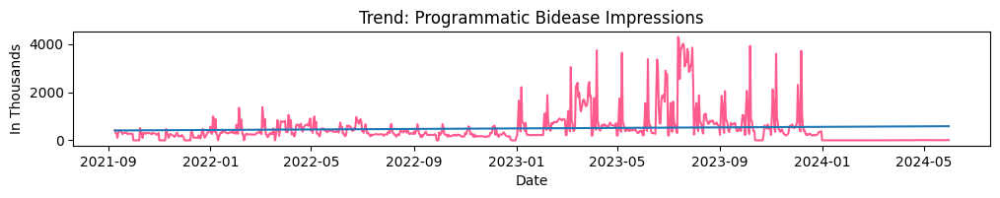

In [60]:
file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (5).xlsx"  # Update with your actual file path
sheet_name = 'Bidease'  # Update with your actual sheet name 7.6
df = pd.read_excel(file_path, sheet_name=sheet_name)
# Define columns to plot and corresponding titles
cols_to_plot = ['Impressions']
plot_titles = ['Programmatic Bidease Impressions']
df['Date'] = pd.to_datetime(df['Day'], infer_datetime_format=True)
df = df[df['Date'] >= '2021-09-01']
# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


Clicks


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


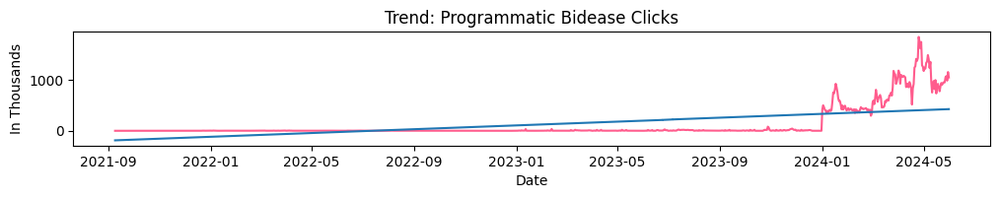

In [26]:
# Define columns to plot and corresponding titles
cols_to_plot = ['Clicks']
plot_titles = ['Programmatic Bidease Clicks']
df['Date'] = pd.to_datetime(df['Day'], infer_datetime_format=True)
df = df[df['Date'] >= '2021-09-01']
# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\642497863.py:5: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df['Spend'] = pd.to_numeric(df['Spend'].str.replace(',', '').str.replace('$', ''), errors='coerce')
C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


Spend


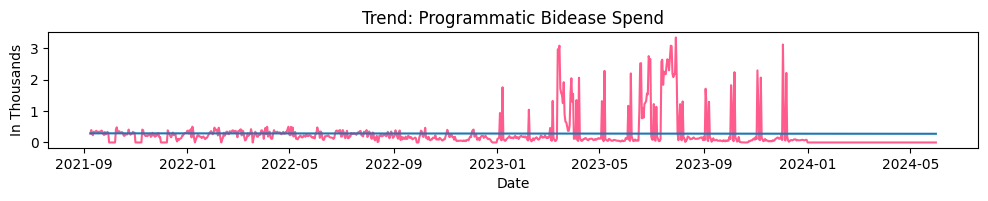

In [29]:
# Define columns to plot and corresponding titles
cols_to_plot = ['Spend']
plot_titles = ['Programmatic Bidease Spend']
df['Date'] = pd.to_datetime(df['Day'], infer_datetime_format=True)
df['Spend'] = pd.to_numeric(df['Spend'].str.replace(',', '').str.replace('$', ''), errors='coerce')
df = df[df['Date'] >= '2021-09-01']
# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


impressions


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


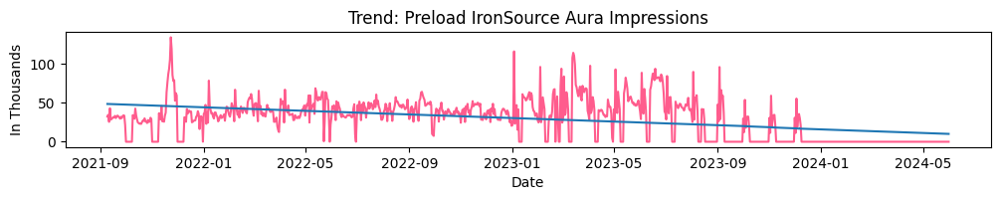

In [65]:
file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (5).xlsx"  # Update with your actual file path
sheet_name = 'IronSource Aura'  # Update with your actual sheet name 7.6
df = pd.read_excel(file_path, sheet_name=sheet_name)
# Define columns to plot and corresponding titles
cols_to_plot = ['impressions']
plot_titles = ['Preload IronSource Aura Impressions']
df['Date'] = pd.to_datetime(df['event_date'], infer_datetime_format=True)
df = df[df['Date'] >= '2021-09-01']
# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


Spend


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


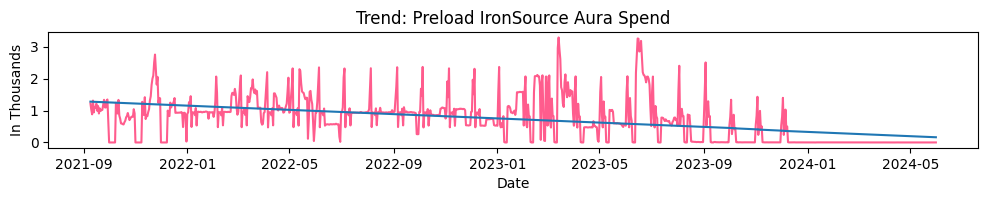

In [66]:
cols_to_plot = ['Spend']
plot_titles = ['Preload IronSource Aura Spend']
df['Date'] = pd.to_datetime(df['event_date'], infer_datetime_format=True)
df = df[df['Date'] >= '2021-09-01']
# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


launches


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


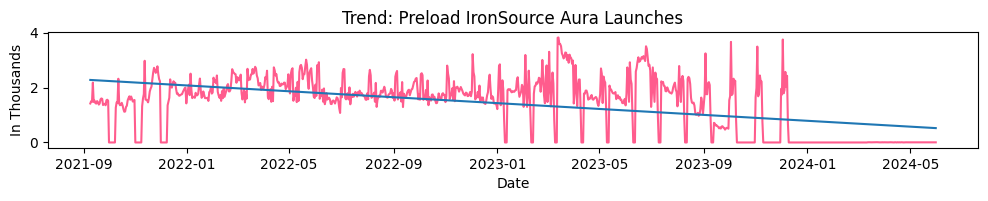

In [36]:
cols_to_plot = ['launches']
plot_titles = ['Preload IronSource Aura Launches']
df['Date'] = pd.to_datetime(df['event_date'], infer_datetime_format=True)
df = df[df['Date'] >= '2021-09-01']
# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


Impressions


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


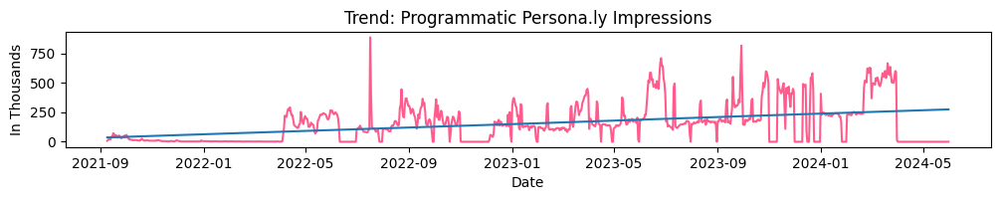

In [67]:
file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (5).xlsx"  # Update with your actual file path
sheet_name = 'Persona.ly'  # Update with your actual sheet name 7.6
df = pd.read_excel(file_path, sheet_name=sheet_name)
# Define columns to plot and corresponding titles
cols_to_plot = ['Impressions']
plot_titles = ['Programmatic Persona.ly Impressions']
df['Date'] = pd.to_datetime(df['Day'], infer_datetime_format=True)
#df['Date'] = pd.to_datetime(df['Day'], format='%d-%m-%Y')
df = df[df['Date'] >= '2021-09-01']
# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


Spend


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


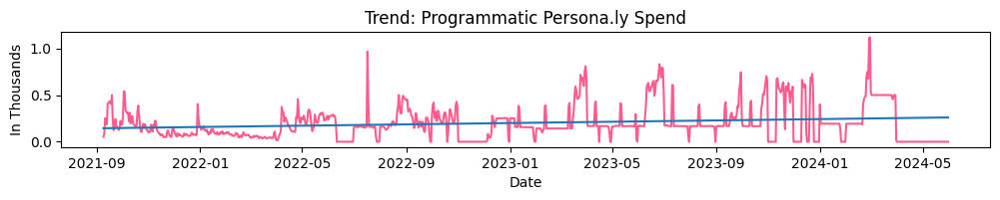

In [68]:
cols_to_plot = ['Spend']
plot_titles = ['Programmatic Persona.ly Spend']
df['Date'] = pd.to_datetime(df['Day'], infer_datetime_format=True)
df = df[df['Date'] >= '2021-09-01']
# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


Clicks


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


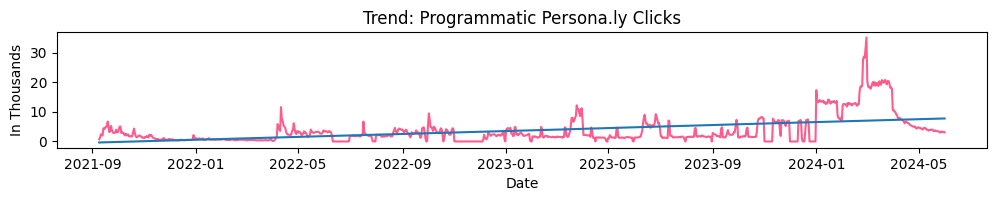

In [69]:
cols_to_plot = ['Clicks']
plot_titles = ['Programmatic Persona.ly Clicks']
df['Date'] = pd.to_datetime(df['Day'], infer_datetime_format=True)
#df['Date'] = pd.to_datetime(df['Day'], format='%d-%m-%Y')
df = df[df['Date'] >= '2021-09-01']
# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


Spend


C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\1365515325.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)


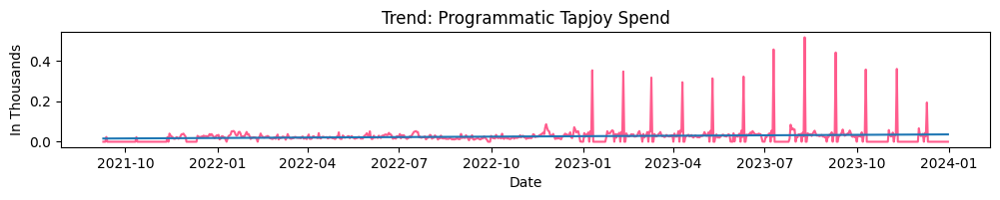

In [70]:
file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (5).xlsx"  # Update with your actual file path
sheet_name = 'Tapjoy'  # Update with your actual sheet name 7.6
df = pd.read_excel(file_path, sheet_name=sheet_name)
# Define columns to plot and corresponding titles
cols_to_plot = ['Spend']
plot_titles = ['Programmatic Tapjoy Spend']
df['Date'] = pd.to_datetime(df['Day'], infer_datetime_format=True)
#df['Date'] = pd.to_datetime(df['Day'], format='%d-%m-%Y')
df = df[df['Date'] >= '2021-09-01']
# Generate trend charts
trend_chart_2(df, cols_to_plot, plot_titles, 'Date')


In [105]:
# User Acquisition - Media Spend, Impression and Clicks
def mkt_media_spend_pre_processing(df_, paid_media_sheet):
    df_columns = list(df_.columns)
    if df_['Spend'].dtypes == 'object':
        df_['Spend'] = df_['Spend'].str.replace(',', '').str.replace('$', '').astype('float')
    if 'clicks' in df_.columns:
            df_=df_.rename({'clicks':'Clicks'},axis=1)
    if 'Clicks' in df_.columns and df_['Clicks'].dtypes == 'object':
        df_['Clicks'] = df_['Clicks'].replace({'\$': ''}, regex=True).replace({'\,': ''}, regex=True)
        df_['Clicks'] = df_['Clicks'].astype('float')
    if paid_media_sheet == 'IronSource Sonic':
        df_=df_.rename({'OS':'event_date', 'Day':'OS'}, axis=1)
    if paid_media_sheet == 'Persona.ly':
        df_=df_[~df_['Platform'].isna()]
    if 'event_date' in list(df_.columns):
        df_=df_.rename({'event_date':'Day'}, axis=1)
    if paid_media_sheet == 'Persona.ly':
        df_['new_date'] = df_['Day']
        df_['format'] = 1
        df_.loc[df_.Day.str.contains('/')==True, 'format'] = 2
        df_.loc[df_.format == 2, 'new_date'] = pd.to_datetime(df_.loc[df_.format == 2, 'Day'], format = '%m/%d/%y').dt.strftime('%Y-%m-%d')
        df_.loc[df_.Date_Issue_flag == 1, 'new_date'] = pd.to_datetime(df_.loc[df_.Date_Issue_flag == 1, 'Day'], format = '%Y-%d-%m %H:%M:%S').dt.strftime('%Y-%m-%d')
        df_.loc[df_.format == 1, 'new_date'] = pd.to_datetime(df_.loc[df_.format == 1, 'Day'], format = '%Y-%m-%d %H:%M:%S').dt.strftime('%Y-%m-%d')
        df_.loc[df_.Date_Issue_flag == 1, 'new_date'] = pd.to_datetime(df_.loc[df_.Date_Issue_flag == 1, 'Day'], format = '%Y-%d-%m %H:%M:%S').dt.strftime('%Y-%m-%d')
        df_ = df_.drop('Date_Issue_flag', axis=1)
    else:
        df_['format'] = 1
        df_.loc[df_.Day.str.contains('/')==True, 'format'] = 2
        df_.loc[df_.format == 1, 'new_date'] = pd.to_datetime(df_.loc[df_.format == 1, 'Day'], format = '%Y-%d-%m %H:%M:%S').dt.strftime('%Y-%m-%d')
        if paid_media_sheet == 'Bidease':
            pattern = r'\b\d{2}/\d{2}/\d{2}\b'
            df_.loc[((df_.format == 2) & (df_.Day.str.contains(pattern, regex=True))), 'format'] = 3
            df_.loc[df_.format == 2, 'new_date'] = pd.to_datetime(df_.loc[df_.format == 2, 'Day'], format = '%m/%d/%Y').dt.strftime('%Y-%m-%d')
            df_.loc[df_.format == 3, 'new_date'] = pd.to_datetime(df_.loc[df_.format == 3, 'Day'], format = '%m/%d/%y').dt.strftime('%Y-%m-%d')
        else:
            df_.loc[df_.format == 2, 'new_date'] = pd.to_datetime(df_.loc[df_.format == 2, 'Day'], format = '%m/%d/%y').dt.strftime('%Y-%m-%d')
    if 'event_date' in df_columns:
        df_=df_.rename({'Day':'event_date'}, axis=1)
        date_var = 'event_date'
    else:
        date_var = 'Day'
    df_[date_var] = df_['new_date']
    df_ = df_.drop(['format', 'new_date'], axis=1)
    return df_, date_var
    
def mkt_media_spend_analyis(file_path, paid_media, data_source_dic):
    df_result = pd.DataFrame(columns=['Date'])
    for paid_media_sheet in paid_media:
        if paid_media_sheet == 'Persona.ly':
            df_ = pd.read_excel(file_path+"BL_TWC _ Marketing Spend Data_v4_revised.xlsx", sheet_name='Persona.ly')
        else:
            df_ = pd.read_excel(file_path+"BL_TWC _ Marketing Spend Data_v3.xlsx", sheet_name=paid_media_sheet)
        df_, date_var = mkt_media_spend_pre_processing(df_, paid_media_sheet)
        df_ = df_.rename({'Day':'Date', 'event_date':'Date'}, axis=1)
        # platform = list(df_['Platform'].unique())
        # os_type = df_['OS'].unique()
        # temp_os_var = ''
        # if len(os_type)==1:
        #     temp_os_var = '_Overall'
        # for os in os_type:
        #     df_grp = df_[df_['OS']==os].reset_index(drop=True)
        #     df_grp['Date']=pd.to_datetime(df_grp['Date'])
        #     df_grp = df_grp.groupby(['Date', 'Platform', 'OS']).sum().reset_index()
        #     df_grp = df_grp.drop(['Platform', 'OS'], axis=1)
        #     df_grp = df_grp.rename(columns={col: data_source_dic[paid_media_sheet]+ "_"+ paid_media_sheet +"_" + os + temp_os_var + "_" + col if col != 'Date' else col for col in df_grp.columns})
        #     df_grp.columns = df_grp.columns.str.replace(' ', '_')
        #     df_grp['Date']=pd.to_datetime(df_grp['Date'])
        #     df_result = pd.merge(df_result, df_grp, on='Date', how='outer')
        # if len(os_type)>1:
        #     df_grp = df_.groupby('Date').sum().reset_index()
        #     df_grp['Date']=pd.to_datetime(df_grp['Date'])
        #     df_grp = df_grp.rename(columns={col: data_source_dic[paid_media_sheet]+ "_"+ paid_media_sheet + "_Overall" + "_" + col if col != 'Date' else col for col in df_grp.columns})
        #     df_grp.columns = df_grp.columns.str.replace(' ', '_')
        #     df_result = pd.merge(df_result, df_grp, on='Date', how='outer')
        df_grp = df_.groupby('Date').sum().reset_index()
        df_grp['Date']=pd.to_datetime(df_grp['Date'])
        df_grp = df_grp.rename(columns={col: data_source_dic[paid_media_sheet]+ "_"+ paid_media_sheet + "_" + col if col != 'Date' else col for col in df_grp.columns})
        df_grp.columns = df_grp.columns.str.replace(' ', '_')
        df_result = pd.merge(df_result, df_grp, on='Date', how='outer')
    return df_result

def get_model_user_acquisition_mkt_media_spend(file_path):
    paid_media = ['Google', 'IronSource Aura', 'Bidease', 'Digital Turbine', 'Tapjoy', 'Apple Search Ads', 'LiftOff', 'IronSource Sonic', 'Twitter', 'TikTok', 'Vibe', 'Persona.ly']
    data_source_dic = {'Google':'SEM',
                       'IronSource Aura':'Preload',
                       'Bidease':'Programmatic',
                       'Digital Turbine':'Preload',
                       'Tapjoy':'Programmatic',
                       'Apple Search Ads':'SEM',
                       'LiftOff':'Programmatic',
                       'IronSource Sonic':'Programmatic',
                       'Twitter':'PaidSocial',
                       'TikTok':'Programmatic',
                       'Vibe':'PaidSocial',
                       'Persona.ly':'Programmatic'
                      }
    df_ = mkt_media_spend_analyis(file_path, paid_media, data_source_dic)
    return df_


In [107]:
# Assuming you have already defined the functions above

# Set the file path to your Excel files
file_path = "C:\\Users\\DeepakArun\\Desktop\\TWC\\Data\\"

# Call the function to get the processed data
df_result = get_model_user_acquisition_mkt_media_spend(file_path)

# Display the resulting DataFrame
print(df_result)


          Date  SEM_Google_Spend  SEM_Google_Clicks  SEM_Google_Impressions  \
0   2021-09-01        3804.96239               9901                  188201   
1   2021-09-02        1956.52158               5170                  111238   
2   2021-09-03        1750.51233               4550                   92859   
3   2021-09-04        1772.30789               4723                   93066   
4   2021-09-05        1881.71183               5030                   96904   
..         ...               ...                ...                     ...   
847 2023-12-27        2368.73262               6601                  127890   
848 2023-12-28        2154.44853               6282                  115165   
849 2023-12-29        2391.16549               6309                  132374   
850 2023-12-30        2218.96271               6205                  116414   
851 2023-12-31        2033.16337               5599                  117379   

     Preload_IronSource_Aura_Spend  Preload_IronSou

In [109]:
df_result.to_clipboard()

In [78]:
# User Acquisition - Media Spend, Impression and Clicks
def mkt_media_spend_pre_processing(df_, paid_media_sheet):
    df_columns = list(df_.columns)
    if df_['Spend'].dtypes == 'object':
        df_['Spend'] = df_['Spend'].str.replace(',', '').str.replace('$', '').astype('float')
    if 'clicks' in df_.columns:
            df_=df_.rename({'clicks':'Clicks'},axis=1)
    if 'Clicks' in df_.columns and df_['Clicks'].dtypes == 'object':
        df_['Clicks'] = df_['Clicks'].replace({'\$': ''}, regex=True).replace({'\,': ''}, regex=True)
        df_['Clicks'] = df_['Clicks'].astype('float')
    if paid_media_sheet == 'IronSource Sonic':
        df_=df_.rename({'OS':'event_date', 'Day':'OS'}, axis=1)
    if paid_media_sheet == 'Persona.ly':
        df_=df_[~df_['Platform'].isna()]
    if 'event_date' in list(df_.columns):
        df_=df_.rename({'event_date':'Day'}, axis=1)
    if paid_media_sheet == 'Persona.ly':
        df_['new_date'] = df_['Day']
        df_['format'] = 1
        df_.loc[df_.Day.str.contains('/')==True, 'format'] = 2
        df_.loc[df_.format == 2, 'new_date'] = pd.to_datetime(df_.loc[df_.format == 2, 'Day'], format = '%m/%d/%y').dt.strftime('%Y-%m-%d')
        df_.loc[df_.Date_Issue_flag == 1, 'new_date'] = pd.to_datetime(df_.loc[df_.Date_Issue_flag == 1, 'Day'], format = '%Y-%d-%m %H:%M:%S').dt.strftime('%Y-%m-%d')
        df_.loc[df_.format == 1, 'new_date'] = pd.to_datetime(df_.loc[df_.format == 1, 'Day'], format = '%Y-%m-%d %H:%M:%S').dt.strftime('%Y-%m-%d')
        df_.loc[df_.Date_Issue_flag == 1, 'new_date'] = pd.to_datetime(df_.loc[df_.Date_Issue_flag == 1, 'Day'], format = '%Y-%d-%m %H:%M:%S').dt.strftime('%Y-%m-%d')
        df_ = df_.drop('Date_Issue_flag', axis=1)
    else:
        df_['format'] = 1
        df_.loc[df_.Day.str.contains('/')==True, 'format'] = 2
        df_.loc[df_.format == 1, 'new_date'] = pd.to_datetime(df_.loc[df_.format == 1, 'Day'], format = '%Y-%d-%m %H:%M:%S').dt.strftime('%Y-%m-%d')
        if paid_media_sheet == 'Bidease':
            pattern = r'\b\d{2}/\d{2}/\d{2}\b'
            df_.loc[((df_.format == 2) & (df_.Day.str.contains(pattern, regex=True))), 'format'] = 3
            df_.loc[df_.format == 2, 'new_date'] = pd.to_datetime(df_.loc[df_.format == 2, 'Day'], format = '%m/%d/%Y').dt.strftime('%Y-%m-%d')
            df_.loc[df_.format == 3, 'new_date'] = pd.to_datetime(df_.loc[df_.format == 3, 'Day'], format = '%m/%d/%y').dt.strftime('%Y-%m-%d')
        else:
            df_.loc[df_.format == 2, 'new_date'] = pd.to_datetime(df_.loc[df_.format == 2, 'Day'], format = '%m/%d/%y').dt.strftime('%Y-%m-%d')
    if 'event_date' in df_columns:
        df_=df_.rename({'Day':'event_date'}, axis=1)
        date_var = 'event_date'
    else:
        date_var = 'Day'
    df_[date_var] = df_['new_date']
    df_ = df_.drop(['format', 'new_date'], axis=1)
    return df_, date_var
    
def mkt_media_spend_analyis(file_path, paid_media, data_source_dic):
    df_result = pd.DataFrame(columns=['Date'])
    for paid_media_sheet in paid_media:
        if paid_media_sheet == 'Persona.ly':
            df_ = pd.read_excel(file_path+"BL_TWC _ Marketing Spend Data (6).xlsx", sheet_name='Persona.ly')
        else:
            df_ = pd.read_excel(file_path+"BL_TWC _ Marketing Spend Data (6).xlsx", sheet_name=paid_media_sheet)
        df_, date_var = mkt_media_spend_pre_processing(df_, paid_media_sheet)
        df_ = df_.rename({'Day':'Date', 'event_date':'Date'}, axis=1)
        # platform = list(df_['Platform'].unique())
        # os_type = df_['OS'].unique()
        # temp_os_var = ''
        # if len(os_type)==1:
        #     temp_os_var = '_Overall'
        # for os in os_type:
        #     df_grp = df_[df_['OS']==os].reset_index(drop=True)
        #     df_grp['Date']=pd.to_datetime(df_grp['Date'])
        #     df_grp = df_grp.groupby(['Date', 'Platform', 'OS']).sum().reset_index()
        #     df_grp = df_grp.drop(['Platform', 'OS'], axis=1)
        #     df_grp = df_grp.rename(columns={col: data_source_dic[paid_media_sheet]+ "_"+ paid_media_sheet +"_" + os + temp_os_var + "_" + col if col != 'Date' else col for col in df_grp.columns})
        #     df_grp.columns = df_grp.columns.str.replace(' ', '_')
        #     df_grp['Date']=pd.to_datetime(df_grp['Date'])
        #     df_result = pd.merge(df_result, df_grp, on='Date', how='outer')
        # if len(os_type)>1:
        #     df_grp = df_.groupby('Date').sum().reset_index()
        #     df_grp['Date']=pd.to_datetime(df_grp['Date'])
        #     df_grp = df_grp.rename(columns={col: data_source_dic[paid_media_sheet]+ "_"+ paid_media_sheet + "_Overall" + "_" + col if col != 'Date' else col for col in df_grp.columns})
        #     df_grp.columns = df_grp.columns.str.replace(' ', '_')
        #     df_result = pd.merge(df_result, df_grp, on='Date', how='outer')
        df_grp = df_.groupby('Date').sum().reset_index()
        df_grp['Date']=pd.to_datetime(df_grp['Date'])
        df_grp = df_grp.rename(columns={col: data_source_dic[paid_media_sheet]+ "_"+ paid_media_sheet + "_" + col if col != 'Date' else col for col in df_grp.columns})
        df_grp.columns = df_grp.columns.str.replace(' ', '_')
        df_result = pd.merge(df_result, df_grp, on='Date', how='outer')
    return df_result

def get_model_user_acquisition_mkt_media_spend(file_path):
    paid_media = ['Google', 'IronSource Aura', 'Bidease', 'Digital Turbine', 'Tapjoy', 'Apple Search Ads', 'LiftOff', 'IronSource Sonic', 'Twitter', 'TikTok', 'Vibe', 'Persona.ly']
    data_source_dic = {'Google':'SEM',
                       'IronSource Aura':'Preload',
                       'Bidease':'Programmatic',
                       'Digital Turbine':'Preload',
                       'Tapjoy':'Programmatic',
                       'Apple Search Ads':'SEM',
                       'LiftOff':'Programmatic',
                       'IronSource Sonic':'Programmatic',
                       'Twitter':'PaidSocial',
                       'TikTok':'Programmatic',
                       'Vibe':'PaidSocial',
                       'Persona.ly':'Programmatic'
                      }
    df_ = mkt_media_spend_analyis(file_path, paid_media, data_source_dic)
    return df_


In [79]:
# Assuming you have already defined the functions above

# Set the file path to your Excel files
file_path = "C:\\Users\\DeepakArun\\Desktop\\TWC\\Data"

# Call the function to get the processed data
df_result = get_model_user_acquisition_mkt_media_spend(file_path)

# Display the resulting DataFrame
print(df_result)


ValueError: time data '2024-01-13 00:00:00' does not match format '%Y-%d-%m %H:%M:%S' (match)

In [74]:
df_result

,Date,SEM_Google_Spend,SEM_Google_Clicks,SEM_Google_Impressions,Preload_IronSource_Aura_Spend,Preload_IronSource_Aura_launches,Preload_IronSource_Aura_impressions,Preload_IronSource_Aura_app_downloads,Programmatic_Bidease_Spend,Programmatic_Bidease_Clicks,...,PaidSocial_Twitter_Impressions,Programmatic_TikTok_Spend,Programmatic_TikTok_Clicks,Programmatic_TikTok_Impressions,PaidSocial_Vibe_Spend,PaidSocial_Vibe_Clicks,PaidSocial_Vibe_Impressions,Programmatic_Persona.ly_Spend,Programmatic_Persona.ly_Clicks,Programmatic_Persona.ly_Impressions
0,2021-09-01,3804.96239,9901,188201,624.10,1327.0,26044.0,2657.0,83.95,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-09-02,1956.52158,5170,111238,919.24,1286.0,39147.0,3625.0,69.00,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2021-09-03,1750.51233,4550,92859,914.55,1245.0,39039.0,3572.0,109.25,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2021-09-04,1772.30789,4723,93066,927.03,1315.0,34922.0,3581.0,96.60,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2021-09-05,1881.71183,5030,96904,676.35,1365.0,29773.0,2464.0,88.55,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
847,2023-12-27,2368.73262,6601,127890,NaN,NaN,NaN,NaN,74.75,551.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,4.0,0.0
848,2023-12-28,2154.44853,6282,115165,NaN,NaN,NaN,NaN,67.85,694.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.0
849,2023-12-29,2391.16549,6309,132374,NaN,NaN,NaN,NaN,71.30,705.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0
850,2023-12-30,2218.96271,6205,116414,NaN,NaN,NaN,NaN,86.25,734.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0


In [86]:
import pandas as pd
from dateutil.parser import parse

def try_parsing_date(text):
    for fmt in ('%Y-%m-%d %H:%M:%S', '%m/%d/%y', '%d/%m/%Y', '%m/%d/%Y', '%Y-%d-%m %H:%M:%S'):
        try:
            return pd.to_datetime(text, format=fmt).strftime('%Y-%m-%d')
        except ValueError:
            continue
    return text

def mkt_media_spend_pre_processing(df_, paid_media_sheet):
    df_columns = list(df_.columns)
    if df_['Spend'].dtypes == 'object':
        df_['Spend'] = df_['Spend'].str.replace(',', '').str.replace('$', '').astype('float')
    if 'clicks' in df_.columns:
        df_ = df_.rename({'clicks': 'Clicks'}, axis=1)
    if 'Clicks' in df_.columns and df_['Clicks'].dtypes == 'object':
        df_['Clicks'] = df_['Clicks'].replace({'\$': ''}, regex=True).replace({'\,': ''}, regex=True)
        df_['Clicks'] = df_['Clicks'].astype('float')
    if paid_media_sheet == 'IronSource Sonic':
        df_ = df_.rename({'OS': 'event_date', 'Day': 'OS'}, axis=1)
    if paid_media_sheet == 'Persona.ly':
        df_ = df_[~df_['Platform'].isna()]
    if 'event_date' in list(df_.columns):
        df_ = df_.rename({'event_date': 'Day'}, axis=1)

    df_['Day'] = df_['Day'].astype(str)  # Ensure 'Day' column is string type
    df_['new_date'] = df_['Day'].apply(try_parsing_date)
    
    if 'event_date' in df_columns:
        df_ = df_.rename({'Day': 'event_date'}, axis=1)
        date_var = 'event_date'
    else:
        date_var = 'Day'
    
    df_[date_var] = df_['new_date']
    df_ = df_.drop(['new_date'], axis=1)
    return df_, date_var

def mkt_media_spend_analyis(file_path, paid_media, data_source_dic):
    df_result = pd.DataFrame(columns=['Date'])
    for paid_media_sheet in paid_media:
        df_ = pd.read_excel(file_path, sheet_name=paid_media_sheet)
        df_, date_var = mkt_media_spend_pre_processing(df_, paid_media_sheet)
        df_ = df_.rename({'Day': 'Date', 'event_date': 'Date'}, axis=1)
        df_grp = df_.groupby('Date').sum().reset_index()
        df_grp['Date'] = pd.to_datetime(df_grp['Date'])
        df_grp = df_grp.rename(columns={col: data_source_dic[paid_media_sheet] + "_" + paid_media_sheet + "_" + col if col != 'Date' else col for col in df_grp.columns})
        df_grp.columns = df_grp.columns.str.replace(' ', '_')
        df_result = pd.merge(df_result, df_grp, on='Date', how='outer')
    return df_result

def get_model_user_acquisition_mkt_media_spend(file_path):
    paid_media = ['Google', 'IronSource Aura', 'Bidease', 'Digital Turbine', 'Tapjoy', 'Apple Search Ads', 'LiftOff', 'IronSource Sonic', 'Twitter', 'TikTok', 'Vibe', 'Persona.ly']
    data_source_dic = {'Google': 'SEM',
                       'IronSource Aura': 'Preload',
                       'Bidease': 'Programmatic',
                       'Digital Turbine': 'Preload',
                       'Tapjoy': 'Programmatic',
                       'Apple Search Ads': 'SEM',
                       'LiftOff': 'Programmatic',
                       'IronSource Sonic': 'Programmatic',
                       'Twitter': 'PaidSocial',
                       'TikTok': 'Programmatic',
                       'Vibe': 'PaidSocial',
                       'Persona.ly': 'Programmatic'
                      }
    df_ = mkt_media_spend_analyis(file_path, paid_media, data_source_dic)
    return df_


In [87]:
# Example usage:
file_path = "C:\\Users\\DeepakArun\\Downloads\\BL_TWC _ Marketing Spend Data (6).xlsx"
df_result = get_model_user_acquisition_mkt_media_spend(file_path)
print(df_result.head())

C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\473878874.py:47: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_grp = df_.groupby('Date').sum().reset_index()
C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\473878874.py:47: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_grp = df_.groupby('Date').sum().reset_index()
C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\473878874.py:15: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_['S

        Date  SEM_Google_Spend  SEM_Google_Clicks  SEM_Google_Impressions  \
0 2021-01-09        3804.96239             9901.0                188201.0   
1 2021-01-10        6147.16188             7982.0                202151.0   
2 2021-01-11        4648.76722             7638.0                168203.0   
3 2021-01-12        9480.57502            10005.0                276677.0   
4 2021-02-09        1956.52158             5170.0                111238.0   

   Preload_IronSource_Aura_Spend  Preload_IronSource_Aura_launches  \
0                         624.10                            1327.0   
1                         947.67                            1416.0   
2                         634.50                            1267.0   
3                        1278.49                            1970.0   
4                         919.24                            1286.0   

   Preload_IronSource_Aura_impressions  Preload_IronSource_Aura_app_downloads  \
0                              2604

C:\Users\DeepakArun\AppData\Local\Temp\ipykernel_20148\473878874.py:47: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_grp = df_.groupby('Date').sum().reset_index()


In [93]:
df_result.to_clipboard()

In [92]:
# Get and sort the unique dates in the df_result DataFrame
sorted_unique_dates = sorted(df_result['Date'].unique())

# Print the sorted unique dates
print(sorted_unique_dates)

[numpy.datetime64('2021-01-09T00:00:00.000000000'), numpy.datetime64('2021-01-10T00:00:00.000000000'), numpy.datetime64('2021-01-11T00:00:00.000000000'), numpy.datetime64('2021-01-12T00:00:00.000000000'), numpy.datetime64('2021-02-09T00:00:00.000000000'), numpy.datetime64('2021-02-10T00:00:00.000000000'), numpy.datetime64('2021-02-11T00:00:00.000000000'), numpy.datetime64('2021-02-12T00:00:00.000000000'), numpy.datetime64('2021-03-09T00:00:00.000000000'), numpy.datetime64('2021-03-10T00:00:00.000000000'), numpy.datetime64('2021-03-11T00:00:00.000000000'), numpy.datetime64('2021-03-12T00:00:00.000000000'), numpy.datetime64('2021-04-09T00:00:00.000000000'), numpy.datetime64('2021-04-10T00:00:00.000000000'), numpy.datetime64('2021-04-11T00:00:00.000000000'), numpy.datetime64('2021-04-12T00:00:00.000000000'), numpy.datetime64('2021-05-09T00:00:00.000000000'), numpy.datetime64('2021-05-10T00:00:00.000000000'), numpy.datetime64('2021-05-11T00:00:00.000000000'), numpy.datetime64('2021-05-12T0

In [111]:
df_useracq = pd.read_excel("C:\\Users\\DeepakArun\\Desktop\\User Acquisition data.xlsx")

In [112]:
df_useracq=df_useracq.fillna(0)

In [113]:
df_useracq['Twitter & TikTok Combined Spend'] = df_useracq['PaidSocial_Twitter_Spend'] + df_useracq['Programmatic_TikTok_Spend']
df_useracq['Twitter & TikTok Combined Clicks'] = df_useracq['PaidSocial_Twitter_Clicks'] + df_useracq['Programmatic_TikTok_Clicks']
df_useracq['Twitter & TikTok Combined Impressions'] = df_useracq['PaidSocial_Twitter_Impressions'] + df_useracq['Programmatic_TikTok_Impressions']

In [119]:
df_useracq

,Date,SEM_Google_Spend,SEM_Google_Clicks,SEM_Google_Impressions,Preload_IronSource_Aura_Spend,Preload_IronSource_Aura_launches,Preload_IronSource_Aura_impressions,Preload_IronSource_Aura_app_downloads,Programmatic_Bidease_Spend,Programmatic_Bidease_Clicks,...,Programmatic_TikTok_Impressions,PaidSocial_Vibe_Spend,PaidSocial_Vibe_Clicks,PaidSocial_Vibe_Impressions,Programmatic_Persona.ly_Spend,Programmatic_Persona.ly_Clicks,Programmatic_Persona.ly_Impressions,Twitter & TikTok Combined Spend,Twitter & TikTok Combined Clicks,Twitter & TikTok Combined Impressions
0,2021-09-01,3804.96239,9901.0,188201.0,624.100,1327.0,26044.0,2657.0,83.9500,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2021-09-02,1956.52158,5170.0,111238.0,919.240,1286.0,39147.0,3625.0,69.0000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2021-09-03,1750.51233,4550.0,92859.0,914.550,1245.0,39039.0,3572.0,109.2500,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2021-09-04,1772.30789,4723.0,93066.0,927.030,1315.0,34922.0,3581.0,96.6000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2021-09-05,1881.71183,5030.0,96904.0,676.350,1365.0,29773.0,2464.0,88.5500,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999,2024-05-27,1588.62000,5939.0,61598.0,1.215,9.0,1.0,0.0,342.5684,1050340.0,...,0.0,0.0,0.0,0.0,0.0,3337.0,0.0,0.0,0.0,0.0
1000,2024-05-28,1693.09000,6193.0,61968.0,1.338,7.0,1.0,0.0,323.5924,1073381.0,...,0.0,0.0,0.0,0.0,0.0,3335.0,1.0,0.0,0.0,0.0
1001,2024-05-29,1375.92000,4638.0,52527.0,0.832,7.0,1.0,1.0,410.5518,985535.0,...,0.0,0.0,0.0,0.0,0.0,3117.0,1.0,0.0,0.0,0.0
1002,2024-05-30,607.03000,1470.0,22529.0,0.607,3.0,3.0,0.0,455.5616,1154109.0,...,0.0,0.0,0.0,0.0,0.0,3215.0,1.0,0.0,0.0,0.0


In [115]:
df_useracq.columns

Index(['Date', 'SEM_Google_Spend', 'SEM_Google_Clicks',
       'SEM_Google_Impressions', 'Preload_IronSource_Aura_Spend',
       'Preload_IronSource_Aura_launches',
       'Preload_IronSource_Aura_impressions',
       'Preload_IronSource_Aura_app_downloads', 'Programmatic_Bidease_Spend',
       'Programmatic_Bidease_Clicks', 'Programmatic_Bidease_Impressions',
       'Preload_Digital_Turbine_Spend', 'Preload_Digital_Turbine_launches',
       'Preload_Digital_Turbine_impressions',
       'Preload_Digital_Turbine_app_downloads', 'Programmatic_Tapjoy_Spend',
       'Programmatic_Tapjoy_Clicks', 'Programmatic_Tapjoy_Impressions',
       'SEM_Apple_Search_Ads_Spend', 'SEM_Apple_Search_Ads_Clicks',
       'SEM_Apple_Search_Ads_Impressions', 'Programmatic_LiftOff_Spend',
       'Programmatic_LiftOff_Clicks', 'Programmatic_LiftOff_Impressions',
       'Programmatic_IronSource_Sonic_Spend',
       'Programmatic_IronSource_Sonic_Clicks',
       'Programmatic_IronSource_Sonic_Impressions', 'PaidS

In [116]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
import pandas as pd
import numpy as np

def millions_formatter(x, pos):
    return f'{x / 1e6:.0f}'

def thousands_formatter(x, pos):
    return f'{x / 1e3:,.0f}'

def trend_chart_2(df_, cols, chart_title, date_var):
    df_['Date'] = pd.to_datetime(df_['Date'])
    df_=df_.sort_values(by='Date')
    temp=df_.copy()
    min_date = temp[date_var].min()
    max_date = temp[date_var].max()
    date_range = pd.date_range(start=min_date, end=max_date, freq='D')
    df_temp_flag = pd.DataFrame({'Date':date_range})
    df_=pd.merge(df_,df_temp_flag,on='Date',how='outer')
    for idx, var in  enumerate(cols):
        print(var)
        df_=df_.fillna(0).reset_index(drop=True)
        plt.figure(figsize=(12, 1.5))
        var_ = var+"_"
        df_[var_] = [val / 1e3 for val in df_[var]]
        df_=df_.sort_values(by='Date')
        sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)
#         sns.regplot(data=df_, x=date_var, y=var, color='#ff5c8d', scatter_kws={'s': 100})
        y = [val / 1e3 for val in df_[var]]
#         y = [val / 1e6 for val in var]
        x = np.arange(len(df_.index))  # Use numerical index as x for regression calculation
#        y = df_[var]
#        print(x)
#        print(y)
        m, b = np.polyfit(x, y, 1)
        plt.plot(df_['Date'], m*x + b)
        pd.DataFrame(df_['Date'], m*x + b).to_clipboard()
        plt.title('Trend: '+chart_title[idx])
        plt.xlabel(date_var)
        plt.ylabel("In Thousands")
        plt.grid(False)
        plt.show()

SEM_Google_Spend


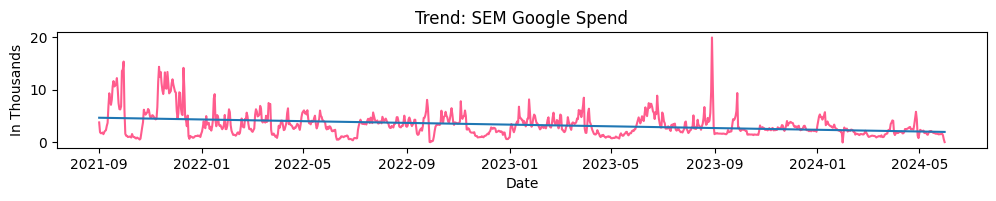

SEM_Google_Clicks


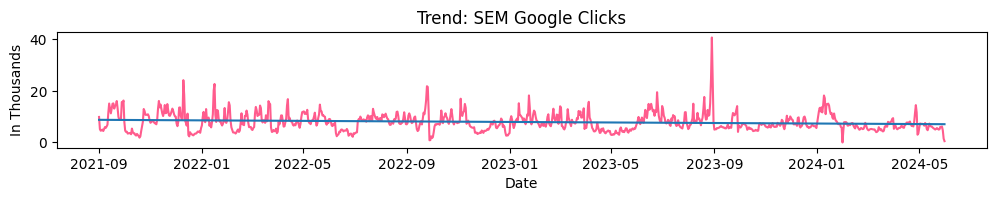

SEM_Google_Impressions


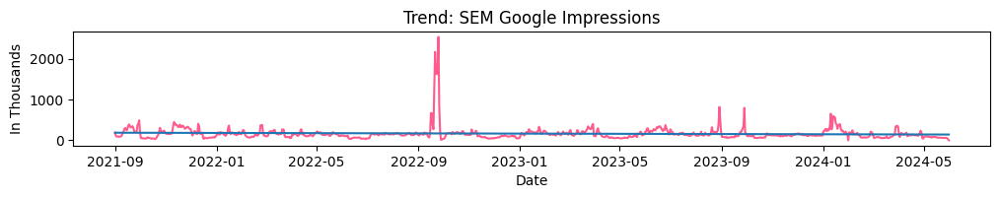

Preload_IronSource_Aura_Spend


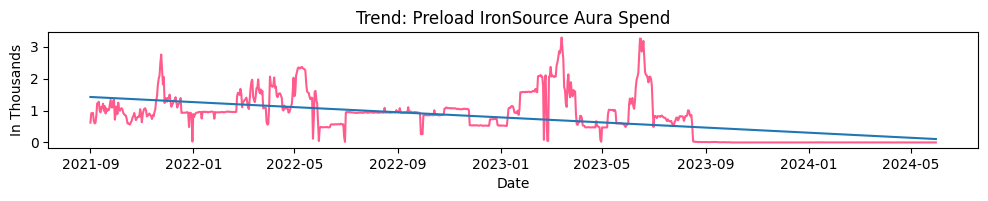

Preload_IronSource_Aura_launches


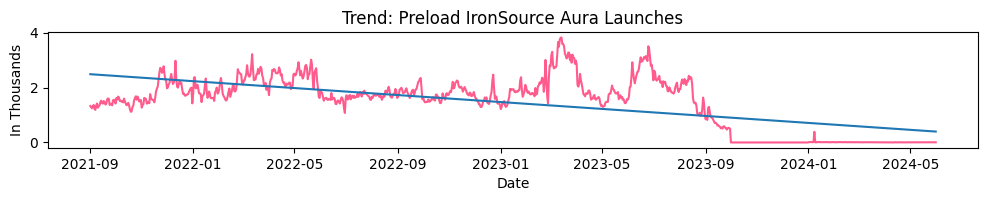

Preload_IronSource_Aura_impressions


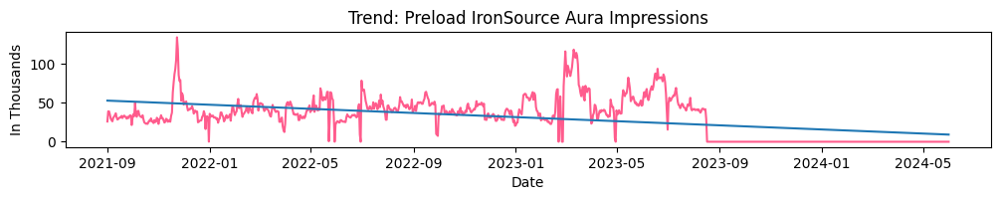

Preload_IronSource_Aura_app_downloads


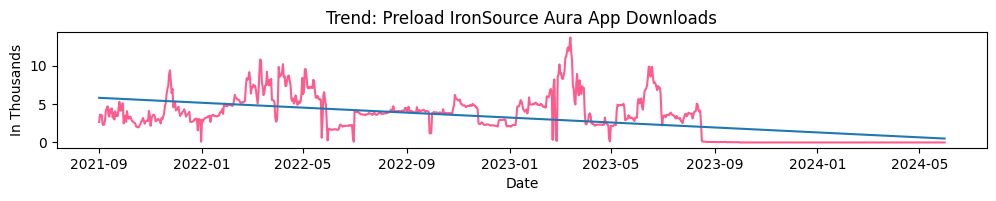

Programmatic_Bidease_Spend


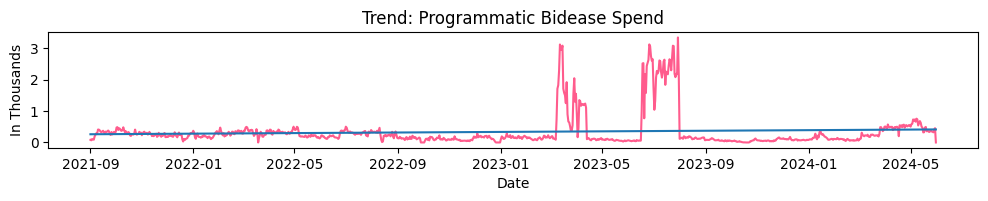

Programmatic_Bidease_Clicks


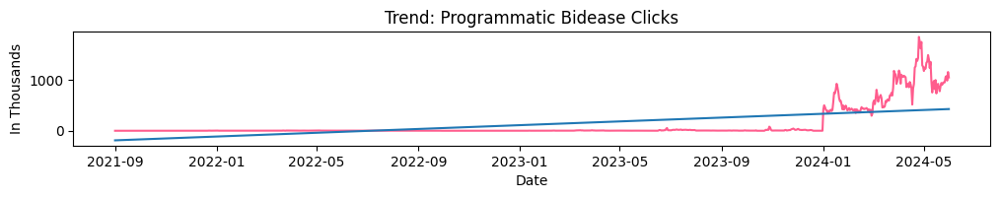

Programmatic_Bidease_Impressions


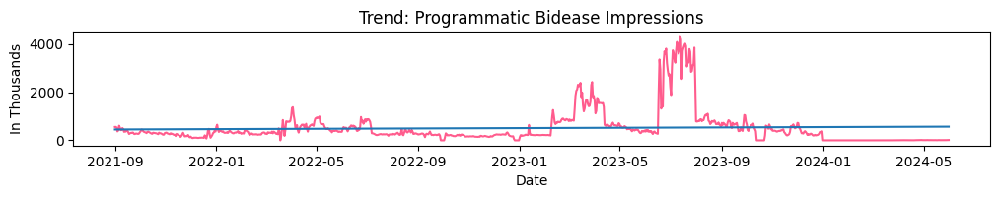

Preload_Digital_Turbine_Spend


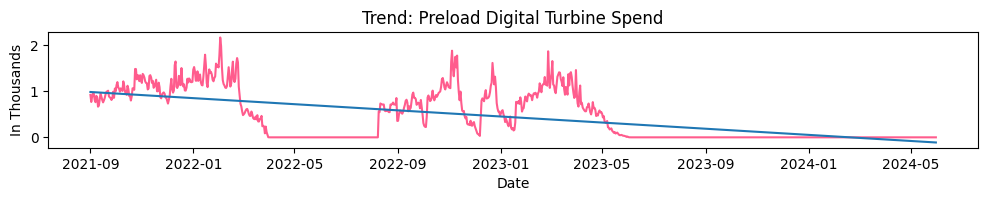

Preload_Digital_Turbine_launches


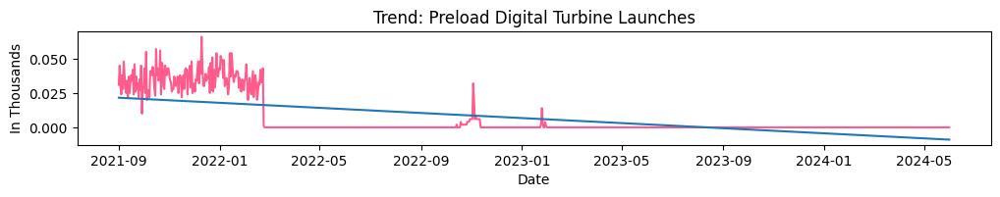

Preload_Digital_Turbine_impressions


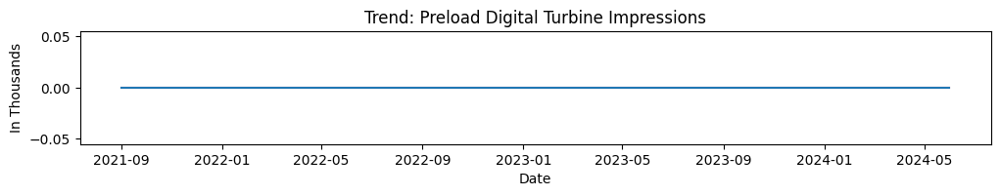

Preload_Digital_Turbine_app_downloads


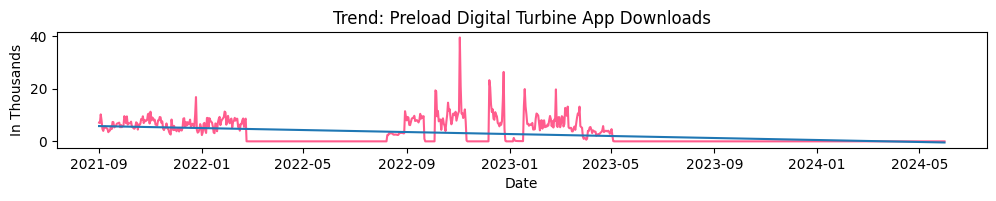

Programmatic_Tapjoy_Spend


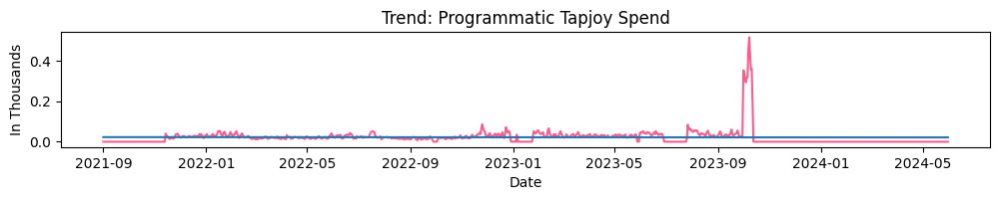

Programmatic_Tapjoy_Clicks


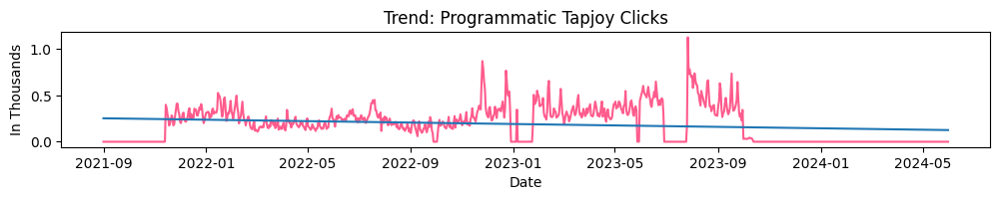

Programmatic_Tapjoy_Impressions


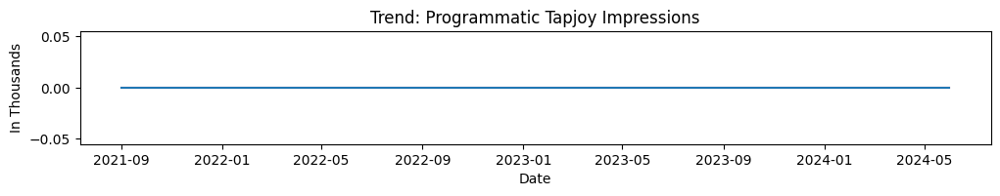

SEM_Apple_Search_Ads_Spend


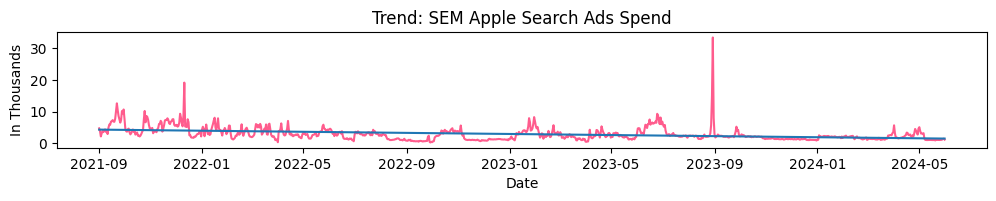

SEM_Apple_Search_Ads_Clicks


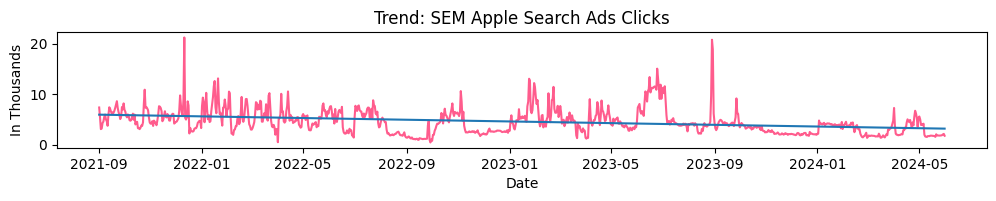

SEM_Apple_Search_Ads_Impressions


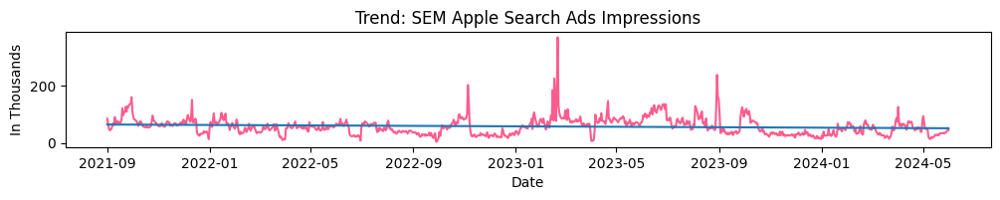

Programmatic_LiftOff_Spend


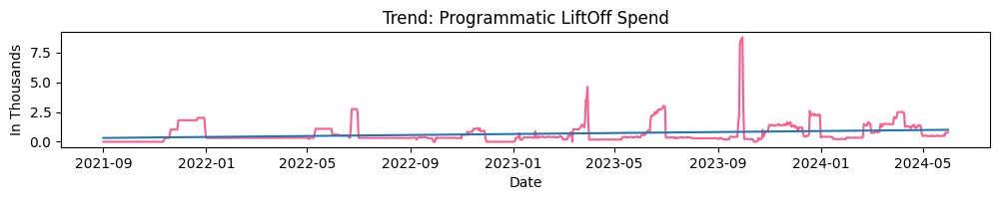

Programmatic_LiftOff_Clicks


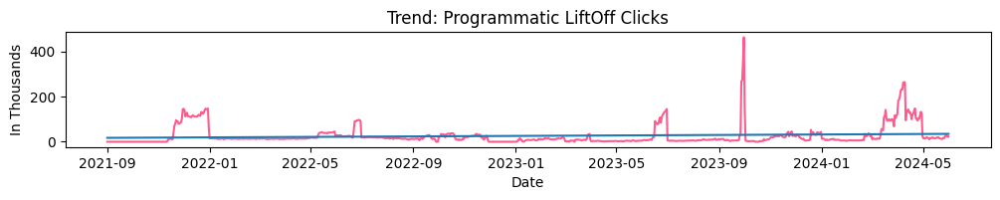

Programmatic_LiftOff_Impressions


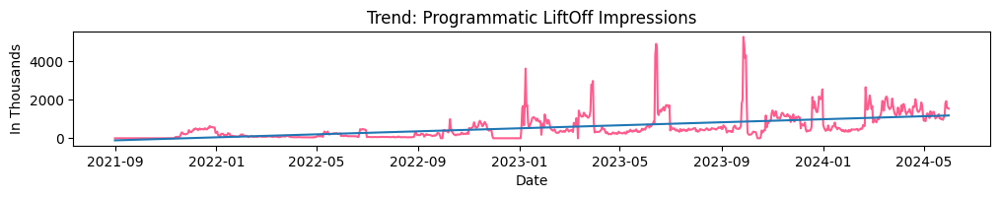

Programmatic_IronSource_Sonic_Spend


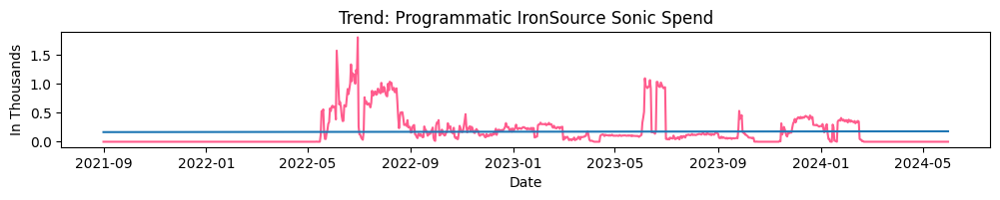

Programmatic_IronSource_Sonic_Clicks


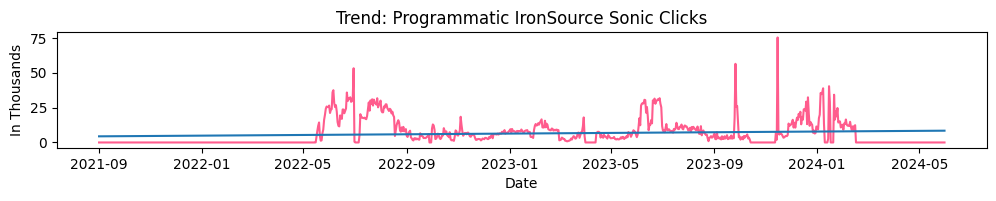

Programmatic_IronSource_Sonic_Impressions


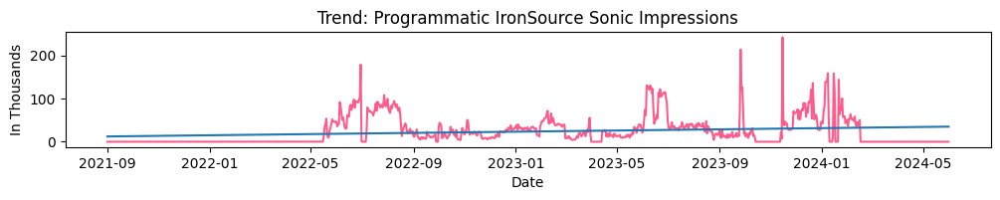

PaidSocial_Twitter_Spend


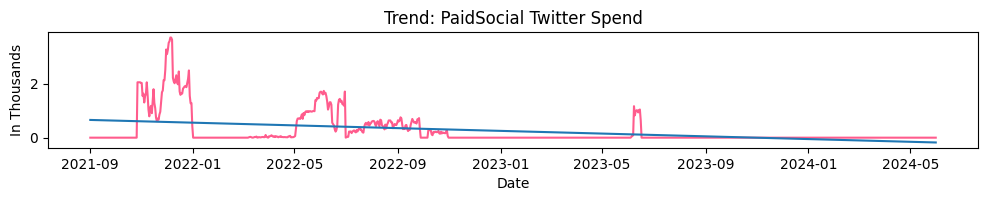

PaidSocial_Twitter_Clicks


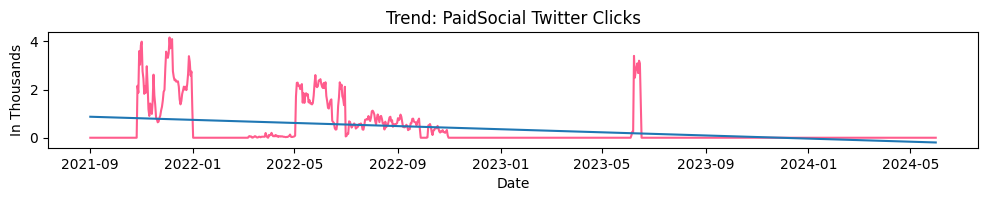

PaidSocial_Twitter_Impressions


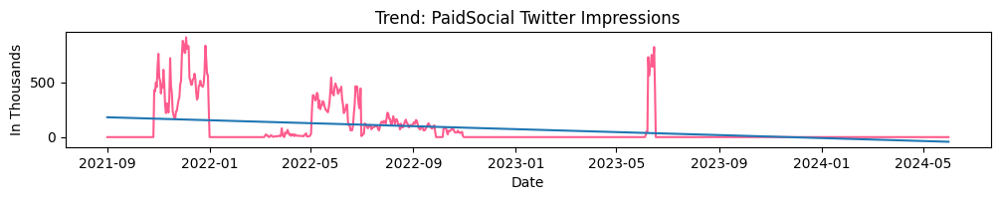

Programmatic_TikTok_Spend


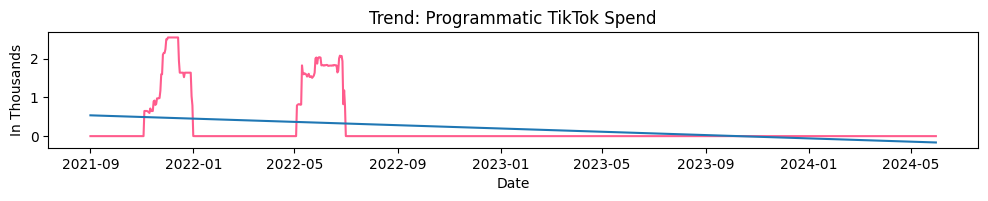

Programmatic_TikTok_Clicks


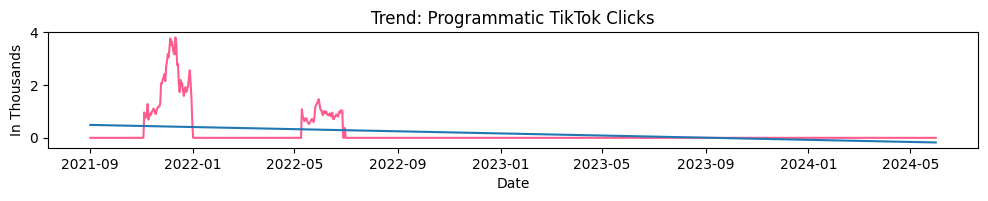

Programmatic_TikTok_Impressions


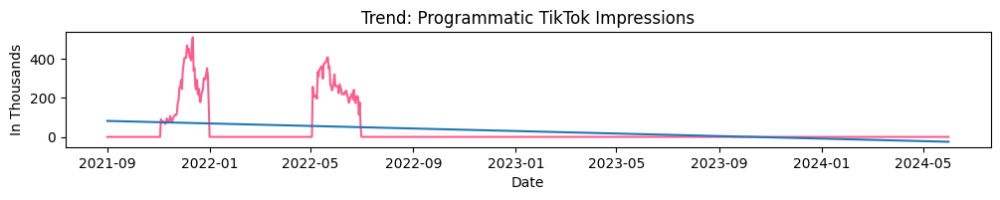

PaidSocial_Vibe_Spend


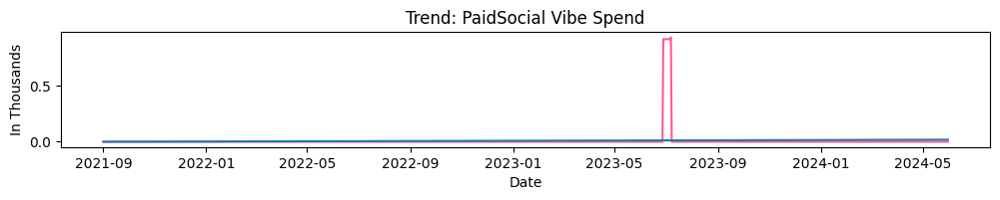

PaidSocial_Vibe_Clicks


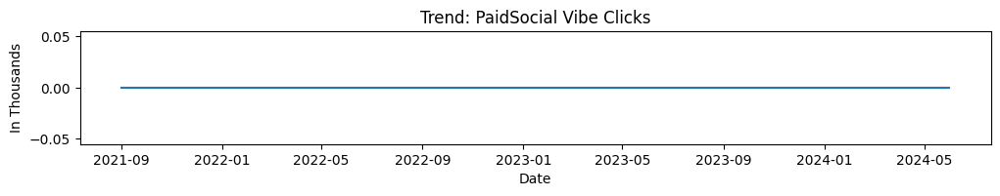

PaidSocial_Vibe_Impressions


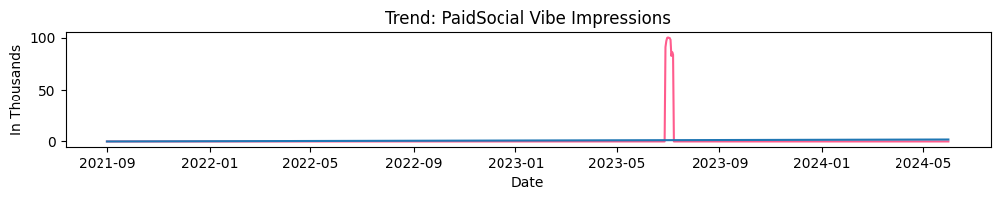

Programmatic_Persona.ly_Spend


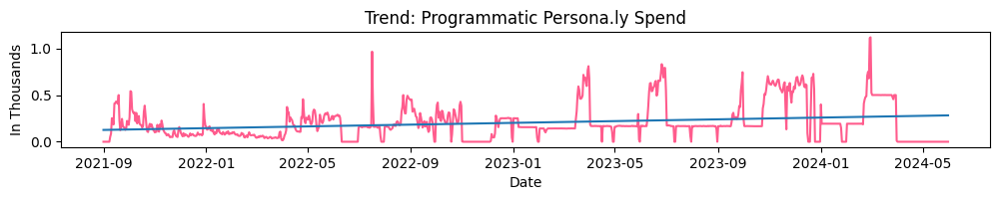

Programmatic_Persona.ly_Clicks


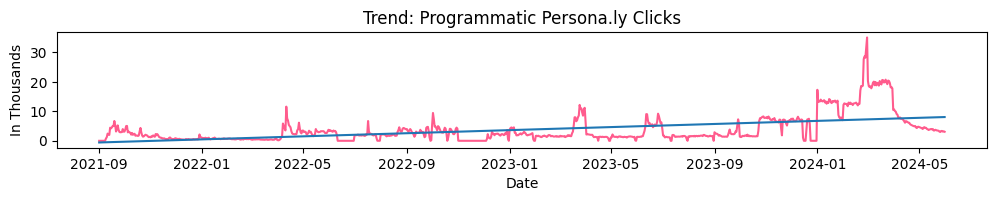

Programmatic_Persona.ly_Impressions


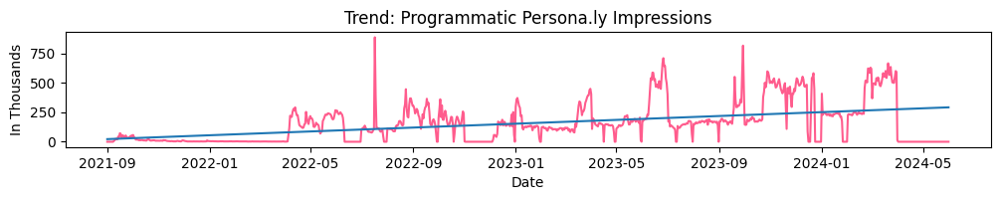

Twitter & TikTok Combined Spend


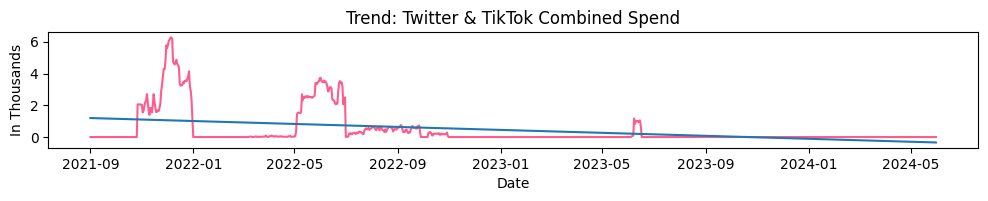

Twitter & TikTok Combined Clicks


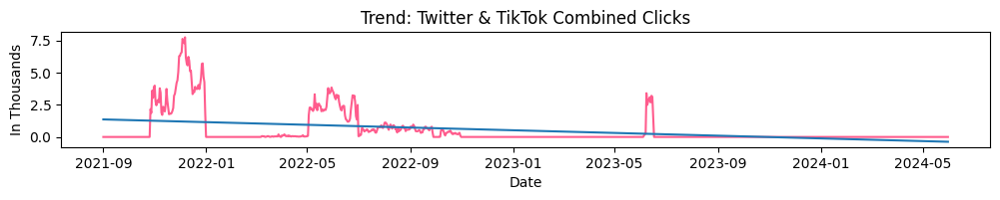

Twitter & TikTok Combined Impressions


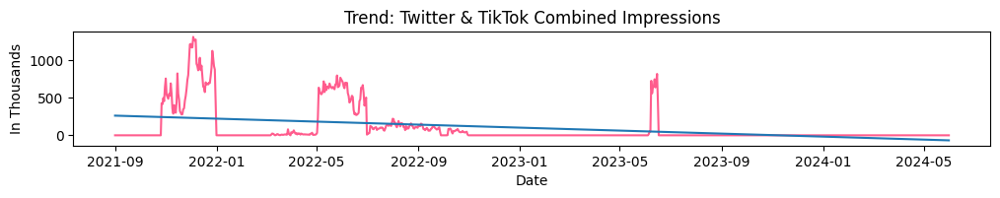

In [121]:
cols_to_plot = [
    'SEM_Google_Spend', 'SEM_Google_Clicks', 'SEM_Google_Impressions', 
    'Preload_IronSource_Aura_Spend', 'Preload_IronSource_Aura_launches', 
    'Preload_IronSource_Aura_impressions', 'Preload_IronSource_Aura_app_downloads', 
    'Programmatic_Bidease_Spend', 'Programmatic_Bidease_Clicks', 
    'Programmatic_Bidease_Impressions', 'Preload_Digital_Turbine_Spend', 
    'Preload_Digital_Turbine_launches', 'Preload_Digital_Turbine_impressions', 
    'Preload_Digital_Turbine_app_downloads', 'Programmatic_Tapjoy_Spend', 
    'Programmatic_Tapjoy_Clicks', 'Programmatic_Tapjoy_Impressions', 
    'SEM_Apple_Search_Ads_Spend', 'SEM_Apple_Search_Ads_Clicks', 
    'SEM_Apple_Search_Ads_Impressions', 'Programmatic_LiftOff_Spend', 
    'Programmatic_LiftOff_Clicks', 'Programmatic_LiftOff_Impressions', 
    'Programmatic_IronSource_Sonic_Spend', 'Programmatic_IronSource_Sonic_Clicks', 
    'Programmatic_IronSource_Sonic_Impressions', 'PaidSocial_Twitter_Spend', 
    'PaidSocial_Twitter_Clicks', 'PaidSocial_Twitter_Impressions', 
    'Programmatic_TikTok_Spend', 'Programmatic_TikTok_Clicks', 
    'Programmatic_TikTok_Impressions', 'PaidSocial_Vibe_Spend', 
    'PaidSocial_Vibe_Clicks', 'PaidSocial_Vibe_Impressions', 
    'Programmatic_Persona.ly_Spend', 'Programmatic_Persona.ly_Clicks', 
    'Programmatic_Persona.ly_Impressions', 'Twitter & TikTok Combined Spend', 
    'Twitter & TikTok Combined Clicks', 'Twitter & TikTok Combined Impressions'
]

# Titles for the plots (same length as cols_to_plot)
plot_titles = [
    'SEM Google Spend', 'SEM Google Clicks', 'SEM Google Impressions', 
    'Preload IronSource Aura Spend', 'Preload IronSource Aura Launches', 
    'Preload IronSource Aura Impressions', 'Preload IronSource Aura App Downloads', 
    'Programmatic Bidease Spend', 'Programmatic Bidease Clicks', 
    'Programmatic Bidease Impressions', 'Preload Digital Turbine Spend', 
    'Preload Digital Turbine Launches', 'Preload Digital Turbine Impressions', 
    'Preload Digital Turbine App Downloads', 'Programmatic Tapjoy Spend', 
    'Programmatic Tapjoy Clicks', 'Programmatic Tapjoy Impressions', 
    'SEM Apple Search Ads Spend', 'SEM Apple Search Ads Clicks', 
    'SEM Apple Search Ads Impressions', 'Programmatic LiftOff Spend', 
    'Programmatic LiftOff Clicks', 'Programmatic LiftOff Impressions', 
    'Programmatic IronSource Sonic Spend', 'Programmatic IronSource Sonic Clicks', 
    'Programmatic IronSource Sonic Impressions', 'PaidSocial Twitter Spend', 
    'PaidSocial Twitter Clicks', 'PaidSocial Twitter Impressions', 
    'Programmatic TikTok Spend', 'Programmatic TikTok Clicks', 
    'Programmatic TikTok Impressions', 'PaidSocial Vibe Spend', 
    'PaidSocial Vibe Clicks', 'PaidSocial Vibe Impressions', 
    'Programmatic Persona.ly Spend', 'Programmatic Persona.ly Clicks', 
    'Programmatic Persona.ly Impressions', 'Twitter & TikTok Combined Spend', 
    'Twitter & TikTok Combined Clicks', 'Twitter & TikTok Combined Impressions'
]


# Call the trend_chart_2 function with the DataFrame and the list of columns
trend_chart_2(df_useracq, cols_to_plot, plot_titles, 'Date')


SEM_Google_Impressions


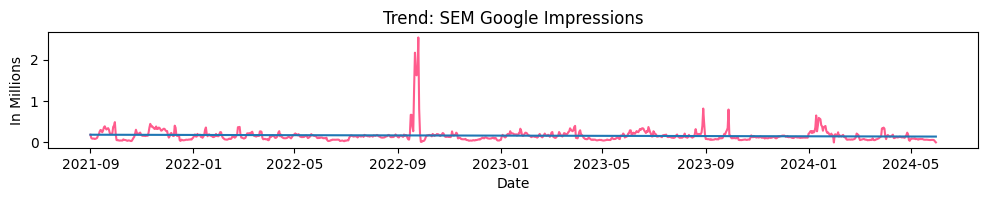

Programmatic_Bidease_Clicks


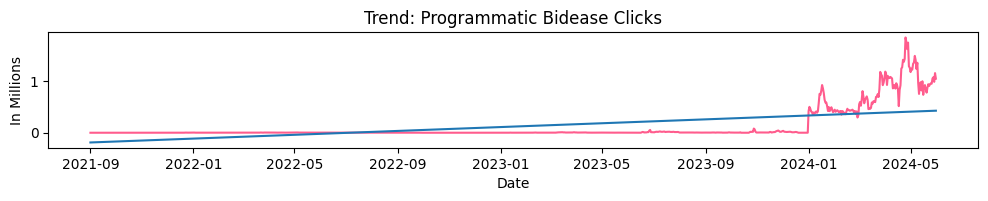

Programmatic_Bidease_Impressions


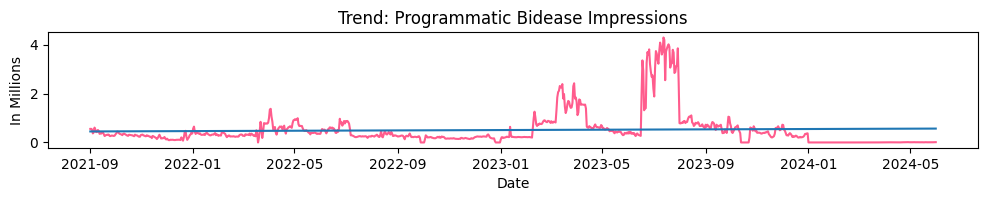

Programmatic_LiftOff_Impressions


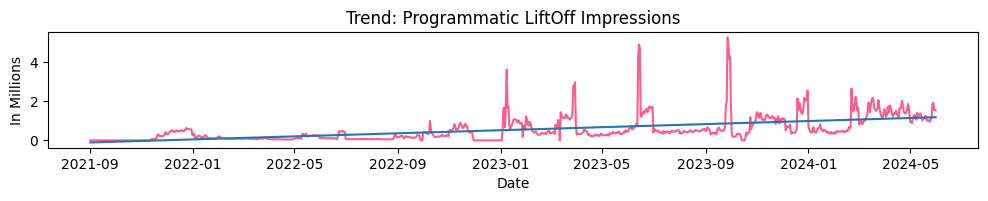

Twitter & TikTok Combined Impressions


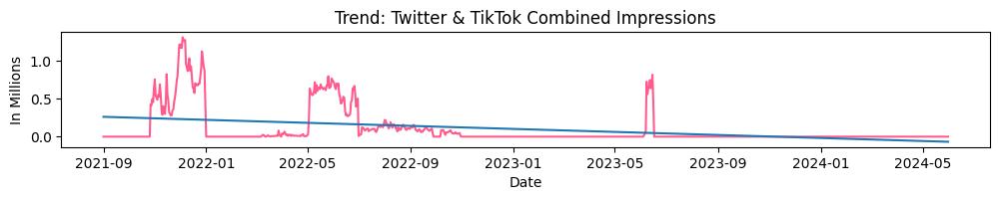

In [240]:
cols_to_plot = [
    'SEM_Google_Impressions', 
    'Programmatic_Bidease_Clicks', 
    'Programmatic_Bidease_Impressions', 
    'Programmatic_LiftOff_Impressions', 
    'Twitter & TikTok Combined Impressions'
]

# Titles for the plots (same length as cols_to_plot)
plot_titles = [
    'SEM Google Impressions', 
    'Programmatic Bidease Clicks', 
    'Programmatic Bidease Impressions', 
    'Programmatic LiftOff Impressions', 
    'Twitter & TikTok Combined Impressions'
]


# Call the trend_chart_2 function with the DataFrame and the list of columns
trend_chart_2(df_useracq, cols_to_plot, plot_titles, 'Date')


In [196]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
import pandas as pd
import numpy as np

def millions_formatter(x, pos):
    return f'{x / 1e6:.0f}'

def thousands_formatter(x, pos):
    return f'{x / 1e3:,.0f}'

def trend_chart_2(df_, cols, chart_title, date_var):
    df_['Date'] = pd.to_datetime(df_['Date'])
    df_=df_.sort_values(by='Date')
    temp=df_.copy()
    min_date = temp[date_var].min()
    max_date = temp[date_var].max()
    date_range = pd.date_range(start=min_date, end=max_date, freq='D')
    df_temp_flag = pd.DataFrame({'Date':date_range})
    df_=pd.merge(df_,df_temp_flag,on='Date',how='outer')
    for idx, var in  enumerate(cols):
        print(var)
        df_=df_.fillna(0).reset_index(drop=True)
        plt.figure(figsize=(12, 1.5))
        var_ = var+"_"
        df_[var_] = [val / 1e3 for val in df_[var]]
        df_=df_.sort_values(by='Date')
        sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)
#         sns.regplot(data=df_, x=date_var, y=var, color='#ff5c8d', scatter_kws={'s': 100})
        y = [val / 1e3 for val in df_[var]]
#         y = [val / 1e6 for val in var]
        x = np.arange(len(df_.index))  # Use numerical index as x for regression calculation
#        y = df_[var]
#        print(x)
#        print(y)
        m, b = np.polyfit(x, y, 1)
        plt.plot(df_['Date'], m*x + b)
        pd.DataFrame(df_['Date'], m*x + b).to_clipboard()
        plt.title('Trend: '+chart_title[idx])
        plt.xlabel(date_var)
        plt.ylabel("In Thousands")
        plt.grid(False)
        plt.show()

In [181]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

def trend_chart_2(df_, cols, chart_title, date_var):
    df_['Date'] = pd.to_datetime(df_['Date'])
    df_ = df_.sort_values(by='Date')
    
    temp = df_.copy()
    min_date = temp[date_var].min()
    max_date = temp[date_var].max()
    date_range = pd.date_range(start=min_date, end=max_date, freq='D')
    df_temp_flag = pd.DataFrame({'Date': date_range})
    df_ = pd.merge(df_, df_temp_flag, on='Date', how='outer')
    
    for idx, var in enumerate(cols):
        plt.figure(figsize=(12, 1.5))  # Adjust figsize for a better visual
        
        sns.lineplot(data=df_, x=date_var, y=var, color='#ff5c8d', ci=None)
        sns.regplot(data=df_, x=date_var, y=var, scatter=False, color='#ff5c8d')
        
        plt.title('Trend: ' + chart_title[idx])
        plt.xlabel(date_var)
        plt.ylabel("Value")
        plt.grid(False)
        plt.show()


In [197]:
df_influ = pd.read_excel("C:\\Users\\DeepakArun\\Desktop\\Influencer data.xlsx")

In [198]:
df_influ = df_influ.fillna(0)

In [249]:
df_influ.to_clipboard()

Spend


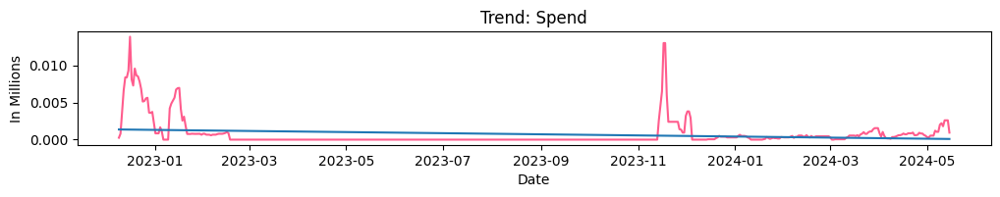

Daily Imp


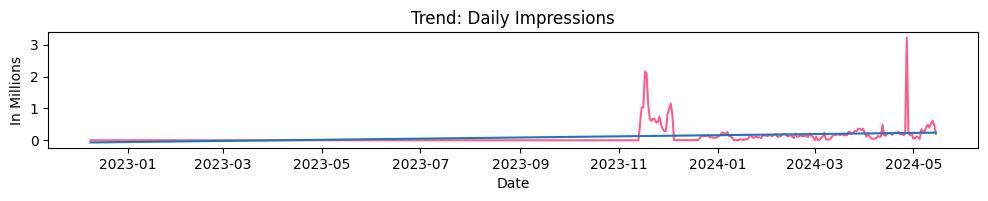

In [239]:
cols_to_plot = [
    'Spend','Daily Imp'
]

# Titles for the plots (same length as cols_to_plot)
plot_titles = [
    'Spend','Daily Impressions'
]


# Call the trend_chart_2 function with the DataFrame and the list of columns
trend_chart_2(df_influ, cols_to_plot, plot_titles, 'Date')


In [247]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
import pandas as pd
import numpy as np

def millions_formatter(x, pos):
    return f'{x / 1e6:.0f}'

def thousands_formatter(x, pos):
    return f'{x / 1e3:,.0f}'

def trend_chart_2(df_, cols, chart_title, date_var):
    df_['Date'] = pd.to_datetime(df_['Date'])
    df_=df_.sort_values(by='Date')
    temp=df_.copy()
    min_date = temp[date_var].min()
    max_date = temp[date_var].max()
    date_range = pd.date_range(start=min_date, end=max_date, freq='D')
    df_temp_flag = pd.DataFrame({'Date':date_range})
    df_=pd.merge(df_,df_temp_flag,on='Date',how='outer')
    for idx, var in  enumerate(cols):
        print(var)
        df_=df_.fillna(0).reset_index(drop=True)
        plt.figure(figsize=(12, 1.5))
        var_ = var+"_"
        df_[var_] = [val / 1e3 for val in df_[var]]
        df_=df_.sort_values(by='Date')
        sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)
#         sns.regplot(data=df_, x=date_var, y=var, color='#ff5c8d', scatter_kws={'s': 100})
        y = [val / 1e3 for val in df_[var]]
#         y = [val / 1e6 for val in var]
        x = np.arange(len(df_.index))  # Use numerical index as x for regression calculation
#        y = df_[var]
#        print(x)
#        print(y)
        m, b = np.polyfit(x, y, 1)
        plt.plot(df_['Date'], m*x + b)
        pd.DataFrame(df_['Date'], m*x + b).to_clipboard()
        plt.title('Trend: '+chart_title[idx])
        plt.xlabel(date_var)
        plt.ylabel("In Thousands")
        plt.grid(False)
        plt.show()

In [161]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
import pandas as pd
import numpy as np

def millions_formatter(x, pos):
    return f'{x / 1e6:.0f}M'  # Formats the number in millions with one decimal place

def trend_chart_2(df_, cols, chart_title, date_var):
    df_['Date'] = pd.to_datetime(df_['Date'])
    df_ = df_.sort_values(by='Date')
    
    temp = df_.copy()
    min_date = temp[date_var].min()
    max_date = temp[date_var].max()
    date_range = pd.date_range(start=min_date, end=max_date, freq='D')
    df_temp_flag = pd.DataFrame({'Date': date_range})
    df_ = pd.merge(df_, df_temp_flag, on='Date', how='outer')
    
    for idx, var in enumerate(cols):
        plt.figure(figsize=(12, 6))  # Adjust figsize for a better visual
        var_ = var + "_"
        df_[var_] = df_[var] / 1e6  # Convert data to millions
        
        sns.lineplot(data=df_, x=date_var, y=var_, color='#ff5c8d', ci=None)
        
        plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(millions_formatter))  # Format y-axis in millions
        
        plt.title('Trend: ' + chart_title[idx])
        plt.xlabel(date_var)
        plt.ylabel("In Millions")
        plt.grid(False)
        plt.show()


In [167]:
df_brand = pd.read_excel("C:\\Users\\DeepakArun\\Desktop\\Brand spend and impressions latest.xlsx")

In [168]:
df_brand = df_brand.fillna(0)

In [169]:
df_brand.columns

Index(['Date', 'Brand_Impressions', 'Brand_Spend'], dtype='object')

Brand_Impressions


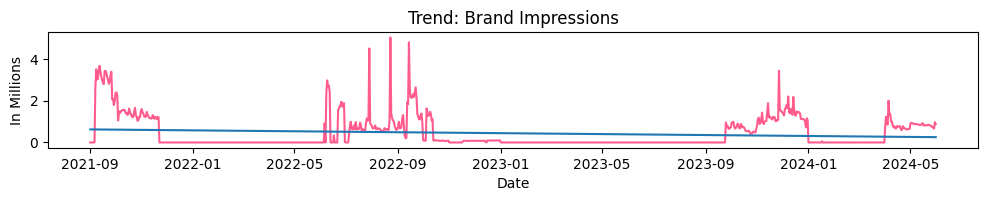

Brand_Spend


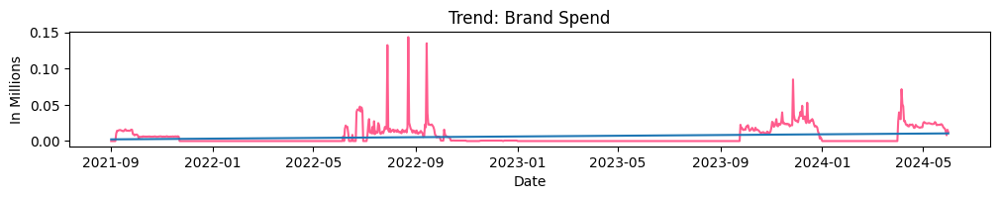

In [238]:
cols_to_plot = [
    'Brand_Impressions', 'Brand_Spend'
]

# Titles for the plots (same length as cols_to_plot)
plot_titles = [
    'Brand Impressions', 'Brand Spend'
]


# Call the trend_chart_2 function with the DataFrame and the list of columns
trend_chart_2(df_brand, cols_to_plot, plot_titles, 'Date')


In [208]:
df_organic = pd.read_excel("C:\\Users\\DeepakArun\\Desktop\\Organic google.xlsx")

In [209]:
df_organic = df_organic.fillna(0)

In [210]:
df_organic

,Date,Clicks,Impressions,CTR,Position
0,2022-06-18,1170413,13946440.0,0.0839,4.08
1,2022-06-19,1032753,12619736.0,0.0818,4.23
2,2022-06-20,1242471,14116111.0,0.0880,4.14
3,2022-06-21,1370173,15460041.0,0.0886,3.94
4,2022-06-22,1664328,17467173.0,0.0953,3.83
...,...,...,...,...,...
999,2022-06-13,1514761,0.0,0.0000,3.93
1000,2022-06-14,1311544,0.0,0.0000,3.93
1001,2022-06-15,1319363,0.0,0.0000,3.93
1002,2022-06-16,1424733,0.0,0.0000,3.93


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
import pandas as pd
import numpy as np

def millions_formatter(x, pos):
    return f'{x / 1e6:.0f}'

def thousands_formatter(x, pos):
    return f'{x / 1e3:,.0f}'

def trend_chart_2(df_, cols, chart_title, date_var):
    df_['Date'] = pd.to_datetime(df_['Date'])
    df_=df_.sort_values(by='Date')
    temp=df_.copy()
    min_date = temp[date_var].min()
    max_date = temp[date_var].max()
    date_range = pd.date_range(start=min_date, end=max_date, freq='D')
    df_temp_flag = pd.DataFrame({'Date':date_range})
    df_=pd.merge(df_,df_temp_flag,on='Date',how='outer')
    for idx, var in  enumerate(cols):
        print(var)
        df_=df_.fillna(0).reset_index(drop=True)
        plt.figure(figsize=(12, 1.5))
        var_ = var+"_"
        df_[var_] = [val / 1e6 for val in df_[var]]
        df_=df_.sort_values(by='Date')
        sns.lineplot(data= df_, x=date_var, y=var_, color='#ff5c8d',ci=None)
#         sns.regplot(data=df_, x=date_var, y=var, color='#ff5c8d', scatter_kws={'s': 100})
        y = [val / 1e6 for val in df_[var]]
#         y = [val / 1e6 for val in var]
        x = np.arange(len(df_.index))  # Use numerical index as x for regression calculation
#        y = df_[var]
#        print(x)
#        print(y)
        m, b = np.polyfit(x, y, 1)
        plt.plot(df_['Date'], m*x + b)
        pd.DataFrame(df_['Date'], m*x + b).to_clipboard()
        plt.title('Trend: '+chart_title[idx])
        plt.xlabel(date_var)
        plt.ylabel("In Millions")
        plt.grid(False)
        plt.show()

Clicks


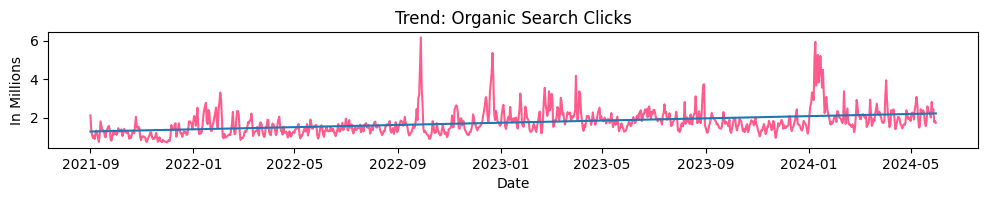

Position


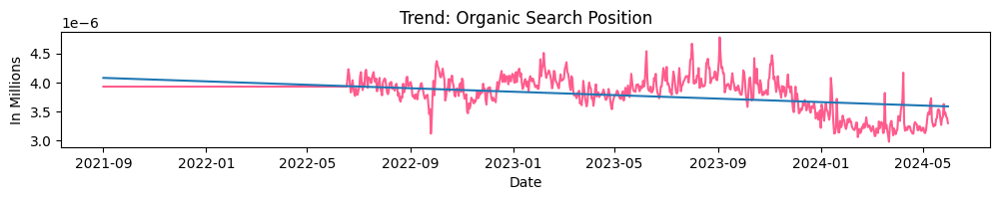

In [237]:
cols_to_plot = [
    'Clicks', 'Position'
]

# Titles for the plots (same length as cols_to_plot)
plot_titles = [
    'Organic Search Clicks', 'Organic Search Position'
]


# Call the trend_chart_2 function with the DataFrame and the list of columns
trend_chart_2(df_organic, cols_to_plot, plot_titles, 'Date')


In [242]:
df_soc = pd.read_excel("C:\\Users\\DeepakArun\\Desktop\\Social Media Latest.xlsx")

In [243]:
df_soc = df_soc.fillna(0)

In [245]:
df_soc.columns

Index(['Date', 'SocialEng_Facebook_Impressions',
       'SocialEng_Facebook_Total_Engagements',
       'SocialEng_Facebook_Estimated_Clicks', 'SocialEng_LinkedIn_Impressions',
       'SocialEng_LinkedIn_Total_Engagements',
       'SocialEng_LinkedIn_Estimated_Clicks', 'SocialEng_YouTube_Impressions',
       'SocialEng_YouTube_Estimated_Clicks', 'SocialEng_Instagram_Impressions',
       'SocialEng_Instagram_Total_Engagements',
       'SocialEng_Instagram_Estimated_Clicks', 'SocialEng_Twitter_Impressions',
       'SocialEng_Twitter_Total_Engagements',
       'SocialEng_Twitter_Estimated_Clicks', 'SocialEng_TikTok_Impressions',
       'SocialEng_TikTok_Total_Engagements'],
      dtype='object')

SocialEng_Facebook_Impressions


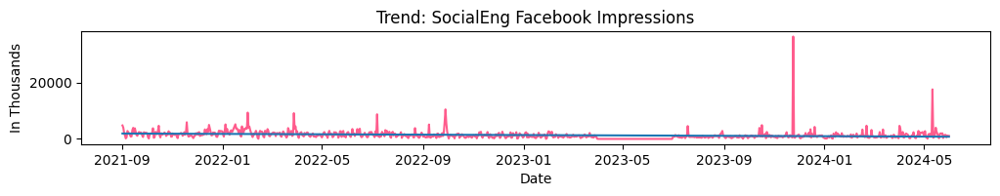

SocialEng_Facebook_Total_Engagements


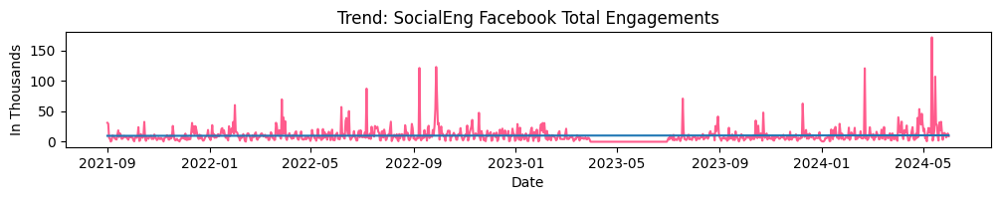

SocialEng_Facebook_Estimated_Clicks


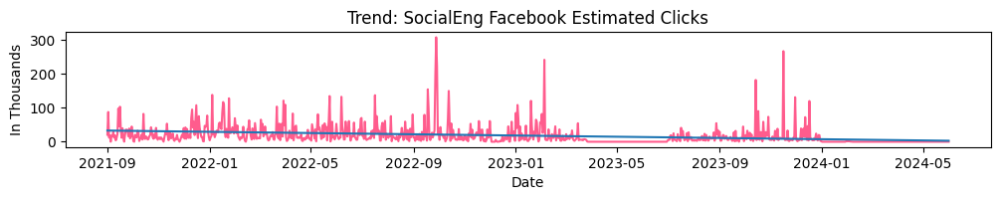

SocialEng_LinkedIn_Impressions


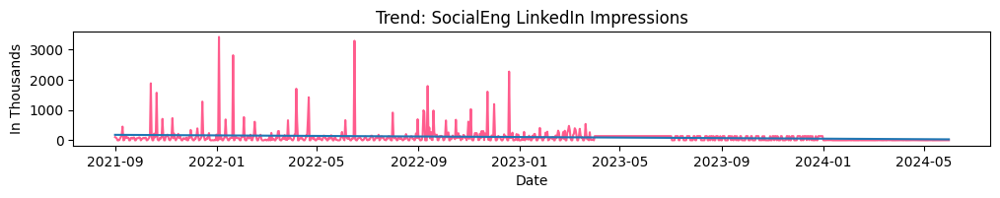

SocialEng_LinkedIn_Total_Engagements


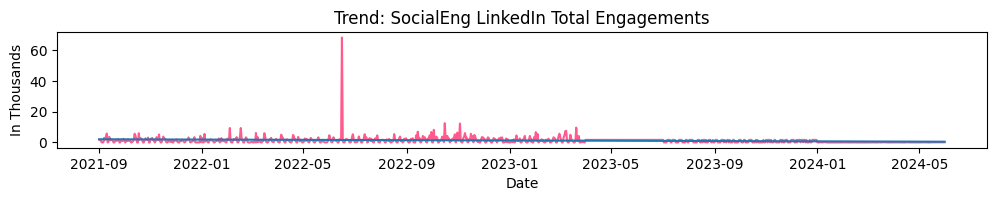

SocialEng_LinkedIn_Estimated_Clicks


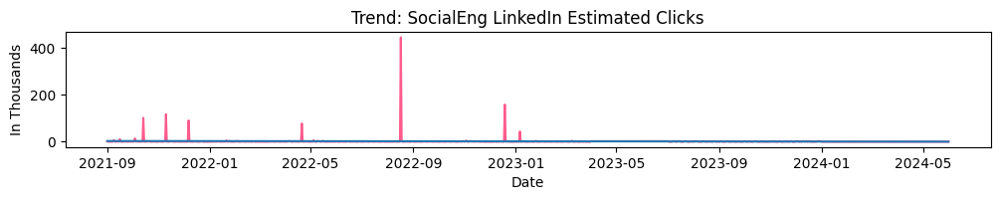

SocialEng_YouTube_Impressions


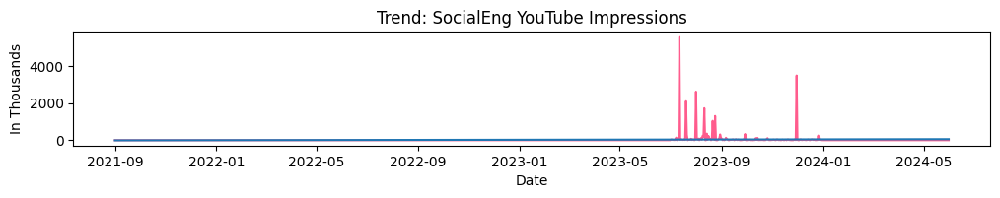

SocialEng_YouTube_Estimated_Clicks


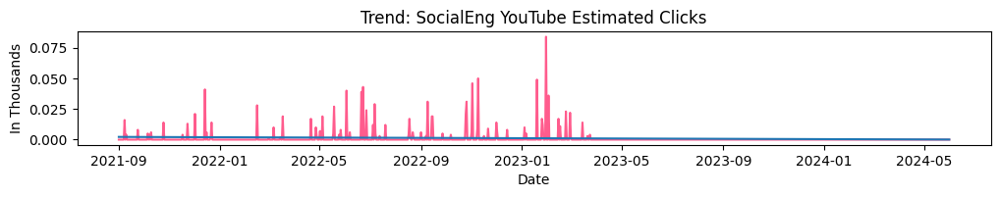

SocialEng_Instagram_Impressions


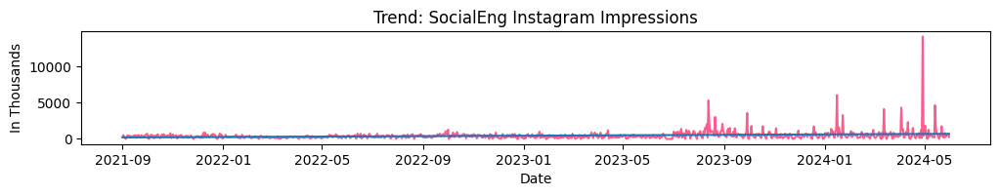

SocialEng_Instagram_Total_Engagements


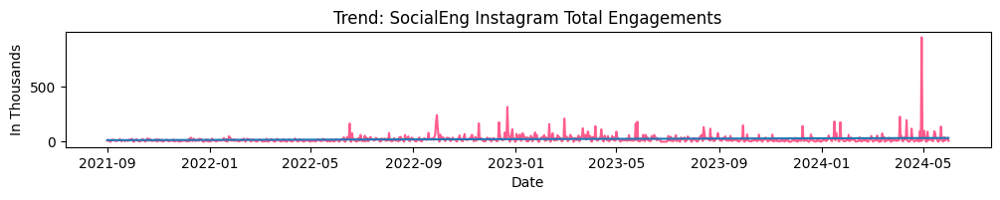

SocialEng_Instagram_Estimated_Clicks


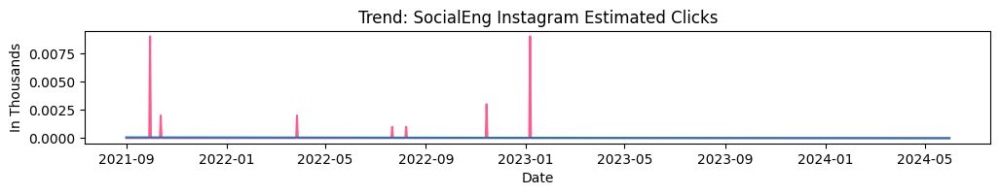

SocialEng_Twitter_Impressions


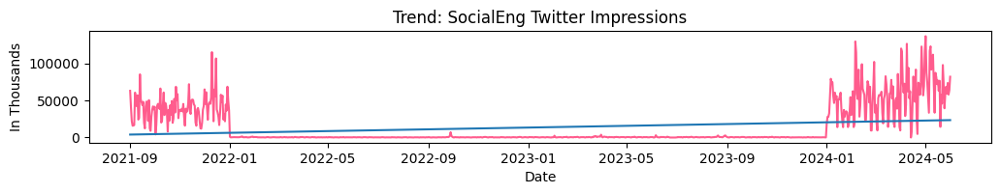

SocialEng_Twitter_Total_Engagements


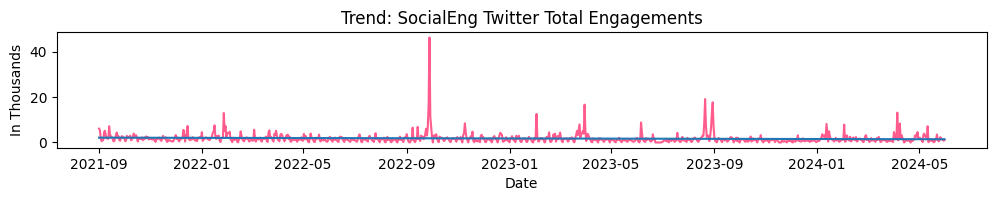

SocialEng_Twitter_Estimated_Clicks


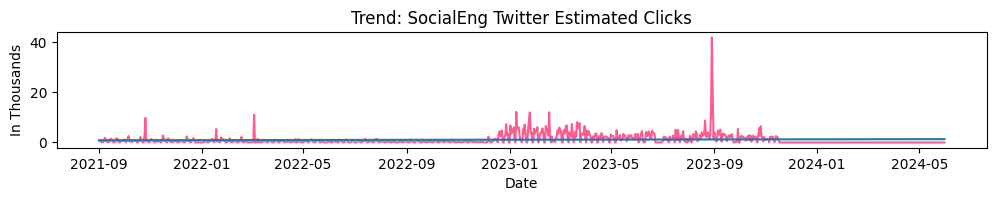

SocialEng_TikTok_Impressions


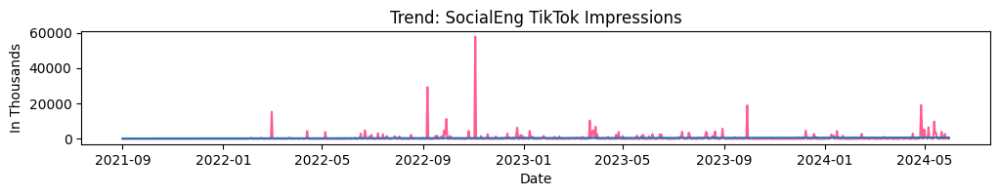

SocialEng_TikTok_Total_Engagements


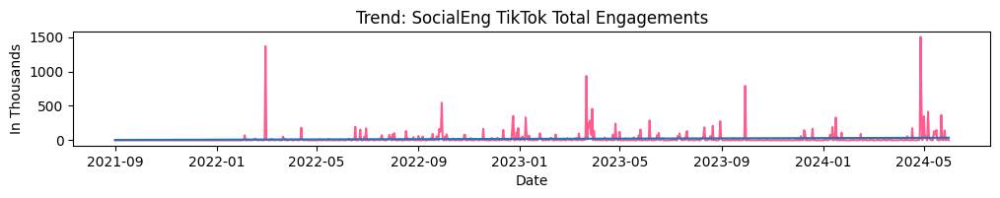

In [248]:
cols_to_plot = [
    'SocialEng_Facebook_Impressions',
       'SocialEng_Facebook_Total_Engagements',
       'SocialEng_Facebook_Estimated_Clicks', 'SocialEng_LinkedIn_Impressions',
       'SocialEng_LinkedIn_Total_Engagements',
       'SocialEng_LinkedIn_Estimated_Clicks', 'SocialEng_YouTube_Impressions',
       'SocialEng_YouTube_Estimated_Clicks', 'SocialEng_Instagram_Impressions',
       'SocialEng_Instagram_Total_Engagements',
       'SocialEng_Instagram_Estimated_Clicks', 'SocialEng_Twitter_Impressions',
       'SocialEng_Twitter_Total_Engagements',
       'SocialEng_Twitter_Estimated_Clicks', 'SocialEng_TikTok_Impressions',
       'SocialEng_TikTok_Total_Engagements'
]

# Titles for the plots (same length as cols_to_plot)
plot_titles = [
    'SocialEng Facebook Impressions',
       'SocialEng Facebook Total Engagements',
       'SocialEng Facebook Estimated Clicks', 'SocialEng LinkedIn Impressions',
       'SocialEng LinkedIn Total Engagements',
       'SocialEng LinkedIn Estimated Clicks', 'SocialEng YouTube Impressions',
       'SocialEng YouTube Estimated Clicks', 'SocialEng Instagram Impressions',
       'SocialEng Instagram Total Engagements',
       'SocialEng Instagram Estimated Clicks', 'SocialEng Twitter Impressions',
       'SocialEng Twitter Total Engagements',
       'SocialEng Twitter Estimated Clicks', 'SocialEng TikTok Impressions',
       'SocialEng TikTok Total Engagements'
]


# Call the trend_chart_2 function with the DataFrame and the list of columns
trend_chart_2(df_soc, cols_to_plot, plot_titles, 'Date')
